<a href="https://colab.research.google.com/github/R-Madhuram/DartmouthCapstone_CrudeOilPricePrediction/blob/main/notebooks/5_ScaleCast.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [ ]:
# install the scalecast library
!pip install scalecast

In [ ]:
import pandas as pd
import numpy as np
from scalecast.Forecaster import Forecaster
from scalecast.util import metrics
from scalecast.SeriesTransformer import SeriesTransformer
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import matplotlib

In [ ]:
# install the greykite library.
!pip install greykite

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.5/22.5 MB 59.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 kB 25.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 74.7 MB/s eta 0:00:00
  Created wheel for osqp: filename=osqp-0.6.1-cp39-cp39-linux_x86_64.whl size=209929 sha256=357f7afd483f1a6c6012b3bd3204d8347e8c77d2d9dab1dec0f97a182407cdbe
  Stored in directory: /root/.cache/pip/wheels/3d/34/b7/b8b2af435e6e6d4ce9c92611064e6c8589579bbf4148ea4d50
Successfully built osqp
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
  Attempting unin

In [ ]:
import greykite

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Load Data

In [ ]:
# load data
us_cushing = pd.read_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/data/USCushing.csv')
eu_brent = pd.read_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/data/EuropeanBrent.csv')


## Cushing Data

In [ ]:
# Read data 
us_cushing.head().append(us_cushing.tail())

,Date,"Cushing, OK WTI Spot Price FOB (Dollars per Barrel)"
0,"Jan 02, 1986",25.56
1,"Jan 03, 1986",26.00
2,"Jan 06, 1986",26.53
3,"Jan 07, 1986",25.85
4,"Jan 08, 1986",25.87
9357,"Feb 22, 2023",73.95
9358,"Feb 23, 2023",75.26
9359,"Feb 24, 2023",76.19
9360,"Feb 27, 2023",75.57
9361,NaN,NaN


## Brent Data

In [ ]:
# Read data 
eu_brent.head().append(eu_brent.tail())

,Date,Europe Brent Spot Price FOB (Dollars per Barrel)
0,"May 20, 1987",18.63
1,"May 21, 1987",18.45
2,"May 22, 1987",18.55
3,"May 25, 1987",18.60
4,"May 26, 1987",18.63
9077,"Feb 22, 2023",79.55
9078,"Feb 23, 2023",82.08
9079,"Feb 24, 2023",82.31
9080,"Feb 27, 2023",82.31
9081,NaN,NaN


# Modeling DATA

## Cushing Data

In [ ]:
# Convert the date to dateimte object 
us_cushing['Date'] = pd.to_datetime(us_cushing['Date'], format = '%b %d, %Y')

In [ ]:
# rename price column
us_cushing.rename(columns={'Cushing, OK WTI Spot Price FOB (Dollars per Barrel)':'price'},inplace=True)

In [ ]:
cushing_df = us_cushing

In [ ]:
# dropping the last NaN row in the dataframe
cushing_df = cushing_df[:-1]
cushing_df

,Date,price
0,1986-01-02,25.56
1,1986-01-03,26.00
2,1986-01-06,26.53
3,1986-01-07,25.85
4,1986-01-08,25.87
...,...,...
9356,2023-02-21,76.28
9357,2023-02-22,73.95
9358,2023-02-23,75.26
9359,2023-02-24,76.19


In [ ]:
# Change the index of the Df as date index
cushing_df = cushing_df.set_index('Date')

In [ ]:
cushing_df.index = pd.DatetimeIndex(cushing_df.index)
cushing_df

,price
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87
...,...
2023-02-21,76.28
2023-02-22,73.95
2023-02-23,75.26


In [ ]:
# split the available data as historical and future for computing forecast error 
cushing_y_hist = cushing_df.loc['1986':'2021','price'] 
cushing_y_future = cushing_df.loc['2022':, 'price']
cushing_y_hist, cushing_y_future

(Date
 1986-01-02    25.56
 1986-01-03    26.00
 1986-01-06    26.53
 1986-01-07    25.85
 1986-01-08    25.87
               ...  
 2021-12-27    75.49
 2021-12-28    76.01
 2021-12-29    76.58
 2021-12-30    76.83
 2021-12-31    75.33
 Name: price, Length: 9072, dtype: float64,
 Date
 2022-01-03    75.99
 2022-01-04    77.00
 2022-01-05    77.83
 2022-01-06    79.47
 2022-01-07    79.00
               ...  
 2023-02-21    76.28
 2023-02-22    73.95
 2023-02-23    75.26
 2023-02-24    76.19
 2023-02-27    75.57
 Name: price, Length: 289, dtype: float64)

In [ ]:
# setting cushing data frequency as business days "B"
cushing_df = cushing_df.asfreq('B')
cushing_df

,price
Date,
1986-01-02,25.56
1986-01-03,26.00
1986-01-06,26.53
1986-01-07,25.85
1986-01-08,25.87
...,...
2023-02-21,76.28
2023-02-22,73.95
2023-02-23,75.26


In [ ]:
cushing_data=cushing_df.squeeze()

In [ ]:
cushing_data

Date
1986-01-02    25.56
1986-01-03    26.00
1986-01-06    26.53
1986-01-07    25.85
1986-01-08    25.87
              ...  
2023-02-21    76.28
2023-02-22    73.95
2023-02-23    75.26
2023-02-24    76.19
2023-02-27    75.57
Freq: B, Name: price, Length: 9693, dtype: float64

In [ ]:
cushing_data.index

DatetimeIndex(['1986-01-02', '1986-01-03', '1986-01-06', '1986-01-07',
               '1986-01-08', '1986-01-09', '1986-01-10', '1986-01-13',
               '1986-01-14', '1986-01-15',
               ...
               '2023-02-14', '2023-02-15', '2023-02-16', '2023-02-17',
               '2023-02-20', '2023-02-21', '2023-02-22', '2023-02-23',
               '2023-02-24', '2023-02-27'],
              dtype='datetime64[ns]', name='Date', length=9693, freq='B')

### 1) Basic Model

In [ ]:
# initialize the forecaster for the cushing data set
f = Forecaster(y = cushing_data,current_dates = cushing_data.index,
               future_dates = 289,test_length = 289,cis = True,metrics = ['rmse'])
for i in np.arange(6, 289, 3): 
  f.add_cycle(i)
f

Forecaster(
    DateStartActuals=1987-04-13T00:00:00.000000000
    DateEndActuals=2023-02-27T00:00:00.000000000
    Freq=B
    N_actuals=9361
    ForecastLength=289
    Xvars=['cycle6sin', 'cycle6cos', 'cycle9sin', 'cycle9cos', 'cycle12sin', 'cycle12cos', 'cycle15sin', 'cycle15cos', 'cycle18sin', 'cycle18cos', 'cycle21sin', 'cycle21cos', 'cycle24sin', 'cycle24cos', 'cycle27sin', 'cycle27cos', 'cycle30sin', 'cycle30cos', 'cycle33sin', 'cycle33cos', 'cycle36sin', 'cycle36cos', 'cycle39sin', 'cycle39cos', 'cycle42sin', 'cycle42cos', 'cycle45sin', 'cycle45cos', 'cycle48sin', 'cycle48cos', 'cycle51sin', 'cycle51cos', 'cycle54sin', 'cycle54cos', 'cycle57sin', 'cycle57cos', 'cycle60sin', 'cycle60cos', 'cycle63sin', 'cycle63cos', 'cycle66sin', 'cycle66cos', 'cycle69sin', 'cycle69cos', 'cycle72sin', 'cycle72cos', 'cycle75sin', 'cycle75cos', 'cycle78sin', 'cycle78cos', 'cycle81sin', 'cycle81cos', 'cycle84sin', 'cycle84cos', 'cycle87sin', 'cycle87cos', 'cycle90sin', 'cycle90cos', 'cycle93sin', 'c

In [ ]:
# set the estimator type to be naive and run the manual forecast
f.set_estimator('naive')
f.manual_forecast()

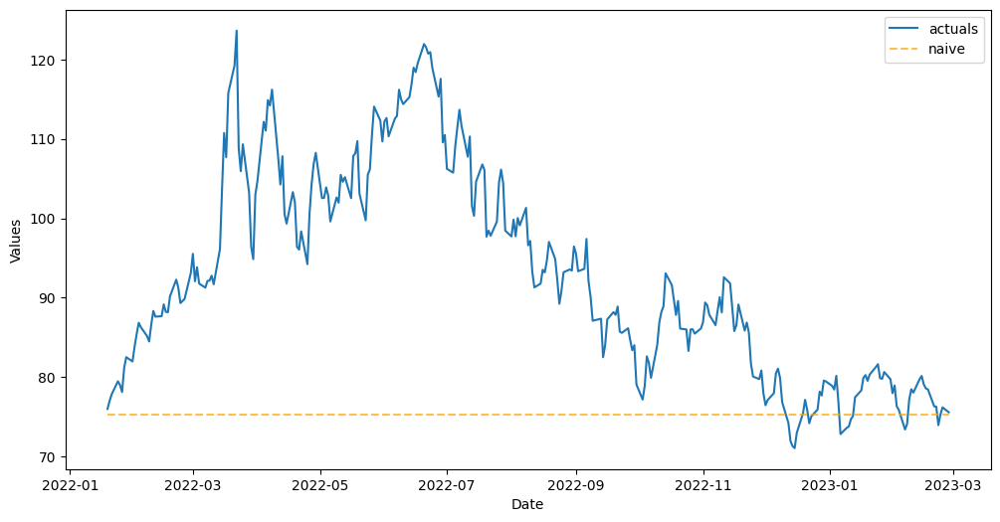

In [ ]:
# plot the test set actual data and predictions using the naive method.
f.plot_test_set(
    models=[
        "naive",
    ],
    include_train=False,
)
plt.show()

In [ ]:
# cross validate the data using the grid below. setting the grid to run the cross validation
grid = {
    "seasonal": [False,True],
    "m": [24, 12],
}
f.ingest_grid(grid)

In [ ]:
f.cross_validate(k=389,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)

Num hyperparams to try for the naive model: 4.
Fold 0: Train size: 506 (2020-01-10 00:00:00 - 2021-12-17 00:00:00). Test Size: 22 (2021-12-20 00:00:00 - 2022-01-18 00:00:00). 
Fold 1: Train size: 506 (2019-12-11 00:00:00 - 2021-11-17 00:00:00). Test Size: 22 (2021-11-18 00:00:00 - 2021-12-17 00:00:00). 
Fold 2: Train size: 506 (2019-11-11 00:00:00 - 2021-10-18 00:00:00). Test Size: 22 (2021-10-19 00:00:00 - 2021-11-17 00:00:00). 
Fold 3: Train size: 506 (2019-10-10 00:00:00 - 2021-09-16 00:00:00). Test Size: 22 (2021-09-17 00:00:00 - 2021-10-18 00:00:00). 
Fold 4: Train size: 506 (2019-09-10 00:00:00 - 2021-08-17 00:00:00). Test Size: 22 (2021-08-18 00:00:00 - 2021-09-16 00:00:00). 
Fold 5: Train size: 506 (2019-08-09 00:00:00 - 2021-07-16 00:00:00). Test Size: 22 (2021-07-19 00:00:00 - 2021-08-17 00:00:00). 
Fold 6: Train size: 506 (2019-07-10 00:00:00 - 2021-06-16 00:00:00). Test Size: 22 (2021-06-17 00:00:00 - 2021-07-16 00:00:00). 
Fold 7: Train size: 506 (2019-06-10 00:00:00 - 202

In [ ]:
# using auto forecast and the best parameters obtained from the grid search run the forecasting
f.auto_forecast(call_me="naive_cv")

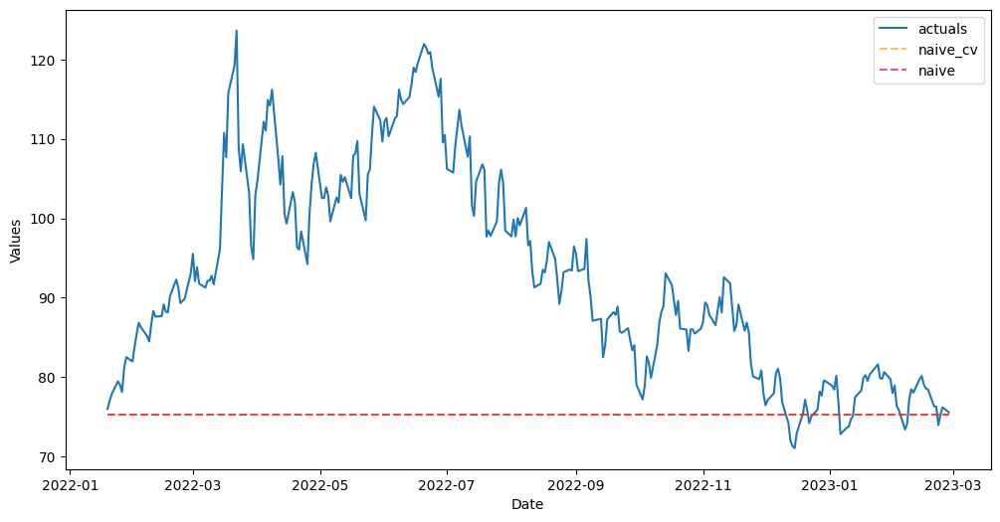

In [ ]:
# plot the cross validated forecast against standard forecast
f.plot_test_set(
    models=[
        "naive_cv",
        "naive",
    ],
    include_train=False,
)
plt.show()

### 2) GBT

In [ ]:
# set the estimator to gradient boosted trees and run manual forecast
f.set_estimator('gbt')
f.manual_forecast()

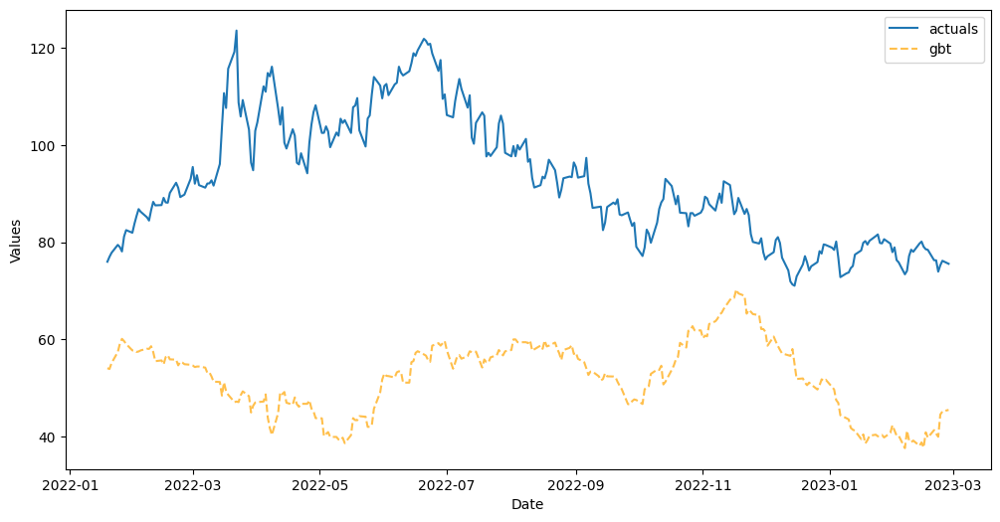

In [ ]:
# plot the test set actual data and predictions using the gradient boosted tree.
f.plot_test_set(
    models=[
        "gbt",
    ],
    include_train=False,
)
plt.show()

In [ ]:
# cross validate the gradient boosted tree using the grid below. setting the grid to run the cross validation
grid = {
    "max_depth": [2],
    "subsample": [0.8],
}
f.ingest_grid(grid)

In [ ]:
f.cross_validate(k=389,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f.auto_forecast(call_me="gbt_cv")

Num hyperparams to try for the gbt model: 1.
Fold 0: Train size: 506 (2020-01-10 00:00:00 - 2021-12-17 00:00:00). Test Size: 22 (2021-12-20 00:00:00 - 2022-01-18 00:00:00). 
Fold 1: Train size: 506 (2019-12-11 00:00:00 - 2021-11-17 00:00:00). Test Size: 22 (2021-11-18 00:00:00 - 2021-12-17 00:00:00). 
Fold 2: Train size: 506 (2019-11-11 00:00:00 - 2021-10-18 00:00:00). Test Size: 22 (2021-10-19 00:00:00 - 2021-11-17 00:00:00). 
Fold 3: Train size: 506 (2019-10-10 00:00:00 - 2021-09-16 00:00:00). Test Size: 22 (2021-09-17 00:00:00 - 2021-10-18 00:00:00). 
Fold 4: Train size: 506 (2019-09-10 00:00:00 - 2021-08-17 00:00:00). Test Size: 22 (2021-08-18 00:00:00 - 2021-09-16 00:00:00). 
Fold 5: Train size: 506 (2019-08-09 00:00:00 - 2021-07-16 00:00:00). Test Size: 22 (2021-07-19 00:00:00 - 2021-08-17 00:00:00). 
Fold 6: Train size: 506 (2019-07-10 00:00:00 - 2021-06-16 00:00:00). Test Size: 22 (2021-06-17 00:00:00 - 2021-07-16 00:00:00). 
Fold 7: Train size: 506 (2019-06-10 00:00:00 - 2021-

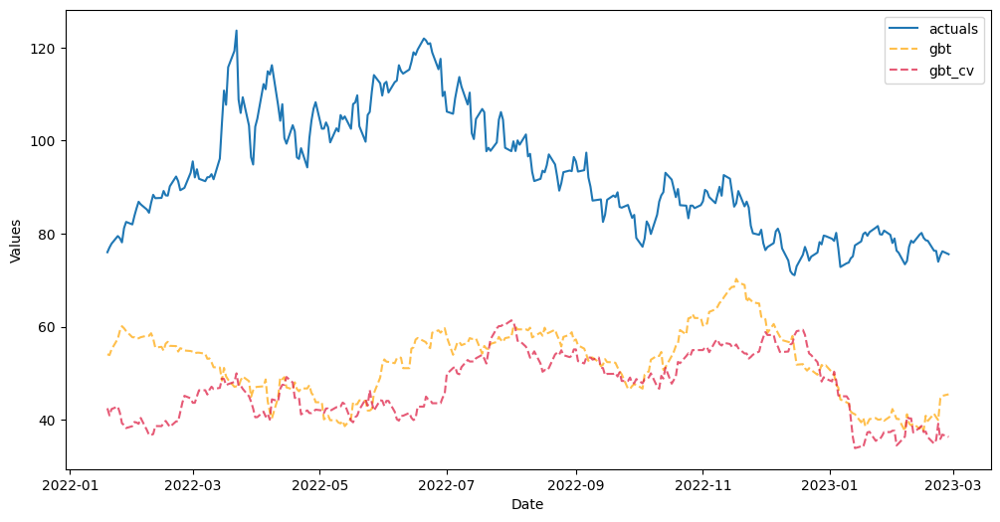

In [ ]:
# plot the cross validated forecast against standard forecast
f.plot_test_set(
    models=[
        "gbt",
        "gbt_cv",
    ],
    include_train=False,
)
plt.show()

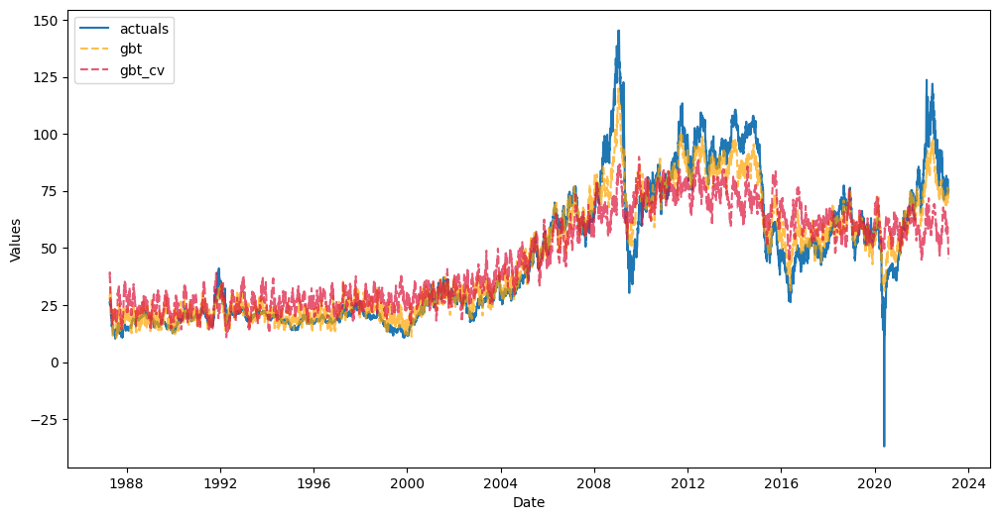

In [ ]:
f.plot_fitted(
    models=[
        "gbt",
        "gbt_cv",
    ],
)
plt.show()

### 3) light gbm

In [ ]:
# set the estimator to light gradient boosting and run manual forecast
f.set_estimator('lightgbm')
f.manual_forecast()

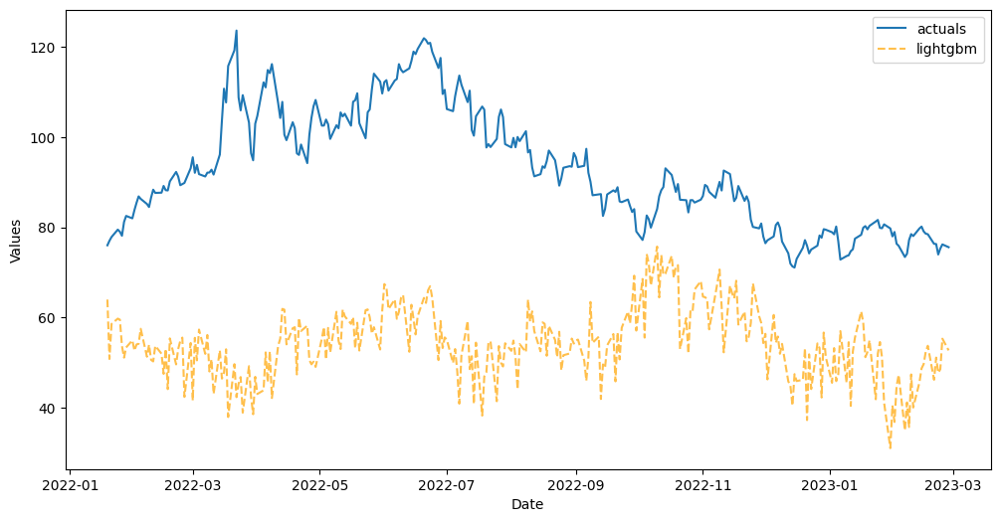

In [ ]:
# plot the test set actuals against the forecasted
f.plot_test_set(
    models=[
        "lightgbm",
    ],
    include_train=False,
)
plt.show()

In [ ]:
grid = {
    "max_depth": [2,4],
    "subsample": [0.8,1],
}
f.ingest_grid(grid)

In [ ]:
f.cross_validate(k=389,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f.auto_forecast(call_me="lightgbm_cv")

Num hyperparams to try for the lightgbm model: 4.
Fold 0: Train size: 506 (2020-01-10 00:00:00 - 2021-12-17 00:00:00). Test Size: 22 (2021-12-20 00:00:00 - 2022-01-18 00:00:00). 
Fold 1: Train size: 506 (2019-12-11 00:00:00 - 2021-11-17 00:00:00). Test Size: 22 (2021-11-18 00:00:00 - 2021-12-17 00:00:00). 
Fold 2: Train size: 506 (2019-11-11 00:00:00 - 2021-10-18 00:00:00). Test Size: 22 (2021-10-19 00:00:00 - 2021-11-17 00:00:00). 
Fold 3: Train size: 506 (2019-10-10 00:00:00 - 2021-09-16 00:00:00). Test Size: 22 (2021-09-17 00:00:00 - 2021-10-18 00:00:00). 
Fold 4: Train size: 506 (2019-09-10 00:00:00 - 2021-08-17 00:00:00). Test Size: 22 (2021-08-18 00:00:00 - 2021-09-16 00:00:00). 
Fold 5: Train size: 506 (2019-08-09 00:00:00 - 2021-07-16 00:00:00). Test Size: 22 (2021-07-19 00:00:00 - 2021-08-17 00:00:00). 
Fold 6: Train size: 506 (2019-07-10 00:00:00 - 2021-06-16 00:00:00). Test Size: 22 (2021-06-17 00:00:00 - 2021-07-16 00:00:00). 
Fold 7: Train size: 506 (2019-06-10 00:00:00 - 

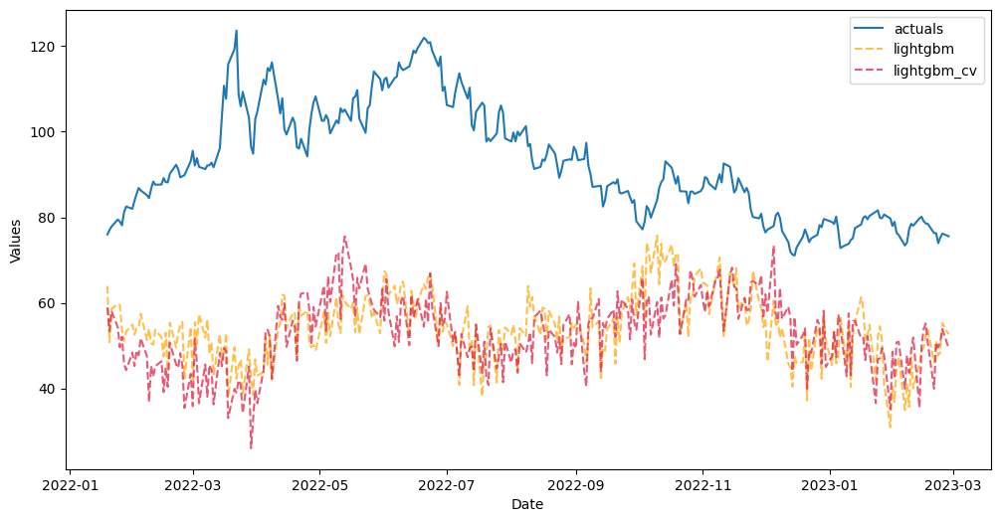

In [ ]:
# plot the cross validated forecast against standard forecast
f.plot_test_set(
    models=[
        "lightgbm",
        "lightgbm_cv",
    ],
    include_train=False,
)
plt.show()

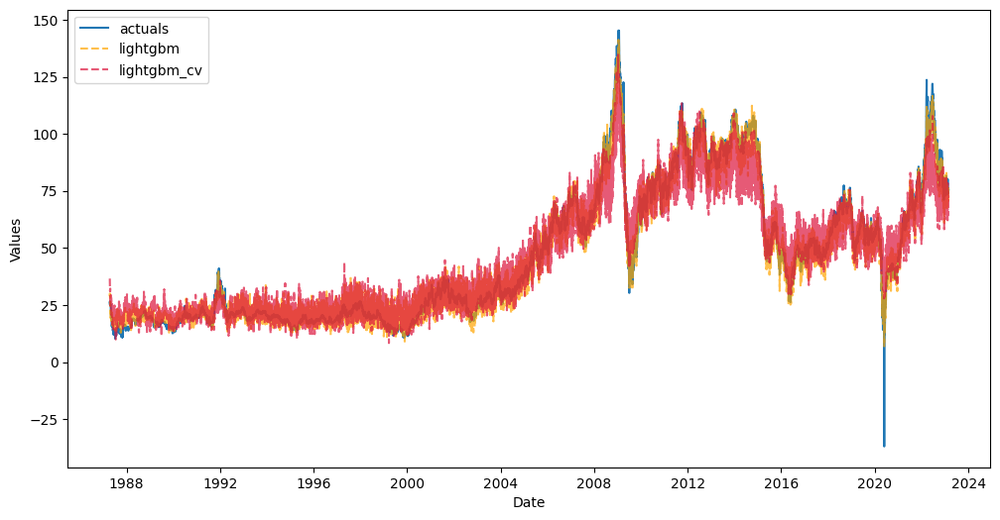

In [ ]:
f.plot_fitted(
    models=[
        "lightgbm",
        "lightgbm_cv",
    ],
)
plt.show()

### 4) XGBoost

In [ ]:
f.set_estimator('xgboost')
f.manual_forecast()

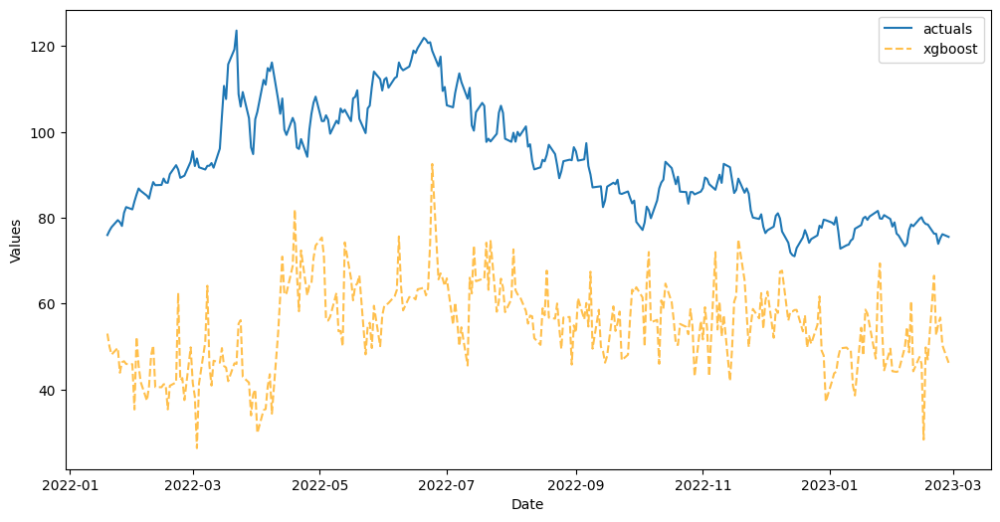

In [ ]:
# plot the test set actuals against the forecasted
f.plot_test_set(
    models=[
        "xgboost",
    ],
    include_train=False,
)
plt.show()

In [ ]:
grid = {
    "max_depth": [2,4],
    "subsample": [0.8,1],
}
f.ingest_grid(grid)

In [ ]:
f.cross_validate(k=389,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f.auto_forecast(call_me="xgboost_cv")

Num hyperparams to try for the xgboost model: 4.
Fold 0: Train size: 506 (2020-01-10 00:00:00 - 2021-12-17 00:00:00). Test Size: 22 (2021-12-20 00:00:00 - 2022-01-18 00:00:00). 
Fold 1: Train size: 506 (2019-12-11 00:00:00 - 2021-11-17 00:00:00). Test Size: 22 (2021-11-18 00:00:00 - 2021-12-17 00:00:00). 
Fold 2: Train size: 506 (2019-11-11 00:00:00 - 2021-10-18 00:00:00). Test Size: 22 (2021-10-19 00:00:00 - 2021-11-17 00:00:00). 
Fold 3: Train size: 506 (2019-10-10 00:00:00 - 2021-09-16 00:00:00). Test Size: 22 (2021-09-17 00:00:00 - 2021-10-18 00:00:00). 
Fold 4: Train size: 506 (2019-09-10 00:00:00 - 2021-08-17 00:00:00). Test Size: 22 (2021-08-18 00:00:00 - 2021-09-16 00:00:00). 
Fold 5: Train size: 506 (2019-08-09 00:00:00 - 2021-07-16 00:00:00). Test Size: 22 (2021-07-19 00:00:00 - 2021-08-17 00:00:00). 
Fold 6: Train size: 506 (2019-07-10 00:00:00 - 2021-06-16 00:00:00). Test Size: 22 (2021-06-17 00:00:00 - 2021-07-16 00:00:00). 
Fold 7: Train size: 506 (2019-06-10 00:00:00 - 2

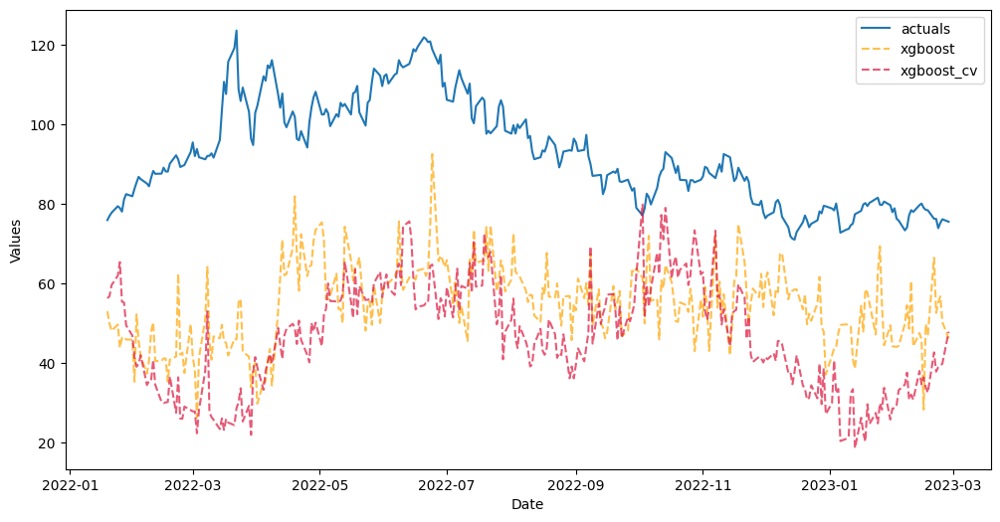

In [ ]:
f.plot_test_set(
    models=[
        "xgboost",
        "xgboost_cv",
    ],
    include_train=False,
)
plt.show()

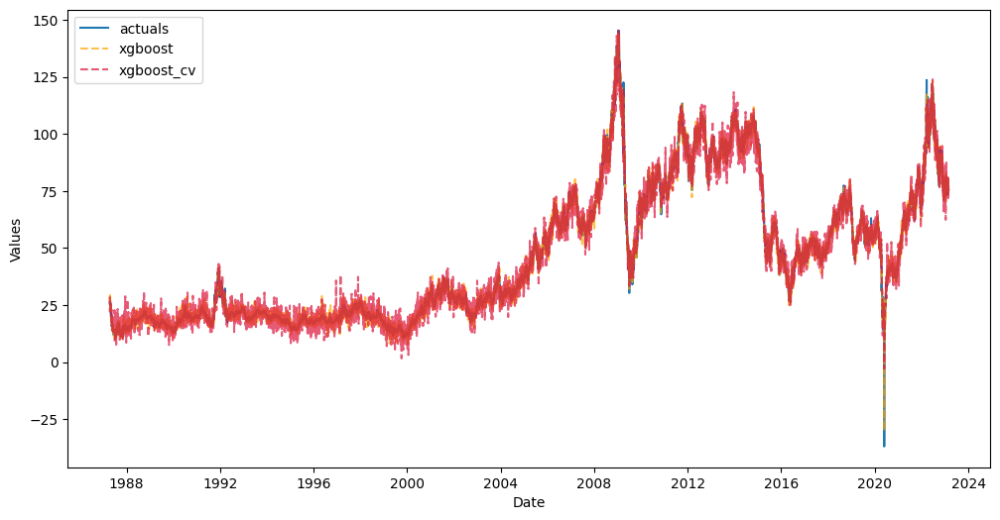

In [ ]:
f.plot_fitted(
    models=[
        "xgboost",
        "xgboost_cv",
    ],
)
plt.show()

### 5) Prophet

In [ ]:
f.set_estimator('prophet')
f.manual_forecast()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jjkapvob.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dild1wty.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53703', 'data', 'file=/tmp/tmpxm7fmrec/jjkapvob.json', 'init=/tmp/tmpxm7fmrec/dild1wty.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeld_lagpfy/prophet_model-20230417040833.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:08:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:08:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7

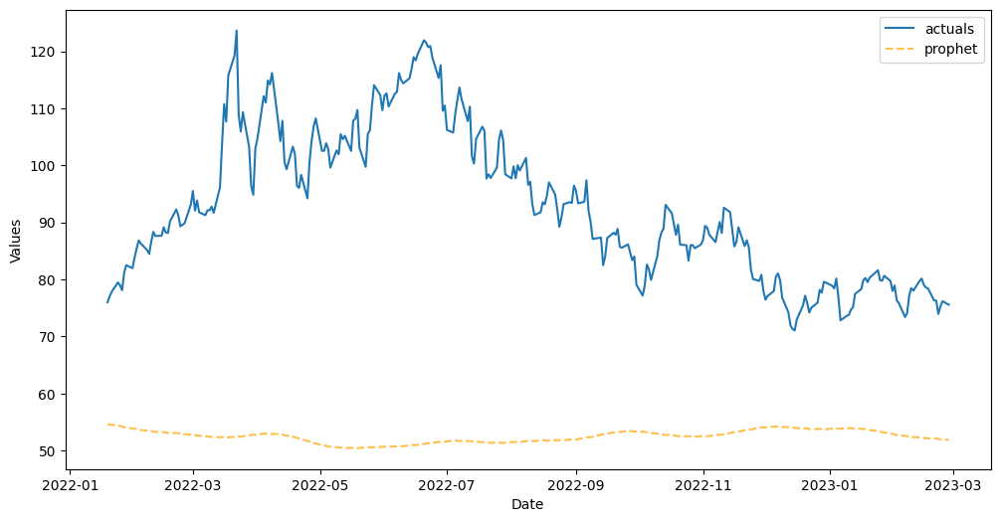

In [ ]:
# plot the test set actuals against the forecasted
f.plot_test_set(
    models=[
        "prophet",
    ],
    include_train=False,
)
plt.show()

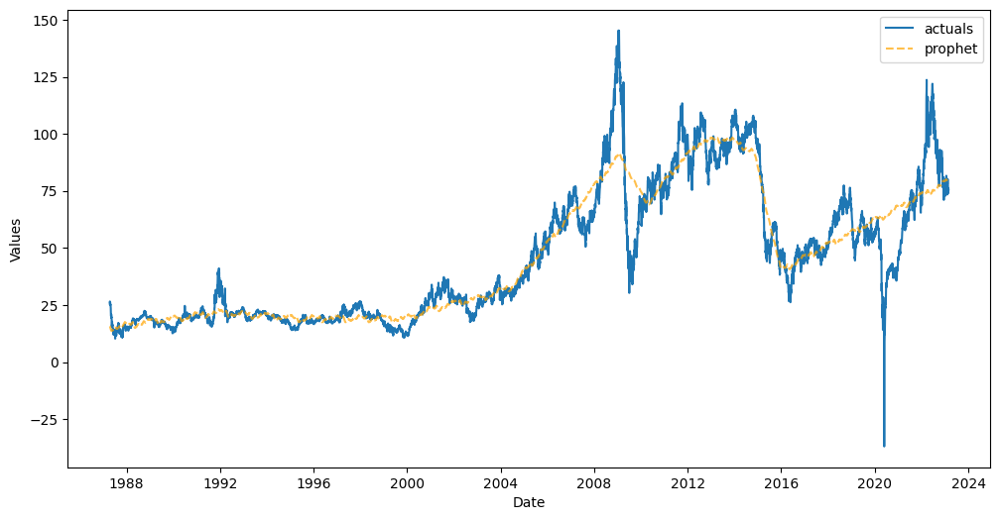

In [ ]:
f.plot_fitted(
    models=[
        "prophet",
    ],
)
plt.show()

In [ ]:
grid = {
    'seasonality_mode':['additive','multiplicative']
}
f.ingest_grid(grid)

In [ ]:
f.cross_validate(k=389,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f.auto_forecast(call_me="prophet_cv")

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ghroes0n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/of5821t9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33555', 'data', 'file=/tmp/tmpxm7fmrec/ghroes0n.json', 'init=/tmp/tmpxm7fmrec/of5821t9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelly5mxqba/prophet_model-20230417040854.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:08:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:08:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Num hyperparams to try for the prophet model: 2.
Fold 0: Train size: 506 (2020-01-10 00:00:00 - 2021-12-17 00:00:00). Test Size: 22 (2021-12-20 00:00:00 - 2022-01-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/74hzyvze.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/nkax4y0s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4502', 'data', 'file=/tmp/tmpxm7fmrec/74hzyvze.json', 'init=/tmp/tmpxm7fmrec/nkax4y0s.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model43ss_vdi/prophet_model-20230417040854.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:08:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:08:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 1: Train size: 506 (2019-12-11 00:00:00 - 2021-11-17 00:00:00). Test Size: 22 (2021-11-18 00:00:00 - 2021-12-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_jch0ii1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zys2u0ak.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11908', 'data', 'file=/tmp/tmpxm7fmrec/_jch0ii1.json', 'init=/tmp/tmpxm7fmrec/zys2u0ak.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelvbz_h42i/prophet_model-20230417040855.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:08:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:08:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 2: Train size: 506 (2019-11-11 00:00:00 - 2021-10-18 00:00:00). Test Size: 22 (2021-10-19 00:00:00 - 2021-11-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gsmt0xiw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3axu7733.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43055', 'data', 'file=/tmp/tmpxm7fmrec/gsmt0xiw.json', 'init=/tmp/tmpxm7fmrec/3axu7733.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelg_0uznx2/prophet_model-20230417040857.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:08:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:08:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 3: Train size: 506 (2019-10-10 00:00:00 - 2021-09-16 00:00:00). Test Size: 22 (2021-09-17 00:00:00 - 2021-10-18 00:00:00). 


04:08:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1zjxr4uc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/91g6jb0i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36583', 'data', 'file=/tmp/tmpxm7fmrec/1zjxr4uc.json', 'init=/tmp/tmpxm7fmrec/91g6jb0i.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelo7yvp151/prophet_model-20230417040858.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:08:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:08:59 - cmdstanpy - INFO - Chain [1] d

Fold 4: Train size: 506 (2019-09-10 00:00:00 - 2021-08-17 00:00:00). Test Size: 22 (2021-08-18 00:00:00 - 2021-09-16 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/nuo3uth9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2k8bdkae.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5281', 'data', 'file=/tmp/tmpxm7fmrec/nuo3uth9.json', 'init=/tmp/tmpxm7fmrec/2k8bdkae.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modellahj1faj/prophet_model-20230417040900.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 5: Train size: 506 (2019-08-09 00:00:00 - 2021-07-16 00:00:00). Test Size: 22 (2021-07-19 00:00:00 - 2021-08-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7j1h73zw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/04prdyof.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10339', 'data', 'file=/tmp/tmpxm7fmrec/7j1h73zw.json', 'init=/tmp/tmpxm7fmrec/04prdyof.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelxg2hmqeu/prophet_model-20230417040901.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 6: Train size: 506 (2019-07-10 00:00:00 - 2021-06-16 00:00:00). Test Size: 22 (2021-06-17 00:00:00 - 2021-07-16 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xksxhhxq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/n361or69.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17038', 'data', 'file=/tmp/tmpxm7fmrec/xksxhhxq.json', 'init=/tmp/tmpxm7fmrec/n361or69.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model84qj9igg/prophet_model-20230417040903.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 7: Train size: 506 (2019-06-10 00:00:00 - 2021-05-17 00:00:00). Test Size: 22 (2021-05-18 00:00:00 - 2021-06-16 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/70o9gfb2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_fwknz1c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59520', 'data', 'file=/tmp/tmpxm7fmrec/70o9gfb2.json', 'init=/tmp/tmpxm7fmrec/_fwknz1c.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelgcpcd9im/prophet_model-20230417040904.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 8: Train size: 506 (2019-05-09 00:00:00 - 2021-04-15 00:00:00). Test Size: 22 (2021-04-16 00:00:00 - 2021-05-17 00:00:00). 


DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4418', 'data', 'file=/tmp/tmpxm7fmrec/pxacglks.json', 'init=/tmp/tmpxm7fmrec/nd0b8nvd.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_models70wnpml/prophet_model-20230417040905.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/k9rb9w8w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jlxkznry.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:runn

Fold 9: Train size: 506 (2019-04-09 00:00:00 - 2021-03-16 00:00:00). Test Size: 22 (2021-03-17 00:00:00 - 2021-04-15 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/y7y8ifmg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3x1mhl_n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54790', 'data', 'file=/tmp/tmpxm7fmrec/y7y8ifmg.json', 'init=/tmp/tmpxm7fmrec/3x1mhl_n.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelk3ujzjyb/prophet_model-20230417040907.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 10: Train size: 506 (2019-03-08 00:00:00 - 2021-02-12 00:00:00). Test Size: 22 (2021-02-15 00:00:00 - 2021-03-16 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6c69q4sz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zdy6mywc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44575', 'data', 'file=/tmp/tmpxm7fmrec/6c69q4sz.json', 'init=/tmp/tmpxm7fmrec/zdy6mywc.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelf273s620/prophet_model-20230417040908.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 11: Train size: 506 (2019-02-06 00:00:00 - 2021-01-13 00:00:00). Test Size: 22 (2021-01-14 00:00:00 - 2021-02-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ntai_2_s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4rpoyvzx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86222', 'data', 'file=/tmp/tmpxm7fmrec/ntai_2_s.json', 'init=/tmp/tmpxm7fmrec/4rpoyvzx.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modellvs784uc/prophet_model-20230417040909.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 12: Train size: 506 (2019-01-07 00:00:00 - 2020-12-14 00:00:00). Test Size: 22 (2020-12-15 00:00:00 - 2021-01-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z4336g6r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jezlzqub.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91902', 'data', 'file=/tmp/tmpxm7fmrec/z4336g6r.json', 'init=/tmp/tmpxm7fmrec/jezlzqub.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelzgq7e_6q/prophet_model-20230417040911.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 13: Train size: 506 (2018-12-06 00:00:00 - 2020-11-12 00:00:00). Test Size: 22 (2020-11-13 00:00:00 - 2020-12-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cnxvd_68.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/e5krc8oj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8746', 'data', 'file=/tmp/tmpxm7fmrec/cnxvd_68.json', 'init=/tmp/tmpxm7fmrec/e5krc8oj.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model5ia15g_f/prophet_model-20230417040912.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 14: Train size: 506 (2018-11-06 00:00:00 - 2020-10-13 00:00:00). Test Size: 22 (2020-10-14 00:00:00 - 2020-11-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8av75yta.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ie3_l2gy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42566', 'data', 'file=/tmp/tmpxm7fmrec/8av75yta.json', 'init=/tmp/tmpxm7fmrec/ie3_l2gy.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelc7pu4urv/prophet_model-20230417040914.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 15: Train size: 506 (2018-10-05 00:00:00 - 2020-09-11 00:00:00). Test Size: 22 (2020-09-14 00:00:00 - 2020-10-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qp5nemzk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ie6b4qfp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82230', 'data', 'file=/tmp/tmpxm7fmrec/qp5nemzk.json', 'init=/tmp/tmpxm7fmrec/ie6b4qfp.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model73tzev4m/prophet_model-20230417040915.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 16: Train size: 506 (2018-09-05 00:00:00 - 2020-08-12 00:00:00). Test Size: 22 (2020-08-13 00:00:00 - 2020-09-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/34x_uz00.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/akj81ut9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83891', 'data', 'file=/tmp/tmpxm7fmrec/34x_uz00.json', 'init=/tmp/tmpxm7fmrec/akj81ut9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model6xac3k6i/prophet_model-20230417040917.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 17: Train size: 506 (2018-08-06 00:00:00 - 2020-07-13 00:00:00). Test Size: 22 (2020-07-14 00:00:00 - 2020-08-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5h_7osn0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cxgporm1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98205', 'data', 'file=/tmp/tmpxm7fmrec/5h_7osn0.json', 'init=/tmp/tmpxm7fmrec/cxgporm1.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelkqivspb1/prophet_model-20230417040918.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 18: Train size: 506 (2018-07-05 00:00:00 - 2020-06-11 00:00:00). Test Size: 22 (2020-06-12 00:00:00 - 2020-07-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ew1fqxsz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3tnv23l_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94958', 'data', 'file=/tmp/tmpxm7fmrec/ew1fqxsz.json', 'init=/tmp/tmpxm7fmrec/3tnv23l_.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelo2_i6jl4/prophet_model-20230417040920.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 19: Train size: 506 (2018-06-05 00:00:00 - 2020-05-12 00:00:00). Test Size: 22 (2020-05-13 00:00:00 - 2020-06-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6lit094j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/i0xr2xc1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44210', 'data', 'file=/tmp/tmpxm7fmrec/6lit094j.json', 'init=/tmp/tmpxm7fmrec/i0xr2xc1.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model82c3pne4/prophet_model-20230417040921.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 20: Train size: 506 (2018-05-04 00:00:00 - 2020-04-10 00:00:00). Test Size: 22 (2020-04-13 00:00:00 - 2020-05-12 00:00:00). 


04:09:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/m32wu3y7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2n5t0gv4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86518', 'data', 'file=/tmp/tmpxm7fmrec/m32wu3y7.json', 'init=/tmp/tmpxm7fmrec/2n5t0gv4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modely64ffeac/prophet_model-20230417040922.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:22 - cmdstanpy - INFO - Chain [1] d

Fold 21: Train size: 506 (2018-04-04 00:00:00 - 2020-03-11 00:00:00). Test Size: 22 (2020-03-12 00:00:00 - 2020-04-10 00:00:00). 


04:09:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pyunw3x9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/r0jrrorj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53468', 'data', 'file=/tmp/tmpxm7fmrec/pyunw3x9.json', 'init=/tmp/tmpxm7fmrec/r0jrrorj.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model01jktg_9/prophet_model-20230417040923.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:24 - cmdstanpy - INFO - Chain [1] d

Fold 22: Train size: 506 (2018-03-05 00:00:00 - 2020-02-10 00:00:00). Test Size: 22 (2020-02-11 00:00:00 - 2020-03-11 00:00:00). 


04:09:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9j2xded8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kqum3wvt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63568', 'data', 'file=/tmp/tmpxm7fmrec/9j2xded8.json', 'init=/tmp/tmpxm7fmrec/kqum3wvt.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_2mte3p8/prophet_model-20230417040925.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:26 - cmdstanpy - INFO - Chain [1] d

Fold 23: Train size: 506 (2018-02-01 00:00:00 - 2020-01-09 00:00:00). Test Size: 22 (2020-01-10 00:00:00 - 2020-02-10 00:00:00). 


04:09:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vm0yk8a0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dwtwwtg8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45140', 'data', 'file=/tmp/tmpxm7fmrec/vm0yk8a0.json', 'init=/tmp/tmpxm7fmrec/dwtwwtg8.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model26vwnyv9/prophet_model-20230417040927.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:28 - cmdstanpy - INFO - Chain [1] d

Fold 24: Train size: 506 (2018-01-02 00:00:00 - 2019-12-10 00:00:00). Test Size: 22 (2019-12-11 00:00:00 - 2020-01-09 00:00:00). 


04:09:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1nwfwmef.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z9jua31b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33441', 'data', 'file=/tmp/tmpxm7fmrec/1nwfwmef.json', 'init=/tmp/tmpxm7fmrec/z9jua31b.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelp7jxgnz0/prophet_model-20230417040929.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:30 - cmdstanpy - INFO - Chain [1] d

Fold 25: Train size: 506 (2017-12-01 00:00:00 - 2019-11-08 00:00:00). Test Size: 22 (2019-11-11 00:00:00 - 2019-12-10 00:00:00). 


04:09:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/k2c2wx2s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3f7x2rs4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92691', 'data', 'file=/tmp/tmpxm7fmrec/k2c2wx2s.json', 'init=/tmp/tmpxm7fmrec/3f7x2rs4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeliqwk24nd/prophet_model-20230417040931.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:32 - cmdstanpy - INFO - Chain [1] d

Fold 26: Train size: 506 (2017-11-01 00:00:00 - 2019-10-09 00:00:00). Test Size: 22 (2019-10-10 00:00:00 - 2019-11-08 00:00:00). 


04:09:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/b4ve8nf6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2pg_qrru.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17344', 'data', 'file=/tmp/tmpxm7fmrec/b4ve8nf6.json', 'init=/tmp/tmpxm7fmrec/2pg_qrru.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelvv0o8lm6/prophet_model-20230417040933.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:33 - cmdstanpy - INFO - Chain [1] d

Fold 27: Train size: 506 (2017-10-02 00:00:00 - 2019-09-09 00:00:00). Test Size: 22 (2019-09-10 00:00:00 - 2019-10-09 00:00:00). 


04:09:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/a1qebdy1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/j83cafry.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96750', 'data', 'file=/tmp/tmpxm7fmrec/a1qebdy1.json', 'init=/tmp/tmpxm7fmrec/j83cafry.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeltctp_2t6/prophet_model-20230417040934.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:35 - cmdstanpy - INFO - Chain [1] d

Fold 28: Train size: 506 (2017-08-31 00:00:00 - 2019-08-08 00:00:00). Test Size: 22 (2019-08-09 00:00:00 - 2019-09-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cjtkzbnz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jsloxozt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73282', 'data', 'file=/tmp/tmpxm7fmrec/cjtkzbnz.json', 'init=/tmp/tmpxm7fmrec/jsloxozt.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelm21_dwkc/prophet_model-20230417040936.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 29: Train size: 506 (2017-08-01 00:00:00 - 2019-07-09 00:00:00). Test Size: 22 (2019-07-10 00:00:00 - 2019-08-08 00:00:00). 


04:09:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/f6v7kyf0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mosvmuls.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40996', 'data', 'file=/tmp/tmpxm7fmrec/f6v7kyf0.json', 'init=/tmp/tmpxm7fmrec/mosvmuls.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model2wug43gl/prophet_model-20230417040937.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:38 - cmdstanpy - INFO - Chain [1] d

Fold 30: Train size: 506 (2017-06-30 00:00:00 - 2019-06-07 00:00:00). Test Size: 22 (2019-06-10 00:00:00 - 2019-07-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5bh585mi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/btaa92vi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1864', 'data', 'file=/tmp/tmpxm7fmrec/5bh585mi.json', 'init=/tmp/tmpxm7fmrec/btaa92vi.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelyg71dqca/prophet_model-20230417040939.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 31: Train size: 506 (2017-05-31 00:00:00 - 2019-05-08 00:00:00). Test Size: 22 (2019-05-09 00:00:00 - 2019-06-07 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/yas0qf_x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/losb7bja.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46474', 'data', 'file=/tmp/tmpxm7fmrec/yas0qf_x.json', 'init=/tmp/tmpxm7fmrec/losb7bja.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model4p5wgw7h/prophet_model-20230417040941.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 32: Train size: 506 (2017-05-01 00:00:00 - 2019-04-08 00:00:00). Test Size: 22 (2019-04-09 00:00:00 - 2019-05-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hdj43gta.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pf2bpd3p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57844', 'data', 'file=/tmp/tmpxm7fmrec/hdj43gta.json', 'init=/tmp/tmpxm7fmrec/pf2bpd3p.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelxcsg7a_4/prophet_model-20230417040942.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 33: Train size: 506 (2017-03-30 00:00:00 - 2019-03-07 00:00:00). Test Size: 22 (2019-03-08 00:00:00 - 2019-04-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/t7ter8iy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kuea7kk2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35786', 'data', 'file=/tmp/tmpxm7fmrec/t7ter8iy.json', 'init=/tmp/tmpxm7fmrec/kuea7kk2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelqw1eaxl3/prophet_model-20230417040943.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 34: Train size: 506 (2017-02-28 00:00:00 - 2019-02-05 00:00:00). Test Size: 22 (2019-02-06 00:00:00 - 2019-03-07 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/j584qaqn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qu2ini94.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74549', 'data', 'file=/tmp/tmpxm7fmrec/j584qaqn.json', 'init=/tmp/tmpxm7fmrec/qu2ini94.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelq02n39x6/prophet_model-20230417040945.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 35: Train size: 506 (2017-01-27 00:00:00 - 2019-01-04 00:00:00). Test Size: 22 (2019-01-07 00:00:00 - 2019-02-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dp1kwm23.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bxz64cha.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30693', 'data', 'file=/tmp/tmpxm7fmrec/dp1kwm23.json', 'init=/tmp/tmpxm7fmrec/bxz64cha.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model8g_v8u4_/prophet_model-20230417040946.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 36: Train size: 506 (2016-12-28 00:00:00 - 2018-12-05 00:00:00). Test Size: 22 (2018-12-06 00:00:00 - 2019-01-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/utp0thhf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6xeavo_x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24036', 'data', 'file=/tmp/tmpxm7fmrec/utp0thhf.json', 'init=/tmp/tmpxm7fmrec/6xeavo_x.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelq34cnlt9/prophet_model-20230417040947.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 37: Train size: 506 (2016-11-28 00:00:00 - 2018-11-05 00:00:00). Test Size: 22 (2018-11-06 00:00:00 - 2018-12-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/d8jma6cs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7ncthjgz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7394', 'data', 'file=/tmp/tmpxm7fmrec/d8jma6cs.json', 'init=/tmp/tmpxm7fmrec/7ncthjgz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model44aokyli/prophet_model-20230417040948.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 38: Train size: 506 (2016-10-27 00:00:00 - 2018-10-04 00:00:00). Test Size: 22 (2018-10-05 00:00:00 - 2018-11-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ncy2eqo1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/n6r37v6k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48168', 'data', 'file=/tmp/tmpxm7fmrec/ncy2eqo1.json', 'init=/tmp/tmpxm7fmrec/n6r37v6k.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modell7cl0ma8/prophet_model-20230417040949.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 39: Train size: 506 (2016-09-27 00:00:00 - 2018-09-04 00:00:00). Test Size: 22 (2018-09-05 00:00:00 - 2018-10-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_9vemg87.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3bbwnl5d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5915', 'data', 'file=/tmp/tmpxm7fmrec/_9vemg87.json', 'init=/tmp/tmpxm7fmrec/3bbwnl5d.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelvnp35ryu/prophet_model-20230417040951.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 40: Train size: 506 (2016-08-26 00:00:00 - 2018-08-03 00:00:00). Test Size: 22 (2018-08-06 00:00:00 - 2018-09-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hyn8p2ie.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vfba1kaa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97069', 'data', 'file=/tmp/tmpxm7fmrec/hyn8p2ie.json', 'init=/tmp/tmpxm7fmrec/vfba1kaa.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeltqqot6yz/prophet_model-20230417040952.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 41: Train size: 506 (2016-07-27 00:00:00 - 2018-07-04 00:00:00). Test Size: 22 (2018-07-05 00:00:00 - 2018-08-03 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qze2ogwi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/q5fn8qr0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8151', 'data', 'file=/tmp/tmpxm7fmrec/qze2ogwi.json', 'init=/tmp/tmpxm7fmrec/q5fn8qr0.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelejpqwys6/prophet_model-20230417040953.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 42: Train size: 506 (2016-06-27 00:00:00 - 2018-06-04 00:00:00). Test Size: 22 (2018-06-05 00:00:00 - 2018-07-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/04v23m0x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0lof5apq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=928', 'data', 'file=/tmp/tmpxm7fmrec/04v23m0x.json', 'init=/tmp/tmpxm7fmrec/0lof5apq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_siyfnvk/prophet_model-20230417040955.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. 

Fold 43: Train size: 506 (2016-05-26 00:00:00 - 2018-05-03 00:00:00). Test Size: 22 (2018-05-04 00:00:00 - 2018-06-04 00:00:00). 


04:09:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wu3ujmyg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9fpqk5mm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7355', 'data', 'file=/tmp/tmpxm7fmrec/wu3ujmyg.json', 'init=/tmp/tmpxm7fmrec/9fpqk5mm.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelpyohn58f/prophet_model-20230417040956.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:57 - cmdstanpy - INFO - Chain [1] do

Fold 44: Train size: 506 (2016-04-26 00:00:00 - 2018-04-03 00:00:00). Test Size: 22 (2018-04-04 00:00:00 - 2018-05-03 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jepr_c7b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wnq5ubdt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89942', 'data', 'file=/tmp/tmpxm7fmrec/jepr_c7b.json', 'init=/tmp/tmpxm7fmrec/wnq5ubdt.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model2x_sjw_w/prophet_model-20230417040958.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:09:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 45: Train size: 506 (2016-03-25 00:00:00 - 2018-03-02 00:00:00). Test Size: 22 (2018-03-05 00:00:00 - 2018-04-03 00:00:00). 


04:09:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cb5j6_ql.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/nitouavr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33754', 'data', 'file=/tmp/tmpxm7fmrec/cb5j6_ql.json', 'init=/tmp/tmpxm7fmrec/nitouavr.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelzwl9l3fp/prophet_model-20230417040959.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:09:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:00 - cmdstanpy - INFO - Chain [1] d

Fold 46: Train size: 506 (2016-02-24 00:00:00 - 2018-01-31 00:00:00). Test Size: 22 (2018-02-01 00:00:00 - 2018-03-02 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jqsu_lid.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/k161ytac.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7537', 'data', 'file=/tmp/tmpxm7fmrec/jqsu_lid.json', 'init=/tmp/tmpxm7fmrec/k161ytac.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model8k7c3f4a/prophet_model-20230417041001.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 47: Train size: 506 (2016-01-25 00:00:00 - 2018-01-01 00:00:00). Test Size: 22 (2018-01-02 00:00:00 - 2018-01-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0vg5cimy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mftb9n9v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14043', 'data', 'file=/tmp/tmpxm7fmrec/0vg5cimy.json', 'init=/tmp/tmpxm7fmrec/mftb9n9v.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeltorcgn2l/prophet_model-20230417041002.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 48: Train size: 506 (2015-12-24 00:00:00 - 2017-11-30 00:00:00). Test Size: 22 (2017-12-01 00:00:00 - 2018-01-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pzxwgfzw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3s0pfbzb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21968', 'data', 'file=/tmp/tmpxm7fmrec/pzxwgfzw.json', 'init=/tmp/tmpxm7fmrec/3s0pfbzb.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model5fcaka94/prophet_model-20230417041004.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 49: Train size: 506 (2015-11-24 00:00:00 - 2017-10-31 00:00:00). Test Size: 22 (2017-11-01 00:00:00 - 2017-11-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/u9ogy9v1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_ii104t7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87989', 'data', 'file=/tmp/tmpxm7fmrec/u9ogy9v1.json', 'init=/tmp/tmpxm7fmrec/_ii104t7.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model5axw1ogu/prophet_model-20230417041005.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 50: Train size: 506 (2015-10-23 00:00:00 - 2017-09-29 00:00:00). Test Size: 22 (2017-10-02 00:00:00 - 2017-10-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5im9ftwf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tjeud0dx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85375', 'data', 'file=/tmp/tmpxm7fmrec/5im9ftwf.json', 'init=/tmp/tmpxm7fmrec/tjeud0dx.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model2_5u7gsw/prophet_model-20230417041006.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 51: Train size: 506 (2015-09-23 00:00:00 - 2017-08-30 00:00:00). Test Size: 22 (2017-08-31 00:00:00 - 2017-09-29 00:00:00). 


04:10:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4up9ovlg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/m1903s_o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77410', 'data', 'file=/tmp/tmpxm7fmrec/4up9ovlg.json', 'init=/tmp/tmpxm7fmrec/m1903s_o.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model2qb9hxgt/prophet_model-20230417041008.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:08 - cmdstanpy - INFO - Chain [1] d

Fold 52: Train size: 506 (2015-08-24 00:00:00 - 2017-07-31 00:00:00). Test Size: 22 (2017-08-01 00:00:00 - 2017-08-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fp2np9zs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ex8kqoib.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11689', 'data', 'file=/tmp/tmpxm7fmrec/fp2np9zs.json', 'init=/tmp/tmpxm7fmrec/ex8kqoib.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelo0rekq1k/prophet_model-20230417041009.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 53: Train size: 506 (2015-07-23 00:00:00 - 2017-06-29 00:00:00). Test Size: 22 (2017-06-30 00:00:00 - 2017-07-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/o3bfro0i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z860cj_n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90157', 'data', 'file=/tmp/tmpxm7fmrec/o3bfro0i.json', 'init=/tmp/tmpxm7fmrec/z860cj_n.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelugfr7ige/prophet_model-20230417041011.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 54: Train size: 506 (2015-06-23 00:00:00 - 2017-05-30 00:00:00). Test Size: 22 (2017-05-31 00:00:00 - 2017-06-29 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6ug750gv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/t3a_z3jx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1584', 'data', 'file=/tmp/tmpxm7fmrec/6ug750gv.json', 'init=/tmp/tmpxm7fmrec/t3a_z3jx.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model59gq0_d_/prophet_model-20230417041012.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 55: Train size: 506 (2015-05-22 00:00:00 - 2017-04-28 00:00:00). Test Size: 22 (2017-05-01 00:00:00 - 2017-05-30 00:00:00). 


04:10:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dishq01r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/__kztdaa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90022', 'data', 'file=/tmp/tmpxm7fmrec/dishq01r.json', 'init=/tmp/tmpxm7fmrec/__kztdaa.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelp2y632pm/prophet_model-20230417041014.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:14 - cmdstanpy - INFO - Chain [1] d

Fold 56: Train size: 506 (2015-04-22 00:00:00 - 2017-03-29 00:00:00). Test Size: 22 (2017-03-30 00:00:00 - 2017-04-28 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0mizgzqy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/okxckhv6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41867', 'data', 'file=/tmp/tmpxm7fmrec/0mizgzqy.json', 'init=/tmp/tmpxm7fmrec/okxckhv6.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelp0pq88q_/prophet_model-20230417041015.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 57: Train size: 506 (2015-03-23 00:00:00 - 2017-02-27 00:00:00). Test Size: 22 (2017-02-28 00:00:00 - 2017-03-29 00:00:00). 


04:10:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/k1yk342c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fvywqmrz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38205', 'data', 'file=/tmp/tmpxm7fmrec/k1yk342c.json', 'init=/tmp/tmpxm7fmrec/fvywqmrz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7q2hsh1t/prophet_model-20230417041017.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:18 - cmdstanpy - INFO - Chain [1] d

Fold 58: Train size: 506 (2015-02-19 00:00:00 - 2017-01-26 00:00:00). Test Size: 22 (2017-01-27 00:00:00 - 2017-02-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9slfe29h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/evgf9yb0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89117', 'data', 'file=/tmp/tmpxm7fmrec/9slfe29h.json', 'init=/tmp/tmpxm7fmrec/evgf9yb0.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelol9zgg24/prophet_model-20230417041019.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 59: Train size: 506 (2015-01-20 00:00:00 - 2016-12-27 00:00:00). Test Size: 22 (2016-12-28 00:00:00 - 2017-01-26 00:00:00). 


04:10:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/sqxhpef_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kkhs3rdj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84679', 'data', 'file=/tmp/tmpxm7fmrec/sqxhpef_.json', 'init=/tmp/tmpxm7fmrec/kkhs3rdj.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelrc9kjx_q/prophet_model-20230417041020.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:21 - cmdstanpy - INFO - Chain [1] d

Fold 60: Train size: 506 (2014-12-19 00:00:00 - 2016-11-25 00:00:00). Test Size: 22 (2016-11-28 00:00:00 - 2016-12-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0kawz60s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/swm3d89j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33879', 'data', 'file=/tmp/tmpxm7fmrec/0kawz60s.json', 'init=/tmp/tmpxm7fmrec/swm3d89j.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelxg0i35oy/prophet_model-20230417041022.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 61: Train size: 506 (2014-11-19 00:00:00 - 2016-10-26 00:00:00). Test Size: 22 (2016-10-27 00:00:00 - 2016-11-25 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/blzd3iwi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/n8gsw0zf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83511', 'data', 'file=/tmp/tmpxm7fmrec/blzd3iwi.json', 'init=/tmp/tmpxm7fmrec/n8gsw0zf.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelp74ry2rg/prophet_model-20230417041023.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 62: Train size: 506 (2014-10-20 00:00:00 - 2016-09-26 00:00:00). Test Size: 22 (2016-09-27 00:00:00 - 2016-10-26 00:00:00). 


04:10:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/lw0wdra9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_t0_4_p4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90028', 'data', 'file=/tmp/tmpxm7fmrec/lw0wdra9.json', 'init=/tmp/tmpxm7fmrec/_t0_4_p4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelo2ota6_4/prophet_model-20230417041025.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:26 - cmdstanpy - INFO - Chain [1] d

Fold 63: Train size: 506 (2014-09-18 00:00:00 - 2016-08-25 00:00:00). Test Size: 22 (2016-08-26 00:00:00 - 2016-09-26 00:00:00). 


04:10:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0oy40qjq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/f6m89qhq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42046', 'data', 'file=/tmp/tmpxm7fmrec/0oy40qjq.json', 'init=/tmp/tmpxm7fmrec/f6m89qhq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeluqo2hcr8/prophet_model-20230417041027.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:28 - cmdstanpy - INFO - Chain [1] d

Fold 64: Train size: 506 (2014-08-19 00:00:00 - 2016-07-26 00:00:00). Test Size: 22 (2016-07-27 00:00:00 - 2016-08-25 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zqahfwm8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mkdoihk6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47335', 'data', 'file=/tmp/tmpxm7fmrec/zqahfwm8.json', 'init=/tmp/tmpxm7fmrec/mkdoihk6.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelqggsfd43/prophet_model-20230417041029.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 65: Train size: 506 (2014-07-18 00:00:00 - 2016-06-24 00:00:00). Test Size: 22 (2016-06-27 00:00:00 - 2016-07-26 00:00:00). 


04:10:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/q5ehhac1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6ysx2u8w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11396', 'data', 'file=/tmp/tmpxm7fmrec/q5ehhac1.json', 'init=/tmp/tmpxm7fmrec/6ysx2u8w.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelq7ahchwe/prophet_model-20230417041031.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:31 - cmdstanpy - INFO - Chain [1] d

Fold 66: Train size: 506 (2014-06-18 00:00:00 - 2016-05-25 00:00:00). Test Size: 22 (2016-05-26 00:00:00 - 2016-06-24 00:00:00). 


04:10:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9ugt0_39.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/l9jrtt7d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95309', 'data', 'file=/tmp/tmpxm7fmrec/9ugt0_39.json', 'init=/tmp/tmpxm7fmrec/l9jrtt7d.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelqj493bxg/prophet_model-20230417041032.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:33 - cmdstanpy - INFO - Chain [1] d

Fold 67: Train size: 506 (2014-05-19 00:00:00 - 2016-04-25 00:00:00). Test Size: 22 (2016-04-26 00:00:00 - 2016-05-25 00:00:00). 


04:10:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z43phys7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fbnw4pvw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5226', 'data', 'file=/tmp/tmpxm7fmrec/z43phys7.json', 'init=/tmp/tmpxm7fmrec/fbnw4pvw.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model66856ntg/prophet_model-20230417041034.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:35 - cmdstanpy - INFO - Chain [1] do

Fold 68: Train size: 506 (2014-04-17 00:00:00 - 2016-03-24 00:00:00). Test Size: 22 (2016-03-25 00:00:00 - 2016-04-25 00:00:00). 


04:10:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_6kxyezs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/v1xscaa1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77377', 'data', 'file=/tmp/tmpxm7fmrec/_6kxyezs.json', 'init=/tmp/tmpxm7fmrec/v1xscaa1.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model4xypalju/prophet_model-20230417041036.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:37 - cmdstanpy - INFO - Chain [1] d

Fold 69: Train size: 506 (2014-03-18 00:00:00 - 2016-02-23 00:00:00). Test Size: 22 (2016-02-24 00:00:00 - 2016-03-24 00:00:00). 


04:10:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bx6kehec.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6jz8ruyo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15530', 'data', 'file=/tmp/tmpxm7fmrec/bx6kehec.json', 'init=/tmp/tmpxm7fmrec/6jz8ruyo.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelskahgaw7/prophet_model-20230417041038.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:38 - cmdstanpy - INFO - Chain [1] d

Fold 70: Train size: 506 (2014-02-14 00:00:00 - 2016-01-22 00:00:00). Test Size: 22 (2016-01-25 00:00:00 - 2016-02-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/46c151qo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/i_f119ww.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16820', 'data', 'file=/tmp/tmpxm7fmrec/46c151qo.json', 'init=/tmp/tmpxm7fmrec/i_f119ww.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model70wz_m6u/prophet_model-20230417041040.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 71: Train size: 506 (2014-01-15 00:00:00 - 2015-12-23 00:00:00). Test Size: 22 (2015-12-24 00:00:00 - 2016-01-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/91gqk55_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1e1kv8oc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72486', 'data', 'file=/tmp/tmpxm7fmrec/91gqk55_.json', 'init=/tmp/tmpxm7fmrec/1e1kv8oc.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelxay6se51/prophet_model-20230417041041.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 72: Train size: 506 (2013-12-16 00:00:00 - 2015-11-23 00:00:00). Test Size: 22 (2015-11-24 00:00:00 - 2015-12-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cnur23t5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wnfsiwvc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32912', 'data', 'file=/tmp/tmpxm7fmrec/cnur23t5.json', 'init=/tmp/tmpxm7fmrec/wnfsiwvc.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelkvx7lsjo/prophet_model-20230417041043.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 73: Train size: 506 (2013-11-14 00:00:00 - 2015-10-22 00:00:00). Test Size: 22 (2015-10-23 00:00:00 - 2015-11-23 00:00:00). 


04:10:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/reyt95wl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/koc352x2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22031', 'data', 'file=/tmp/tmpxm7fmrec/reyt95wl.json', 'init=/tmp/tmpxm7fmrec/koc352x2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model5gl4qg3n/prophet_model-20230417041044.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:45 - cmdstanpy - INFO - Chain [1] d

Fold 74: Train size: 506 (2013-10-15 00:00:00 - 2015-09-22 00:00:00). Test Size: 22 (2015-09-23 00:00:00 - 2015-10-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tw5nj7gl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_rprxrgn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30908', 'data', 'file=/tmp/tmpxm7fmrec/tw5nj7gl.json', 'init=/tmp/tmpxm7fmrec/_rprxrgn.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelpqp1m0jr/prophet_model-20230417041046.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 75: Train size: 506 (2013-09-13 00:00:00 - 2015-08-21 00:00:00). Test Size: 22 (2015-08-24 00:00:00 - 2015-09-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8_pj6kip.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/nsrk1zk4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43897', 'data', 'file=/tmp/tmpxm7fmrec/8_pj6kip.json', 'init=/tmp/tmpxm7fmrec/nsrk1zk4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeljetq5uzk/prophet_model-20230417041047.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 76: Train size: 506 (2013-08-14 00:00:00 - 2015-07-22 00:00:00). Test Size: 22 (2015-07-23 00:00:00 - 2015-08-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tpw27arg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bcy7cuz5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91830', 'data', 'file=/tmp/tmpxm7fmrec/tpw27arg.json', 'init=/tmp/tmpxm7fmrec/bcy7cuz5.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelnot7suig/prophet_model-20230417041048.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 77: Train size: 506 (2013-07-15 00:00:00 - 2015-06-22 00:00:00). Test Size: 22 (2015-06-23 00:00:00 - 2015-07-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kefm19cu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/h13_f77_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94180', 'data', 'file=/tmp/tmpxm7fmrec/kefm19cu.json', 'init=/tmp/tmpxm7fmrec/h13_f77_.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model08eu1_s2/prophet_model-20230417041050.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 78: Train size: 506 (2013-06-13 00:00:00 - 2015-05-21 00:00:00). Test Size: 22 (2015-05-22 00:00:00 - 2015-06-22 00:00:00). 


04:10:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jf9stqoh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9s31wv4p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57735', 'data', 'file=/tmp/tmpxm7fmrec/jf9stqoh.json', 'init=/tmp/tmpxm7fmrec/9s31wv4p.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelphyws3vv/prophet_model-20230417041051.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:51 - cmdstanpy - INFO - Chain [1] d

Fold 79: Train size: 506 (2013-05-14 00:00:00 - 2015-04-21 00:00:00). Test Size: 22 (2015-04-22 00:00:00 - 2015-05-21 00:00:00). 


DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42532', 'data', 'file=/tmp/tmpxm7fmrec/9lklfv4_.json', 'init=/tmp/tmpxm7fmrec/86874vbf.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model9hwpcyhg/prophet_model-20230417041052.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/j9w3i9to.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8afn_nlq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:run

Fold 80: Train size: 506 (2013-04-12 00:00:00 - 2015-03-20 00:00:00). Test Size: 22 (2015-03-23 00:00:00 - 2015-04-21 00:00:00). 


04:10:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bem9t2os.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ns5hof1y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87643', 'data', 'file=/tmp/tmpxm7fmrec/bem9t2os.json', 'init=/tmp/tmpxm7fmrec/ns5hof1y.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model90jztcc4/prophet_model-20230417041054.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:55 - cmdstanpy - INFO - Chain [1] d

Fold 81: Train size: 506 (2013-03-13 00:00:00 - 2015-02-18 00:00:00). Test Size: 22 (2015-02-19 00:00:00 - 2015-03-20 00:00:00). 


04:10:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6t0yt563.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/a7fo93ul.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88955', 'data', 'file=/tmp/tmpxm7fmrec/6t0yt563.json', 'init=/tmp/tmpxm7fmrec/a7fo93ul.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelnyzv58cw/prophet_model-20230417041056.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:56 - cmdstanpy - INFO - Chain [1] d

Fold 82: Train size: 506 (2013-02-11 00:00:00 - 2015-01-19 00:00:00). Test Size: 22 (2015-01-20 00:00:00 - 2015-02-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/nio1rh__.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hfj6rsx9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26778', 'data', 'file=/tmp/tmpxm7fmrec/nio1rh__.json', 'init=/tmp/tmpxm7fmrec/hfj6rsx9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelhh_offxh/prophet_model-20230417041057.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 83: Train size: 506 (2013-01-10 00:00:00 - 2014-12-18 00:00:00). Test Size: 22 (2014-12-19 00:00:00 - 2015-01-19 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/p2px_wpn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ysu3pa4t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79699', 'data', 'file=/tmp/tmpxm7fmrec/p2px_wpn.json', 'init=/tmp/tmpxm7fmrec/ysu3pa4t.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model3_ldgp3s/prophet_model-20230417041058.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:10:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:10:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 84: Train size: 506 (2012-12-11 00:00:00 - 2014-11-18 00:00:00). Test Size: 22 (2014-11-19 00:00:00 - 2014-12-18 00:00:00). 


04:11:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/px7lpwmk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z24mnbgq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=530', 'data', 'file=/tmp/tmpxm7fmrec/px7lpwmk.json', 'init=/tmp/tmpxm7fmrec/z24mnbgq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeljkmk3wgm/prophet_model-20230417041100.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:00 - cmdstanpy - INFO - Chain [1] don

Fold 85: Train size: 506 (2012-11-09 00:00:00 - 2014-10-17 00:00:00). Test Size: 22 (2014-10-20 00:00:00 - 2014-11-18 00:00:00). 


04:11:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/b4mjx0ub.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/k4qn_l26.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53492', 'data', 'file=/tmp/tmpxm7fmrec/b4mjx0ub.json', 'init=/tmp/tmpxm7fmrec/k4qn_l26.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model0219zxok/prophet_model-20230417041101.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:02 - cmdstanpy - INFO - Chain [1] d

Fold 86: Train size: 506 (2012-10-10 00:00:00 - 2014-09-17 00:00:00). Test Size: 22 (2014-09-18 00:00:00 - 2014-10-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/iulqj_te.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8tsb3auv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85733', 'data', 'file=/tmp/tmpxm7fmrec/iulqj_te.json', 'init=/tmp/tmpxm7fmrec/8tsb3auv.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelfkyis03x/prophet_model-20230417041103.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 87: Train size: 506 (2012-09-10 00:00:00 - 2014-08-18 00:00:00). Test Size: 22 (2014-08-19 00:00:00 - 2014-09-17 00:00:00). 


04:11:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/unu55dcr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xekx3f5u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61848', 'data', 'file=/tmp/tmpxm7fmrec/unu55dcr.json', 'init=/tmp/tmpxm7fmrec/xekx3f5u.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelraxaljs1/prophet_model-20230417041104.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:05 - cmdstanpy - INFO - Chain [1] d

Fold 88: Train size: 506 (2012-08-09 00:00:00 - 2014-07-17 00:00:00). Test Size: 22 (2014-07-18 00:00:00 - 2014-08-18 00:00:00). 


04:11:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/v8xpcg3c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7xivh0yv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56827', 'data', 'file=/tmp/tmpxm7fmrec/v8xpcg3c.json', 'init=/tmp/tmpxm7fmrec/7xivh0yv.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeli3hko1q2/prophet_model-20230417041106.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:07 - cmdstanpy - INFO - Chain [1] d

Fold 89: Train size: 506 (2012-07-10 00:00:00 - 2014-06-17 00:00:00). Test Size: 22 (2014-06-18 00:00:00 - 2014-07-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6_xk5ecr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/y4i4adkm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85966', 'data', 'file=/tmp/tmpxm7fmrec/6_xk5ecr.json', 'init=/tmp/tmpxm7fmrec/y4i4adkm.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model16gpjtww/prophet_model-20230417041108.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 90: Train size: 506 (2012-06-08 00:00:00 - 2014-05-16 00:00:00). Test Size: 22 (2014-05-19 00:00:00 - 2014-06-17 00:00:00). 


04:11:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jsrma9pz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ilzco0vg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86726', 'data', 'file=/tmp/tmpxm7fmrec/jsrma9pz.json', 'init=/tmp/tmpxm7fmrec/ilzco0vg.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeltuvzm5n1/prophet_model-20230417041110.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:10 - cmdstanpy - INFO - Chain [1] d

Fold 91: Train size: 506 (2012-05-09 00:00:00 - 2014-04-16 00:00:00). Test Size: 22 (2014-04-17 00:00:00 - 2014-05-16 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/63_s_y53.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/otv8gt5u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36454', 'data', 'file=/tmp/tmpxm7fmrec/63_s_y53.json', 'init=/tmp/tmpxm7fmrec/otv8gt5u.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelz85smh7e/prophet_model-20230417041111.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 92: Train size: 506 (2012-04-09 00:00:00 - 2014-03-17 00:00:00). Test Size: 22 (2014-03-18 00:00:00 - 2014-04-16 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ig9vel06.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/rcroausm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44116', 'data', 'file=/tmp/tmpxm7fmrec/ig9vel06.json', 'init=/tmp/tmpxm7fmrec/rcroausm.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelg_qjype9/prophet_model-20230417041113.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 93: Train size: 506 (2012-03-08 00:00:00 - 2014-02-13 00:00:00). Test Size: 22 (2014-02-14 00:00:00 - 2014-03-17 00:00:00). 


04:11:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/c9wc7oyn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ki19lxdr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42165', 'data', 'file=/tmp/tmpxm7fmrec/c9wc7oyn.json', 'init=/tmp/tmpxm7fmrec/ki19lxdr.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelxsxs4i5j/prophet_model-20230417041114.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:15 - cmdstanpy - INFO - Chain [1] d

Fold 94: Train size: 506 (2012-02-07 00:00:00 - 2014-01-14 00:00:00). Test Size: 22 (2014-01-15 00:00:00 - 2014-02-13 00:00:00). 


04:11:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wlquxj5i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/p2j8ksnn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41910', 'data', 'file=/tmp/tmpxm7fmrec/wlquxj5i.json', 'init=/tmp/tmpxm7fmrec/p2j8ksnn.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelwn1mr86r/prophet_model-20230417041116.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:17 - cmdstanpy - INFO - Chain [1] d

Fold 95: Train size: 506 (2012-01-06 00:00:00 - 2013-12-13 00:00:00). Test Size: 22 (2013-12-16 00:00:00 - 2014-01-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/20kep7dy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qifzr_i4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21179', 'data', 'file=/tmp/tmpxm7fmrec/20kep7dy.json', 'init=/tmp/tmpxm7fmrec/qifzr_i4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model3nvw_gb1/prophet_model-20230417041118.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 96: Train size: 506 (2011-12-07 00:00:00 - 2013-11-13 00:00:00). Test Size: 22 (2013-11-14 00:00:00 - 2013-12-13 00:00:00). 


04:11:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/yik9clvf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hakzchhm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47542', 'data', 'file=/tmp/tmpxm7fmrec/yik9clvf.json', 'init=/tmp/tmpxm7fmrec/hakzchhm.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelppwmpn0g/prophet_model-20230417041119.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:20 - cmdstanpy - INFO - Chain [1] d

Fold 97: Train size: 506 (2011-11-07 00:00:00 - 2013-10-14 00:00:00). Test Size: 22 (2013-10-15 00:00:00 - 2013-11-13 00:00:00). 


04:11:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8gveneie.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4t6kecd7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48267', 'data', 'file=/tmp/tmpxm7fmrec/8gveneie.json', 'init=/tmp/tmpxm7fmrec/4t6kecd7.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modela8eat9hc/prophet_model-20230417041121.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:22 - cmdstanpy - INFO - Chain [1] d

Fold 98: Train size: 506 (2011-10-06 00:00:00 - 2013-09-12 00:00:00). Test Size: 22 (2013-09-13 00:00:00 - 2013-10-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/lisdh1o0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/djf5j_nz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91366', 'data', 'file=/tmp/tmpxm7fmrec/lisdh1o0.json', 'init=/tmp/tmpxm7fmrec/djf5j_nz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelh2qwh8gx/prophet_model-20230417041123.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 99: Train size: 506 (2011-09-06 00:00:00 - 2013-08-13 00:00:00). Test Size: 22 (2013-08-14 00:00:00 - 2013-09-12 00:00:00). 


04:11:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bwoms_xx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3696xfuk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56758', 'data', 'file=/tmp/tmpxm7fmrec/bwoms_xx.json', 'init=/tmp/tmpxm7fmrec/3696xfuk.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelxu0g1q7s/prophet_model-20230417041125.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:25 - cmdstanpy - INFO - Chain [1] d

Fold 100: Train size: 506 (2011-08-05 00:00:00 - 2013-07-12 00:00:00). Test Size: 22 (2013-07-15 00:00:00 - 2013-08-13 00:00:00). 


04:11:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2az7bsis.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/g6pq1gpc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61362', 'data', 'file=/tmp/tmpxm7fmrec/2az7bsis.json', 'init=/tmp/tmpxm7fmrec/g6pq1gpc.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model57en9xpr/prophet_model-20230417041126.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:27 - cmdstanpy - INFO - Chain [1] d

Fold 101: Train size: 506 (2011-07-06 00:00:00 - 2013-06-12 00:00:00). Test Size: 22 (2013-06-13 00:00:00 - 2013-07-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pgyfbd2g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8k7dv825.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7120', 'data', 'file=/tmp/tmpxm7fmrec/pgyfbd2g.json', 'init=/tmp/tmpxm7fmrec/8k7dv825.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model0wljhpe5/prophet_model-20230417041128.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 102: Train size: 506 (2011-06-06 00:00:00 - 2013-05-13 00:00:00). Test Size: 22 (2013-05-14 00:00:00 - 2013-06-12 00:00:00). 


04:11:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/p_tf6boj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ofccrdcl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65201', 'data', 'file=/tmp/tmpxm7fmrec/p_tf6boj.json', 'init=/tmp/tmpxm7fmrec/ofccrdcl.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelapq603dg/prophet_model-20230417041130.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:31 - cmdstanpy - INFO - Chain [1] d

Fold 103: Train size: 506 (2011-05-05 00:00:00 - 2013-04-11 00:00:00). Test Size: 22 (2013-04-12 00:00:00 - 2013-05-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ee3y6bss.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/toa9c3jh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42395', 'data', 'file=/tmp/tmpxm7fmrec/ee3y6bss.json', 'init=/tmp/tmpxm7fmrec/toa9c3jh.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelg4w96h26/prophet_model-20230417041132.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 104: Train size: 506 (2011-04-05 00:00:00 - 2013-03-12 00:00:00). Test Size: 22 (2013-03-13 00:00:00 - 2013-04-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xb23db8k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gb0h23oy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48312', 'data', 'file=/tmp/tmpxm7fmrec/xb23db8k.json', 'init=/tmp/tmpxm7fmrec/gb0h23oy.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelel8lgtdp/prophet_model-20230417041133.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 105: Train size: 506 (2011-03-04 00:00:00 - 2013-02-08 00:00:00). Test Size: 22 (2013-02-11 00:00:00 - 2013-03-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/u0pbs5p2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bpdd0lad.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93153', 'data', 'file=/tmp/tmpxm7fmrec/u0pbs5p2.json', 'init=/tmp/tmpxm7fmrec/bpdd0lad.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelgu3_jshu/prophet_model-20230417041135.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 106: Train size: 506 (2011-02-02 00:00:00 - 2013-01-09 00:00:00). Test Size: 22 (2013-01-10 00:00:00 - 2013-02-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kilv1umk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/oa6cn6q2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1302', 'data', 'file=/tmp/tmpxm7fmrec/kilv1umk.json', 'init=/tmp/tmpxm7fmrec/oa6cn6q2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelhude3ahj/prophet_model-20230417041136.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 107: Train size: 506 (2011-01-03 00:00:00 - 2012-12-10 00:00:00). Test Size: 22 (2012-12-11 00:00:00 - 2013-01-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/y_7yhh6l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ep40btoi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33806', 'data', 'file=/tmp/tmpxm7fmrec/y_7yhh6l.json', 'init=/tmp/tmpxm7fmrec/ep40btoi.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelwiurw0ty/prophet_model-20230417041137.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 108: Train size: 506 (2010-12-02 00:00:00 - 2012-11-08 00:00:00). Test Size: 22 (2012-11-09 00:00:00 - 2012-12-10 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/i9t_tp1q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kpdsmma2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21409', 'data', 'file=/tmp/tmpxm7fmrec/i9t_tp1q.json', 'init=/tmp/tmpxm7fmrec/kpdsmma2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model5teel573/prophet_model-20230417041139.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 109: Train size: 506 (2010-11-02 00:00:00 - 2012-10-09 00:00:00). Test Size: 22 (2012-10-10 00:00:00 - 2012-11-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/npidt02u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xoihwqt4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67249', 'data', 'file=/tmp/tmpxm7fmrec/npidt02u.json', 'init=/tmp/tmpxm7fmrec/xoihwqt4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modela1wrmz_z/prophet_model-20230417041140.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 110: Train size: 506 (2010-10-01 00:00:00 - 2012-09-07 00:00:00). Test Size: 22 (2012-09-10 00:00:00 - 2012-10-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_kwmh00e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pnwltol0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77401', 'data', 'file=/tmp/tmpxm7fmrec/_kwmh00e.json', 'init=/tmp/tmpxm7fmrec/pnwltol0.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model3d2f9gse/prophet_model-20230417041142.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 111: Train size: 506 (2010-09-01 00:00:00 - 2012-08-08 00:00:00). Test Size: 22 (2012-08-09 00:00:00 - 2012-09-07 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5gd2xj66.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3i4vqtum.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63566', 'data', 'file=/tmp/tmpxm7fmrec/5gd2xj66.json', 'init=/tmp/tmpxm7fmrec/3i4vqtum.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeljrovdd_8/prophet_model-20230417041143.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 112: Train size: 506 (2010-08-02 00:00:00 - 2012-07-09 00:00:00). Test Size: 22 (2012-07-10 00:00:00 - 2012-08-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8az9bokn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gvp15ajh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24318', 'data', 'file=/tmp/tmpxm7fmrec/8az9bokn.json', 'init=/tmp/tmpxm7fmrec/gvp15ajh.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelnwtl9x2b/prophet_model-20230417041145.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 113: Train size: 506 (2010-07-01 00:00:00 - 2012-06-07 00:00:00). Test Size: 22 (2012-06-08 00:00:00 - 2012-07-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/rt1lmhig.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7lo4g_d_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79016', 'data', 'file=/tmp/tmpxm7fmrec/rt1lmhig.json', 'init=/tmp/tmpxm7fmrec/7lo4g_d_.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model4rz0cwxl/prophet_model-20230417041146.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 114: Train size: 506 (2010-06-01 00:00:00 - 2012-05-08 00:00:00). Test Size: 22 (2012-05-09 00:00:00 - 2012-06-07 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6nu2kjmh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8racla7i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86106', 'data', 'file=/tmp/tmpxm7fmrec/6nu2kjmh.json', 'init=/tmp/tmpxm7fmrec/8racla7i.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model9p05__mf/prophet_model-20230417041148.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 115: Train size: 506 (2010-04-30 00:00:00 - 2012-04-06 00:00:00). Test Size: 22 (2012-04-09 00:00:00 - 2012-05-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/njtq294t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vtkwgouj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88423', 'data', 'file=/tmp/tmpxm7fmrec/njtq294t.json', 'init=/tmp/tmpxm7fmrec/vtkwgouj.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_iw6gwwx/prophet_model-20230417041149.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 116: Train size: 506 (2010-03-31 00:00:00 - 2012-03-07 00:00:00). Test Size: 22 (2012-03-08 00:00:00 - 2012-04-06 00:00:00). 


04:11:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tq1b_fl9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6mcmokfp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3386', 'data', 'file=/tmp/tmpxm7fmrec/tq1b_fl9.json', 'init=/tmp/tmpxm7fmrec/6mcmokfp.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modellx_xy4z9/prophet_model-20230417041151.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:51 - cmdstanpy - INFO - Chain [1] do

Fold 117: Train size: 506 (2010-03-01 00:00:00 - 2012-02-06 00:00:00). Test Size: 22 (2012-02-07 00:00:00 - 2012-03-07 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wcg5zgv2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hu96yb_z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92655', 'data', 'file=/tmp/tmpxm7fmrec/wcg5zgv2.json', 'init=/tmp/tmpxm7fmrec/hu96yb_z.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model51t0yg0r/prophet_model-20230417041152.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 118: Train size: 506 (2010-01-28 00:00:00 - 2012-01-05 00:00:00). Test Size: 22 (2012-01-06 00:00:00 - 2012-02-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3tpr6669.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dw_zpwji.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72688', 'data', 'file=/tmp/tmpxm7fmrec/3tpr6669.json', 'init=/tmp/tmpxm7fmrec/dw_zpwji.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeld9d16tt7/prophet_model-20230417041154.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 119: Train size: 506 (2009-12-29 00:00:00 - 2011-12-06 00:00:00). Test Size: 22 (2011-12-07 00:00:00 - 2012-01-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bs8pfq2e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ytao4ux0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2676', 'data', 'file=/tmp/tmpxm7fmrec/bs8pfq2e.json', 'init=/tmp/tmpxm7fmrec/ytao4ux0.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelyegq1m53/prophet_model-20230417041156.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 120: Train size: 506 (2009-11-27 00:00:00 - 2011-11-04 00:00:00). Test Size: 22 (2011-11-07 00:00:00 - 2011-12-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/p6vwn4h8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fpae42ut.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18131', 'data', 'file=/tmp/tmpxm7fmrec/p6vwn4h8.json', 'init=/tmp/tmpxm7fmrec/fpae42ut.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelkecbspf5/prophet_model-20230417041157.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 121: Train size: 506 (2009-10-28 00:00:00 - 2011-10-05 00:00:00). Test Size: 22 (2011-10-06 00:00:00 - 2011-11-04 00:00:00). 


04:11:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zttvjndg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8r0guvzz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96760', 'data', 'file=/tmp/tmpxm7fmrec/zttvjndg.json', 'init=/tmp/tmpxm7fmrec/8r0guvzz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelgba5fujv/prophet_model-20230417041158.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:58 - cmdstanpy - INFO - Chain [1] d

Fold 122: Train size: 506 (2009-09-28 00:00:00 - 2011-09-05 00:00:00). Test Size: 22 (2011-09-06 00:00:00 - 2011-10-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6irt1k5k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hzdrxsgd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9604', 'data', 'file=/tmp/tmpxm7fmrec/6irt1k5k.json', 'init=/tmp/tmpxm7fmrec/hzdrxsgd.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelg7kyw9qd/prophet_model-20230417041159.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:11:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:11:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 123: Train size: 506 (2009-08-27 00:00:00 - 2011-08-04 00:00:00). Test Size: 22 (2011-08-05 00:00:00 - 2011-09-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/g8_po0_1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2017hja1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93113', 'data', 'file=/tmp/tmpxm7fmrec/g8_po0_1.json', 'init=/tmp/tmpxm7fmrec/2017hja1.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model8nanat9e/prophet_model-20230417041200.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 124: Train size: 506 (2009-07-28 00:00:00 - 2011-07-05 00:00:00). Test Size: 22 (2011-07-06 00:00:00 - 2011-08-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zlt9__u1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/338wksut.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85213', 'data', 'file=/tmp/tmpxm7fmrec/zlt9__u1.json', 'init=/tmp/tmpxm7fmrec/338wksut.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelvouh2loc/prophet_model-20230417041202.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 125: Train size: 506 (2009-06-26 00:00:00 - 2011-06-03 00:00:00). Test Size: 22 (2011-06-06 00:00:00 - 2011-07-05 00:00:00). 


04:12:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/sj_9td8l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tcr0hbct.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71973', 'data', 'file=/tmp/tmpxm7fmrec/sj_9td8l.json', 'init=/tmp/tmpxm7fmrec/tcr0hbct.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model06wcm__8/prophet_model-20230417041203.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:03 - cmdstanpy - INFO - Chain [1] d

Fold 126: Train size: 506 (2009-05-27 00:00:00 - 2011-05-04 00:00:00). Test Size: 22 (2011-05-05 00:00:00 - 2011-06-03 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hqm441c0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/g0yv75q2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98747', 'data', 'file=/tmp/tmpxm7fmrec/hqm441c0.json', 'init=/tmp/tmpxm7fmrec/g0yv75q2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeljd6h8lbp/prophet_model-20230417041204.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 127: Train size: 506 (2009-04-27 00:00:00 - 2011-04-04 00:00:00). Test Size: 22 (2011-04-05 00:00:00 - 2011-05-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0s1nd1sd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jp64sgb7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33327', 'data', 'file=/tmp/tmpxm7fmrec/0s1nd1sd.json', 'init=/tmp/tmpxm7fmrec/jp64sgb7.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelejw9uopz/prophet_model-20230417041206.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 128: Train size: 506 (2009-03-26 00:00:00 - 2011-03-03 00:00:00). Test Size: 22 (2011-03-04 00:00:00 - 2011-04-04 00:00:00). 


04:12:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/svtffj2y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8gni23la.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66422', 'data', 'file=/tmp/tmpxm7fmrec/svtffj2y.json', 'init=/tmp/tmpxm7fmrec/8gni23la.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7t9et3za/prophet_model-20230417041207.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:08 - cmdstanpy - INFO - Chain [1] d

Fold 129: Train size: 506 (2009-02-24 00:00:00 - 2011-02-01 00:00:00). Test Size: 22 (2011-02-02 00:00:00 - 2011-03-03 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kx54sige.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5e_6m1sw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92298', 'data', 'file=/tmp/tmpxm7fmrec/kx54sige.json', 'init=/tmp/tmpxm7fmrec/5e_6m1sw.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model41keiflj/prophet_model-20230417041209.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 130: Train size: 506 (2009-01-23 00:00:00 - 2010-12-31 00:00:00). Test Size: 22 (2011-01-03 00:00:00 - 2011-02-01 00:00:00). 


04:12:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wiblxn61.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/s1gdptog.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13062', 'data', 'file=/tmp/tmpxm7fmrec/wiblxn61.json', 'init=/tmp/tmpxm7fmrec/s1gdptog.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_luw73nm/prophet_model-20230417041210.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:10 - cmdstanpy - INFO - Chain [1] d

Fold 131: Train size: 506 (2008-12-24 00:00:00 - 2010-12-01 00:00:00). Test Size: 22 (2010-12-02 00:00:00 - 2010-12-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/p8p8fw41.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dp1nlzsa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14703', 'data', 'file=/tmp/tmpxm7fmrec/p8p8fw41.json', 'init=/tmp/tmpxm7fmrec/dp1nlzsa.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_ov8632p/prophet_model-20230417041211.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 132: Train size: 506 (2008-11-24 00:00:00 - 2010-11-01 00:00:00). Test Size: 22 (2010-11-02 00:00:00 - 2010-12-01 00:00:00). 


04:12:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z3l_uz47.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gbumobxz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81308', 'data', 'file=/tmp/tmpxm7fmrec/z3l_uz47.json', 'init=/tmp/tmpxm7fmrec/gbumobxz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model10g7uwp7/prophet_model-20230417041212.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:13 - cmdstanpy - INFO - Chain [1] d

Fold 133: Train size: 506 (2008-10-23 00:00:00 - 2010-09-30 00:00:00). Test Size: 22 (2010-10-01 00:00:00 - 2010-11-01 00:00:00). 


04:12:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ek_stzzt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/di7z_xpz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47521', 'data', 'file=/tmp/tmpxm7fmrec/ek_stzzt.json', 'init=/tmp/tmpxm7fmrec/di7z_xpz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelf1l3lo6d/prophet_model-20230417041214.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:15 - cmdstanpy - INFO - Chain [1] d

Fold 134: Train size: 506 (2008-09-23 00:00:00 - 2010-08-31 00:00:00). Test Size: 22 (2010-09-01 00:00:00 - 2010-09-30 00:00:00). 


04:12:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/o1a9y34n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7tc3185m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2386', 'data', 'file=/tmp/tmpxm7fmrec/o1a9y34n.json', 'init=/tmp/tmpxm7fmrec/7tc3185m.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model8z2f5q05/prophet_model-20230417041216.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:16 - cmdstanpy - INFO - Chain [1] do

Fold 135: Train size: 506 (2008-08-22 00:00:00 - 2010-07-30 00:00:00). Test Size: 22 (2010-08-02 00:00:00 - 2010-08-31 00:00:00). 


04:12:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/f9ueqztw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ldcd093m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32551', 'data', 'file=/tmp/tmpxm7fmrec/f9ueqztw.json', 'init=/tmp/tmpxm7fmrec/ldcd093m.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelsa7xz_iq/prophet_model-20230417041218.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:18 - cmdstanpy - INFO - Chain [1] d

Fold 136: Train size: 506 (2008-07-23 00:00:00 - 2010-06-30 00:00:00). Test Size: 22 (2010-07-01 00:00:00 - 2010-07-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/g519krxu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ojte30i3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29380', 'data', 'file=/tmp/tmpxm7fmrec/g519krxu.json', 'init=/tmp/tmpxm7fmrec/ojte30i3.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelcinwwkj8/prophet_model-20230417041219.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 137: Train size: 506 (2008-06-23 00:00:00 - 2010-05-31 00:00:00). Test Size: 22 (2010-06-01 00:00:00 - 2010-06-30 00:00:00). 


04:12:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/yhdgcawu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/t3xh9b2p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77172', 'data', 'file=/tmp/tmpxm7fmrec/yhdgcawu.json', 'init=/tmp/tmpxm7fmrec/t3xh9b2p.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelracnv0b4/prophet_model-20230417041221.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:21 - cmdstanpy - INFO - Chain [1] d

Fold 138: Train size: 506 (2008-05-22 00:00:00 - 2010-04-29 00:00:00). Test Size: 22 (2010-04-30 00:00:00 - 2010-05-31 00:00:00). 


04:12:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6_lmsnk1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3s7y0byv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35321', 'data', 'file=/tmp/tmpxm7fmrec/6_lmsnk1.json', 'init=/tmp/tmpxm7fmrec/3s7y0byv.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelhttjlt_n/prophet_model-20230417041222.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:23 - cmdstanpy - INFO - Chain [1] d

Fold 139: Train size: 506 (2008-04-22 00:00:00 - 2010-03-30 00:00:00). Test Size: 22 (2010-03-31 00:00:00 - 2010-04-29 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kpl1uabk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wrna28ot.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1063', 'data', 'file=/tmp/tmpxm7fmrec/kpl1uabk.json', 'init=/tmp/tmpxm7fmrec/wrna28ot.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model42n7llpj/prophet_model-20230417041224.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 140: Train size: 506 (2008-03-21 00:00:00 - 2010-02-26 00:00:00). Test Size: 22 (2010-03-01 00:00:00 - 2010-03-30 00:00:00). 


04:12:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tupt5usj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/x5dtlhuc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97974', 'data', 'file=/tmp/tmpxm7fmrec/tupt5usj.json', 'init=/tmp/tmpxm7fmrec/x5dtlhuc.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeljvlwmuh0/prophet_model-20230417041225.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:26 - cmdstanpy - INFO - Chain [1] d

Fold 141: Train size: 506 (2008-02-20 00:00:00 - 2010-01-27 00:00:00). Test Size: 22 (2010-01-28 00:00:00 - 2010-02-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/adomd_fg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/lpxjqt73.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26490', 'data', 'file=/tmp/tmpxm7fmrec/adomd_fg.json', 'init=/tmp/tmpxm7fmrec/lpxjqt73.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelu0xnw4pe/prophet_model-20230417041227.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 142: Train size: 506 (2008-01-21 00:00:00 - 2009-12-28 00:00:00). Test Size: 22 (2009-12-29 00:00:00 - 2010-01-27 00:00:00). 


04:12:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wu76vb01.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qn7i6ts6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24452', 'data', 'file=/tmp/tmpxm7fmrec/wu76vb01.json', 'init=/tmp/tmpxm7fmrec/qn7i6ts6.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model6on_k9ao/prophet_model-20230417041228.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:29 - cmdstanpy - INFO - Chain [1] d

Fold 143: Train size: 506 (2007-12-20 00:00:00 - 2009-11-26 00:00:00). Test Size: 22 (2009-11-27 00:00:00 - 2009-12-28 00:00:00). 


04:12:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hjciyrd7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pfnx808b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54103', 'data', 'file=/tmp/tmpxm7fmrec/hjciyrd7.json', 'init=/tmp/tmpxm7fmrec/pfnx808b.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelgxxhrt4e/prophet_model-20230417041230.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:30 - cmdstanpy - INFO - Chain [1] d

Fold 144: Train size: 506 (2007-11-20 00:00:00 - 2009-10-27 00:00:00). Test Size: 22 (2009-10-28 00:00:00 - 2009-11-26 00:00:00). 


04:12:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/msuxsidq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/svi3ss_l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52896', 'data', 'file=/tmp/tmpxm7fmrec/msuxsidq.json', 'init=/tmp/tmpxm7fmrec/svi3ss_l.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelhijvl37u/prophet_model-20230417041232.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:32 - cmdstanpy - INFO - Chain [1] d

Fold 145: Train size: 506 (2007-10-19 00:00:00 - 2009-09-25 00:00:00). Test Size: 22 (2009-09-28 00:00:00 - 2009-10-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/22a1_mde.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ff_5l2cr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71358', 'data', 'file=/tmp/tmpxm7fmrec/22a1_mde.json', 'init=/tmp/tmpxm7fmrec/ff_5l2cr.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelfs0_achy/prophet_model-20230417041233.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 146: Train size: 506 (2007-09-19 00:00:00 - 2009-08-26 00:00:00). Test Size: 22 (2009-08-27 00:00:00 - 2009-09-25 00:00:00). 


04:12:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0uy528dy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bu9i4np6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42179', 'data', 'file=/tmp/tmpxm7fmrec/0uy528dy.json', 'init=/tmp/tmpxm7fmrec/bu9i4np6.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelelk7hefy/prophet_model-20230417041235.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:35 - cmdstanpy - INFO - Chain [1] d

Fold 147: Train size: 506 (2007-08-20 00:00:00 - 2009-07-27 00:00:00). Test Size: 22 (2009-07-28 00:00:00 - 2009-08-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gkjc2o3x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hse4lict.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48075', 'data', 'file=/tmp/tmpxm7fmrec/gkjc2o3x.json', 'init=/tmp/tmpxm7fmrec/hse4lict.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelbgx1_ic1/prophet_model-20230417041236.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 148: Train size: 506 (2007-07-19 00:00:00 - 2009-06-25 00:00:00). Test Size: 22 (2009-06-26 00:00:00 - 2009-07-27 00:00:00). 


04:12:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/flas6f27.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/53xk57hn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95452', 'data', 'file=/tmp/tmpxm7fmrec/flas6f27.json', 'init=/tmp/tmpxm7fmrec/53xk57hn.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelk2k5_e64/prophet_model-20230417041237.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:37 - cmdstanpy - INFO - Chain [1] d

Fold 149: Train size: 506 (2007-06-19 00:00:00 - 2009-05-26 00:00:00). Test Size: 22 (2009-05-27 00:00:00 - 2009-06-25 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vu4wm9_q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dt5ahu5e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14319', 'data', 'file=/tmp/tmpxm7fmrec/vu4wm9_q.json', 'init=/tmp/tmpxm7fmrec/dt5ahu5e.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelcy7m_pb3/prophet_model-20230417041238.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 150: Train size: 506 (2007-05-18 00:00:00 - 2009-04-24 00:00:00). Test Size: 22 (2009-04-27 00:00:00 - 2009-05-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/sep8twkv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/670wwt5o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99553', 'data', 'file=/tmp/tmpxm7fmrec/sep8twkv.json', 'init=/tmp/tmpxm7fmrec/670wwt5o.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model9sm6phh7/prophet_model-20230417041240.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 151: Train size: 506 (2007-04-18 00:00:00 - 2009-03-25 00:00:00). Test Size: 22 (2009-03-26 00:00:00 - 2009-04-24 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tcc4y3di.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/lqurx5zg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96887', 'data', 'file=/tmp/tmpxm7fmrec/tcc4y3di.json', 'init=/tmp/tmpxm7fmrec/lqurx5zg.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model78lxl88b/prophet_model-20230417041241.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 152: Train size: 506 (2007-03-19 00:00:00 - 2009-02-23 00:00:00). Test Size: 22 (2009-02-24 00:00:00 - 2009-03-25 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/toqdmmzd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pyqudv3p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6464', 'data', 'file=/tmp/tmpxm7fmrec/toqdmmzd.json', 'init=/tmp/tmpxm7fmrec/pyqudv3p.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_5j68qvz/prophet_model-20230417041242.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 153: Train size: 506 (2007-02-15 00:00:00 - 2009-01-22 00:00:00). Test Size: 22 (2009-01-23 00:00:00 - 2009-02-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z_939sb6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/k9o9e4if.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2166', 'data', 'file=/tmp/tmpxm7fmrec/z_939sb6.json', 'init=/tmp/tmpxm7fmrec/k9o9e4if.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelz24oblkz/prophet_model-20230417041244.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 154: Train size: 506 (2007-01-16 00:00:00 - 2008-12-23 00:00:00). Test Size: 22 (2008-12-24 00:00:00 - 2009-01-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/oyqjwqz_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zvt2k9hy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6734', 'data', 'file=/tmp/tmpxm7fmrec/oyqjwqz_.json', 'init=/tmp/tmpxm7fmrec/zvt2k9hy.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelv7q0jsw4/prophet_model-20230417041245.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 155: Train size: 506 (2006-12-15 00:00:00 - 2008-11-21 00:00:00). Test Size: 22 (2008-11-24 00:00:00 - 2008-12-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7jwuo1px.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/a53t_fyw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14477', 'data', 'file=/tmp/tmpxm7fmrec/7jwuo1px.json', 'init=/tmp/tmpxm7fmrec/a53t_fyw.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelklir_9qz/prophet_model-20230417041247.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 156: Train size: 506 (2006-11-15 00:00:00 - 2008-10-22 00:00:00). Test Size: 22 (2008-10-23 00:00:00 - 2008-11-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dx0vkhr1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0zjza2ho.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78586', 'data', 'file=/tmp/tmpxm7fmrec/dx0vkhr1.json', 'init=/tmp/tmpxm7fmrec/0zjza2ho.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelung4kzuf/prophet_model-20230417041248.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 157: Train size: 506 (2006-10-16 00:00:00 - 2008-09-22 00:00:00). Test Size: 22 (2008-09-23 00:00:00 - 2008-10-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/njw92bj9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/obttalpn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6280', 'data', 'file=/tmp/tmpxm7fmrec/njw92bj9.json', 'init=/tmp/tmpxm7fmrec/obttalpn.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelcksq57l1/prophet_model-20230417041249.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 158: Train size: 506 (2006-09-14 00:00:00 - 2008-08-21 00:00:00). Test Size: 22 (2008-08-22 00:00:00 - 2008-09-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/p7gmmr9l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xq6enbj9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89709', 'data', 'file=/tmp/tmpxm7fmrec/p7gmmr9l.json', 'init=/tmp/tmpxm7fmrec/xq6enbj9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model97l5rljs/prophet_model-20230417041251.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 159: Train size: 506 (2006-08-15 00:00:00 - 2008-07-22 00:00:00). Test Size: 22 (2008-07-23 00:00:00 - 2008-08-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6lef88et.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cu55poga.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76762', 'data', 'file=/tmp/tmpxm7fmrec/6lef88et.json', 'init=/tmp/tmpxm7fmrec/cu55poga.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelujlnaqnq/prophet_model-20230417041252.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 160: Train size: 506 (2006-07-14 00:00:00 - 2008-06-20 00:00:00). Test Size: 22 (2008-06-23 00:00:00 - 2008-07-22 00:00:00). 


04:12:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1y4i6izo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/51yez10e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59010', 'data', 'file=/tmp/tmpxm7fmrec/1y4i6izo.json', 'init=/tmp/tmpxm7fmrec/51yez10e.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model9tsv_lgr/prophet_model-20230417041253.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:54 - cmdstanpy - INFO - Chain [1] d

Fold 161: Train size: 506 (2006-06-14 00:00:00 - 2008-05-21 00:00:00). Test Size: 22 (2008-05-22 00:00:00 - 2008-06-20 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dywpo_rt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2i4puql7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7066', 'data', 'file=/tmp/tmpxm7fmrec/dywpo_rt.json', 'init=/tmp/tmpxm7fmrec/2i4puql7.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeldzf4pufu/prophet_model-20230417041255.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 162: Train size: 506 (2006-05-15 00:00:00 - 2008-04-21 00:00:00). Test Size: 22 (2008-04-22 00:00:00 - 2008-05-21 00:00:00). 


04:12:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/83wxfedb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wg15pj8u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94543', 'data', 'file=/tmp/tmpxm7fmrec/83wxfedb.json', 'init=/tmp/tmpxm7fmrec/wg15pj8u.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeloywn_tsr/prophet_model-20230417041256.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:57 - cmdstanpy - INFO - Chain [1] d

Fold 163: Train size: 506 (2006-04-13 00:00:00 - 2008-03-20 00:00:00). Test Size: 22 (2008-03-21 00:00:00 - 2008-04-21 00:00:00). 


04:12:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2icueg8_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5ulbifxh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91685', 'data', 'file=/tmp/tmpxm7fmrec/2icueg8_.json', 'init=/tmp/tmpxm7fmrec/5ulbifxh.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelnet8q_m0/prophet_model-20230417041258.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:12:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:12:58 - cmdstanpy - INFO - Chain [1] d

Fold 164: Train size: 506 (2006-03-14 00:00:00 - 2008-02-19 00:00:00). Test Size: 22 (2008-02-20 00:00:00 - 2008-03-20 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/03nbcrnv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5rin2x8x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12653', 'data', 'file=/tmp/tmpxm7fmrec/03nbcrnv.json', 'init=/tmp/tmpxm7fmrec/5rin2x8x.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelagzfszoj/prophet_model-20230417041300.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 165: Train size: 506 (2006-02-10 00:00:00 - 2008-01-18 00:00:00). Test Size: 22 (2008-01-21 00:00:00 - 2008-02-19 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/egk2nmga.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/h_r4laqx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98974', 'data', 'file=/tmp/tmpxm7fmrec/egk2nmga.json', 'init=/tmp/tmpxm7fmrec/h_r4laqx.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelxk2cr525/prophet_model-20230417041302.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 166: Train size: 506 (2006-01-11 00:00:00 - 2007-12-19 00:00:00). Test Size: 22 (2007-12-20 00:00:00 - 2008-01-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ykerxf8z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vfrcv9r0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67679', 'data', 'file=/tmp/tmpxm7fmrec/ykerxf8z.json', 'init=/tmp/tmpxm7fmrec/vfrcv9r0.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelrsp4ri0v/prophet_model-20230417041304.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 167: Train size: 506 (2005-12-12 00:00:00 - 2007-11-19 00:00:00). Test Size: 22 (2007-11-20 00:00:00 - 2007-12-19 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/g8zp76ck.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jzpukng7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52860', 'data', 'file=/tmp/tmpxm7fmrec/g8zp76ck.json', 'init=/tmp/tmpxm7fmrec/jzpukng7.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelm_a06dcs/prophet_model-20230417041305.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 168: Train size: 506 (2005-11-10 00:00:00 - 2007-10-18 00:00:00). Test Size: 22 (2007-10-19 00:00:00 - 2007-11-19 00:00:00). 


DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/nxu9p09e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64344', 'data', 'file=/tmp/tmpxm7fmrec/15u0wcxy.json', 'init=/tmp/tmpxm7fmrec/nxu9p09e.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelk_ue4rvf/prophet_model-20230417041306.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/snfj1p78.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpx

Fold 169: Train size: 506 (2005-10-11 00:00:00 - 2007-09-18 00:00:00). Test Size: 22 (2007-09-19 00:00:00 - 2007-10-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vb0sguzn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/uan3p3mq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61615', 'data', 'file=/tmp/tmpxm7fmrec/vb0sguzn.json', 'init=/tmp/tmpxm7fmrec/uan3p3mq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model6uufpl56/prophet_model-20230417041308.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 170: Train size: 506 (2005-09-09 00:00:00 - 2007-08-17 00:00:00). Test Size: 22 (2007-08-20 00:00:00 - 2007-09-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bmdonpyn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gh13nuom.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56231', 'data', 'file=/tmp/tmpxm7fmrec/bmdonpyn.json', 'init=/tmp/tmpxm7fmrec/gh13nuom.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model437bub1b/prophet_model-20230417041310.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 171: Train size: 506 (2005-08-10 00:00:00 - 2007-07-18 00:00:00). Test Size: 22 (2007-07-19 00:00:00 - 2007-08-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/uqhspdt5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_7f17_fh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40521', 'data', 'file=/tmp/tmpxm7fmrec/uqhspdt5.json', 'init=/tmp/tmpxm7fmrec/_7f17_fh.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_nn2fiff/prophet_model-20230417041311.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 172: Train size: 506 (2005-07-11 00:00:00 - 2007-06-18 00:00:00). Test Size: 22 (2007-06-19 00:00:00 - 2007-07-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0m93_q_3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7y5jinwt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28536', 'data', 'file=/tmp/tmpxm7fmrec/0m93_q_3.json', 'init=/tmp/tmpxm7fmrec/7y5jinwt.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelardbiib9/prophet_model-20230417041313.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 173: Train size: 506 (2005-06-09 00:00:00 - 2007-05-17 00:00:00). Test Size: 22 (2007-05-18 00:00:00 - 2007-06-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6wn9nomc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zjlfe65q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22025', 'data', 'file=/tmp/tmpxm7fmrec/6wn9nomc.json', 'init=/tmp/tmpxm7fmrec/zjlfe65q.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelt94bvbnh/prophet_model-20230417041315.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 174: Train size: 506 (2005-05-10 00:00:00 - 2007-04-17 00:00:00). Test Size: 22 (2007-04-18 00:00:00 - 2007-05-17 00:00:00). 


04:13:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cy_xqjux.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/11dn770t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36369', 'data', 'file=/tmp/tmpxm7fmrec/cy_xqjux.json', 'init=/tmp/tmpxm7fmrec/11dn770t.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7mwdyiim/prophet_model-20230417041316.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:17 - cmdstanpy - INFO - Chain [1] d

Fold 175: Train size: 506 (2005-04-08 00:00:00 - 2007-03-16 00:00:00). Test Size: 22 (2007-03-19 00:00:00 - 2007-04-17 00:00:00). 


04:13:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7igflzgj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/orncu40t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61570', 'data', 'file=/tmp/tmpxm7fmrec/7igflzgj.json', 'init=/tmp/tmpxm7fmrec/orncu40t.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelaen_de7f/prophet_model-20230417041318.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:19 - cmdstanpy - INFO - Chain [1] d

Fold 176: Train size: 506 (2005-03-09 00:00:00 - 2007-02-14 00:00:00). Test Size: 22 (2007-02-15 00:00:00 - 2007-03-16 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ubfji40a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/l3prk4_q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27458', 'data', 'file=/tmp/tmpxm7fmrec/ubfji40a.json', 'init=/tmp/tmpxm7fmrec/l3prk4_q.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeltx7jshh6/prophet_model-20230417041320.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 177: Train size: 506 (2005-02-07 00:00:00 - 2007-01-15 00:00:00). Test Size: 22 (2007-01-16 00:00:00 - 2007-02-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/r5f84net.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/nbtot4c8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66587', 'data', 'file=/tmp/tmpxm7fmrec/r5f84net.json', 'init=/tmp/tmpxm7fmrec/nbtot4c8.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelnns6zmfc/prophet_model-20230417041322.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 178: Train size: 506 (2005-01-06 00:00:00 - 2006-12-14 00:00:00). Test Size: 22 (2006-12-15 00:00:00 - 2007-01-15 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_wqwdofy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6s7e4jma.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91963', 'data', 'file=/tmp/tmpxm7fmrec/_wqwdofy.json', 'init=/tmp/tmpxm7fmrec/6s7e4jma.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeleddvdydh/prophet_model-20230417041323.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 179: Train size: 506 (2004-12-07 00:00:00 - 2006-11-14 00:00:00). Test Size: 22 (2006-11-15 00:00:00 - 2006-12-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6d8t1o3e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cr9btdn9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8784', 'data', 'file=/tmp/tmpxm7fmrec/6d8t1o3e.json', 'init=/tmp/tmpxm7fmrec/cr9btdn9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeltdeguqzq/prophet_model-20230417041325.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 180: Train size: 506 (2004-11-05 00:00:00 - 2006-10-13 00:00:00). Test Size: 22 (2006-10-16 00:00:00 - 2006-11-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5r88jwqx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ouckrf5f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39966', 'data', 'file=/tmp/tmpxm7fmrec/5r88jwqx.json', 'init=/tmp/tmpxm7fmrec/ouckrf5f.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model2zq3396n/prophet_model-20230417041326.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 181: Train size: 506 (2004-10-06 00:00:00 - 2006-09-13 00:00:00). Test Size: 22 (2006-09-14 00:00:00 - 2006-10-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gbpfdoa6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z5ec2yzw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81352', 'data', 'file=/tmp/tmpxm7fmrec/gbpfdoa6.json', 'init=/tmp/tmpxm7fmrec/z5ec2yzw.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7kq61pk2/prophet_model-20230417041328.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 182: Train size: 506 (2004-09-06 00:00:00 - 2006-08-14 00:00:00). Test Size: 22 (2006-08-15 00:00:00 - 2006-09-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ipos3nbw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gi9468kg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73252', 'data', 'file=/tmp/tmpxm7fmrec/ipos3nbw.json', 'init=/tmp/tmpxm7fmrec/gi9468kg.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelhsvub4fs/prophet_model-20230417041329.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 183: Train size: 506 (2004-08-05 00:00:00 - 2006-07-13 00:00:00). Test Size: 22 (2006-07-14 00:00:00 - 2006-08-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/aptfxmgm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zc6baj2t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80093', 'data', 'file=/tmp/tmpxm7fmrec/aptfxmgm.json', 'init=/tmp/tmpxm7fmrec/zc6baj2t.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model9z5phov5/prophet_model-20230417041331.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 184: Train size: 506 (2004-07-06 00:00:00 - 2006-06-13 00:00:00). Test Size: 22 (2006-06-14 00:00:00 - 2006-07-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kk6xyh5b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vt60b9y_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88805', 'data', 'file=/tmp/tmpxm7fmrec/kk6xyh5b.json', 'init=/tmp/tmpxm7fmrec/vt60b9y_.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelbarx87np/prophet_model-20230417041332.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 185: Train size: 506 (2004-06-04 00:00:00 - 2006-05-12 00:00:00). Test Size: 22 (2006-05-15 00:00:00 - 2006-06-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xpj389_h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/n_df9wvm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3094', 'data', 'file=/tmp/tmpxm7fmrec/xpj389_h.json', 'init=/tmp/tmpxm7fmrec/n_df9wvm.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelnsfsuw13/prophet_model-20230417041333.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 186: Train size: 506 (2004-05-05 00:00:00 - 2006-04-12 00:00:00). Test Size: 22 (2006-04-13 00:00:00 - 2006-05-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/phd5xfta.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/j2uuluvz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6873', 'data', 'file=/tmp/tmpxm7fmrec/phd5xfta.json', 'init=/tmp/tmpxm7fmrec/j2uuluvz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model6_61r7ui/prophet_model-20230417041335.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 187: Train size: 506 (2004-04-05 00:00:00 - 2006-03-13 00:00:00). Test Size: 22 (2006-03-14 00:00:00 - 2006-04-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/t9qpwf2g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/scmlrmdw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11057', 'data', 'file=/tmp/tmpxm7fmrec/t9qpwf2g.json', 'init=/tmp/tmpxm7fmrec/scmlrmdw.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model9c8bsddo/prophet_model-20230417041336.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 188: Train size: 506 (2004-03-04 00:00:00 - 2006-02-09 00:00:00). Test Size: 22 (2006-02-10 00:00:00 - 2006-03-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_8pxb7xa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fxk3delm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86778', 'data', 'file=/tmp/tmpxm7fmrec/_8pxb7xa.json', 'init=/tmp/tmpxm7fmrec/fxk3delm.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model78chpwgu/prophet_model-20230417041338.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 189: Train size: 506 (2004-02-03 00:00:00 - 2006-01-10 00:00:00). Test Size: 22 (2006-01-11 00:00:00 - 2006-02-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/clpx79wx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/eekup13g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87905', 'data', 'file=/tmp/tmpxm7fmrec/clpx79wx.json', 'init=/tmp/tmpxm7fmrec/eekup13g.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelakmuceqd/prophet_model-20230417041339.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 190: Train size: 506 (2004-01-02 00:00:00 - 2005-12-09 00:00:00). Test Size: 22 (2005-12-12 00:00:00 - 2006-01-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/925rssus.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0ecr_s9m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44294', 'data', 'file=/tmp/tmpxm7fmrec/925rssus.json', 'init=/tmp/tmpxm7fmrec/0ecr_s9m.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelllu5m7y8/prophet_model-20230417041340.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 191: Train size: 506 (2003-12-03 00:00:00 - 2005-11-09 00:00:00). Test Size: 22 (2005-11-10 00:00:00 - 2005-12-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/m268qeu4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gerkfhdq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22368', 'data', 'file=/tmp/tmpxm7fmrec/m268qeu4.json', 'init=/tmp/tmpxm7fmrec/gerkfhdq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model2voo3buj/prophet_model-20230417041342.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 192: Train size: 506 (2003-11-03 00:00:00 - 2005-10-10 00:00:00). Test Size: 22 (2005-10-11 00:00:00 - 2005-11-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z1cjbamo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mrf3yc8x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9241', 'data', 'file=/tmp/tmpxm7fmrec/z1cjbamo.json', 'init=/tmp/tmpxm7fmrec/mrf3yc8x.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model0w2hf37j/prophet_model-20230417041343.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 193: Train size: 506 (2003-10-02 00:00:00 - 2005-09-08 00:00:00). Test Size: 22 (2005-09-09 00:00:00 - 2005-10-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z9oqbrj7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jfppn0iq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49331', 'data', 'file=/tmp/tmpxm7fmrec/z9oqbrj7.json', 'init=/tmp/tmpxm7fmrec/jfppn0iq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelpbqi3eb8/prophet_model-20230417041344.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 194: Train size: 506 (2003-09-02 00:00:00 - 2005-08-09 00:00:00). Test Size: 22 (2005-08-10 00:00:00 - 2005-09-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/m9_ajl6p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/y38urkke.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11507', 'data', 'file=/tmp/tmpxm7fmrec/m9_ajl6p.json', 'init=/tmp/tmpxm7fmrec/y38urkke.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeld3vhs5uy/prophet_model-20230417041346.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 195: Train size: 506 (2003-08-01 00:00:00 - 2005-07-08 00:00:00). Test Size: 22 (2005-07-11 00:00:00 - 2005-08-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_r8lkwi1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5p098kd2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28271', 'data', 'file=/tmp/tmpxm7fmrec/_r8lkwi1.json', 'init=/tmp/tmpxm7fmrec/5p098kd2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model8an3s57p/prophet_model-20230417041347.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 196: Train size: 506 (2003-07-02 00:00:00 - 2005-06-08 00:00:00). Test Size: 22 (2005-06-09 00:00:00 - 2005-07-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/b_vmn5oj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/da0r8j0o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36138', 'data', 'file=/tmp/tmpxm7fmrec/b_vmn5oj.json', 'init=/tmp/tmpxm7fmrec/da0r8j0o.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelshfwqidt/prophet_model-20230417041349.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 197: Train size: 506 (2003-06-02 00:00:00 - 2005-05-09 00:00:00). Test Size: 22 (2005-05-10 00:00:00 - 2005-06-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/lojtbvl_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/il_pfd2t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51642', 'data', 'file=/tmp/tmpxm7fmrec/lojtbvl_.json', 'init=/tmp/tmpxm7fmrec/il_pfd2t.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model8_gg5rbk/prophet_model-20230417041350.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 198: Train size: 506 (2003-05-01 00:00:00 - 2005-04-07 00:00:00). Test Size: 22 (2005-04-08 00:00:00 - 2005-05-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/__ylmz8n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/lv67slca.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33234', 'data', 'file=/tmp/tmpxm7fmrec/__ylmz8n.json', 'init=/tmp/tmpxm7fmrec/lv67slca.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelvbx5y9z8/prophet_model-20230417041351.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 199: Train size: 506 (2003-04-01 00:00:00 - 2005-03-08 00:00:00). Test Size: 22 (2005-03-09 00:00:00 - 2005-04-07 00:00:00). 


DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49710', 'data', 'file=/tmp/tmpxm7fmrec/k2lyc8ee.json', 'init=/tmp/tmpxm7fmrec/tcpfqb6w.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelzxrb8hxl/prophet_model-20230417041353.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/begvk091.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tywlfoax.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:run

Fold 200: Train size: 506 (2003-02-28 00:00:00 - 2005-02-04 00:00:00). Test Size: 22 (2005-02-07 00:00:00 - 2005-03-08 00:00:00). 


04:13:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ec7nyxc5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cu79dfup.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99857', 'data', 'file=/tmp/tmpxm7fmrec/ec7nyxc5.json', 'init=/tmp/tmpxm7fmrec/cu79dfup.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelzzefd16o/prophet_model-20230417041355.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:56 - cmdstanpy - INFO - Chain [1] d

Fold 201: Train size: 506 (2003-01-29 00:00:00 - 2005-01-05 00:00:00). Test Size: 22 (2005-01-06 00:00:00 - 2005-02-04 00:00:00). 


04:13:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xabw4ogl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7m8mem5h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87819', 'data', 'file=/tmp/tmpxm7fmrec/xabw4ogl.json', 'init=/tmp/tmpxm7fmrec/7m8mem5h.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelc8ul3p2r/prophet_model-20230417041357.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:57 - cmdstanpy - INFO - Chain [1] d

Fold 202: Train size: 506 (2002-12-30 00:00:00 - 2004-12-06 00:00:00). Test Size: 22 (2004-12-07 00:00:00 - 2005-01-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/g59u2qrx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5bv4ls4y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59546', 'data', 'file=/tmp/tmpxm7fmrec/g59u2qrx.json', 'init=/tmp/tmpxm7fmrec/5bv4ls4y.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modellxp5n2o1/prophet_model-20230417041358.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:13:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:13:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 203: Train size: 506 (2002-11-28 00:00:00 - 2004-11-04 00:00:00). Test Size: 22 (2004-11-05 00:00:00 - 2004-12-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1g5nalyo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z_vemzlq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1986', 'data', 'file=/tmp/tmpxm7fmrec/1g5nalyo.json', 'init=/tmp/tmpxm7fmrec/z_vemzlq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelelnn2ilv/prophet_model-20230417041400.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 204: Train size: 506 (2002-10-29 00:00:00 - 2004-10-05 00:00:00). Test Size: 22 (2004-10-06 00:00:00 - 2004-11-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/o5nvq5lc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/u9krjqsg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69413', 'data', 'file=/tmp/tmpxm7fmrec/o5nvq5lc.json', 'init=/tmp/tmpxm7fmrec/u9krjqsg.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelw7qfoizc/prophet_model-20230417041402.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 205: Train size: 506 (2002-09-27 00:00:00 - 2004-09-03 00:00:00). Test Size: 22 (2004-09-06 00:00:00 - 2004-10-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fsl0c1um.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pvnwl30b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72816', 'data', 'file=/tmp/tmpxm7fmrec/fsl0c1um.json', 'init=/tmp/tmpxm7fmrec/pvnwl30b.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelk16qxcmo/prophet_model-20230417041404.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 206: Train size: 506 (2002-08-28 00:00:00 - 2004-08-04 00:00:00). Test Size: 22 (2004-08-05 00:00:00 - 2004-09-03 00:00:00). 


04:14:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/osrs4aaz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/b0gixgt2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40871', 'data', 'file=/tmp/tmpxm7fmrec/osrs4aaz.json', 'init=/tmp/tmpxm7fmrec/b0gixgt2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelwt6y6p_z/prophet_model-20230417041405.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:06 - cmdstanpy - INFO - Chain [1] d

Fold 207: Train size: 506 (2002-07-29 00:00:00 - 2004-07-05 00:00:00). Test Size: 22 (2004-07-06 00:00:00 - 2004-08-04 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/c32noz7i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4ihztyjs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25423', 'data', 'file=/tmp/tmpxm7fmrec/c32noz7i.json', 'init=/tmp/tmpxm7fmrec/4ihztyjs.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeldpauml_8/prophet_model-20230417041407.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 208: Train size: 506 (2002-06-27 00:00:00 - 2004-06-03 00:00:00). Test Size: 22 (2004-06-04 00:00:00 - 2004-07-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1i5c1kcx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5wgdks2j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8838', 'data', 'file=/tmp/tmpxm7fmrec/1i5c1kcx.json', 'init=/tmp/tmpxm7fmrec/5wgdks2j.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelssocxfso/prophet_model-20230417041409.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 209: Train size: 506 (2002-05-28 00:00:00 - 2004-05-04 00:00:00). Test Size: 22 (2004-05-05 00:00:00 - 2004-06-03 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/w0dbbrza.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3hyvzumj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79952', 'data', 'file=/tmp/tmpxm7fmrec/w0dbbrza.json', 'init=/tmp/tmpxm7fmrec/3hyvzumj.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelqub950rg/prophet_model-20230417041410.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 210: Train size: 506 (2002-04-26 00:00:00 - 2004-04-02 00:00:00). Test Size: 22 (2004-04-05 00:00:00 - 2004-05-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8g2vqdyj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1wd0zgfk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42367', 'data', 'file=/tmp/tmpxm7fmrec/8g2vqdyj.json', 'init=/tmp/tmpxm7fmrec/1wd0zgfk.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelpxqrjvxf/prophet_model-20230417041412.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 211: Train size: 506 (2002-03-27 00:00:00 - 2004-03-03 00:00:00). Test Size: 22 (2004-03-04 00:00:00 - 2004-04-02 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tjmydmlb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zd_09qjf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88021', 'data', 'file=/tmp/tmpxm7fmrec/tjmydmlb.json', 'init=/tmp/tmpxm7fmrec/zd_09qjf.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelnr3x5eti/prophet_model-20230417041413.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 212: Train size: 506 (2002-02-25 00:00:00 - 2004-02-02 00:00:00). Test Size: 22 (2004-02-03 00:00:00 - 2004-03-03 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ewyj22jy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/imu46h2w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15571', 'data', 'file=/tmp/tmpxm7fmrec/ewyj22jy.json', 'init=/tmp/tmpxm7fmrec/imu46h2w.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model5ro6dzc1/prophet_model-20230417041415.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 213: Train size: 506 (2002-01-24 00:00:00 - 2004-01-01 00:00:00). Test Size: 22 (2004-01-02 00:00:00 - 2004-02-02 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/twfdonia.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jaj_1lww.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57109', 'data', 'file=/tmp/tmpxm7fmrec/twfdonia.json', 'init=/tmp/tmpxm7fmrec/jaj_1lww.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7q7qo1cc/prophet_model-20230417041416.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 214: Train size: 506 (2001-12-25 00:00:00 - 2003-12-02 00:00:00). Test Size: 22 (2003-12-03 00:00:00 - 2004-01-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/flwmy182.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ihyu1m8f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87938', 'data', 'file=/tmp/tmpxm7fmrec/flwmy182.json', 'init=/tmp/tmpxm7fmrec/ihyu1m8f.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model4f0jk64x/prophet_model-20230417041417.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 215: Train size: 506 (2001-11-23 00:00:00 - 2003-10-31 00:00:00). Test Size: 22 (2003-11-03 00:00:00 - 2003-12-02 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/893mqo6e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ibec786z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51132', 'data', 'file=/tmp/tmpxm7fmrec/893mqo6e.json', 'init=/tmp/tmpxm7fmrec/ibec786z.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelc8o4sfvo/prophet_model-20230417041418.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 216: Train size: 506 (2001-10-24 00:00:00 - 2003-10-01 00:00:00). Test Size: 22 (2003-10-02 00:00:00 - 2003-10-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9_hf76nh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fndnw517.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78634', 'data', 'file=/tmp/tmpxm7fmrec/9_hf76nh.json', 'init=/tmp/tmpxm7fmrec/fndnw517.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeld2vc1ude/prophet_model-20230417041420.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 217: Train size: 506 (2001-09-24 00:00:00 - 2003-09-01 00:00:00). Test Size: 22 (2003-09-02 00:00:00 - 2003-10-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/r61plbdn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/co4uulqg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4289', 'data', 'file=/tmp/tmpxm7fmrec/r61plbdn.json', 'init=/tmp/tmpxm7fmrec/co4uulqg.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model629cb3f1/prophet_model-20230417041421.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 218: Train size: 506 (2001-08-23 00:00:00 - 2003-07-31 00:00:00). Test Size: 22 (2003-08-01 00:00:00 - 2003-09-01 00:00:00). 


04:14:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/emjt_g8x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/e8s_0v7x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61908', 'data', 'file=/tmp/tmpxm7fmrec/emjt_g8x.json', 'init=/tmp/tmpxm7fmrec/e8s_0v7x.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelm_pgtzey/prophet_model-20230417041423.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:23 - cmdstanpy - INFO - Chain [1] d

Fold 219: Train size: 506 (2001-07-24 00:00:00 - 2003-07-01 00:00:00). Test Size: 22 (2003-07-02 00:00:00 - 2003-07-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/u7f4sqbl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/61pozltj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30621', 'data', 'file=/tmp/tmpxm7fmrec/u7f4sqbl.json', 'init=/tmp/tmpxm7fmrec/61pozltj.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelyxvr1_ec/prophet_model-20230417041424.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 220: Train size: 506 (2001-06-22 00:00:00 - 2003-05-30 00:00:00). Test Size: 22 (2003-06-02 00:00:00 - 2003-07-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/r_ktfjo4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mehbx9ub.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58810', 'data', 'file=/tmp/tmpxm7fmrec/r_ktfjo4.json', 'init=/tmp/tmpxm7fmrec/mehbx9ub.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelbs9n3z6v/prophet_model-20230417041426.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 221: Train size: 506 (2001-05-23 00:00:00 - 2003-04-30 00:00:00). Test Size: 22 (2003-05-01 00:00:00 - 2003-05-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/uiw_4bpd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/u2ao3oe5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41321', 'data', 'file=/tmp/tmpxm7fmrec/uiw_4bpd.json', 'init=/tmp/tmpxm7fmrec/u2ao3oe5.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modell4a6lc_n/prophet_model-20230417041427.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 222: Train size: 506 (2001-04-23 00:00:00 - 2003-03-31 00:00:00). Test Size: 22 (2003-04-01 00:00:00 - 2003-04-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pk91qfz8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7fuliub9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1239', 'data', 'file=/tmp/tmpxm7fmrec/pk91qfz8.json', 'init=/tmp/tmpxm7fmrec/7fuliub9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeliu691rmw/prophet_model-20230417041428.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 223: Train size: 506 (2001-03-22 00:00:00 - 2003-02-27 00:00:00). Test Size: 22 (2003-02-28 00:00:00 - 2003-03-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gg9crfkq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/25sbx94r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44462', 'data', 'file=/tmp/tmpxm7fmrec/gg9crfkq.json', 'init=/tmp/tmpxm7fmrec/25sbx94r.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeloe2smykd/prophet_model-20230417041430.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 224: Train size: 506 (2001-02-20 00:00:00 - 2003-01-28 00:00:00). Test Size: 22 (2003-01-29 00:00:00 - 2003-02-27 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/e5mchs0o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0hbqymwg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5052', 'data', 'file=/tmp/tmpxm7fmrec/e5mchs0o.json', 'init=/tmp/tmpxm7fmrec/0hbqymwg.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelez1d3gdo/prophet_model-20230417041431.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
I

Fold 225: Train size: 506 (2001-01-19 00:00:00 - 2002-12-27 00:00:00). Test Size: 22 (2002-12-30 00:00:00 - 2003-01-28 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/n8inw8on.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mbsfwmy9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30782', 'data', 'file=/tmp/tmpxm7fmrec/n8inw8on.json', 'init=/tmp/tmpxm7fmrec/mbsfwmy9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelr7ik3g_c/prophet_model-20230417041432.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 226: Train size: 506 (2000-12-20 00:00:00 - 2002-11-27 00:00:00). Test Size: 22 (2002-11-28 00:00:00 - 2002-12-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/w5w6o8i8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ccfcidbc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42592', 'data', 'file=/tmp/tmpxm7fmrec/w5w6o8i8.json', 'init=/tmp/tmpxm7fmrec/ccfcidbc.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modellzq9ujor/prophet_model-20230417041434.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 227: Train size: 506 (2000-11-20 00:00:00 - 2002-10-28 00:00:00). Test Size: 22 (2002-10-29 00:00:00 - 2002-11-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ve4xe1cd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ul5xcxx_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87808', 'data', 'file=/tmp/tmpxm7fmrec/ve4xe1cd.json', 'init=/tmp/tmpxm7fmrec/ul5xcxx_.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model43iissxc/prophet_model-20230417041435.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 228: Train size: 506 (2000-10-19 00:00:00 - 2002-09-26 00:00:00). Test Size: 22 (2002-09-27 00:00:00 - 2002-10-28 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bj7puux7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ay4ye5iz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33890', 'data', 'file=/tmp/tmpxm7fmrec/bj7puux7.json', 'init=/tmp/tmpxm7fmrec/ay4ye5iz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelolj_vkun/prophet_model-20230417041437.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 229: Train size: 506 (2000-09-19 00:00:00 - 2002-08-27 00:00:00). Test Size: 22 (2002-08-28 00:00:00 - 2002-09-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/flmf29q5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/uclltqro.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25586', 'data', 'file=/tmp/tmpxm7fmrec/flmf29q5.json', 'init=/tmp/tmpxm7fmrec/uclltqro.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model8hwnosgv/prophet_model-20230417041438.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 230: Train size: 506 (2000-08-18 00:00:00 - 2002-07-26 00:00:00). Test Size: 22 (2002-07-29 00:00:00 - 2002-08-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tmfuaw19.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/m6_q2db7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15410', 'data', 'file=/tmp/tmpxm7fmrec/tmfuaw19.json', 'init=/tmp/tmpxm7fmrec/m6_q2db7.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelvra2udr4/prophet_model-20230417041439.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 231: Train size: 506 (2000-07-19 00:00:00 - 2002-06-26 00:00:00). Test Size: 22 (2002-06-27 00:00:00 - 2002-07-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fquyfoww.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/rfiq1uor.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96191', 'data', 'file=/tmp/tmpxm7fmrec/fquyfoww.json', 'init=/tmp/tmpxm7fmrec/rfiq1uor.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelmsq8zypv/prophet_model-20230417041441.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 232: Train size: 506 (2000-06-19 00:00:00 - 2002-05-27 00:00:00). Test Size: 22 (2002-05-28 00:00:00 - 2002-06-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pd8lfcf8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/l7pqea0y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46188', 'data', 'file=/tmp/tmpxm7fmrec/pd8lfcf8.json', 'init=/tmp/tmpxm7fmrec/l7pqea0y.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelkpm_ne36/prophet_model-20230417041442.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 233: Train size: 506 (2000-05-18 00:00:00 - 2002-04-25 00:00:00). Test Size: 22 (2002-04-26 00:00:00 - 2002-05-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/t4coz_pk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9_q_0ln3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97453', 'data', 'file=/tmp/tmpxm7fmrec/t4coz_pk.json', 'init=/tmp/tmpxm7fmrec/9_q_0ln3.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelg9kib7la/prophet_model-20230417041443.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 234: Train size: 506 (2000-04-18 00:00:00 - 2002-03-26 00:00:00). Test Size: 22 (2002-03-27 00:00:00 - 2002-04-25 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hwu46dlk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xc7wipoc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45281', 'data', 'file=/tmp/tmpxm7fmrec/hwu46dlk.json', 'init=/tmp/tmpxm7fmrec/xc7wipoc.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_models5jcjngq/prophet_model-20230417041444.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 235: Train size: 506 (2000-03-17 00:00:00 - 2002-02-22 00:00:00). Test Size: 22 (2002-02-25 00:00:00 - 2002-03-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/254xo9bw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ix_9zd71.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94524', 'data', 'file=/tmp/tmpxm7fmrec/254xo9bw.json', 'init=/tmp/tmpxm7fmrec/ix_9zd71.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelr1sklac_/prophet_model-20230417041446.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 236: Train size: 506 (2000-02-16 00:00:00 - 2002-01-23 00:00:00). Test Size: 22 (2002-01-24 00:00:00 - 2002-02-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dbkzglaa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/d2193vg8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47591', 'data', 'file=/tmp/tmpxm7fmrec/dbkzglaa.json', 'init=/tmp/tmpxm7fmrec/d2193vg8.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model8axhqea0/prophet_model-20230417041447.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 237: Train size: 506 (2000-01-17 00:00:00 - 2001-12-24 00:00:00). Test Size: 22 (2001-12-25 00:00:00 - 2002-01-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/p8vbekyv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/u9h8ykln.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10100', 'data', 'file=/tmp/tmpxm7fmrec/p8vbekyv.json', 'init=/tmp/tmpxm7fmrec/u9h8ykln.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modely32j_bqz/prophet_model-20230417041448.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 238: Train size: 506 (1999-12-16 00:00:00 - 2001-11-22 00:00:00). Test Size: 22 (2001-11-23 00:00:00 - 2001-12-24 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8liqhst0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/m_5_wyfs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6599', 'data', 'file=/tmp/tmpxm7fmrec/8liqhst0.json', 'init=/tmp/tmpxm7fmrec/m_5_wyfs.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelrsqn3jj2/prophet_model-20230417041449.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 239: Train size: 506 (1999-11-16 00:00:00 - 2001-10-23 00:00:00). Test Size: 22 (2001-10-24 00:00:00 - 2001-11-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/raba0dtn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4kfo2b3i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50848', 'data', 'file=/tmp/tmpxm7fmrec/raba0dtn.json', 'init=/tmp/tmpxm7fmrec/4kfo2b3i.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelv12jb7es/prophet_model-20230417041450.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 240: Train size: 506 (1999-10-15 00:00:00 - 2001-09-21 00:00:00). Test Size: 22 (2001-09-24 00:00:00 - 2001-10-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/b753pkvc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/rcg8n496.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53365', 'data', 'file=/tmp/tmpxm7fmrec/b753pkvc.json', 'init=/tmp/tmpxm7fmrec/rcg8n496.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelhxhrjn95/prophet_model-20230417041452.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 241: Train size: 506 (1999-09-15 00:00:00 - 2001-08-22 00:00:00). Test Size: 22 (2001-08-23 00:00:00 - 2001-09-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tbyjcy4i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/c9l8wwtn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25535', 'data', 'file=/tmp/tmpxm7fmrec/tbyjcy4i.json', 'init=/tmp/tmpxm7fmrec/c9l8wwtn.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelp3pp29e2/prophet_model-20230417041453.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 242: Train size: 506 (1999-08-16 00:00:00 - 2001-07-23 00:00:00). Test Size: 22 (2001-07-24 00:00:00 - 2001-08-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vlwf0c6u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7ft3qj78.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62899', 'data', 'file=/tmp/tmpxm7fmrec/vlwf0c6u.json', 'init=/tmp/tmpxm7fmrec/7ft3qj78.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model2et2xnj1/prophet_model-20230417041454.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 243: Train size: 506 (1999-07-15 00:00:00 - 2001-06-21 00:00:00). Test Size: 22 (2001-06-22 00:00:00 - 2001-07-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/62hit5v1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mp5oysvo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72600', 'data', 'file=/tmp/tmpxm7fmrec/62hit5v1.json', 'init=/tmp/tmpxm7fmrec/mp5oysvo.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelyuiid0j9/prophet_model-20230417041456.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 244: Train size: 506 (1999-06-15 00:00:00 - 2001-05-22 00:00:00). Test Size: 22 (2001-05-23 00:00:00 - 2001-06-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9kg2x4hk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/c074qbbv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57263', 'data', 'file=/tmp/tmpxm7fmrec/9kg2x4hk.json', 'init=/tmp/tmpxm7fmrec/c074qbbv.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelf0jrz26z/prophet_model-20230417041457.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 245: Train size: 506 (1999-05-14 00:00:00 - 2001-04-20 00:00:00). Test Size: 22 (2001-04-23 00:00:00 - 2001-05-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/s_656h7u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5axauxe4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92960', 'data', 'file=/tmp/tmpxm7fmrec/s_656h7u.json', 'init=/tmp/tmpxm7fmrec/5axauxe4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model1gggffzn/prophet_model-20230417041458.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:14:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 246: Train size: 506 (1999-04-14 00:00:00 - 2001-03-21 00:00:00). Test Size: 22 (2001-03-22 00:00:00 - 2001-04-20 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2ijo_j52.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xy7ltlnp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47614', 'data', 'file=/tmp/tmpxm7fmrec/2ijo_j52.json', 'init=/tmp/tmpxm7fmrec/xy7ltlnp.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelmqla4gd1/prophet_model-20230417041459.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:14:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 247: Train size: 506 (1999-03-15 00:00:00 - 2001-02-19 00:00:00). Test Size: 22 (2001-02-20 00:00:00 - 2001-03-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xl1h9drt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ca8vep7r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=121', 'data', 'file=/tmp/tmpxm7fmrec/xl1h9drt.json', 'init=/tmp/tmpxm7fmrec/ca8vep7r.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeluael1cuc/prophet_model-20230417041500.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. 

Fold 248: Train size: 506 (1999-02-11 00:00:00 - 2001-01-18 00:00:00). Test Size: 22 (2001-01-19 00:00:00 - 2001-02-19 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/yyc_mfc5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ymvro7c5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94479', 'data', 'file=/tmp/tmpxm7fmrec/yyc_mfc5.json', 'init=/tmp/tmpxm7fmrec/ymvro7c5.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modellgia6zl2/prophet_model-20230417041502.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 249: Train size: 506 (1999-01-12 00:00:00 - 2000-12-19 00:00:00). Test Size: 22 (2000-12-20 00:00:00 - 2001-01-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/v0fl8yb6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tml0pcy6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34810', 'data', 'file=/tmp/tmpxm7fmrec/v0fl8yb6.json', 'init=/tmp/tmpxm7fmrec/tml0pcy6.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7jlszhh8/prophet_model-20230417041503.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 250: Train size: 506 (1998-12-11 00:00:00 - 2000-11-17 00:00:00). Test Size: 22 (2000-11-20 00:00:00 - 2000-12-19 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qvrgzenw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ekxiseyo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65331', 'data', 'file=/tmp/tmpxm7fmrec/qvrgzenw.json', 'init=/tmp/tmpxm7fmrec/ekxiseyo.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeln5zg1_o0/prophet_model-20230417041505.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 251: Train size: 506 (1998-11-11 00:00:00 - 2000-10-18 00:00:00). Test Size: 22 (2000-10-19 00:00:00 - 2000-11-17 00:00:00). 


04:15:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/nyt58hag.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qumz3m83.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12850', 'data', 'file=/tmp/tmpxm7fmrec/nyt58hag.json', 'init=/tmp/tmpxm7fmrec/qumz3m83.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model3qxbzr17/prophet_model-20230417041506.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:07 - cmdstanpy - INFO - Chain [1] d

Fold 252: Train size: 506 (1998-10-12 00:00:00 - 2000-09-18 00:00:00). Test Size: 22 (2000-09-19 00:00:00 - 2000-10-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/596h1yt0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2409yrsl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8341', 'data', 'file=/tmp/tmpxm7fmrec/596h1yt0.json', 'init=/tmp/tmpxm7fmrec/2409yrsl.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model1k_vjki3/prophet_model-20230417041508.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 253: Train size: 506 (1998-09-10 00:00:00 - 2000-08-17 00:00:00). Test Size: 22 (2000-08-18 00:00:00 - 2000-09-18 00:00:00). 


04:15:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/x9371oj9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/sxv5btpp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97274', 'data', 'file=/tmp/tmpxm7fmrec/x9371oj9.json', 'init=/tmp/tmpxm7fmrec/sxv5btpp.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelkzksxm6f/prophet_model-20230417041509.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:10 - cmdstanpy - INFO - Chain [1] d

Fold 254: Train size: 506 (1998-08-11 00:00:00 - 2000-07-18 00:00:00). Test Size: 22 (2000-07-19 00:00:00 - 2000-08-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kd6dcr2c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/k4b09fr8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8483', 'data', 'file=/tmp/tmpxm7fmrec/kd6dcr2c.json', 'init=/tmp/tmpxm7fmrec/k4b09fr8.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model69_9may5/prophet_model-20230417041511.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 255: Train size: 506 (1998-07-10 00:00:00 - 2000-06-16 00:00:00). Test Size: 22 (2000-06-19 00:00:00 - 2000-07-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ee8ua85h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9vr7xftu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99102', 'data', 'file=/tmp/tmpxm7fmrec/ee8ua85h.json', 'init=/tmp/tmpxm7fmrec/9vr7xftu.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model8unm809_/prophet_model-20230417041512.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 256: Train size: 506 (1998-06-10 00:00:00 - 2000-05-17 00:00:00). Test Size: 22 (2000-05-18 00:00:00 - 2000-06-16 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/val9qr0h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/q1l5xjv2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52786', 'data', 'file=/tmp/tmpxm7fmrec/val9qr0h.json', 'init=/tmp/tmpxm7fmrec/q1l5xjv2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modela80gpm9t/prophet_model-20230417041513.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 257: Train size: 506 (1998-05-11 00:00:00 - 2000-04-17 00:00:00). Test Size: 22 (2000-04-18 00:00:00 - 2000-05-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/yqgb3m67.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ty64xah0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24290', 'data', 'file=/tmp/tmpxm7fmrec/yqgb3m67.json', 'init=/tmp/tmpxm7fmrec/ty64xah0.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model2x1qa8nz/prophet_model-20230417041515.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 258: Train size: 506 (1998-04-09 00:00:00 - 2000-03-16 00:00:00). Test Size: 22 (2000-03-17 00:00:00 - 2000-04-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ejlx2p81.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/e3atmkkl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83613', 'data', 'file=/tmp/tmpxm7fmrec/ejlx2p81.json', 'init=/tmp/tmpxm7fmrec/e3atmkkl.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelspv7ygtm/prophet_model-20230417041516.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 259: Train size: 506 (1998-03-10 00:00:00 - 2000-02-15 00:00:00). Test Size: 22 (2000-02-16 00:00:00 - 2000-03-16 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pfht_hqw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/v_e3_dlk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98730', 'data', 'file=/tmp/tmpxm7fmrec/pfht_hqw.json', 'init=/tmp/tmpxm7fmrec/v_e3_dlk.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelfb_nxmta/prophet_model-20230417041518.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 260: Train size: 506 (1998-02-06 00:00:00 - 2000-01-14 00:00:00). Test Size: 22 (2000-01-17 00:00:00 - 2000-02-15 00:00:00). 


04:15:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3qmv4cd8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/0hc55tr4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6774', 'data', 'file=/tmp/tmpxm7fmrec/3qmv4cd8.json', 'init=/tmp/tmpxm7fmrec/0hc55tr4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model2o4mpohr/prophet_model-20230417041519.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:20 - cmdstanpy - INFO - Chain [1] do

Fold 261: Train size: 506 (1998-01-07 00:00:00 - 1999-12-15 00:00:00). Test Size: 22 (1999-12-16 00:00:00 - 2000-01-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/uytrdkv7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xwjv_3s1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91068', 'data', 'file=/tmp/tmpxm7fmrec/uytrdkv7.json', 'init=/tmp/tmpxm7fmrec/xwjv_3s1.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelpfq3u4gz/prophet_model-20230417041521.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 262: Train size: 506 (1997-12-08 00:00:00 - 1999-11-15 00:00:00). Test Size: 22 (1999-11-16 00:00:00 - 1999-12-15 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pg2u4l7j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/32ztfs48.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65379', 'data', 'file=/tmp/tmpxm7fmrec/pg2u4l7j.json', 'init=/tmp/tmpxm7fmrec/32ztfs48.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeld3a715vi/prophet_model-20230417041522.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 263: Train size: 506 (1997-11-06 00:00:00 - 1999-10-14 00:00:00). Test Size: 22 (1999-10-15 00:00:00 - 1999-11-15 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/i2epbt_3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8km1krv9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43965', 'data', 'file=/tmp/tmpxm7fmrec/i2epbt_3.json', 'init=/tmp/tmpxm7fmrec/8km1krv9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelec3kgyub/prophet_model-20230417041523.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 264: Train size: 506 (1997-10-07 00:00:00 - 1999-09-14 00:00:00). Test Size: 22 (1999-09-15 00:00:00 - 1999-10-14 00:00:00). 


04:15:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/b60bs26w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/z2iug4zz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50495', 'data', 'file=/tmp/tmpxm7fmrec/b60bs26w.json', 'init=/tmp/tmpxm7fmrec/z2iug4zz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model4eip_gfx/prophet_model-20230417041525.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:26 - cmdstanpy - INFO - Chain [1] d

Fold 265: Train size: 506 (1997-09-05 00:00:00 - 1999-08-13 00:00:00). Test Size: 22 (1999-08-16 00:00:00 - 1999-09-14 00:00:00). 


04:15:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5vh4gur6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/rusawobh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39481', 'data', 'file=/tmp/tmpxm7fmrec/5vh4gur6.json', 'init=/tmp/tmpxm7fmrec/rusawobh.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelbmew3yuw/prophet_model-20230417041527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:27 - cmdstanpy - INFO - Chain [1] d

Fold 266: Train size: 506 (1997-08-06 00:00:00 - 1999-07-14 00:00:00). Test Size: 22 (1999-07-15 00:00:00 - 1999-08-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/o77nf3is.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/b20m3pve.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86254', 'data', 'file=/tmp/tmpxm7fmrec/o77nf3is.json', 'init=/tmp/tmpxm7fmrec/b20m3pve.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_uvhsd5e/prophet_model-20230417041528.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 267: Train size: 506 (1997-07-07 00:00:00 - 1999-06-14 00:00:00). Test Size: 22 (1999-06-15 00:00:00 - 1999-07-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fi7j7naw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/m2m2pma4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74034', 'data', 'file=/tmp/tmpxm7fmrec/fi7j7naw.json', 'init=/tmp/tmpxm7fmrec/m2m2pma4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelblhrhabp/prophet_model-20230417041529.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 268: Train size: 506 (1997-06-05 00:00:00 - 1999-05-13 00:00:00). Test Size: 22 (1999-05-14 00:00:00 - 1999-06-14 00:00:00). 


04:15:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mzc953dv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/s1z0frxk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2699', 'data', 'file=/tmp/tmpxm7fmrec/mzc953dv.json', 'init=/tmp/tmpxm7fmrec/s1z0frxk.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model8wogg6cy/prophet_model-20230417041531.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:31 - cmdstanpy - INFO - Chain [1] do

Fold 269: Train size: 506 (1997-05-06 00:00:00 - 1999-04-13 00:00:00). Test Size: 22 (1999-04-14 00:00:00 - 1999-05-13 00:00:00). 


04:15:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jp3o0fy6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9ehmokt4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63211', 'data', 'file=/tmp/tmpxm7fmrec/jp3o0fy6.json', 'init=/tmp/tmpxm7fmrec/9ehmokt4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelbpldfssu/prophet_model-20230417041533.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:33 - cmdstanpy - INFO - Chain [1] d

Fold 270: Train size: 506 (1997-04-04 00:00:00 - 1999-03-12 00:00:00). Test Size: 22 (1999-03-15 00:00:00 - 1999-04-13 00:00:00). 


04:15:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ji4lzaq7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/grx4ptk3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40900', 'data', 'file=/tmp/tmpxm7fmrec/ji4lzaq7.json', 'init=/tmp/tmpxm7fmrec/grx4ptk3.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelm95fzpnc/prophet_model-20230417041534.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:35 - cmdstanpy - INFO - Chain [1] d

Fold 271: Train size: 506 (1997-03-05 00:00:00 - 1999-02-10 00:00:00). Test Size: 22 (1999-02-11 00:00:00 - 1999-03-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mo5oelhu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/rgt_x7eu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73835', 'data', 'file=/tmp/tmpxm7fmrec/mo5oelhu.json', 'init=/tmp/tmpxm7fmrec/rgt_x7eu.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_eueop_w/prophet_model-20230417041536.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 272: Train size: 506 (1997-02-03 00:00:00 - 1999-01-11 00:00:00). Test Size: 22 (1999-01-12 00:00:00 - 1999-02-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cbs3qxy_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/52u62ttv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68457', 'data', 'file=/tmp/tmpxm7fmrec/cbs3qxy_.json', 'init=/tmp/tmpxm7fmrec/52u62ttv.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modela0rdtbn6/prophet_model-20230417041538.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 273: Train size: 506 (1997-01-02 00:00:00 - 1998-12-10 00:00:00). Test Size: 22 (1998-12-11 00:00:00 - 1999-01-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ch_g_ixt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/92gp3aug.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14047', 'data', 'file=/tmp/tmpxm7fmrec/ch_g_ixt.json', 'init=/tmp/tmpxm7fmrec/92gp3aug.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model5xvrliul/prophet_model-20230417041539.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 274: Train size: 506 (1996-12-03 00:00:00 - 1998-11-10 00:00:00). Test Size: 22 (1998-11-11 00:00:00 - 1998-12-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/eoz1kenn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/o9n5lr9c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64462', 'data', 'file=/tmp/tmpxm7fmrec/eoz1kenn.json', 'init=/tmp/tmpxm7fmrec/o9n5lr9c.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelr8_0yrok/prophet_model-20230417041540.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 275: Train size: 506 (1996-11-01 00:00:00 - 1998-10-09 00:00:00). Test Size: 22 (1998-10-12 00:00:00 - 1998-11-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xc_z7ekt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wkm85vc9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17929', 'data', 'file=/tmp/tmpxm7fmrec/xc_z7ekt.json', 'init=/tmp/tmpxm7fmrec/wkm85vc9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeli1c90dbh/prophet_model-20230417041542.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 276: Train size: 506 (1996-10-02 00:00:00 - 1998-09-09 00:00:00). Test Size: 22 (1998-09-10 00:00:00 - 1998-10-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4s1mqvc6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/d6e1etgo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70949', 'data', 'file=/tmp/tmpxm7fmrec/4s1mqvc6.json', 'init=/tmp/tmpxm7fmrec/d6e1etgo.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelko1see09/prophet_model-20230417041543.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 277: Train size: 506 (1996-09-02 00:00:00 - 1998-08-10 00:00:00). Test Size: 22 (1998-08-11 00:00:00 - 1998-09-09 00:00:00). 


04:15:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ohqv2roo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9b6lcqh8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10550', 'data', 'file=/tmp/tmpxm7fmrec/ohqv2roo.json', 'init=/tmp/tmpxm7fmrec/9b6lcqh8.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelibi3altm/prophet_model-20230417041545.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:46 - cmdstanpy - INFO - Chain [1] d

Fold 278: Train size: 506 (1996-08-01 00:00:00 - 1998-07-09 00:00:00). Test Size: 22 (1998-07-10 00:00:00 - 1998-08-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/a2oey383.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1mz5m5_1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87494', 'data', 'file=/tmp/tmpxm7fmrec/a2oey383.json', 'init=/tmp/tmpxm7fmrec/1mz5m5_1.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7kk4_nm0/prophet_model-20230417041547.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 279: Train size: 506 (1996-07-02 00:00:00 - 1998-06-09 00:00:00). Test Size: 22 (1998-06-10 00:00:00 - 1998-07-09 00:00:00). 


04:15:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ac8hoijr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/99oy70dq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45153', 'data', 'file=/tmp/tmpxm7fmrec/ac8hoijr.json', 'init=/tmp/tmpxm7fmrec/99oy70dq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelk0j1m55y/prophet_model-20230417041548.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:49 - cmdstanpy - INFO - Chain [1] d

Fold 280: Train size: 506 (1996-05-31 00:00:00 - 1998-05-08 00:00:00). Test Size: 22 (1998-05-11 00:00:00 - 1998-06-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ab4jk1am.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cf9zm13c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95983', 'data', 'file=/tmp/tmpxm7fmrec/ab4jk1am.json', 'init=/tmp/tmpxm7fmrec/cf9zm13c.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelbqe911kq/prophet_model-20230417041550.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 281: Train size: 506 (1996-05-01 00:00:00 - 1998-04-08 00:00:00). Test Size: 22 (1998-04-09 00:00:00 - 1998-05-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ggc1b3vn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wc69z8qs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10276', 'data', 'file=/tmp/tmpxm7fmrec/ggc1b3vn.json', 'init=/tmp/tmpxm7fmrec/wc69z8qs.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modellx1nllwu/prophet_model-20230417041551.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 282: Train size: 506 (1996-04-01 00:00:00 - 1998-03-09 00:00:00). Test Size: 22 (1998-03-10 00:00:00 - 1998-04-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gdruqypd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/j9nw3ayb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4058', 'data', 'file=/tmp/tmpxm7fmrec/gdruqypd.json', 'init=/tmp/tmpxm7fmrec/j9nw3ayb.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model65cp4_db/prophet_model-20230417041553.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 283: Train size: 506 (1996-02-29 00:00:00 - 1998-02-05 00:00:00). Test Size: 22 (1998-02-06 00:00:00 - 1998-03-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kmfdcwex.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/btw4s4h4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32273', 'data', 'file=/tmp/tmpxm7fmrec/kmfdcwex.json', 'init=/tmp/tmpxm7fmrec/btw4s4h4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelv6iye849/prophet_model-20230417041554.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 284: Train size: 506 (1996-01-30 00:00:00 - 1998-01-06 00:00:00). Test Size: 22 (1998-01-07 00:00:00 - 1998-02-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/r5bn3dkk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/a10uhim0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63187', 'data', 'file=/tmp/tmpxm7fmrec/r5bn3dkk.json', 'init=/tmp/tmpxm7fmrec/a10uhim0.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelmoquzoqg/prophet_model-20230417041556.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 285: Train size: 506 (1995-12-29 00:00:00 - 1997-12-05 00:00:00). Test Size: 22 (1997-12-08 00:00:00 - 1998-01-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/d_fnikqr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6tbp_5kp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81171', 'data', 'file=/tmp/tmpxm7fmrec/d_fnikqr.json', 'init=/tmp/tmpxm7fmrec/6tbp_5kp.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelpmq3mnxr/prophet_model-20230417041557.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 286: Train size: 506 (1995-11-29 00:00:00 - 1997-11-05 00:00:00). Test Size: 22 (1997-11-06 00:00:00 - 1997-12-05 00:00:00). 


04:15:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3r7tiiq6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cgq7yyu1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42975', 'data', 'file=/tmp/tmpxm7fmrec/3r7tiiq6.json', 'init=/tmp/tmpxm7fmrec/cgq7yyu1.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model25ck41us/prophet_model-20230417041558.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:15:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:15:59 - cmdstanpy - INFO - Chain [1] d

Fold 287: Train size: 506 (1995-10-30 00:00:00 - 1997-10-06 00:00:00). Test Size: 22 (1997-10-07 00:00:00 - 1997-11-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_647c_1c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/do6y2448.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91629', 'data', 'file=/tmp/tmpxm7fmrec/_647c_1c.json', 'init=/tmp/tmpxm7fmrec/do6y2448.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelqij6igia/prophet_model-20230417041600.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 288: Train size: 506 (1995-09-28 00:00:00 - 1997-09-04 00:00:00). Test Size: 22 (1997-09-05 00:00:00 - 1997-10-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dhcxxqdy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bmtyxnv9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57596', 'data', 'file=/tmp/tmpxm7fmrec/dhcxxqdy.json', 'init=/tmp/tmpxm7fmrec/bmtyxnv9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeleb_ky052/prophet_model-20230417041601.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 289: Train size: 506 (1995-08-29 00:00:00 - 1997-08-05 00:00:00). Test Size: 22 (1997-08-06 00:00:00 - 1997-09-04 00:00:00). 


04:16:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/waylwn6u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/r35f009h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89471', 'data', 'file=/tmp/tmpxm7fmrec/waylwn6u.json', 'init=/tmp/tmpxm7fmrec/r35f009h.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelz8vdy0w6/prophet_model-20230417041603.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:03 - cmdstanpy - INFO - Chain [1] d

Fold 290: Train size: 506 (1995-07-28 00:00:00 - 1997-07-04 00:00:00). Test Size: 22 (1997-07-07 00:00:00 - 1997-08-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hovv75fi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_202tovb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75744', 'data', 'file=/tmp/tmpxm7fmrec/hovv75fi.json', 'init=/tmp/tmpxm7fmrec/_202tovb.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_models62gtafn/prophet_model-20230417041604.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 291: Train size: 506 (1995-06-28 00:00:00 - 1997-06-04 00:00:00). Test Size: 22 (1997-06-05 00:00:00 - 1997-07-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_1ewyqwr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4cjhjg3w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87211', 'data', 'file=/tmp/tmpxm7fmrec/_1ewyqwr.json', 'init=/tmp/tmpxm7fmrec/4cjhjg3w.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelfsrw2kpt/prophet_model-20230417041605.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 292: Train size: 506 (1995-05-29 00:00:00 - 1997-05-05 00:00:00). Test Size: 22 (1997-05-06 00:00:00 - 1997-06-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6b_wd61u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6csxn742.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68583', 'data', 'file=/tmp/tmpxm7fmrec/6b_wd61u.json', 'init=/tmp/tmpxm7fmrec/6csxn742.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelutgxo5a1/prophet_model-20230417041607.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 293: Train size: 506 (1995-04-27 00:00:00 - 1997-04-03 00:00:00). Test Size: 22 (1997-04-04 00:00:00 - 1997-05-05 00:00:00). 


04:16:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fxmphqdy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1mx_dpgf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33965', 'data', 'file=/tmp/tmpxm7fmrec/fxmphqdy.json', 'init=/tmp/tmpxm7fmrec/1mx_dpgf.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeli7y6c03_/prophet_model-20230417041608.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:08 - cmdstanpy - INFO - Chain [1] d

Fold 294: Train size: 506 (1995-03-28 00:00:00 - 1997-03-04 00:00:00). Test Size: 22 (1997-03-05 00:00:00 - 1997-04-03 00:00:00). 


04:16:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/youux6b8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kul1_ta8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22329', 'data', 'file=/tmp/tmpxm7fmrec/youux6b8.json', 'init=/tmp/tmpxm7fmrec/kul1_ta8.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelq50dh31z/prophet_model-20230417041609.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:10 - cmdstanpy - INFO - Chain [1] d

Fold 295: Train size: 506 (1995-02-24 00:00:00 - 1997-01-31 00:00:00). Test Size: 22 (1997-02-03 00:00:00 - 1997-03-04 00:00:00). 


04:16:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bu5tdjh9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vhzchl03.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24707', 'data', 'file=/tmp/tmpxm7fmrec/bu5tdjh9.json', 'init=/tmp/tmpxm7fmrec/vhzchl03.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model22qgymny/prophet_model-20230417041611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:11 - cmdstanpy - INFO - Chain [1] d

Fold 296: Train size: 506 (1995-01-25 00:00:00 - 1997-01-01 00:00:00). Test Size: 22 (1997-01-02 00:00:00 - 1997-01-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/e30q7hnp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6unrydcd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50668', 'data', 'file=/tmp/tmpxm7fmrec/e30q7hnp.json', 'init=/tmp/tmpxm7fmrec/6unrydcd.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelr5al2mtn/prophet_model-20230417041612.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 297: Train size: 506 (1994-12-26 00:00:00 - 1996-12-02 00:00:00). Test Size: 22 (1996-12-03 00:00:00 - 1997-01-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3n73pj34.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ji5xkv2r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4418', 'data', 'file=/tmp/tmpxm7fmrec/3n73pj34.json', 'init=/tmp/tmpxm7fmrec/ji5xkv2r.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeldbpiyqpc/prophet_model-20230417041614.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 298: Train size: 506 (1994-11-24 00:00:00 - 1996-10-31 00:00:00). Test Size: 22 (1996-11-01 00:00:00 - 1996-12-02 00:00:00). 


04:16:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1ninhbs1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/69qf4euv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37406', 'data', 'file=/tmp/tmpxm7fmrec/1ninhbs1.json', 'init=/tmp/tmpxm7fmrec/69qf4euv.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model3i1vjac_/prophet_model-20230417041616.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:16 - cmdstanpy - INFO - Chain [1] d

Fold 299: Train size: 506 (1994-10-25 00:00:00 - 1996-10-01 00:00:00). Test Size: 22 (1996-10-02 00:00:00 - 1996-10-31 00:00:00). 


04:16:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ye1hvi0q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/1tvqebib.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73779', 'data', 'file=/tmp/tmpxm7fmrec/ye1hvi0q.json', 'init=/tmp/tmpxm7fmrec/1tvqebib.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7qjolqjf/prophet_model-20230417041617.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:18 - cmdstanpy - INFO - Chain [1] d

Fold 300: Train size: 506 (1994-09-23 00:00:00 - 1996-08-30 00:00:00). Test Size: 22 (1996-09-02 00:00:00 - 1996-10-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2usdyxla.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/r8goobmq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62746', 'data', 'file=/tmp/tmpxm7fmrec/2usdyxla.json', 'init=/tmp/tmpxm7fmrec/r8goobmq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7bps6hk7/prophet_model-20230417041619.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 301: Train size: 506 (1994-08-24 00:00:00 - 1996-07-31 00:00:00). Test Size: 22 (1996-08-01 00:00:00 - 1996-08-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jk3qt0qm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bv78m2lb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34954', 'data', 'file=/tmp/tmpxm7fmrec/jk3qt0qm.json', 'init=/tmp/tmpxm7fmrec/bv78m2lb.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelj0iwgxog/prophet_model-20230417041620.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 302: Train size: 506 (1994-07-25 00:00:00 - 1996-07-01 00:00:00). Test Size: 22 (1996-07-02 00:00:00 - 1996-07-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3z_evuum.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/sx3_shws.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92559', 'data', 'file=/tmp/tmpxm7fmrec/3z_evuum.json', 'init=/tmp/tmpxm7fmrec/sx3_shws.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modela4e6nfvc/prophet_model-20230417041622.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 303: Train size: 506 (1994-06-23 00:00:00 - 1996-05-30 00:00:00). Test Size: 22 (1996-05-31 00:00:00 - 1996-07-01 00:00:00). 


04:16:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/37mt_lgp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ihugc868.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93889', 'data', 'file=/tmp/tmpxm7fmrec/37mt_lgp.json', 'init=/tmp/tmpxm7fmrec/ihugc868.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelbh_psp_6/prophet_model-20230417041623.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:24 - cmdstanpy - INFO - Chain [1] d

Fold 304: Train size: 506 (1994-05-24 00:00:00 - 1996-04-30 00:00:00). Test Size: 22 (1996-05-01 00:00:00 - 1996-05-30 00:00:00). 


04:16:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mfyhtqha.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hyiozsyt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63163', 'data', 'file=/tmp/tmpxm7fmrec/mfyhtqha.json', 'init=/tmp/tmpxm7fmrec/hyiozsyt.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelj0qujsg2/prophet_model-20230417041625.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:26 - cmdstanpy - INFO - Chain [1] d

Fold 305: Train size: 506 (1994-04-22 00:00:00 - 1996-03-29 00:00:00). Test Size: 22 (1996-04-01 00:00:00 - 1996-04-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hrlpkm8c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zgutizpv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79988', 'data', 'file=/tmp/tmpxm7fmrec/hrlpkm8c.json', 'init=/tmp/tmpxm7fmrec/zgutizpv.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelbwtsatgp/prophet_model-20230417041626.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 306: Train size: 506 (1994-03-23 00:00:00 - 1996-02-28 00:00:00). Test Size: 22 (1996-02-29 00:00:00 - 1996-03-29 00:00:00). 


04:16:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/h9_2i7tf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7i0m8xae.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28775', 'data', 'file=/tmp/tmpxm7fmrec/h9_2i7tf.json', 'init=/tmp/tmpxm7fmrec/7i0m8xae.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeldfw1p_p0/prophet_model-20230417041628.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:29 - cmdstanpy - INFO - Chain [1] d

Fold 307: Train size: 506 (1994-02-21 00:00:00 - 1996-01-29 00:00:00). Test Size: 22 (1996-01-30 00:00:00 - 1996-02-28 00:00:00). 


04:16:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/w609k_ll.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/666tkp6x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44625', 'data', 'file=/tmp/tmpxm7fmrec/w609k_ll.json', 'init=/tmp/tmpxm7fmrec/666tkp6x.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelth7jewrg/prophet_model-20230417041630.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:31 - cmdstanpy - INFO - Chain [1] d

Fold 308: Train size: 506 (1994-01-20 00:00:00 - 1995-12-28 00:00:00). Test Size: 22 (1995-12-29 00:00:00 - 1996-01-29 00:00:00). 


04:16:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/yj4pdybl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qm3ev7ip.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30819', 'data', 'file=/tmp/tmpxm7fmrec/yj4pdybl.json', 'init=/tmp/tmpxm7fmrec/qm3ev7ip.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7n2dzhkl/prophet_model-20230417041632.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:32 - cmdstanpy - INFO - Chain [1] d

Fold 309: Train size: 506 (1993-12-21 00:00:00 - 1995-11-28 00:00:00). Test Size: 22 (1995-11-29 00:00:00 - 1995-12-28 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/izabv0on.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/64f0mi_r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69718', 'data', 'file=/tmp/tmpxm7fmrec/izabv0on.json', 'init=/tmp/tmpxm7fmrec/64f0mi_r.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model2z38frcb/prophet_model-20230417041633.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 310: Train size: 506 (1993-11-19 00:00:00 - 1995-10-27 00:00:00). Test Size: 22 (1995-10-30 00:00:00 - 1995-11-28 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/v_5_e2tu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4eplqoa_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84162', 'data', 'file=/tmp/tmpxm7fmrec/v_5_e2tu.json', 'init=/tmp/tmpxm7fmrec/4eplqoa_.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model6bnw5y9l/prophet_model-20230417041635.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 311: Train size: 506 (1993-10-20 00:00:00 - 1995-09-27 00:00:00). Test Size: 22 (1995-09-28 00:00:00 - 1995-10-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/a5pfj9pb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8pg8pczj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78251', 'data', 'file=/tmp/tmpxm7fmrec/a5pfj9pb.json', 'init=/tmp/tmpxm7fmrec/8pg8pczj.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelpq1vks8s/prophet_model-20230417041636.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 312: Train size: 506 (1993-09-20 00:00:00 - 1995-08-28 00:00:00). Test Size: 22 (1995-08-29 00:00:00 - 1995-09-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xt25gh1f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/56ba1em3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12681', 'data', 'file=/tmp/tmpxm7fmrec/xt25gh1f.json', 'init=/tmp/tmpxm7fmrec/56ba1em3.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_66h9pq9/prophet_model-20230417041638.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 313: Train size: 506 (1993-08-19 00:00:00 - 1995-07-27 00:00:00). Test Size: 22 (1995-07-28 00:00:00 - 1995-08-28 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/oqdsqpmk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/eph1zw22.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63641', 'data', 'file=/tmp/tmpxm7fmrec/oqdsqpmk.json', 'init=/tmp/tmpxm7fmrec/eph1zw22.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelap1uqd2z/prophet_model-20230417041640.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 314: Train size: 506 (1993-07-20 00:00:00 - 1995-06-27 00:00:00). Test Size: 22 (1995-06-28 00:00:00 - 1995-07-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/pnbwtq90.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/f4rm_wbh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65030', 'data', 'file=/tmp/tmpxm7fmrec/pnbwtq90.json', 'init=/tmp/tmpxm7fmrec/f4rm_wbh.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelzwbj_8mo/prophet_model-20230417041641.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 315: Train size: 506 (1993-06-18 00:00:00 - 1995-05-26 00:00:00). Test Size: 22 (1995-05-29 00:00:00 - 1995-06-27 00:00:00). 


04:16:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bpafvngd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6mxxu_ur.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88161', 'data', 'file=/tmp/tmpxm7fmrec/bpafvngd.json', 'init=/tmp/tmpxm7fmrec/6mxxu_ur.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeloo6j2w3b/prophet_model-20230417041643.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:43 - cmdstanpy - INFO - Chain [1] d

Fold 316: Train size: 506 (1993-05-19 00:00:00 - 1995-04-26 00:00:00). Test Size: 22 (1995-04-27 00:00:00 - 1995-05-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mxoyk4y0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/k2p9hfs2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40698', 'data', 'file=/tmp/tmpxm7fmrec/mxoyk4y0.json', 'init=/tmp/tmpxm7fmrec/k2p9hfs2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modele3skg2yn/prophet_model-20230417041645.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 317: Train size: 506 (1993-04-19 00:00:00 - 1995-03-27 00:00:00). Test Size: 22 (1995-03-28 00:00:00 - 1995-04-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_e8nd64h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/yvnynrbp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29888', 'data', 'file=/tmp/tmpxm7fmrec/_e8nd64h.json', 'init=/tmp/tmpxm7fmrec/yvnynrbp.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model1s5gouo8/prophet_model-20230417041646.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 318: Train size: 506 (1993-03-18 00:00:00 - 1995-02-23 00:00:00). Test Size: 22 (1995-02-24 00:00:00 - 1995-03-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bxl6b6o_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5a8pm0go.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34496', 'data', 'file=/tmp/tmpxm7fmrec/bxl6b6o_.json', 'init=/tmp/tmpxm7fmrec/5a8pm0go.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeltvivdurm/prophet_model-20230417041647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 319: Train size: 506 (1993-02-16 00:00:00 - 1995-01-24 00:00:00). Test Size: 22 (1995-01-25 00:00:00 - 1995-02-23 00:00:00). 


04:16:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xvqxc874.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6jnj6oje.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50823', 'data', 'file=/tmp/tmpxm7fmrec/xvqxc874.json', 'init=/tmp/tmpxm7fmrec/6jnj6oje.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model9s_xz3qs/prophet_model-20230417041649.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:49 - cmdstanpy - INFO - Chain [1] d

Fold 320: Train size: 506 (1993-01-15 00:00:00 - 1994-12-23 00:00:00). Test Size: 22 (1994-12-26 00:00:00 - 1995-01-24 00:00:00). 


04:16:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/133_edqv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hmud8pwq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71972', 'data', 'file=/tmp/tmpxm7fmrec/133_edqv.json', 'init=/tmp/tmpxm7fmrec/hmud8pwq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelrfx3kfni/prophet_model-20230417041650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:51 - cmdstanpy - INFO - Chain [1] d

Fold 321: Train size: 506 (1992-12-16 00:00:00 - 1994-11-23 00:00:00). Test Size: 22 (1994-11-24 00:00:00 - 1994-12-23 00:00:00). 


04:16:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/eumc5e9d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/lyp6z9sj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58913', 'data', 'file=/tmp/tmpxm7fmrec/eumc5e9d.json', 'init=/tmp/tmpxm7fmrec/lyp6z9sj.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model5z5pcksk/prophet_model-20230417041652.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:52 - cmdstanpy - INFO - Chain [1] d

Fold 322: Train size: 506 (1992-11-16 00:00:00 - 1994-10-24 00:00:00). Test Size: 22 (1994-10-25 00:00:00 - 1994-11-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vumgg_rl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/114hjnst.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58646', 'data', 'file=/tmp/tmpxm7fmrec/vumgg_rl.json', 'init=/tmp/tmpxm7fmrec/114hjnst.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelj3de593m/prophet_model-20230417041653.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 323: Train size: 506 (1992-10-15 00:00:00 - 1994-09-22 00:00:00). Test Size: 22 (1994-09-23 00:00:00 - 1994-10-24 00:00:00). 


04:16:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6kygkbky.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/rlgruz7j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28925', 'data', 'file=/tmp/tmpxm7fmrec/6kygkbky.json', 'init=/tmp/tmpxm7fmrec/rlgruz7j.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelbrxn6hio/prophet_model-20230417041655.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:56 - cmdstanpy - INFO - Chain [1] d

Fold 324: Train size: 506 (1992-09-15 00:00:00 - 1994-08-23 00:00:00). Test Size: 22 (1994-08-24 00:00:00 - 1994-09-22 00:00:00). 


04:16:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wv_z3s0k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/n83vr7h4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3878', 'data', 'file=/tmp/tmpxm7fmrec/wv_z3s0k.json', 'init=/tmp/tmpxm7fmrec/n83vr7h4.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_v_xyrdw/prophet_model-20230417041657.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:16:58 - cmdstanpy - INFO - Chain [1] do

Fold 325: Train size: 506 (1992-08-14 00:00:00 - 1994-07-22 00:00:00). Test Size: 22 (1994-07-25 00:00:00 - 1994-08-23 00:00:00). 


04:16:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ztd74obo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9jj2eogq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17327', 'data', 'file=/tmp/tmpxm7fmrec/ztd74obo.json', 'init=/tmp/tmpxm7fmrec/9jj2eogq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeli45n7w9k/prophet_model-20230417041659.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:16:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:00 - cmdstanpy - INFO - Chain [1] d

Fold 326: Train size: 506 (1992-07-15 00:00:00 - 1994-06-22 00:00:00). Test Size: 22 (1994-06-23 00:00:00 - 1994-07-22 00:00:00). 


04:17:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fcz14bvu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hhmo3nr5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31881', 'data', 'file=/tmp/tmpxm7fmrec/fcz14bvu.json', 'init=/tmp/tmpxm7fmrec/hhmo3nr5.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelgvpwv8_c/prophet_model-20230417041701.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:01 - cmdstanpy - INFO - Chain [1] d

Fold 327: Train size: 506 (1992-06-15 00:00:00 - 1994-05-23 00:00:00). Test Size: 22 (1994-05-24 00:00:00 - 1994-06-22 00:00:00). 


04:17:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wxorp83r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/c07zca0y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9648', 'data', 'file=/tmp/tmpxm7fmrec/wxorp83r.json', 'init=/tmp/tmpxm7fmrec/c07zca0y.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model7_9zbwec/prophet_model-20230417041702.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:03 - cmdstanpy - INFO - Chain [1] do

Fold 328: Train size: 506 (1992-05-14 00:00:00 - 1994-04-21 00:00:00). Test Size: 22 (1994-04-22 00:00:00 - 1994-05-23 00:00:00). 


04:17:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ycaik2_h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4slnbd8m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61751', 'data', 'file=/tmp/tmpxm7fmrec/ycaik2_h.json', 'init=/tmp/tmpxm7fmrec/4slnbd8m.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelo9d6a74g/prophet_model-20230417041704.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:05 - cmdstanpy - INFO - Chain [1] d

Fold 329: Train size: 506 (1992-04-14 00:00:00 - 1994-03-22 00:00:00). Test Size: 22 (1994-03-23 00:00:00 - 1994-04-21 00:00:00). 


04:17:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ggh4d8yz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/e0bk2eqd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66119', 'data', 'file=/tmp/tmpxm7fmrec/ggh4d8yz.json', 'init=/tmp/tmpxm7fmrec/e0bk2eqd.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeloujaudgg/prophet_model-20230417041706.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:07 - cmdstanpy - INFO - Chain [1] d

Fold 330: Train size: 506 (1992-03-13 00:00:00 - 1994-02-18 00:00:00). Test Size: 22 (1994-02-21 00:00:00 - 1994-03-22 00:00:00). 


04:17:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/lsa3mukk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4o0rmgat.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30678', 'data', 'file=/tmp/tmpxm7fmrec/lsa3mukk.json', 'init=/tmp/tmpxm7fmrec/4o0rmgat.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelod7j012j/prophet_model-20230417041708.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:08 - cmdstanpy - INFO - Chain [1] d

Fold 331: Train size: 506 (1992-02-12 00:00:00 - 1994-01-19 00:00:00). Test Size: 22 (1994-01-20 00:00:00 - 1994-02-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2sgtv7h6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/d8mbhcms.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60957', 'data', 'file=/tmp/tmpxm7fmrec/2sgtv7h6.json', 'init=/tmp/tmpxm7fmrec/d8mbhcms.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelhlfdncvm/prophet_model-20230417041709.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 332: Train size: 506 (1992-01-13 00:00:00 - 1993-12-20 00:00:00). Test Size: 22 (1993-12-21 00:00:00 - 1994-01-19 00:00:00). 


04:17:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9p7pcqif.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/t0n1__0m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96448', 'data', 'file=/tmp/tmpxm7fmrec/9p7pcqif.json', 'init=/tmp/tmpxm7fmrec/t0n1__0m.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelz_m58e9a/prophet_model-20230417041711.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:11 - cmdstanpy - INFO - Chain [1] d

Fold 333: Train size: 506 (1991-12-12 00:00:00 - 1993-11-18 00:00:00). Test Size: 22 (1993-11-19 00:00:00 - 1993-12-20 00:00:00). 


04:17:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/657e37br.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/kuenvqmc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10631', 'data', 'file=/tmp/tmpxm7fmrec/657e37br.json', 'init=/tmp/tmpxm7fmrec/kuenvqmc.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeltftelfzk/prophet_model-20230417041712.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:13 - cmdstanpy - INFO - Chain [1] d

Fold 334: Train size: 506 (1991-11-12 00:00:00 - 1993-10-19 00:00:00). Test Size: 22 (1993-10-20 00:00:00 - 1993-11-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qcct2hdn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/63mpwp_6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69582', 'data', 'file=/tmp/tmpxm7fmrec/qcct2hdn.json', 'init=/tmp/tmpxm7fmrec/63mpwp_6.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelummwr8ro/prophet_model-20230417041714.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 335: Train size: 506 (1991-10-11 00:00:00 - 1993-09-17 00:00:00). Test Size: 22 (1993-09-20 00:00:00 - 1993-10-19 00:00:00). 


04:17:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/miptvkc_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/p36ouc__.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8630', 'data', 'file=/tmp/tmpxm7fmrec/miptvkc_.json', 'init=/tmp/tmpxm7fmrec/p36ouc__.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeliq44538c/prophet_model-20230417041715.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:16 - cmdstanpy - INFO - Chain [1] do

Fold 336: Train size: 506 (1991-09-11 00:00:00 - 1993-08-18 00:00:00). Test Size: 22 (1993-08-19 00:00:00 - 1993-09-17 00:00:00). 


04:17:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/djvgw6zo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/a2asxbpn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91689', 'data', 'file=/tmp/tmpxm7fmrec/djvgw6zo.json', 'init=/tmp/tmpxm7fmrec/a2asxbpn.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelp72uth_w/prophet_model-20230417041717.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:17 - cmdstanpy - INFO - Chain [1] d

Fold 337: Train size: 506 (1991-08-12 00:00:00 - 1993-07-19 00:00:00). Test Size: 22 (1993-07-20 00:00:00 - 1993-08-18 00:00:00). 


04:17:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/a4qwyath.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/q7ovr6wg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29141', 'data', 'file=/tmp/tmpxm7fmrec/a4qwyath.json', 'init=/tmp/tmpxm7fmrec/q7ovr6wg.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeli639fjle/prophet_model-20230417041718.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:19 - cmdstanpy - INFO - Chain [1] d

Fold 338: Train size: 506 (1991-07-11 00:00:00 - 1993-06-17 00:00:00). Test Size: 22 (1993-06-18 00:00:00 - 1993-07-19 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/spy9861r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bzcxqbj9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14663', 'data', 'file=/tmp/tmpxm7fmrec/spy9861r.json', 'init=/tmp/tmpxm7fmrec/bzcxqbj9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelvwbewc8e/prophet_model-20230417041720.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 339: Train size: 506 (1991-06-11 00:00:00 - 1993-05-18 00:00:00). Test Size: 22 (1993-05-19 00:00:00 - 1993-06-17 00:00:00). 


04:17:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ee6w7wn2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mx_9s6f9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68377', 'data', 'file=/tmp/tmpxm7fmrec/ee6w7wn2.json', 'init=/tmp/tmpxm7fmrec/mx_9s6f9.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeldk3qipdi/prophet_model-20230417041721.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:21 - cmdstanpy - INFO - Chain [1] d

Fold 340: Train size: 506 (1991-05-10 00:00:00 - 1993-04-16 00:00:00). Test Size: 22 (1993-04-19 00:00:00 - 1993-05-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/h2d06ako.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hym5t2qx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21990', 'data', 'file=/tmp/tmpxm7fmrec/h2d06ako.json', 'init=/tmp/tmpxm7fmrec/hym5t2qx.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeljj3dpmn1/prophet_model-20230417041723.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 341: Train size: 506 (1991-04-10 00:00:00 - 1993-03-17 00:00:00). Test Size: 22 (1993-03-18 00:00:00 - 1993-04-16 00:00:00). 


04:17:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9_islk6l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vgkhw2ap.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20949', 'data', 'file=/tmp/tmpxm7fmrec/9_islk6l.json', 'init=/tmp/tmpxm7fmrec/vgkhw2ap.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelii7097e2/prophet_model-20230417041724.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:24 - cmdstanpy - INFO - Chain [1] d

Fold 342: Train size: 506 (1991-03-11 00:00:00 - 1993-02-15 00:00:00). Test Size: 22 (1993-02-16 00:00:00 - 1993-03-17 00:00:00). 


04:17:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9oi6i0fw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qhmlr6rw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22977', 'data', 'file=/tmp/tmpxm7fmrec/9oi6i0fw.json', 'init=/tmp/tmpxm7fmrec/qhmlr6rw.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelbmkwfc07/prophet_model-20230417041726.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:26 - cmdstanpy - INFO - Chain [1] d

Fold 343: Train size: 506 (1991-02-07 00:00:00 - 1993-01-14 00:00:00). Test Size: 22 (1993-01-15 00:00:00 - 1993-02-15 00:00:00). 


04:17:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/7yhmyl28.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/od00ia6s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19270', 'data', 'file=/tmp/tmpxm7fmrec/7yhmyl28.json', 'init=/tmp/tmpxm7fmrec/od00ia6s.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelm6pov0wa/prophet_model-20230417041727.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:27 - cmdstanpy - INFO - Chain [1] d

Fold 344: Train size: 506 (1991-01-08 00:00:00 - 1992-12-15 00:00:00). Test Size: 22 (1992-12-16 00:00:00 - 1993-01-14 00:00:00). 


04:17:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5trdoz8g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/so1nv5bq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89455', 'data', 'file=/tmp/tmpxm7fmrec/5trdoz8g.json', 'init=/tmp/tmpxm7fmrec/so1nv5bq.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeln8ppca7u/prophet_model-20230417041729.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:29 - cmdstanpy - INFO - Chain [1] d

Fold 345: Train size: 506 (1990-12-07 00:00:00 - 1992-11-13 00:00:00). Test Size: 22 (1992-11-16 00:00:00 - 1992-12-15 00:00:00). 


04:17:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mbduojgd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gs1c0lun.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57534', 'data', 'file=/tmp/tmpxm7fmrec/mbduojgd.json', 'init=/tmp/tmpxm7fmrec/gs1c0lun.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelhafhfscb/prophet_model-20230417041730.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:30 - cmdstanpy - INFO - Chain [1] d

Fold 346: Train size: 506 (1990-11-07 00:00:00 - 1992-10-14 00:00:00). Test Size: 22 (1992-10-15 00:00:00 - 1992-11-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/uhueiun5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/4wbac5hu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88633', 'data', 'file=/tmp/tmpxm7fmrec/uhueiun5.json', 'init=/tmp/tmpxm7fmrec/4wbac5hu.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelwxcqg3iz/prophet_model-20230417041731.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 347: Train size: 506 (1990-10-08 00:00:00 - 1992-09-14 00:00:00). Test Size: 22 (1992-09-15 00:00:00 - 1992-10-14 00:00:00). 


04:17:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/eqygsw2z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bp755wpp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37917', 'data', 'file=/tmp/tmpxm7fmrec/eqygsw2z.json', 'init=/tmp/tmpxm7fmrec/bp755wpp.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelkorkpflm/prophet_model-20230417041733.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:33 - cmdstanpy - INFO - Chain [1] d

Fold 348: Train size: 506 (1990-09-06 00:00:00 - 1992-08-13 00:00:00). Test Size: 22 (1992-08-14 00:00:00 - 1992-09-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/uicah91n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/of0hd_c8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67549', 'data', 'file=/tmp/tmpxm7fmrec/uicah91n.json', 'init=/tmp/tmpxm7fmrec/of0hd_c8.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelijgdwemk/prophet_model-20230417041734.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 349: Train size: 506 (1990-08-07 00:00:00 - 1992-07-14 00:00:00). Test Size: 22 (1992-07-15 00:00:00 - 1992-08-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/muf_5kb0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8vpkot7s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52610', 'data', 'file=/tmp/tmpxm7fmrec/muf_5kb0.json', 'init=/tmp/tmpxm7fmrec/8vpkot7s.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_7plu_6b/prophet_model-20230417041736.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 350: Train size: 506 (1990-07-06 00:00:00 - 1992-06-12 00:00:00). Test Size: 22 (1992-06-15 00:00:00 - 1992-07-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/c9jr15nv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dtbb_9pi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74371', 'data', 'file=/tmp/tmpxm7fmrec/c9jr15nv.json', 'init=/tmp/tmpxm7fmrec/dtbb_9pi.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model364j47pk/prophet_model-20230417041737.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 351: Train size: 506 (1990-06-06 00:00:00 - 1992-05-13 00:00:00). Test Size: 22 (1992-05-14 00:00:00 - 1992-06-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/30314wij.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zc8eyp_u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53703', 'data', 'file=/tmp/tmpxm7fmrec/30314wij.json', 'init=/tmp/tmpxm7fmrec/zc8eyp_u.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model0w06kvuj/prophet_model-20230417041738.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 352: Train size: 506 (1990-05-07 00:00:00 - 1992-04-13 00:00:00). Test Size: 22 (1992-04-14 00:00:00 - 1992-05-13 00:00:00). 


04:17:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/p7ucbm04.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/35auipaz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95060', 'data', 'file=/tmp/tmpxm7fmrec/p7ucbm04.json', 'init=/tmp/tmpxm7fmrec/35auipaz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeliby6ma_y/prophet_model-20230417041740.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:40 - cmdstanpy - INFO - Chain [1] d

Fold 353: Train size: 506 (1990-04-05 00:00:00 - 1992-03-12 00:00:00). Test Size: 22 (1992-03-13 00:00:00 - 1992-04-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fvpodu37.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/fh2k819j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80183', 'data', 'file=/tmp/tmpxm7fmrec/fvpodu37.json', 'init=/tmp/tmpxm7fmrec/fh2k819j.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelksqkwsg7/prophet_model-20230417041741.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 354: Train size: 506 (1990-03-06 00:00:00 - 1992-02-11 00:00:00). Test Size: 22 (1992-02-12 00:00:00 - 1992-03-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jzomgcpq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/revv392o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77888', 'data', 'file=/tmp/tmpxm7fmrec/jzomgcpq.json', 'init=/tmp/tmpxm7fmrec/revv392o.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model5pmdwfc3/prophet_model-20230417041743.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 355: Train size: 506 (1990-02-02 00:00:00 - 1992-01-10 00:00:00). Test Size: 22 (1992-01-13 00:00:00 - 1992-02-11 00:00:00). 


04:17:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/f0tg2qjl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/cg8isxhy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97297', 'data', 'file=/tmp/tmpxm7fmrec/f0tg2qjl.json', 'init=/tmp/tmpxm7fmrec/cg8isxhy.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelc_s83mjh/prophet_model-20230417041744.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:44 - cmdstanpy - INFO - Chain [1] d

Fold 356: Train size: 506 (1990-01-03 00:00:00 - 1991-12-11 00:00:00). Test Size: 22 (1991-12-12 00:00:00 - 1992-01-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qxb59qoj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/u10tojm2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75333', 'data', 'file=/tmp/tmpxm7fmrec/qxb59qoj.json', 'init=/tmp/tmpxm7fmrec/u10tojm2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelp8bes1ks/prophet_model-20230417041745.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 357: Train size: 506 (1989-12-04 00:00:00 - 1991-11-11 00:00:00). Test Size: 22 (1991-11-12 00:00:00 - 1991-12-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wyrvmz9g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zj64_0e1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67094', 'data', 'file=/tmp/tmpxm7fmrec/wyrvmz9g.json', 'init=/tmp/tmpxm7fmrec/zj64_0e1.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelo98_r_85/prophet_model-20230417041747.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 358: Train size: 506 (1989-11-02 00:00:00 - 1991-10-10 00:00:00). Test Size: 22 (1991-10-11 00:00:00 - 1991-11-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zisrvest.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/r3trw2vl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15164', 'data', 'file=/tmp/tmpxm7fmrec/zisrvest.json', 'init=/tmp/tmpxm7fmrec/r3trw2vl.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelj0a3_kx_/prophet_model-20230417041748.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 359: Train size: 506 (1989-10-03 00:00:00 - 1991-09-10 00:00:00). Test Size: 22 (1991-09-11 00:00:00 - 1991-10-10 00:00:00). 


04:17:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/zaje64zd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/urx_fzpk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33848', 'data', 'file=/tmp/tmpxm7fmrec/zaje64zd.json', 'init=/tmp/tmpxm7fmrec/urx_fzpk.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_7fbbug0/prophet_model-20230417041749.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:49 - cmdstanpy - INFO - Chain [1] d

Fold 360: Train size: 506 (1989-09-01 00:00:00 - 1991-08-09 00:00:00). Test Size: 22 (1991-08-12 00:00:00 - 1991-09-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dabqb9ds.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/v4u_b4_i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16672', 'data', 'file=/tmp/tmpxm7fmrec/dabqb9ds.json', 'init=/tmp/tmpxm7fmrec/v4u_b4_i.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelrwkm3lhe/prophet_model-20230417041750.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 361: Train size: 506 (1989-08-02 00:00:00 - 1991-07-10 00:00:00). Test Size: 22 (1991-07-11 00:00:00 - 1991-08-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/mwzhlts7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qabcms9a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20090', 'data', 'file=/tmp/tmpxm7fmrec/mwzhlts7.json', 'init=/tmp/tmpxm7fmrec/qabcms9a.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelh_8crjnu/prophet_model-20230417041752.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 362: Train size: 506 (1989-07-03 00:00:00 - 1991-06-10 00:00:00). Test Size: 22 (1991-06-11 00:00:00 - 1991-07-10 00:00:00). 


04:17:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vwud7u8k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6nkcdjxw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46645', 'data', 'file=/tmp/tmpxm7fmrec/vwud7u8k.json', 'init=/tmp/tmpxm7fmrec/6nkcdjxw.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelv2oiwz76/prophet_model-20230417041753.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:54 - cmdstanpy - INFO - Chain [1] d

Fold 363: Train size: 506 (1989-06-01 00:00:00 - 1991-05-09 00:00:00). Test Size: 22 (1991-05-10 00:00:00 - 1991-06-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6ey50baw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6_galz47.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23841', 'data', 'file=/tmp/tmpxm7fmrec/6ey50baw.json', 'init=/tmp/tmpxm7fmrec/6_galz47.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelixbfr004/prophet_model-20230417041755.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 364: Train size: 506 (1989-05-02 00:00:00 - 1991-04-09 00:00:00). Test Size: 22 (1991-04-10 00:00:00 - 1991-05-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/rav18qy2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/i2c9x9o8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32592', 'data', 'file=/tmp/tmpxm7fmrec/rav18qy2.json', 'init=/tmp/tmpxm7fmrec/i2c9x9o8.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeln6cf_vef/prophet_model-20230417041756.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 365: Train size: 506 (1989-03-31 00:00:00 - 1991-03-08 00:00:00). Test Size: 22 (1991-03-11 00:00:00 - 1991-04-09 00:00:00). 


04:17:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/npjrne56.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ib7ku7ir.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22393', 'data', 'file=/tmp/tmpxm7fmrec/npjrne56.json', 'init=/tmp/tmpxm7fmrec/ib7ku7ir.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model6nr7q8kp/prophet_model-20230417041757.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:17:58 - cmdstanpy - INFO - Chain [1] d

Fold 366: Train size: 506 (1989-03-01 00:00:00 - 1991-02-06 00:00:00). Test Size: 22 (1991-02-07 00:00:00 - 1991-03-08 00:00:00). 


04:17:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/wc_dqpc8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/uc6pqoyz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89731', 'data', 'file=/tmp/tmpxm7fmrec/wc_dqpc8.json', 'init=/tmp/tmpxm7fmrec/uc6pqoyz.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelhm1tnbqe/prophet_model-20230417041759.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:17:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:00 - cmdstanpy - INFO - Chain [1] d

Fold 367: Train size: 506 (1989-01-30 00:00:00 - 1991-01-07 00:00:00). Test Size: 22 (1991-01-08 00:00:00 - 1991-02-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gubumutt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/nfv1mf7a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21708', 'data', 'file=/tmp/tmpxm7fmrec/gubumutt.json', 'init=/tmp/tmpxm7fmrec/nfv1mf7a.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelltgbiy89/prophet_model-20230417041801.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 368: Train size: 506 (1988-12-29 00:00:00 - 1990-12-06 00:00:00). Test Size: 22 (1990-12-07 00:00:00 - 1991-01-07 00:00:00). 


04:18:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/r9tin8e8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/6mjao5e2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89095', 'data', 'file=/tmp/tmpxm7fmrec/r9tin8e8.json', 'init=/tmp/tmpxm7fmrec/6mjao5e2.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelf5g2woq7/prophet_model-20230417041802.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:03 - cmdstanpy - INFO - Chain [1] d

Fold 369: Train size: 506 (1988-11-29 00:00:00 - 1990-11-06 00:00:00). Test Size: 22 (1990-11-07 00:00:00 - 1990-12-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3iw967dl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/n6fe1j8z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97961', 'data', 'file=/tmp/tmpxm7fmrec/3iw967dl.json', 'init=/tmp/tmpxm7fmrec/n6fe1j8z.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelkfcwu_bp/prophet_model-20230417041804.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 370: Train size: 506 (1988-10-28 00:00:00 - 1990-10-05 00:00:00). Test Size: 22 (1990-10-08 00:00:00 - 1990-11-06 00:00:00). 


04:18:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gcaujhsu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2phobwbj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66502', 'data', 'file=/tmp/tmpxm7fmrec/gcaujhsu.json', 'init=/tmp/tmpxm7fmrec/2phobwbj.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelmilfzlnp/prophet_model-20230417041805.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:06 - cmdstanpy - INFO - Chain [1] d

Fold 371: Train size: 506 (1988-09-28 00:00:00 - 1990-09-05 00:00:00). Test Size: 22 (1990-09-06 00:00:00 - 1990-10-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/jjngvsva.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/8k9b2lcu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19841', 'data', 'file=/tmp/tmpxm7fmrec/jjngvsva.json', 'init=/tmp/tmpxm7fmrec/8k9b2lcu.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model6cdj12kh/prophet_model-20230417041807.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 372: Train size: 506 (1988-08-29 00:00:00 - 1990-08-06 00:00:00). Test Size: 22 (1990-08-07 00:00:00 - 1990-09-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ey8g0b7b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5h9hm2wy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26354', 'data', 'file=/tmp/tmpxm7fmrec/ey8g0b7b.json', 'init=/tmp/tmpxm7fmrec/5h9hm2wy.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model_9igzd58/prophet_model-20230417041809.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 373: Train size: 506 (1988-07-28 00:00:00 - 1990-07-05 00:00:00). Test Size: 22 (1990-07-06 00:00:00 - 1990-08-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ekjmmmvw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5xt0htrn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57561', 'data', 'file=/tmp/tmpxm7fmrec/ekjmmmvw.json', 'init=/tmp/tmpxm7fmrec/5xt0htrn.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelj50ltz73/prophet_model-20230417041810.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 374: Train size: 506 (1988-06-28 00:00:00 - 1990-06-05 00:00:00). Test Size: 22 (1990-06-06 00:00:00 - 1990-07-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/5d4tw37d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/ma2v8_vf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=988', 'data', 'file=/tmp/tmpxm7fmrec/5d4tw37d.json', 'init=/tmp/tmpxm7fmrec/ma2v8_vf.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modeldl3o8yuw/prophet_model-20230417041811.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. 

Fold 375: Train size: 506 (1988-05-27 00:00:00 - 1990-05-04 00:00:00). Test Size: 22 (1990-05-07 00:00:00 - 1990-06-05 00:00:00). 


04:18:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/t79701xo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/bymeqblh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20194', 'data', 'file=/tmp/tmpxm7fmrec/t79701xo.json', 'init=/tmp/tmpxm7fmrec/bymeqblh.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelq5ymblc3/prophet_model-20230417041813.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:13 - cmdstanpy - INFO - Chain [1] d

Fold 376: Train size: 506 (1988-04-27 00:00:00 - 1990-04-04 00:00:00). Test Size: 22 (1990-04-05 00:00:00 - 1990-05-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9mgqxyey.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/n681i0ox.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73448', 'data', 'file=/tmp/tmpxm7fmrec/9mgqxyey.json', 'init=/tmp/tmpxm7fmrec/n681i0ox.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelsvaayb2y/prophet_model-20230417041814.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 377: Train size: 506 (1988-03-28 00:00:00 - 1990-03-05 00:00:00). Test Size: 22 (1990-03-06 00:00:00 - 1990-04-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9njvspx6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/yagj1v7c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58849', 'data', 'file=/tmp/tmpxm7fmrec/9njvspx6.json', 'init=/tmp/tmpxm7fmrec/yagj1v7c.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model3d4p6et5/prophet_model-20230417041816.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 378: Train size: 506 (1988-02-25 00:00:00 - 1990-02-01 00:00:00). Test Size: 22 (1990-02-02 00:00:00 - 1990-03-05 00:00:00). 


04:18:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/9gur38zh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/xqkzhky6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69247', 'data', 'file=/tmp/tmpxm7fmrec/9gur38zh.json', 'init=/tmp/tmpxm7fmrec/xqkzhky6.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelctw4fcyq/prophet_model-20230417041817.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:18 - cmdstanpy - INFO - Chain [1] d

Fold 379: Train size: 506 (1988-01-26 00:00:00 - 1990-01-02 00:00:00). Test Size: 22 (1990-01-03 00:00:00 - 1990-02-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gaw8110i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tj276yjb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31730', 'data', 'file=/tmp/tmpxm7fmrec/gaw8110i.json', 'init=/tmp/tmpxm7fmrec/tj276yjb.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelxfpp_klj/prophet_model-20230417041819.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 380: Train size: 506 (1987-12-25 00:00:00 - 1989-12-01 00:00:00). Test Size: 22 (1989-12-04 00:00:00 - 1990-01-02 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_kpoy601.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/t6tg_nm8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60368', 'data', 'file=/tmp/tmpxm7fmrec/_kpoy601.json', 'init=/tmp/tmpxm7fmrec/t6tg_nm8.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelaciv0d8t/prophet_model-20230417041821.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 381: Train size: 506 (1987-11-25 00:00:00 - 1989-11-01 00:00:00). Test Size: 22 (1989-11-02 00:00:00 - 1989-12-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/q2sd0old.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/gki17uey.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92331', 'data', 'file=/tmp/tmpxm7fmrec/q2sd0old.json', 'init=/tmp/tmpxm7fmrec/gki17uey.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelodra9bu5/prophet_model-20230417041822.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 382: Train size: 506 (1987-10-26 00:00:00 - 1989-10-02 00:00:00). Test Size: 22 (1989-10-03 00:00:00 - 1989-11-01 00:00:00). 


04:18:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/dc9y3wur.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/_el87tto.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18559', 'data', 'file=/tmp/tmpxm7fmrec/dc9y3wur.json', 'init=/tmp/tmpxm7fmrec/_el87tto.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model6mrmf_tx/prophet_model-20230417041824.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:25 - cmdstanpy - INFO - Chain [1] d

Fold 383: Train size: 506 (1987-09-24 00:00:00 - 1989-08-31 00:00:00). Test Size: 22 (1989-09-01 00:00:00 - 1989-10-02 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/n5ojl3uk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/tbu0xyqd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24988', 'data', 'file=/tmp/tmpxm7fmrec/n5ojl3uk.json', 'init=/tmp/tmpxm7fmrec/tbu0xyqd.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelg0xqw9eq/prophet_model-20230417041826.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 384: Train size: 506 (1987-08-25 00:00:00 - 1989-08-01 00:00:00). Test Size: 22 (1989-08-02 00:00:00 - 1989-08-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/n7qhmpfc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/a2z8_omt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52514', 'data', 'file=/tmp/tmpxm7fmrec/n7qhmpfc.json', 'init=/tmp/tmpxm7fmrec/a2z8_omt.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelm19jcb0l/prophet_model-20230417041827.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 385: Train size: 506 (1987-07-24 00:00:00 - 1989-06-30 00:00:00). Test Size: 22 (1989-07-03 00:00:00 - 1989-08-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/2rc1lrbg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/alyxhw07.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14921', 'data', 'file=/tmp/tmpxm7fmrec/2rc1lrbg.json', 'init=/tmp/tmpxm7fmrec/alyxhw07.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelhftrfe8c/prophet_model-20230417041829.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 386: Train size: 506 (1987-06-24 00:00:00 - 1989-05-31 00:00:00). Test Size: 22 (1989-06-01 00:00:00 - 1989-06-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/vhva7j2q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/hs4zbs7l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95064', 'data', 'file=/tmp/tmpxm7fmrec/vhva7j2q.json', 'init=/tmp/tmpxm7fmrec/hs4zbs7l.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelspoihe1i/prophet_model-20230417041831.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 387: Train size: 506 (1987-05-25 00:00:00 - 1989-05-01 00:00:00). Test Size: 22 (1989-05-02 00:00:00 - 1989-05-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/b5bemfj7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/r0oulvfy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45256', 'data', 'file=/tmp/tmpxm7fmrec/b5bemfj7.json', 'init=/tmp/tmpxm7fmrec/r0oulvfy.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_model5nb8cfur/prophet_model-20230417041832.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 388: Train size: 506 (1987-04-23 00:00:00 - 1989-03-30 00:00:00). Test Size: 22 (1989-03-31 00:00:00 - 1989-05-01 00:00:00). 


DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79624', 'data', 'file=/tmp/tmpxm7fmrec/s_dfx5om.json', 'init=/tmp/tmpxm7fmrec/di3y30gm.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelglpqzz3q/prophet_model-20230417041833.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/3fri_rya.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/p0tb46pu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:run

Chosen paramaters: {'seasonality_mode': 'multiplicative'}.


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/qgectavq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7fmrec/adydzfsd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92377', 'data', 'file=/tmp/tmpxm7fmrec/qgectavq.json', 'init=/tmp/tmpxm7fmrec/adydzfsd.json', 'output', 'file=/tmp/tmpxm7fmrec/prophet_modelh8u6t3ve/prophet_model-20230417041836.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:18:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:18:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm7

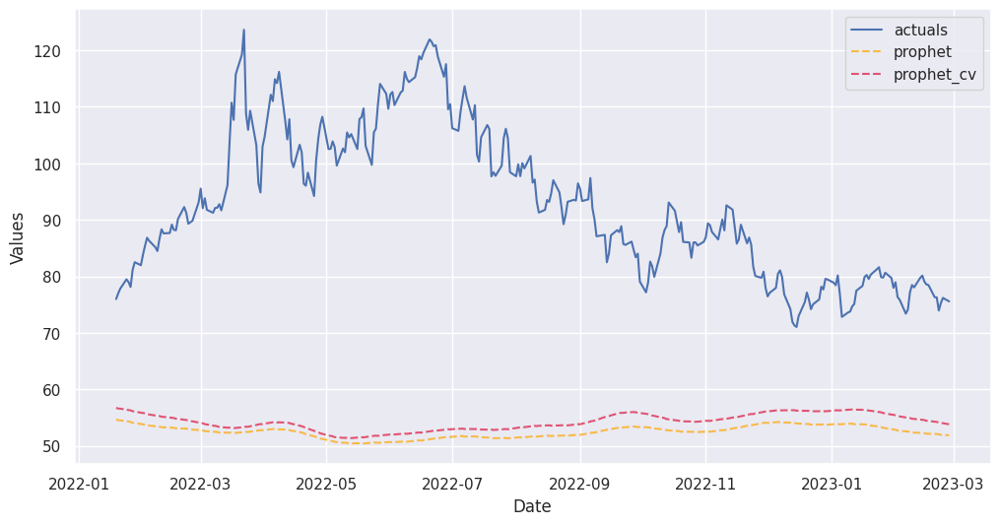

In [ ]:
# plot the cross validated forecast against standard forecast
f.plot_test_set(
    models=[
        "prophet",
        "prophet_cv"
    ],
    include_train=False,
)
plt.show()

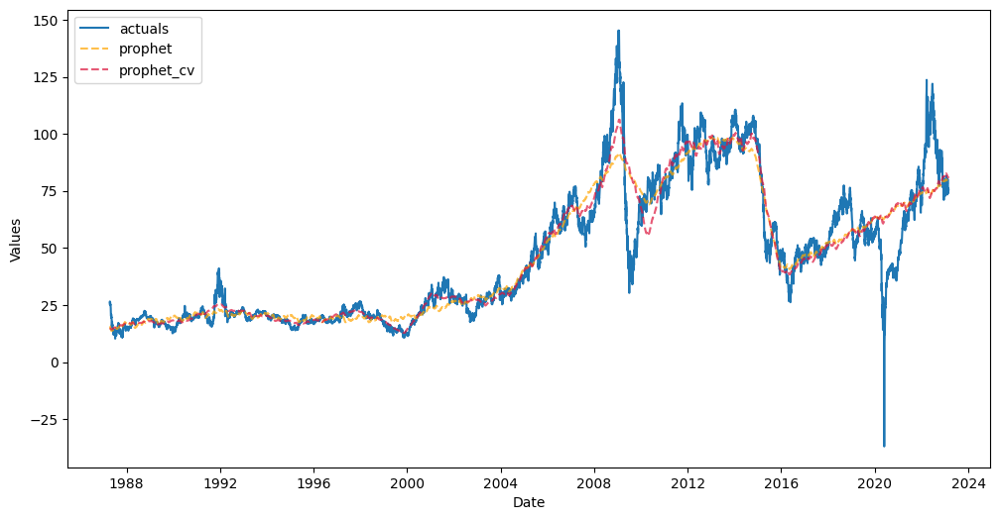

In [ ]:
f.plot_fitted(
    models=[
        "prophet",
        "prophet_cv"
    ],
)
plt.show()

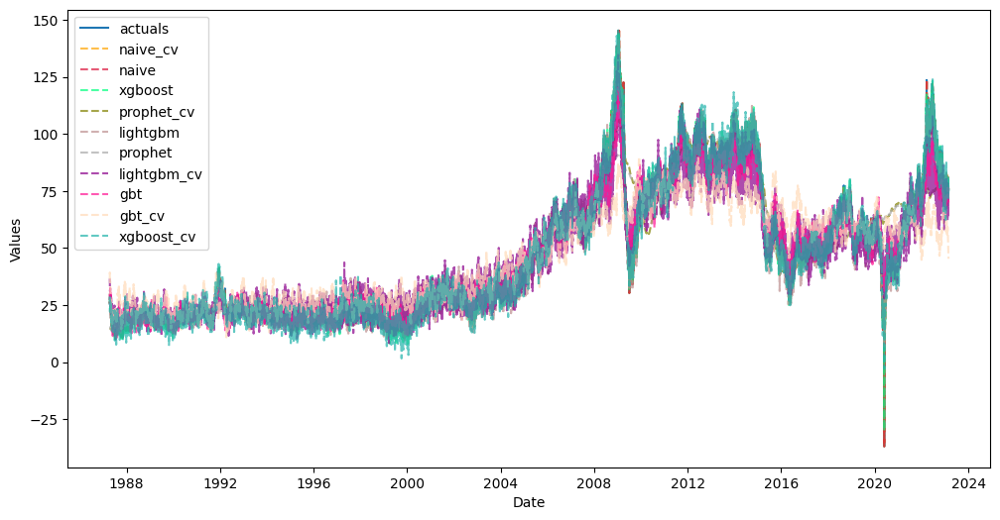

In [ ]:
f.plot_fitted(order_by="TestSetRMSE")
plt.show()

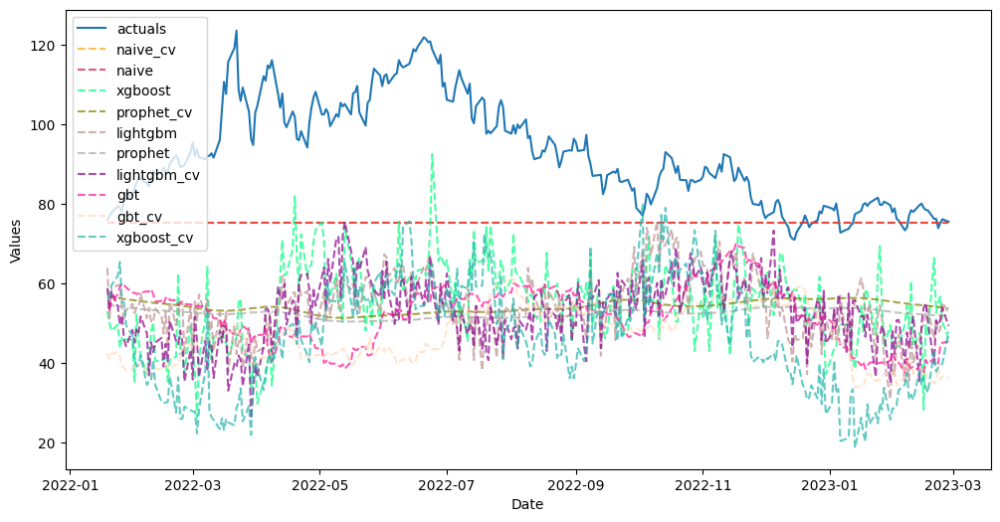

In [ ]:
f.plot_test_set(order_by="TestSetRMSE",include_train=False,)
plt.show()

### 6) HSE

In [ ]:
f.set_estimator('hwes')
f.manual_forecast()

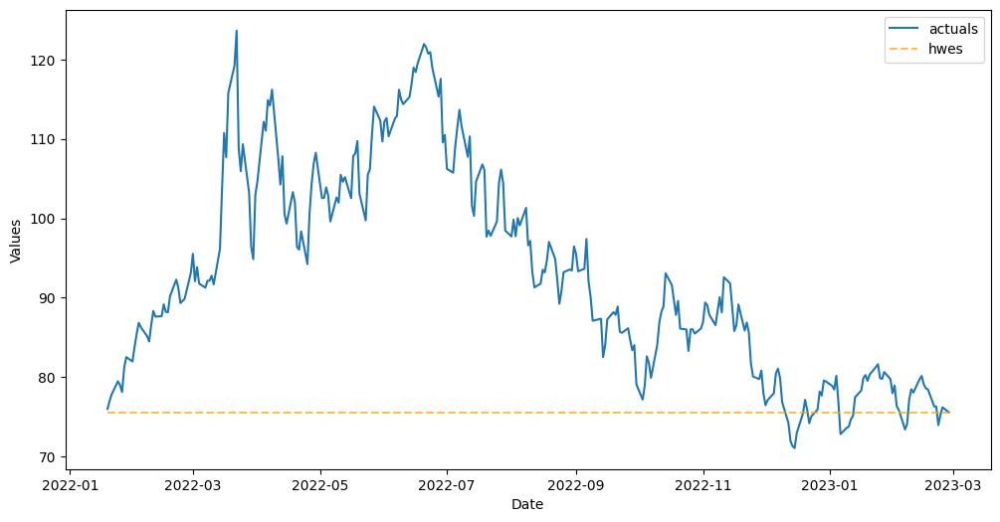

In [ ]:
# plot the test set actuals against the forecasted
f.plot_test_set(
    models=[
        "hwes",
    ],
    include_train=False,
)
plt.show()

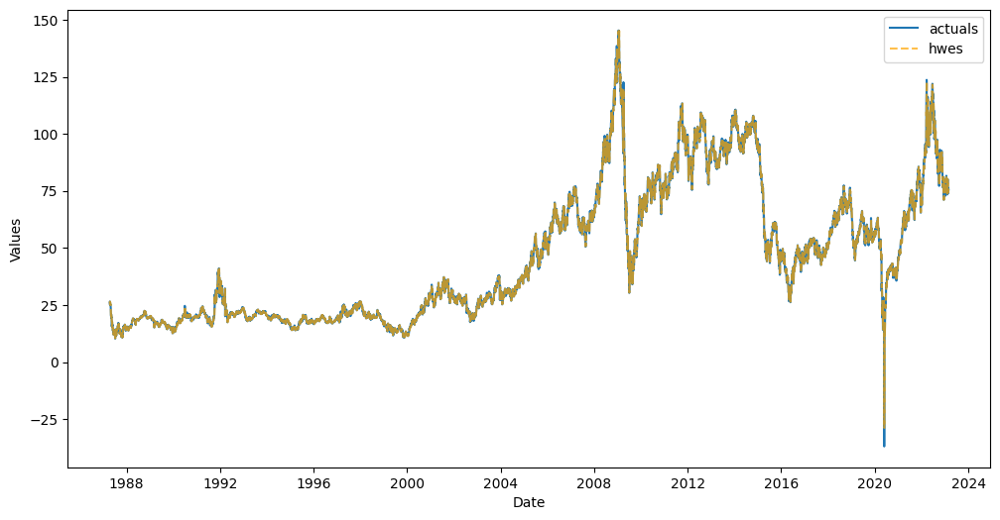

In [ ]:
f.plot_fitted(
    models=[
        "hwes",
    ],
    # include_train=False,
)
plt.show()

In [ ]:
hwes_grid = {
    'trend':['add',None],
    'seasonal':['add',None],
    'use_boxcox':[True,False],
}
f.ingest_grid(hwes_grid)

In [ ]:
f.cross_validate(k=389,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f.auto_forecast(call_me="hwes_cv")

Num hyperparams to try for the hwes model: 8.
Fold 0: Train size: 506 (2020-01-10 00:00:00 - 2021-12-17 00:00:00). Test Size: 22 (2021-12-20 00:00:00 - 2022-01-18 00:00:00). 


Fold 1: Train size: 506 (2019-12-11 00:00:00 - 2021-11-17 00:00:00). Test Size: 22 (2021-11-18 00:00:00 - 2021-12-17 00:00:00). 


Fold 2: Train size: 506 (2019-11-11 00:00:00 - 2021-10-18 00:00:00). Test Size: 22 (2021-10-19 00:00:00 - 2021-11-17 00:00:00). 


Fold 3: Train size: 506 (2019-10-10 00:00:00 - 2021-09-16 00:00:00). Test Size: 22 (2021-09-17 00:00:00 - 2021-10-18 00:00:00). 


Fold 4: Train size: 506 (2019-09-10 00:00:00 - 2021-08-17 00:00:00). Test Size: 22 (2021-08-18 00:00:00 - 2021-09-16 00:00:00). 


Fold 5: Train size: 506 (2019-08-09 00:00:00 - 2021-07-16 00:00:00). Test Size: 22 (2021-07-19 00:00:00 - 2021-08-17 00:00:00). 


Fold 6: Train size: 506 (2019-07-10 00:00:00 - 2021-06-16 00:00:00). Test Size: 22 (2021-06-17 00:00:00 - 2021-07-16 00:00:00). 


Fold 7: Train size: 506 (2019-06-10 00:00:00 - 2021-05-17 00:00:00). Test Size: 22 (2021-05-18 00:00:00 - 2021-06-16 00:00:00). 


Fold 8: Train size: 506 (2019-05-09 00:00:00 - 2021-04-15 00:00:00). Test Size: 22 (2021-04-16 00:00:00 - 2021-05-17 00:00:00). 


Fold 9: Train size: 506 (2019-04-09 00:00:00 - 2021-03-16 00:00:00). Test Size: 22 (2021-03-17 00:00:00 - 2021-04-15 00:00:00). 


Fold 10: Train size: 506 (2019-03-08 00:00:00 - 2021-02-12 00:00:00). Test Size: 22 (2021-02-15 00:00:00 - 2021-03-16 00:00:00). 


Fold 11: Train size: 506 (2019-02-06 00:00:00 - 2021-01-13 00:00:00). Test Size: 22 (2021-01-14 00:00:00 - 2021-02-12 00:00:00). 


Fold 12: Train size: 506 (2019-01-07 00:00:00 - 2020-12-14 00:00:00). Test Size: 22 (2020-12-15 00:00:00 - 2021-01-13 00:00:00). 


Fold 13: Train size: 506 (2018-12-06 00:00:00 - 2020-11-12 00:00:00). Test Size: 22 (2020-11-13 00:00:00 - 2020-12-14 00:00:00). 


Fold 14: Train size: 506 (2018-11-06 00:00:00 - 2020-10-13 00:00:00). Test Size: 22 (2020-10-14 00:00:00 - 2020-11-12 00:00:00). 


Fold 15: Train size: 506 (2018-10-05 00:00:00 - 2020-09-11 00:00:00). Test Size: 22 (2020-09-14 00:00:00 - 2020-10-13 00:00:00). 


Fold 16: Train size: 506 (2018-09-05 00:00:00 - 2020-08-12 00:00:00). Test Size: 22 (2020-08-13 00:00:00 - 2020-09-11 00:00:00). 


Fold 17: Train size: 506 (2018-08-06 00:00:00 - 2020-07-13 00:00:00). Test Size: 22 (2020-07-14 00:00:00 - 2020-08-12 00:00:00). 


Fold 18: Train size: 506 (2018-07-05 00:00:00 - 2020-06-11 00:00:00). Test Size: 22 (2020-06-12 00:00:00 - 2020-07-13 00:00:00). 


Fold 19: Train size: 506 (2018-06-05 00:00:00 - 2020-05-12 00:00:00). Test Size: 22 (2020-05-13 00:00:00 - 2020-06-11 00:00:00). 


Fold 20: Train size: 506 (2018-05-04 00:00:00 - 2020-04-10 00:00:00). Test Size: 22 (2020-04-13 00:00:00 - 2020-05-12 00:00:00). 


Fold 21: Train size: 506 (2018-04-04 00:00:00 - 2020-03-11 00:00:00). Test Size: 22 (2020-03-12 00:00:00 - 2020-04-10 00:00:00). 


Fold 22: Train size: 506 (2018-03-05 00:00:00 - 2020-02-10 00:00:00). Test Size: 22 (2020-02-11 00:00:00 - 2020-03-11 00:00:00). 


Fold 23: Train size: 506 (2018-02-01 00:00:00 - 2020-01-09 00:00:00). Test Size: 22 (2020-01-10 00:00:00 - 2020-02-10 00:00:00). 


Fold 24: Train size: 506 (2018-01-02 00:00:00 - 2019-12-10 00:00:00). Test Size: 22 (2019-12-11 00:00:00 - 2020-01-09 00:00:00). 


Fold 25: Train size: 506 (2017-12-01 00:00:00 - 2019-11-08 00:00:00). Test Size: 22 (2019-11-11 00:00:00 - 2019-12-10 00:00:00). 


Fold 26: Train size: 506 (2017-11-01 00:00:00 - 2019-10-09 00:00:00). Test Size: 22 (2019-10-10 00:00:00 - 2019-11-08 00:00:00). 


Fold 27: Train size: 506 (2017-10-02 00:00:00 - 2019-09-09 00:00:00). Test Size: 22 (2019-09-10 00:00:00 - 2019-10-09 00:00:00). 


Fold 28: Train size: 506 (2017-08-31 00:00:00 - 2019-08-08 00:00:00). Test Size: 22 (2019-08-09 00:00:00 - 2019-09-09 00:00:00). 


Fold 29: Train size: 506 (2017-08-01 00:00:00 - 2019-07-09 00:00:00). Test Size: 22 (2019-07-10 00:00:00 - 2019-08-08 00:00:00). 


Fold 30: Train size: 506 (2017-06-30 00:00:00 - 2019-06-07 00:00:00). Test Size: 22 (2019-06-10 00:00:00 - 2019-07-09 00:00:00). 


Fold 31: Train size: 506 (2017-05-31 00:00:00 - 2019-05-08 00:00:00). Test Size: 22 (2019-05-09 00:00:00 - 2019-06-07 00:00:00). 


Fold 32: Train size: 506 (2017-05-01 00:00:00 - 2019-04-08 00:00:00). Test Size: 22 (2019-04-09 00:00:00 - 2019-05-08 00:00:00). 


Fold 33: Train size: 506 (2017-03-30 00:00:00 - 2019-03-07 00:00:00). Test Size: 22 (2019-03-08 00:00:00 - 2019-04-08 00:00:00). 


Fold 34: Train size: 506 (2017-02-28 00:00:00 - 2019-02-05 00:00:00). Test Size: 22 (2019-02-06 00:00:00 - 2019-03-07 00:00:00). 


Fold 35: Train size: 506 (2017-01-27 00:00:00 - 2019-01-04 00:00:00). Test Size: 22 (2019-01-07 00:00:00 - 2019-02-05 00:00:00). 


Fold 36: Train size: 506 (2016-12-28 00:00:00 - 2018-12-05 00:00:00). Test Size: 22 (2018-12-06 00:00:00 - 2019-01-04 00:00:00). 


Fold 37: Train size: 506 (2016-11-28 00:00:00 - 2018-11-05 00:00:00). Test Size: 22 (2018-11-06 00:00:00 - 2018-12-05 00:00:00). 


Fold 38: Train size: 506 (2016-10-27 00:00:00 - 2018-10-04 00:00:00). Test Size: 22 (2018-10-05 00:00:00 - 2018-11-05 00:00:00). 


Fold 39: Train size: 506 (2016-09-27 00:00:00 - 2018-09-04 00:00:00). Test Size: 22 (2018-09-05 00:00:00 - 2018-10-04 00:00:00). 


Fold 40: Train size: 506 (2016-08-26 00:00:00 - 2018-08-03 00:00:00). Test Size: 22 (2018-08-06 00:00:00 - 2018-09-04 00:00:00). 


Fold 41: Train size: 506 (2016-07-27 00:00:00 - 2018-07-04 00:00:00). Test Size: 22 (2018-07-05 00:00:00 - 2018-08-03 00:00:00). 


Fold 42: Train size: 506 (2016-06-27 00:00:00 - 2018-06-04 00:00:00). Test Size: 22 (2018-06-05 00:00:00 - 2018-07-04 00:00:00). 


Fold 43: Train size: 506 (2016-05-26 00:00:00 - 2018-05-03 00:00:00). Test Size: 22 (2018-05-04 00:00:00 - 2018-06-04 00:00:00). 


Fold 44: Train size: 506 (2016-04-26 00:00:00 - 2018-04-03 00:00:00). Test Size: 22 (2018-04-04 00:00:00 - 2018-05-03 00:00:00). 


Fold 45: Train size: 506 (2016-03-25 00:00:00 - 2018-03-02 00:00:00). Test Size: 22 (2018-03-05 00:00:00 - 2018-04-03 00:00:00). 


Fold 46: Train size: 506 (2016-02-24 00:00:00 - 2018-01-31 00:00:00). Test Size: 22 (2018-02-01 00:00:00 - 2018-03-02 00:00:00). 


Fold 47: Train size: 506 (2016-01-25 00:00:00 - 2018-01-01 00:00:00). Test Size: 22 (2018-01-02 00:00:00 - 2018-01-31 00:00:00). 


Fold 48: Train size: 506 (2015-12-24 00:00:00 - 2017-11-30 00:00:00). Test Size: 22 (2017-12-01 00:00:00 - 2018-01-01 00:00:00). 


Fold 49: Train size: 506 (2015-11-24 00:00:00 - 2017-10-31 00:00:00). Test Size: 22 (2017-11-01 00:00:00 - 2017-11-30 00:00:00). 


Fold 50: Train size: 506 (2015-10-23 00:00:00 - 2017-09-29 00:00:00). Test Size: 22 (2017-10-02 00:00:00 - 2017-10-31 00:00:00). 


Fold 51: Train size: 506 (2015-09-23 00:00:00 - 2017-08-30 00:00:00). Test Size: 22 (2017-08-31 00:00:00 - 2017-09-29 00:00:00). 


Fold 52: Train size: 506 (2015-08-24 00:00:00 - 2017-07-31 00:00:00). Test Size: 22 (2017-08-01 00:00:00 - 2017-08-30 00:00:00). 


Fold 53: Train size: 506 (2015-07-23 00:00:00 - 2017-06-29 00:00:00). Test Size: 22 (2017-06-30 00:00:00 - 2017-07-31 00:00:00). 


Fold 54: Train size: 506 (2015-06-23 00:00:00 - 2017-05-30 00:00:00). Test Size: 22 (2017-05-31 00:00:00 - 2017-06-29 00:00:00). 


Fold 55: Train size: 506 (2015-05-22 00:00:00 - 2017-04-28 00:00:00). Test Size: 22 (2017-05-01 00:00:00 - 2017-05-30 00:00:00). 


Fold 56: Train size: 506 (2015-04-22 00:00:00 - 2017-03-29 00:00:00). Test Size: 22 (2017-03-30 00:00:00 - 2017-04-28 00:00:00). 


Fold 57: Train size: 506 (2015-03-23 00:00:00 - 2017-02-27 00:00:00). Test Size: 22 (2017-02-28 00:00:00 - 2017-03-29 00:00:00). 


Fold 58: Train size: 506 (2015-02-19 00:00:00 - 2017-01-26 00:00:00). Test Size: 22 (2017-01-27 00:00:00 - 2017-02-27 00:00:00). 


Fold 59: Train size: 506 (2015-01-20 00:00:00 - 2016-12-27 00:00:00). Test Size: 22 (2016-12-28 00:00:00 - 2017-01-26 00:00:00). 


Fold 60: Train size: 506 (2014-12-19 00:00:00 - 2016-11-25 00:00:00). Test Size: 22 (2016-11-28 00:00:00 - 2016-12-27 00:00:00). 


Fold 61: Train size: 506 (2014-11-19 00:00:00 - 2016-10-26 00:00:00). Test Size: 22 (2016-10-27 00:00:00 - 2016-11-25 00:00:00). 


Fold 62: Train size: 506 (2014-10-20 00:00:00 - 2016-09-26 00:00:00). Test Size: 22 (2016-09-27 00:00:00 - 2016-10-26 00:00:00). 


Fold 63: Train size: 506 (2014-09-18 00:00:00 - 2016-08-25 00:00:00). Test Size: 22 (2016-08-26 00:00:00 - 2016-09-26 00:00:00). 


Fold 64: Train size: 506 (2014-08-19 00:00:00 - 2016-07-26 00:00:00). Test Size: 22 (2016-07-27 00:00:00 - 2016-08-25 00:00:00). 


Fold 65: Train size: 506 (2014-07-18 00:00:00 - 2016-06-24 00:00:00). Test Size: 22 (2016-06-27 00:00:00 - 2016-07-26 00:00:00). 


Fold 66: Train size: 506 (2014-06-18 00:00:00 - 2016-05-25 00:00:00). Test Size: 22 (2016-05-26 00:00:00 - 2016-06-24 00:00:00). 


Fold 67: Train size: 506 (2014-05-19 00:00:00 - 2016-04-25 00:00:00). Test Size: 22 (2016-04-26 00:00:00 - 2016-05-25 00:00:00). 


Fold 68: Train size: 506 (2014-04-17 00:00:00 - 2016-03-24 00:00:00). Test Size: 22 (2016-03-25 00:00:00 - 2016-04-25 00:00:00). 


Fold 69: Train size: 506 (2014-03-18 00:00:00 - 2016-02-23 00:00:00). Test Size: 22 (2016-02-24 00:00:00 - 2016-03-24 00:00:00). 


Fold 70: Train size: 506 (2014-02-14 00:00:00 - 2016-01-22 00:00:00). Test Size: 22 (2016-01-25 00:00:00 - 2016-02-23 00:00:00). 


Fold 71: Train size: 506 (2014-01-15 00:00:00 - 2015-12-23 00:00:00). Test Size: 22 (2015-12-24 00:00:00 - 2016-01-22 00:00:00). 


Fold 72: Train size: 506 (2013-12-16 00:00:00 - 2015-11-23 00:00:00). Test Size: 22 (2015-11-24 00:00:00 - 2015-12-23 00:00:00). 


Fold 73: Train size: 506 (2013-11-14 00:00:00 - 2015-10-22 00:00:00). Test Size: 22 (2015-10-23 00:00:00 - 2015-11-23 00:00:00). 


Fold 74: Train size: 506 (2013-10-15 00:00:00 - 2015-09-22 00:00:00). Test Size: 22 (2015-09-23 00:00:00 - 2015-10-22 00:00:00). 


Fold 75: Train size: 506 (2013-09-13 00:00:00 - 2015-08-21 00:00:00). Test Size: 22 (2015-08-24 00:00:00 - 2015-09-22 00:00:00). 


Fold 76: Train size: 506 (2013-08-14 00:00:00 - 2015-07-22 00:00:00). Test Size: 22 (2015-07-23 00:00:00 - 2015-08-21 00:00:00). 


Fold 77: Train size: 506 (2013-07-15 00:00:00 - 2015-06-22 00:00:00). Test Size: 22 (2015-06-23 00:00:00 - 2015-07-22 00:00:00). 


Fold 78: Train size: 506 (2013-06-13 00:00:00 - 2015-05-21 00:00:00). Test Size: 22 (2015-05-22 00:00:00 - 2015-06-22 00:00:00). 


Fold 79: Train size: 506 (2013-05-14 00:00:00 - 2015-04-21 00:00:00). Test Size: 22 (2015-04-22 00:00:00 - 2015-05-21 00:00:00). 


Fold 80: Train size: 506 (2013-04-12 00:00:00 - 2015-03-20 00:00:00). Test Size: 22 (2015-03-23 00:00:00 - 2015-04-21 00:00:00). 


Fold 81: Train size: 506 (2013-03-13 00:00:00 - 2015-02-18 00:00:00). Test Size: 22 (2015-02-19 00:00:00 - 2015-03-20 00:00:00). 


Fold 82: Train size: 506 (2013-02-11 00:00:00 - 2015-01-19 00:00:00). Test Size: 22 (2015-01-20 00:00:00 - 2015-02-18 00:00:00). 


Fold 83: Train size: 506 (2013-01-10 00:00:00 - 2014-12-18 00:00:00). Test Size: 22 (2014-12-19 00:00:00 - 2015-01-19 00:00:00). 


Fold 84: Train size: 506 (2012-12-11 00:00:00 - 2014-11-18 00:00:00). Test Size: 22 (2014-11-19 00:00:00 - 2014-12-18 00:00:00). 


Fold 85: Train size: 506 (2012-11-09 00:00:00 - 2014-10-17 00:00:00). Test Size: 22 (2014-10-20 00:00:00 - 2014-11-18 00:00:00). 


Fold 86: Train size: 506 (2012-10-10 00:00:00 - 2014-09-17 00:00:00). Test Size: 22 (2014-09-18 00:00:00 - 2014-10-17 00:00:00). 


Fold 87: Train size: 506 (2012-09-10 00:00:00 - 2014-08-18 00:00:00). Test Size: 22 (2014-08-19 00:00:00 - 2014-09-17 00:00:00). 


Fold 88: Train size: 506 (2012-08-09 00:00:00 - 2014-07-17 00:00:00). Test Size: 22 (2014-07-18 00:00:00 - 2014-08-18 00:00:00). 


Fold 89: Train size: 506 (2012-07-10 00:00:00 - 2014-06-17 00:00:00). Test Size: 22 (2014-06-18 00:00:00 - 2014-07-17 00:00:00). 


Fold 90: Train size: 506 (2012-06-08 00:00:00 - 2014-05-16 00:00:00). Test Size: 22 (2014-05-19 00:00:00 - 2014-06-17 00:00:00). 


Fold 91: Train size: 506 (2012-05-09 00:00:00 - 2014-04-16 00:00:00). Test Size: 22 (2014-04-17 00:00:00 - 2014-05-16 00:00:00). 


Fold 92: Train size: 506 (2012-04-09 00:00:00 - 2014-03-17 00:00:00). Test Size: 22 (2014-03-18 00:00:00 - 2014-04-16 00:00:00). 


Fold 93: Train size: 506 (2012-03-08 00:00:00 - 2014-02-13 00:00:00). Test Size: 22 (2014-02-14 00:00:00 - 2014-03-17 00:00:00). 


Fold 94: Train size: 506 (2012-02-07 00:00:00 - 2014-01-14 00:00:00). Test Size: 22 (2014-01-15 00:00:00 - 2014-02-13 00:00:00). 


Fold 95: Train size: 506 (2012-01-06 00:00:00 - 2013-12-13 00:00:00). Test Size: 22 (2013-12-16 00:00:00 - 2014-01-14 00:00:00). 


Fold 96: Train size: 506 (2011-12-07 00:00:00 - 2013-11-13 00:00:00). Test Size: 22 (2013-11-14 00:00:00 - 2013-12-13 00:00:00). 


Fold 97: Train size: 506 (2011-11-07 00:00:00 - 2013-10-14 00:00:00). Test Size: 22 (2013-10-15 00:00:00 - 2013-11-13 00:00:00). 


Fold 98: Train size: 506 (2011-10-06 00:00:00 - 2013-09-12 00:00:00). Test Size: 22 (2013-09-13 00:00:00 - 2013-10-14 00:00:00). 


Fold 99: Train size: 506 (2011-09-06 00:00:00 - 2013-08-13 00:00:00). Test Size: 22 (2013-08-14 00:00:00 - 2013-09-12 00:00:00). 


Fold 100: Train size: 506 (2011-08-05 00:00:00 - 2013-07-12 00:00:00). Test Size: 22 (2013-07-15 00:00:00 - 2013-08-13 00:00:00). 


Fold 101: Train size: 506 (2011-07-06 00:00:00 - 2013-06-12 00:00:00). Test Size: 22 (2013-06-13 00:00:00 - 2013-07-12 00:00:00). 


Fold 102: Train size: 506 (2011-06-06 00:00:00 - 2013-05-13 00:00:00). Test Size: 22 (2013-05-14 00:00:00 - 2013-06-12 00:00:00). 


Fold 103: Train size: 506 (2011-05-05 00:00:00 - 2013-04-11 00:00:00). Test Size: 22 (2013-04-12 00:00:00 - 2013-05-13 00:00:00). 


Fold 104: Train size: 506 (2011-04-05 00:00:00 - 2013-03-12 00:00:00). Test Size: 22 (2013-03-13 00:00:00 - 2013-04-11 00:00:00). 


Fold 105: Train size: 506 (2011-03-04 00:00:00 - 2013-02-08 00:00:00). Test Size: 22 (2013-02-11 00:00:00 - 2013-03-12 00:00:00). 


Fold 106: Train size: 506 (2011-02-02 00:00:00 - 2013-01-09 00:00:00). Test Size: 22 (2013-01-10 00:00:00 - 2013-02-08 00:00:00). 


Fold 107: Train size: 506 (2011-01-03 00:00:00 - 2012-12-10 00:00:00). Test Size: 22 (2012-12-11 00:00:00 - 2013-01-09 00:00:00). 


Fold 108: Train size: 506 (2010-12-02 00:00:00 - 2012-11-08 00:00:00). Test Size: 22 (2012-11-09 00:00:00 - 2012-12-10 00:00:00). 


Fold 109: Train size: 506 (2010-11-02 00:00:00 - 2012-10-09 00:00:00). Test Size: 22 (2012-10-10 00:00:00 - 2012-11-08 00:00:00). 


Fold 110: Train size: 506 (2010-10-01 00:00:00 - 2012-09-07 00:00:00). Test Size: 22 (2012-09-10 00:00:00 - 2012-10-09 00:00:00). 


Fold 111: Train size: 506 (2010-09-01 00:00:00 - 2012-08-08 00:00:00). Test Size: 22 (2012-08-09 00:00:00 - 2012-09-07 00:00:00). 


Fold 112: Train size: 506 (2010-08-02 00:00:00 - 2012-07-09 00:00:00). Test Size: 22 (2012-07-10 00:00:00 - 2012-08-08 00:00:00). 


Fold 113: Train size: 506 (2010-07-01 00:00:00 - 2012-06-07 00:00:00). Test Size: 22 (2012-06-08 00:00:00 - 2012-07-09 00:00:00). 


Fold 114: Train size: 506 (2010-06-01 00:00:00 - 2012-05-08 00:00:00). Test Size: 22 (2012-05-09 00:00:00 - 2012-06-07 00:00:00). 


Fold 115: Train size: 506 (2010-04-30 00:00:00 - 2012-04-06 00:00:00). Test Size: 22 (2012-04-09 00:00:00 - 2012-05-08 00:00:00). 


Fold 116: Train size: 506 (2010-03-31 00:00:00 - 2012-03-07 00:00:00). Test Size: 22 (2012-03-08 00:00:00 - 2012-04-06 00:00:00). 


Fold 117: Train size: 506 (2010-03-01 00:00:00 - 2012-02-06 00:00:00). Test Size: 22 (2012-02-07 00:00:00 - 2012-03-07 00:00:00). 


Fold 118: Train size: 506 (2010-01-28 00:00:00 - 2012-01-05 00:00:00). Test Size: 22 (2012-01-06 00:00:00 - 2012-02-06 00:00:00). 


Fold 119: Train size: 506 (2009-12-29 00:00:00 - 2011-12-06 00:00:00). Test Size: 22 (2011-12-07 00:00:00 - 2012-01-05 00:00:00). 


Fold 120: Train size: 506 (2009-11-27 00:00:00 - 2011-11-04 00:00:00). Test Size: 22 (2011-11-07 00:00:00 - 2011-12-06 00:00:00). 


Fold 121: Train size: 506 (2009-10-28 00:00:00 - 2011-10-05 00:00:00). Test Size: 22 (2011-10-06 00:00:00 - 2011-11-04 00:00:00). 


Fold 122: Train size: 506 (2009-09-28 00:00:00 - 2011-09-05 00:00:00). Test Size: 22 (2011-09-06 00:00:00 - 2011-10-05 00:00:00). 


Fold 123: Train size: 506 (2009-08-27 00:00:00 - 2011-08-04 00:00:00). Test Size: 22 (2011-08-05 00:00:00 - 2011-09-05 00:00:00). 


Fold 124: Train size: 506 (2009-07-28 00:00:00 - 2011-07-05 00:00:00). Test Size: 22 (2011-07-06 00:00:00 - 2011-08-04 00:00:00). 


Fold 125: Train size: 506 (2009-06-26 00:00:00 - 2011-06-03 00:00:00). Test Size: 22 (2011-06-06 00:00:00 - 2011-07-05 00:00:00). 


Fold 126: Train size: 506 (2009-05-27 00:00:00 - 2011-05-04 00:00:00). Test Size: 22 (2011-05-05 00:00:00 - 2011-06-03 00:00:00). 


Fold 127: Train size: 506 (2009-04-27 00:00:00 - 2011-04-04 00:00:00). Test Size: 22 (2011-04-05 00:00:00 - 2011-05-04 00:00:00). 


Fold 128: Train size: 506 (2009-03-26 00:00:00 - 2011-03-03 00:00:00). Test Size: 22 (2011-03-04 00:00:00 - 2011-04-04 00:00:00). 


Fold 129: Train size: 506 (2009-02-24 00:00:00 - 2011-02-01 00:00:00). Test Size: 22 (2011-02-02 00:00:00 - 2011-03-03 00:00:00). 


Fold 130: Train size: 506 (2009-01-23 00:00:00 - 2010-12-31 00:00:00). Test Size: 22 (2011-01-03 00:00:00 - 2011-02-01 00:00:00). 


Fold 131: Train size: 506 (2008-12-24 00:00:00 - 2010-12-01 00:00:00). Test Size: 22 (2010-12-02 00:00:00 - 2010-12-31 00:00:00). 


Fold 132: Train size: 506 (2008-11-24 00:00:00 - 2010-11-01 00:00:00). Test Size: 22 (2010-11-02 00:00:00 - 2010-12-01 00:00:00). 


Fold 133: Train size: 506 (2008-10-23 00:00:00 - 2010-09-30 00:00:00). Test Size: 22 (2010-10-01 00:00:00 - 2010-11-01 00:00:00). 


Fold 134: Train size: 506 (2008-09-23 00:00:00 - 2010-08-31 00:00:00). Test Size: 22 (2010-09-01 00:00:00 - 2010-09-30 00:00:00). 


Fold 135: Train size: 506 (2008-08-22 00:00:00 - 2010-07-30 00:00:00). Test Size: 22 (2010-08-02 00:00:00 - 2010-08-31 00:00:00). 


Fold 136: Train size: 506 (2008-07-23 00:00:00 - 2010-06-30 00:00:00). Test Size: 22 (2010-07-01 00:00:00 - 2010-07-30 00:00:00). 


Fold 137: Train size: 506 (2008-06-23 00:00:00 - 2010-05-31 00:00:00). Test Size: 22 (2010-06-01 00:00:00 - 2010-06-30 00:00:00). 


Fold 138: Train size: 506 (2008-05-22 00:00:00 - 2010-04-29 00:00:00). Test Size: 22 (2010-04-30 00:00:00 - 2010-05-31 00:00:00). 


Fold 139: Train size: 506 (2008-04-22 00:00:00 - 2010-03-30 00:00:00). Test Size: 22 (2010-03-31 00:00:00 - 2010-04-29 00:00:00). 


Fold 140: Train size: 506 (2008-03-21 00:00:00 - 2010-02-26 00:00:00). Test Size: 22 (2010-03-01 00:00:00 - 2010-03-30 00:00:00). 


Fold 141: Train size: 506 (2008-02-20 00:00:00 - 2010-01-27 00:00:00). Test Size: 22 (2010-01-28 00:00:00 - 2010-02-26 00:00:00). 


Fold 142: Train size: 506 (2008-01-21 00:00:00 - 2009-12-28 00:00:00). Test Size: 22 (2009-12-29 00:00:00 - 2010-01-27 00:00:00). 


Fold 143: Train size: 506 (2007-12-20 00:00:00 - 2009-11-26 00:00:00). Test Size: 22 (2009-11-27 00:00:00 - 2009-12-28 00:00:00). 


Fold 144: Train size: 506 (2007-11-20 00:00:00 - 2009-10-27 00:00:00). Test Size: 22 (2009-10-28 00:00:00 - 2009-11-26 00:00:00). 


Fold 145: Train size: 506 (2007-10-19 00:00:00 - 2009-09-25 00:00:00). Test Size: 22 (2009-09-28 00:00:00 - 2009-10-27 00:00:00). 


Fold 146: Train size: 506 (2007-09-19 00:00:00 - 2009-08-26 00:00:00). Test Size: 22 (2009-08-27 00:00:00 - 2009-09-25 00:00:00). 


Fold 147: Train size: 506 (2007-08-20 00:00:00 - 2009-07-27 00:00:00). Test Size: 22 (2009-07-28 00:00:00 - 2009-08-26 00:00:00). 


Fold 148: Train size: 506 (2007-07-19 00:00:00 - 2009-06-25 00:00:00). Test Size: 22 (2009-06-26 00:00:00 - 2009-07-27 00:00:00). 


Fold 149: Train size: 506 (2007-06-19 00:00:00 - 2009-05-26 00:00:00). Test Size: 22 (2009-05-27 00:00:00 - 2009-06-25 00:00:00). 


Fold 150: Train size: 506 (2007-05-18 00:00:00 - 2009-04-24 00:00:00). Test Size: 22 (2009-04-27 00:00:00 - 2009-05-26 00:00:00). 


Fold 151: Train size: 506 (2007-04-18 00:00:00 - 2009-03-25 00:00:00). Test Size: 22 (2009-03-26 00:00:00 - 2009-04-24 00:00:00). 


Fold 152: Train size: 506 (2007-03-19 00:00:00 - 2009-02-23 00:00:00). Test Size: 22 (2009-02-24 00:00:00 - 2009-03-25 00:00:00). 


Fold 153: Train size: 506 (2007-02-15 00:00:00 - 2009-01-22 00:00:00). Test Size: 22 (2009-01-23 00:00:00 - 2009-02-23 00:00:00). 


Fold 154: Train size: 506 (2007-01-16 00:00:00 - 2008-12-23 00:00:00). Test Size: 22 (2008-12-24 00:00:00 - 2009-01-22 00:00:00). 


Fold 155: Train size: 506 (2006-12-15 00:00:00 - 2008-11-21 00:00:00). Test Size: 22 (2008-11-24 00:00:00 - 2008-12-23 00:00:00). 


Fold 156: Train size: 506 (2006-11-15 00:00:00 - 2008-10-22 00:00:00). Test Size: 22 (2008-10-23 00:00:00 - 2008-11-21 00:00:00). 


Fold 157: Train size: 506 (2006-10-16 00:00:00 - 2008-09-22 00:00:00). Test Size: 22 (2008-09-23 00:00:00 - 2008-10-22 00:00:00). 


Fold 158: Train size: 506 (2006-09-14 00:00:00 - 2008-08-21 00:00:00). Test Size: 22 (2008-08-22 00:00:00 - 2008-09-22 00:00:00). 


Fold 159: Train size: 506 (2006-08-15 00:00:00 - 2008-07-22 00:00:00). Test Size: 22 (2008-07-23 00:00:00 - 2008-08-21 00:00:00). 


Fold 160: Train size: 506 (2006-07-14 00:00:00 - 2008-06-20 00:00:00). Test Size: 22 (2008-06-23 00:00:00 - 2008-07-22 00:00:00). 


Fold 161: Train size: 506 (2006-06-14 00:00:00 - 2008-05-21 00:00:00). Test Size: 22 (2008-05-22 00:00:00 - 2008-06-20 00:00:00). 


Fold 162: Train size: 506 (2006-05-15 00:00:00 - 2008-04-21 00:00:00). Test Size: 22 (2008-04-22 00:00:00 - 2008-05-21 00:00:00). 


Fold 163: Train size: 506 (2006-04-13 00:00:00 - 2008-03-20 00:00:00). Test Size: 22 (2008-03-21 00:00:00 - 2008-04-21 00:00:00). 


Fold 164: Train size: 506 (2006-03-14 00:00:00 - 2008-02-19 00:00:00). Test Size: 22 (2008-02-20 00:00:00 - 2008-03-20 00:00:00). 


Fold 165: Train size: 506 (2006-02-10 00:00:00 - 2008-01-18 00:00:00). Test Size: 22 (2008-01-21 00:00:00 - 2008-02-19 00:00:00). 


Fold 166: Train size: 506 (2006-01-11 00:00:00 - 2007-12-19 00:00:00). Test Size: 22 (2007-12-20 00:00:00 - 2008-01-18 00:00:00). 


Fold 167: Train size: 506 (2005-12-12 00:00:00 - 2007-11-19 00:00:00). Test Size: 22 (2007-11-20 00:00:00 - 2007-12-19 00:00:00). 


Fold 168: Train size: 506 (2005-11-10 00:00:00 - 2007-10-18 00:00:00). Test Size: 22 (2007-10-19 00:00:00 - 2007-11-19 00:00:00). 


Fold 169: Train size: 506 (2005-10-11 00:00:00 - 2007-09-18 00:00:00). Test Size: 22 (2007-09-19 00:00:00 - 2007-10-18 00:00:00). 


Fold 170: Train size: 506 (2005-09-09 00:00:00 - 2007-08-17 00:00:00). Test Size: 22 (2007-08-20 00:00:00 - 2007-09-18 00:00:00). 


Fold 171: Train size: 506 (2005-08-10 00:00:00 - 2007-07-18 00:00:00). Test Size: 22 (2007-07-19 00:00:00 - 2007-08-17 00:00:00). 


Fold 172: Train size: 506 (2005-07-11 00:00:00 - 2007-06-18 00:00:00). Test Size: 22 (2007-06-19 00:00:00 - 2007-07-18 00:00:00). 


Fold 173: Train size: 506 (2005-06-09 00:00:00 - 2007-05-17 00:00:00). Test Size: 22 (2007-05-18 00:00:00 - 2007-06-18 00:00:00). 


Fold 174: Train size: 506 (2005-05-10 00:00:00 - 2007-04-17 00:00:00). Test Size: 22 (2007-04-18 00:00:00 - 2007-05-17 00:00:00). 


Fold 175: Train size: 506 (2005-04-08 00:00:00 - 2007-03-16 00:00:00). Test Size: 22 (2007-03-19 00:00:00 - 2007-04-17 00:00:00). 


Fold 176: Train size: 506 (2005-03-09 00:00:00 - 2007-02-14 00:00:00). Test Size: 22 (2007-02-15 00:00:00 - 2007-03-16 00:00:00). 


Fold 177: Train size: 506 (2005-02-07 00:00:00 - 2007-01-15 00:00:00). Test Size: 22 (2007-01-16 00:00:00 - 2007-02-14 00:00:00). 


Fold 178: Train size: 506 (2005-01-06 00:00:00 - 2006-12-14 00:00:00). Test Size: 22 (2006-12-15 00:00:00 - 2007-01-15 00:00:00). 


Fold 179: Train size: 506 (2004-12-07 00:00:00 - 2006-11-14 00:00:00). Test Size: 22 (2006-11-15 00:00:00 - 2006-12-14 00:00:00). 


Fold 180: Train size: 506 (2004-11-05 00:00:00 - 2006-10-13 00:00:00). Test Size: 22 (2006-10-16 00:00:00 - 2006-11-14 00:00:00). 


Fold 181: Train size: 506 (2004-10-06 00:00:00 - 2006-09-13 00:00:00). Test Size: 22 (2006-09-14 00:00:00 - 2006-10-13 00:00:00). 


Fold 182: Train size: 506 (2004-09-06 00:00:00 - 2006-08-14 00:00:00). Test Size: 22 (2006-08-15 00:00:00 - 2006-09-13 00:00:00). 


Fold 183: Train size: 506 (2004-08-05 00:00:00 - 2006-07-13 00:00:00). Test Size: 22 (2006-07-14 00:00:00 - 2006-08-14 00:00:00). 


Fold 184: Train size: 506 (2004-07-06 00:00:00 - 2006-06-13 00:00:00). Test Size: 22 (2006-06-14 00:00:00 - 2006-07-13 00:00:00). 


Fold 185: Train size: 506 (2004-06-04 00:00:00 - 2006-05-12 00:00:00). Test Size: 22 (2006-05-15 00:00:00 - 2006-06-13 00:00:00). 


Fold 186: Train size: 506 (2004-05-05 00:00:00 - 2006-04-12 00:00:00). Test Size: 22 (2006-04-13 00:00:00 - 2006-05-12 00:00:00). 


Fold 187: Train size: 506 (2004-04-05 00:00:00 - 2006-03-13 00:00:00). Test Size: 22 (2006-03-14 00:00:00 - 2006-04-12 00:00:00). 


Fold 188: Train size: 506 (2004-03-04 00:00:00 - 2006-02-09 00:00:00). Test Size: 22 (2006-02-10 00:00:00 - 2006-03-13 00:00:00). 


Fold 189: Train size: 506 (2004-02-03 00:00:00 - 2006-01-10 00:00:00). Test Size: 22 (2006-01-11 00:00:00 - 2006-02-09 00:00:00). 


Fold 190: Train size: 506 (2004-01-02 00:00:00 - 2005-12-09 00:00:00). Test Size: 22 (2005-12-12 00:00:00 - 2006-01-10 00:00:00). 


Fold 191: Train size: 506 (2003-12-03 00:00:00 - 2005-11-09 00:00:00). Test Size: 22 (2005-11-10 00:00:00 - 2005-12-09 00:00:00). 


Fold 192: Train size: 506 (2003-11-03 00:00:00 - 2005-10-10 00:00:00). Test Size: 22 (2005-10-11 00:00:00 - 2005-11-09 00:00:00). 


Fold 193: Train size: 506 (2003-10-02 00:00:00 - 2005-09-08 00:00:00). Test Size: 22 (2005-09-09 00:00:00 - 2005-10-10 00:00:00). 


Fold 194: Train size: 506 (2003-09-02 00:00:00 - 2005-08-09 00:00:00). Test Size: 22 (2005-08-10 00:00:00 - 2005-09-08 00:00:00). 


Fold 195: Train size: 506 (2003-08-01 00:00:00 - 2005-07-08 00:00:00). Test Size: 22 (2005-07-11 00:00:00 - 2005-08-09 00:00:00). 


Fold 196: Train size: 506 (2003-07-02 00:00:00 - 2005-06-08 00:00:00). Test Size: 22 (2005-06-09 00:00:00 - 2005-07-08 00:00:00). 


Fold 197: Train size: 506 (2003-06-02 00:00:00 - 2005-05-09 00:00:00). Test Size: 22 (2005-05-10 00:00:00 - 2005-06-08 00:00:00). 


Fold 198: Train size: 506 (2003-05-01 00:00:00 - 2005-04-07 00:00:00). Test Size: 22 (2005-04-08 00:00:00 - 2005-05-09 00:00:00). 


Fold 199: Train size: 506 (2003-04-01 00:00:00 - 2005-03-08 00:00:00). Test Size: 22 (2005-03-09 00:00:00 - 2005-04-07 00:00:00). 


Fold 200: Train size: 506 (2003-02-28 00:00:00 - 2005-02-04 00:00:00). Test Size: 22 (2005-02-07 00:00:00 - 2005-03-08 00:00:00). 


Fold 201: Train size: 506 (2003-01-29 00:00:00 - 2005-01-05 00:00:00). Test Size: 22 (2005-01-06 00:00:00 - 2005-02-04 00:00:00). 


Fold 202: Train size: 506 (2002-12-30 00:00:00 - 2004-12-06 00:00:00). Test Size: 22 (2004-12-07 00:00:00 - 2005-01-05 00:00:00). 


Fold 203: Train size: 506 (2002-11-28 00:00:00 - 2004-11-04 00:00:00). Test Size: 22 (2004-11-05 00:00:00 - 2004-12-06 00:00:00). 


Fold 204: Train size: 506 (2002-10-29 00:00:00 - 2004-10-05 00:00:00). Test Size: 22 (2004-10-06 00:00:00 - 2004-11-04 00:00:00). 


Fold 205: Train size: 506 (2002-09-27 00:00:00 - 2004-09-03 00:00:00). Test Size: 22 (2004-09-06 00:00:00 - 2004-10-05 00:00:00). 


Fold 206: Train size: 506 (2002-08-28 00:00:00 - 2004-08-04 00:00:00). Test Size: 22 (2004-08-05 00:00:00 - 2004-09-03 00:00:00). 


Fold 207: Train size: 506 (2002-07-29 00:00:00 - 2004-07-05 00:00:00). Test Size: 22 (2004-07-06 00:00:00 - 2004-08-04 00:00:00). 


Fold 208: Train size: 506 (2002-06-27 00:00:00 - 2004-06-03 00:00:00). Test Size: 22 (2004-06-04 00:00:00 - 2004-07-05 00:00:00). 


Fold 209: Train size: 506 (2002-05-28 00:00:00 - 2004-05-04 00:00:00). Test Size: 22 (2004-05-05 00:00:00 - 2004-06-03 00:00:00). 


Fold 210: Train size: 506 (2002-04-26 00:00:00 - 2004-04-02 00:00:00). Test Size: 22 (2004-04-05 00:00:00 - 2004-05-04 00:00:00). 


Fold 211: Train size: 506 (2002-03-27 00:00:00 - 2004-03-03 00:00:00). Test Size: 22 (2004-03-04 00:00:00 - 2004-04-02 00:00:00). 


Fold 212: Train size: 506 (2002-02-25 00:00:00 - 2004-02-02 00:00:00). Test Size: 22 (2004-02-03 00:00:00 - 2004-03-03 00:00:00). 


Fold 213: Train size: 506 (2002-01-24 00:00:00 - 2004-01-01 00:00:00). Test Size: 22 (2004-01-02 00:00:00 - 2004-02-02 00:00:00). 


Fold 214: Train size: 506 (2001-12-25 00:00:00 - 2003-12-02 00:00:00). Test Size: 22 (2003-12-03 00:00:00 - 2004-01-01 00:00:00). 


Fold 215: Train size: 506 (2001-11-23 00:00:00 - 2003-10-31 00:00:00). Test Size: 22 (2003-11-03 00:00:00 - 2003-12-02 00:00:00). 


Fold 216: Train size: 506 (2001-10-24 00:00:00 - 2003-10-01 00:00:00). Test Size: 22 (2003-10-02 00:00:00 - 2003-10-31 00:00:00). 


Fold 217: Train size: 506 (2001-09-24 00:00:00 - 2003-09-01 00:00:00). Test Size: 22 (2003-09-02 00:00:00 - 2003-10-01 00:00:00). 


Fold 218: Train size: 506 (2001-08-23 00:00:00 - 2003-07-31 00:00:00). Test Size: 22 (2003-08-01 00:00:00 - 2003-09-01 00:00:00). 


Fold 219: Train size: 506 (2001-07-24 00:00:00 - 2003-07-01 00:00:00). Test Size: 22 (2003-07-02 00:00:00 - 2003-07-31 00:00:00). 


Fold 220: Train size: 506 (2001-06-22 00:00:00 - 2003-05-30 00:00:00). Test Size: 22 (2003-06-02 00:00:00 - 2003-07-01 00:00:00). 


Fold 221: Train size: 506 (2001-05-23 00:00:00 - 2003-04-30 00:00:00). Test Size: 22 (2003-05-01 00:00:00 - 2003-05-30 00:00:00). 


Fold 222: Train size: 506 (2001-04-23 00:00:00 - 2003-03-31 00:00:00). Test Size: 22 (2003-04-01 00:00:00 - 2003-04-30 00:00:00). 


Fold 223: Train size: 506 (2001-03-22 00:00:00 - 2003-02-27 00:00:00). Test Size: 22 (2003-02-28 00:00:00 - 2003-03-31 00:00:00). 


Fold 224: Train size: 506 (2001-02-20 00:00:00 - 2003-01-28 00:00:00). Test Size: 22 (2003-01-29 00:00:00 - 2003-02-27 00:00:00). 


Fold 225: Train size: 506 (2001-01-19 00:00:00 - 2002-12-27 00:00:00). Test Size: 22 (2002-12-30 00:00:00 - 2003-01-28 00:00:00). 


Fold 226: Train size: 506 (2000-12-20 00:00:00 - 2002-11-27 00:00:00). Test Size: 22 (2002-11-28 00:00:00 - 2002-12-27 00:00:00). 


Fold 227: Train size: 506 (2000-11-20 00:00:00 - 2002-10-28 00:00:00). Test Size: 22 (2002-10-29 00:00:00 - 2002-11-27 00:00:00). 


Fold 228: Train size: 506 (2000-10-19 00:00:00 - 2002-09-26 00:00:00). Test Size: 22 (2002-09-27 00:00:00 - 2002-10-28 00:00:00). 


Fold 229: Train size: 506 (2000-09-19 00:00:00 - 2002-08-27 00:00:00). Test Size: 22 (2002-08-28 00:00:00 - 2002-09-26 00:00:00). 


Fold 230: Train size: 506 (2000-08-18 00:00:00 - 2002-07-26 00:00:00). Test Size: 22 (2002-07-29 00:00:00 - 2002-08-27 00:00:00). 


Fold 231: Train size: 506 (2000-07-19 00:00:00 - 2002-06-26 00:00:00). Test Size: 22 (2002-06-27 00:00:00 - 2002-07-26 00:00:00). 


Fold 232: Train size: 506 (2000-06-19 00:00:00 - 2002-05-27 00:00:00). Test Size: 22 (2002-05-28 00:00:00 - 2002-06-26 00:00:00). 


Fold 233: Train size: 506 (2000-05-18 00:00:00 - 2002-04-25 00:00:00). Test Size: 22 (2002-04-26 00:00:00 - 2002-05-27 00:00:00). 


Fold 234: Train size: 506 (2000-04-18 00:00:00 - 2002-03-26 00:00:00). Test Size: 22 (2002-03-27 00:00:00 - 2002-04-25 00:00:00). 


Fold 235: Train size: 506 (2000-03-17 00:00:00 - 2002-02-22 00:00:00). Test Size: 22 (2002-02-25 00:00:00 - 2002-03-26 00:00:00). 


Fold 236: Train size: 506 (2000-02-16 00:00:00 - 2002-01-23 00:00:00). Test Size: 22 (2002-01-24 00:00:00 - 2002-02-22 00:00:00). 


Fold 237: Train size: 506 (2000-01-17 00:00:00 - 2001-12-24 00:00:00). Test Size: 22 (2001-12-25 00:00:00 - 2002-01-23 00:00:00). 


Fold 238: Train size: 506 (1999-12-16 00:00:00 - 2001-11-22 00:00:00). Test Size: 22 (2001-11-23 00:00:00 - 2001-12-24 00:00:00). 


Fold 239: Train size: 506 (1999-11-16 00:00:00 - 2001-10-23 00:00:00). Test Size: 22 (2001-10-24 00:00:00 - 2001-11-22 00:00:00). 


Fold 240: Train size: 506 (1999-10-15 00:00:00 - 2001-09-21 00:00:00). Test Size: 22 (2001-09-24 00:00:00 - 2001-10-23 00:00:00). 


Fold 241: Train size: 506 (1999-09-15 00:00:00 - 2001-08-22 00:00:00). Test Size: 22 (2001-08-23 00:00:00 - 2001-09-21 00:00:00). 


Fold 242: Train size: 506 (1999-08-16 00:00:00 - 2001-07-23 00:00:00). Test Size: 22 (2001-07-24 00:00:00 - 2001-08-22 00:00:00). 


Fold 243: Train size: 506 (1999-07-15 00:00:00 - 2001-06-21 00:00:00). Test Size: 22 (2001-06-22 00:00:00 - 2001-07-23 00:00:00). 


Fold 244: Train size: 506 (1999-06-15 00:00:00 - 2001-05-22 00:00:00). Test Size: 22 (2001-05-23 00:00:00 - 2001-06-21 00:00:00). 


Fold 245: Train size: 506 (1999-05-14 00:00:00 - 2001-04-20 00:00:00). Test Size: 22 (2001-04-23 00:00:00 - 2001-05-22 00:00:00). 


Fold 246: Train size: 506 (1999-04-14 00:00:00 - 2001-03-21 00:00:00). Test Size: 22 (2001-03-22 00:00:00 - 2001-04-20 00:00:00). 


Fold 247: Train size: 506 (1999-03-15 00:00:00 - 2001-02-19 00:00:00). Test Size: 22 (2001-02-20 00:00:00 - 2001-03-21 00:00:00). 


Fold 248: Train size: 506 (1999-02-11 00:00:00 - 2001-01-18 00:00:00). Test Size: 22 (2001-01-19 00:00:00 - 2001-02-19 00:00:00). 


Fold 249: Train size: 506 (1999-01-12 00:00:00 - 2000-12-19 00:00:00). Test Size: 22 (2000-12-20 00:00:00 - 2001-01-18 00:00:00). 


Fold 250: Train size: 506 (1998-12-11 00:00:00 - 2000-11-17 00:00:00). Test Size: 22 (2000-11-20 00:00:00 - 2000-12-19 00:00:00). 


Fold 251: Train size: 506 (1998-11-11 00:00:00 - 2000-10-18 00:00:00). Test Size: 22 (2000-10-19 00:00:00 - 2000-11-17 00:00:00). 


Fold 252: Train size: 506 (1998-10-12 00:00:00 - 2000-09-18 00:00:00). Test Size: 22 (2000-09-19 00:00:00 - 2000-10-18 00:00:00). 


Fold 253: Train size: 506 (1998-09-10 00:00:00 - 2000-08-17 00:00:00). Test Size: 22 (2000-08-18 00:00:00 - 2000-09-18 00:00:00). 


Fold 254: Train size: 506 (1998-08-11 00:00:00 - 2000-07-18 00:00:00). Test Size: 22 (2000-07-19 00:00:00 - 2000-08-17 00:00:00). 


Fold 255: Train size: 506 (1998-07-10 00:00:00 - 2000-06-16 00:00:00). Test Size: 22 (2000-06-19 00:00:00 - 2000-07-18 00:00:00). 


Fold 256: Train size: 506 (1998-06-10 00:00:00 - 2000-05-17 00:00:00). Test Size: 22 (2000-05-18 00:00:00 - 2000-06-16 00:00:00). 


Fold 257: Train size: 506 (1998-05-11 00:00:00 - 2000-04-17 00:00:00). Test Size: 22 (2000-04-18 00:00:00 - 2000-05-17 00:00:00). 


Fold 258: Train size: 506 (1998-04-09 00:00:00 - 2000-03-16 00:00:00). Test Size: 22 (2000-03-17 00:00:00 - 2000-04-17 00:00:00). 


Fold 259: Train size: 506 (1998-03-10 00:00:00 - 2000-02-15 00:00:00). Test Size: 22 (2000-02-16 00:00:00 - 2000-03-16 00:00:00). 


Fold 260: Train size: 506 (1998-02-06 00:00:00 - 2000-01-14 00:00:00). Test Size: 22 (2000-01-17 00:00:00 - 2000-02-15 00:00:00). 


Fold 261: Train size: 506 (1998-01-07 00:00:00 - 1999-12-15 00:00:00). Test Size: 22 (1999-12-16 00:00:00 - 2000-01-14 00:00:00). 


Fold 262: Train size: 506 (1997-12-08 00:00:00 - 1999-11-15 00:00:00). Test Size: 22 (1999-11-16 00:00:00 - 1999-12-15 00:00:00). 


Fold 263: Train size: 506 (1997-11-06 00:00:00 - 1999-10-14 00:00:00). Test Size: 22 (1999-10-15 00:00:00 - 1999-11-15 00:00:00). 


Fold 264: Train size: 506 (1997-10-07 00:00:00 - 1999-09-14 00:00:00). Test Size: 22 (1999-09-15 00:00:00 - 1999-10-14 00:00:00). 


Fold 265: Train size: 506 (1997-09-05 00:00:00 - 1999-08-13 00:00:00). Test Size: 22 (1999-08-16 00:00:00 - 1999-09-14 00:00:00). 


Fold 266: Train size: 506 (1997-08-06 00:00:00 - 1999-07-14 00:00:00). Test Size: 22 (1999-07-15 00:00:00 - 1999-08-13 00:00:00). 


Fold 267: Train size: 506 (1997-07-07 00:00:00 - 1999-06-14 00:00:00). Test Size: 22 (1999-06-15 00:00:00 - 1999-07-14 00:00:00). 


Fold 268: Train size: 506 (1997-06-05 00:00:00 - 1999-05-13 00:00:00). Test Size: 22 (1999-05-14 00:00:00 - 1999-06-14 00:00:00). 


Fold 269: Train size: 506 (1997-05-06 00:00:00 - 1999-04-13 00:00:00). Test Size: 22 (1999-04-14 00:00:00 - 1999-05-13 00:00:00). 


Fold 270: Train size: 506 (1997-04-04 00:00:00 - 1999-03-12 00:00:00). Test Size: 22 (1999-03-15 00:00:00 - 1999-04-13 00:00:00). 


Fold 271: Train size: 506 (1997-03-05 00:00:00 - 1999-02-10 00:00:00). Test Size: 22 (1999-02-11 00:00:00 - 1999-03-12 00:00:00). 


Fold 272: Train size: 506 (1997-02-03 00:00:00 - 1999-01-11 00:00:00). Test Size: 22 (1999-01-12 00:00:00 - 1999-02-10 00:00:00). 


Fold 273: Train size: 506 (1997-01-02 00:00:00 - 1998-12-10 00:00:00). Test Size: 22 (1998-12-11 00:00:00 - 1999-01-11 00:00:00). 


Fold 274: Train size: 506 (1996-12-03 00:00:00 - 1998-11-10 00:00:00). Test Size: 22 (1998-11-11 00:00:00 - 1998-12-10 00:00:00). 


Fold 275: Train size: 506 (1996-11-01 00:00:00 - 1998-10-09 00:00:00). Test Size: 22 (1998-10-12 00:00:00 - 1998-11-10 00:00:00). 


Fold 276: Train size: 506 (1996-10-02 00:00:00 - 1998-09-09 00:00:00). Test Size: 22 (1998-09-10 00:00:00 - 1998-10-09 00:00:00). 


Fold 277: Train size: 506 (1996-09-02 00:00:00 - 1998-08-10 00:00:00). Test Size: 22 (1998-08-11 00:00:00 - 1998-09-09 00:00:00). 


Fold 278: Train size: 506 (1996-08-01 00:00:00 - 1998-07-09 00:00:00). Test Size: 22 (1998-07-10 00:00:00 - 1998-08-10 00:00:00). 


Fold 279: Train size: 506 (1996-07-02 00:00:00 - 1998-06-09 00:00:00). Test Size: 22 (1998-06-10 00:00:00 - 1998-07-09 00:00:00). 


Fold 280: Train size: 506 (1996-05-31 00:00:00 - 1998-05-08 00:00:00). Test Size: 22 (1998-05-11 00:00:00 - 1998-06-09 00:00:00). 


Fold 281: Train size: 506 (1996-05-01 00:00:00 - 1998-04-08 00:00:00). Test Size: 22 (1998-04-09 00:00:00 - 1998-05-08 00:00:00). 


Fold 282: Train size: 506 (1996-04-01 00:00:00 - 1998-03-09 00:00:00). Test Size: 22 (1998-03-10 00:00:00 - 1998-04-08 00:00:00). 


Fold 283: Train size: 506 (1996-02-29 00:00:00 - 1998-02-05 00:00:00). Test Size: 22 (1998-02-06 00:00:00 - 1998-03-09 00:00:00). 


Fold 284: Train size: 506 (1996-01-30 00:00:00 - 1998-01-06 00:00:00). Test Size: 22 (1998-01-07 00:00:00 - 1998-02-05 00:00:00). 


Fold 285: Train size: 506 (1995-12-29 00:00:00 - 1997-12-05 00:00:00). Test Size: 22 (1997-12-08 00:00:00 - 1998-01-06 00:00:00). 


Fold 286: Train size: 506 (1995-11-29 00:00:00 - 1997-11-05 00:00:00). Test Size: 22 (1997-11-06 00:00:00 - 1997-12-05 00:00:00). 


Fold 287: Train size: 506 (1995-10-30 00:00:00 - 1997-10-06 00:00:00). Test Size: 22 (1997-10-07 00:00:00 - 1997-11-05 00:00:00). 


Fold 288: Train size: 506 (1995-09-28 00:00:00 - 1997-09-04 00:00:00). Test Size: 22 (1997-09-05 00:00:00 - 1997-10-06 00:00:00). 


Fold 289: Train size: 506 (1995-08-29 00:00:00 - 1997-08-05 00:00:00). Test Size: 22 (1997-08-06 00:00:00 - 1997-09-04 00:00:00). 


Fold 290: Train size: 506 (1995-07-28 00:00:00 - 1997-07-04 00:00:00). Test Size: 22 (1997-07-07 00:00:00 - 1997-08-05 00:00:00). 


Fold 291: Train size: 506 (1995-06-28 00:00:00 - 1997-06-04 00:00:00). Test Size: 22 (1997-06-05 00:00:00 - 1997-07-04 00:00:00). 


Fold 292: Train size: 506 (1995-05-29 00:00:00 - 1997-05-05 00:00:00). Test Size: 22 (1997-05-06 00:00:00 - 1997-06-04 00:00:00). 


Fold 293: Train size: 506 (1995-04-27 00:00:00 - 1997-04-03 00:00:00). Test Size: 22 (1997-04-04 00:00:00 - 1997-05-05 00:00:00). 


Fold 294: Train size: 506 (1995-03-28 00:00:00 - 1997-03-04 00:00:00). Test Size: 22 (1997-03-05 00:00:00 - 1997-04-03 00:00:00). 


Fold 295: Train size: 506 (1995-02-24 00:00:00 - 1997-01-31 00:00:00). Test Size: 22 (1997-02-03 00:00:00 - 1997-03-04 00:00:00). 


Fold 296: Train size: 506 (1995-01-25 00:00:00 - 1997-01-01 00:00:00). Test Size: 22 (1997-01-02 00:00:00 - 1997-01-31 00:00:00). 


Fold 297: Train size: 506 (1994-12-26 00:00:00 - 1996-12-02 00:00:00). Test Size: 22 (1996-12-03 00:00:00 - 1997-01-01 00:00:00). 


Fold 298: Train size: 506 (1994-11-24 00:00:00 - 1996-10-31 00:00:00). Test Size: 22 (1996-11-01 00:00:00 - 1996-12-02 00:00:00). 


Fold 299: Train size: 506 (1994-10-25 00:00:00 - 1996-10-01 00:00:00). Test Size: 22 (1996-10-02 00:00:00 - 1996-10-31 00:00:00). 


Fold 300: Train size: 506 (1994-09-23 00:00:00 - 1996-08-30 00:00:00). Test Size: 22 (1996-09-02 00:00:00 - 1996-10-01 00:00:00). 


Fold 301: Train size: 506 (1994-08-24 00:00:00 - 1996-07-31 00:00:00). Test Size: 22 (1996-08-01 00:00:00 - 1996-08-30 00:00:00). 


Fold 302: Train size: 506 (1994-07-25 00:00:00 - 1996-07-01 00:00:00). Test Size: 22 (1996-07-02 00:00:00 - 1996-07-31 00:00:00). 


Fold 303: Train size: 506 (1994-06-23 00:00:00 - 1996-05-30 00:00:00). Test Size: 22 (1996-05-31 00:00:00 - 1996-07-01 00:00:00). 


Fold 304: Train size: 506 (1994-05-24 00:00:00 - 1996-04-30 00:00:00). Test Size: 22 (1996-05-01 00:00:00 - 1996-05-30 00:00:00). 


Fold 305: Train size: 506 (1994-04-22 00:00:00 - 1996-03-29 00:00:00). Test Size: 22 (1996-04-01 00:00:00 - 1996-04-30 00:00:00). 


Fold 306: Train size: 506 (1994-03-23 00:00:00 - 1996-02-28 00:00:00). Test Size: 22 (1996-02-29 00:00:00 - 1996-03-29 00:00:00). 


Fold 307: Train size: 506 (1994-02-21 00:00:00 - 1996-01-29 00:00:00). Test Size: 22 (1996-01-30 00:00:00 - 1996-02-28 00:00:00). 


Fold 308: Train size: 506 (1994-01-20 00:00:00 - 1995-12-28 00:00:00). Test Size: 22 (1995-12-29 00:00:00 - 1996-01-29 00:00:00). 


Fold 309: Train size: 506 (1993-12-21 00:00:00 - 1995-11-28 00:00:00). Test Size: 22 (1995-11-29 00:00:00 - 1995-12-28 00:00:00). 


Fold 310: Train size: 506 (1993-11-19 00:00:00 - 1995-10-27 00:00:00). Test Size: 22 (1995-10-30 00:00:00 - 1995-11-28 00:00:00). 


Fold 311: Train size: 506 (1993-10-20 00:00:00 - 1995-09-27 00:00:00). Test Size: 22 (1995-09-28 00:00:00 - 1995-10-27 00:00:00). 


Fold 312: Train size: 506 (1993-09-20 00:00:00 - 1995-08-28 00:00:00). Test Size: 22 (1995-08-29 00:00:00 - 1995-09-27 00:00:00). 


Fold 313: Train size: 506 (1993-08-19 00:00:00 - 1995-07-27 00:00:00). Test Size: 22 (1995-07-28 00:00:00 - 1995-08-28 00:00:00). 


Fold 314: Train size: 506 (1993-07-20 00:00:00 - 1995-06-27 00:00:00). Test Size: 22 (1995-06-28 00:00:00 - 1995-07-27 00:00:00). 


Fold 315: Train size: 506 (1993-06-18 00:00:00 - 1995-05-26 00:00:00). Test Size: 22 (1995-05-29 00:00:00 - 1995-06-27 00:00:00). 


Fold 316: Train size: 506 (1993-05-19 00:00:00 - 1995-04-26 00:00:00). Test Size: 22 (1995-04-27 00:00:00 - 1995-05-26 00:00:00). 


Fold 317: Train size: 506 (1993-04-19 00:00:00 - 1995-03-27 00:00:00). Test Size: 22 (1995-03-28 00:00:00 - 1995-04-26 00:00:00). 


Fold 318: Train size: 506 (1993-03-18 00:00:00 - 1995-02-23 00:00:00). Test Size: 22 (1995-02-24 00:00:00 - 1995-03-27 00:00:00). 


Fold 319: Train size: 506 (1993-02-16 00:00:00 - 1995-01-24 00:00:00). Test Size: 22 (1995-01-25 00:00:00 - 1995-02-23 00:00:00). 


Fold 320: Train size: 506 (1993-01-15 00:00:00 - 1994-12-23 00:00:00). Test Size: 22 (1994-12-26 00:00:00 - 1995-01-24 00:00:00). 


Fold 321: Train size: 506 (1992-12-16 00:00:00 - 1994-11-23 00:00:00). Test Size: 22 (1994-11-24 00:00:00 - 1994-12-23 00:00:00). 


Fold 322: Train size: 506 (1992-11-16 00:00:00 - 1994-10-24 00:00:00). Test Size: 22 (1994-10-25 00:00:00 - 1994-11-23 00:00:00). 


Fold 323: Train size: 506 (1992-10-15 00:00:00 - 1994-09-22 00:00:00). Test Size: 22 (1994-09-23 00:00:00 - 1994-10-24 00:00:00). 


Fold 324: Train size: 506 (1992-09-15 00:00:00 - 1994-08-23 00:00:00). Test Size: 22 (1994-08-24 00:00:00 - 1994-09-22 00:00:00). 


Fold 325: Train size: 506 (1992-08-14 00:00:00 - 1994-07-22 00:00:00). Test Size: 22 (1994-07-25 00:00:00 - 1994-08-23 00:00:00). 


Fold 326: Train size: 506 (1992-07-15 00:00:00 - 1994-06-22 00:00:00). Test Size: 22 (1994-06-23 00:00:00 - 1994-07-22 00:00:00). 


Fold 327: Train size: 506 (1992-06-15 00:00:00 - 1994-05-23 00:00:00). Test Size: 22 (1994-05-24 00:00:00 - 1994-06-22 00:00:00). 


Fold 328: Train size: 506 (1992-05-14 00:00:00 - 1994-04-21 00:00:00). Test Size: 22 (1994-04-22 00:00:00 - 1994-05-23 00:00:00). 


Fold 329: Train size: 506 (1992-04-14 00:00:00 - 1994-03-22 00:00:00). Test Size: 22 (1994-03-23 00:00:00 - 1994-04-21 00:00:00). 


Fold 330: Train size: 506 (1992-03-13 00:00:00 - 1994-02-18 00:00:00). Test Size: 22 (1994-02-21 00:00:00 - 1994-03-22 00:00:00). 


Fold 331: Train size: 506 (1992-02-12 00:00:00 - 1994-01-19 00:00:00). Test Size: 22 (1994-01-20 00:00:00 - 1994-02-18 00:00:00). 


Fold 332: Train size: 506 (1992-01-13 00:00:00 - 1993-12-20 00:00:00). Test Size: 22 (1993-12-21 00:00:00 - 1994-01-19 00:00:00). 


Fold 333: Train size: 506 (1991-12-12 00:00:00 - 1993-11-18 00:00:00). Test Size: 22 (1993-11-19 00:00:00 - 1993-12-20 00:00:00). 


Fold 334: Train size: 506 (1991-11-12 00:00:00 - 1993-10-19 00:00:00). Test Size: 22 (1993-10-20 00:00:00 - 1993-11-18 00:00:00). 


Fold 335: Train size: 506 (1991-10-11 00:00:00 - 1993-09-17 00:00:00). Test Size: 22 (1993-09-20 00:00:00 - 1993-10-19 00:00:00). 


Fold 336: Train size: 506 (1991-09-11 00:00:00 - 1993-08-18 00:00:00). Test Size: 22 (1993-08-19 00:00:00 - 1993-09-17 00:00:00). 


Fold 337: Train size: 506 (1991-08-12 00:00:00 - 1993-07-19 00:00:00). Test Size: 22 (1993-07-20 00:00:00 - 1993-08-18 00:00:00). 


Fold 338: Train size: 506 (1991-07-11 00:00:00 - 1993-06-17 00:00:00). Test Size: 22 (1993-06-18 00:00:00 - 1993-07-19 00:00:00). 


Fold 339: Train size: 506 (1991-06-11 00:00:00 - 1993-05-18 00:00:00). Test Size: 22 (1993-05-19 00:00:00 - 1993-06-17 00:00:00). 


Fold 340: Train size: 506 (1991-05-10 00:00:00 - 1993-04-16 00:00:00). Test Size: 22 (1993-04-19 00:00:00 - 1993-05-18 00:00:00). 


Fold 341: Train size: 506 (1991-04-10 00:00:00 - 1993-03-17 00:00:00). Test Size: 22 (1993-03-18 00:00:00 - 1993-04-16 00:00:00). 


Fold 342: Train size: 506 (1991-03-11 00:00:00 - 1993-02-15 00:00:00). Test Size: 22 (1993-02-16 00:00:00 - 1993-03-17 00:00:00). 


Fold 343: Train size: 506 (1991-02-07 00:00:00 - 1993-01-14 00:00:00). Test Size: 22 (1993-01-15 00:00:00 - 1993-02-15 00:00:00). 


Fold 344: Train size: 506 (1991-01-08 00:00:00 - 1992-12-15 00:00:00). Test Size: 22 (1992-12-16 00:00:00 - 1993-01-14 00:00:00). 


Fold 345: Train size: 506 (1990-12-07 00:00:00 - 1992-11-13 00:00:00). Test Size: 22 (1992-11-16 00:00:00 - 1992-12-15 00:00:00). 


Fold 346: Train size: 506 (1990-11-07 00:00:00 - 1992-10-14 00:00:00). Test Size: 22 (1992-10-15 00:00:00 - 1992-11-13 00:00:00). 


Fold 347: Train size: 506 (1990-10-08 00:00:00 - 1992-09-14 00:00:00). Test Size: 22 (1992-09-15 00:00:00 - 1992-10-14 00:00:00). 


Fold 348: Train size: 506 (1990-09-06 00:00:00 - 1992-08-13 00:00:00). Test Size: 22 (1992-08-14 00:00:00 - 1992-09-14 00:00:00). 


Fold 349: Train size: 506 (1990-08-07 00:00:00 - 1992-07-14 00:00:00). Test Size: 22 (1992-07-15 00:00:00 - 1992-08-13 00:00:00). 


Fold 350: Train size: 506 (1990-07-06 00:00:00 - 1992-06-12 00:00:00). Test Size: 22 (1992-06-15 00:00:00 - 1992-07-14 00:00:00). 


Fold 351: Train size: 506 (1990-06-06 00:00:00 - 1992-05-13 00:00:00). Test Size: 22 (1992-05-14 00:00:00 - 1992-06-12 00:00:00). 


Fold 352: Train size: 506 (1990-05-07 00:00:00 - 1992-04-13 00:00:00). Test Size: 22 (1992-04-14 00:00:00 - 1992-05-13 00:00:00). 


Fold 353: Train size: 506 (1990-04-05 00:00:00 - 1992-03-12 00:00:00). Test Size: 22 (1992-03-13 00:00:00 - 1992-04-13 00:00:00). 


Fold 354: Train size: 506 (1990-03-06 00:00:00 - 1992-02-11 00:00:00). Test Size: 22 (1992-02-12 00:00:00 - 1992-03-12 00:00:00). 


Fold 355: Train size: 506 (1990-02-02 00:00:00 - 1992-01-10 00:00:00). Test Size: 22 (1992-01-13 00:00:00 - 1992-02-11 00:00:00). 


Fold 356: Train size: 506 (1990-01-03 00:00:00 - 1991-12-11 00:00:00). Test Size: 22 (1991-12-12 00:00:00 - 1992-01-10 00:00:00). 


Fold 357: Train size: 506 (1989-12-04 00:00:00 - 1991-11-11 00:00:00). Test Size: 22 (1991-11-12 00:00:00 - 1991-12-11 00:00:00). 


Fold 358: Train size: 506 (1989-11-02 00:00:00 - 1991-10-10 00:00:00). Test Size: 22 (1991-10-11 00:00:00 - 1991-11-11 00:00:00). 


Fold 359: Train size: 506 (1989-10-03 00:00:00 - 1991-09-10 00:00:00). Test Size: 22 (1991-09-11 00:00:00 - 1991-10-10 00:00:00). 


Fold 360: Train size: 506 (1989-09-01 00:00:00 - 1991-08-09 00:00:00). Test Size: 22 (1991-08-12 00:00:00 - 1991-09-10 00:00:00). 


Fold 361: Train size: 506 (1989-08-02 00:00:00 - 1991-07-10 00:00:00). Test Size: 22 (1991-07-11 00:00:00 - 1991-08-09 00:00:00). 


Fold 362: Train size: 506 (1989-07-03 00:00:00 - 1991-06-10 00:00:00). Test Size: 22 (1991-06-11 00:00:00 - 1991-07-10 00:00:00). 


Fold 363: Train size: 506 (1989-06-01 00:00:00 - 1991-05-09 00:00:00). Test Size: 22 (1991-05-10 00:00:00 - 1991-06-10 00:00:00). 


Fold 364: Train size: 506 (1989-05-02 00:00:00 - 1991-04-09 00:00:00). Test Size: 22 (1991-04-10 00:00:00 - 1991-05-09 00:00:00). 


Fold 365: Train size: 506 (1989-03-31 00:00:00 - 1991-03-08 00:00:00). Test Size: 22 (1991-03-11 00:00:00 - 1991-04-09 00:00:00). 


Fold 366: Train size: 506 (1989-03-01 00:00:00 - 1991-02-06 00:00:00). Test Size: 22 (1991-02-07 00:00:00 - 1991-03-08 00:00:00). 


Fold 367: Train size: 506 (1989-01-30 00:00:00 - 1991-01-07 00:00:00). Test Size: 22 (1991-01-08 00:00:00 - 1991-02-06 00:00:00). 


Fold 368: Train size: 506 (1988-12-29 00:00:00 - 1990-12-06 00:00:00). Test Size: 22 (1990-12-07 00:00:00 - 1991-01-07 00:00:00). 


Fold 369: Train size: 506 (1988-11-29 00:00:00 - 1990-11-06 00:00:00). Test Size: 22 (1990-11-07 00:00:00 - 1990-12-06 00:00:00). 


Fold 370: Train size: 506 (1988-10-28 00:00:00 - 1990-10-05 00:00:00). Test Size: 22 (1990-10-08 00:00:00 - 1990-11-06 00:00:00). 


Fold 371: Train size: 506 (1988-09-28 00:00:00 - 1990-09-05 00:00:00). Test Size: 22 (1990-09-06 00:00:00 - 1990-10-05 00:00:00). 


Fold 372: Train size: 506 (1988-08-29 00:00:00 - 1990-08-06 00:00:00). Test Size: 22 (1990-08-07 00:00:00 - 1990-09-05 00:00:00). 


Fold 373: Train size: 506 (1988-07-28 00:00:00 - 1990-07-05 00:00:00). Test Size: 22 (1990-07-06 00:00:00 - 1990-08-06 00:00:00). 


Fold 374: Train size: 506 (1988-06-28 00:00:00 - 1990-06-05 00:00:00). Test Size: 22 (1990-06-06 00:00:00 - 1990-07-05 00:00:00). 


Fold 375: Train size: 506 (1988-05-27 00:00:00 - 1990-05-04 00:00:00). Test Size: 22 (1990-05-07 00:00:00 - 1990-06-05 00:00:00). 


Fold 376: Train size: 506 (1988-04-27 00:00:00 - 1990-04-04 00:00:00). Test Size: 22 (1990-04-05 00:00:00 - 1990-05-04 00:00:00). 


Fold 377: Train size: 506 (1988-03-28 00:00:00 - 1990-03-05 00:00:00). Test Size: 22 (1990-03-06 00:00:00 - 1990-04-04 00:00:00). 


Fold 378: Train size: 506 (1988-02-25 00:00:00 - 1990-02-01 00:00:00). Test Size: 22 (1990-02-02 00:00:00 - 1990-03-05 00:00:00). 


Fold 379: Train size: 506 (1988-01-26 00:00:00 - 1990-01-02 00:00:00). Test Size: 22 (1990-01-03 00:00:00 - 1990-02-01 00:00:00). 


Fold 380: Train size: 506 (1987-12-25 00:00:00 - 1989-12-01 00:00:00). Test Size: 22 (1989-12-04 00:00:00 - 1990-01-02 00:00:00). 


Fold 381: Train size: 506 (1987-11-25 00:00:00 - 1989-11-01 00:00:00). Test Size: 22 (1989-11-02 00:00:00 - 1989-12-01 00:00:00). 


Fold 382: Train size: 506 (1987-10-26 00:00:00 - 1989-10-02 00:00:00). Test Size: 22 (1989-10-03 00:00:00 - 1989-11-01 00:00:00). 


Fold 383: Train size: 506 (1987-09-24 00:00:00 - 1989-08-31 00:00:00). Test Size: 22 (1989-09-01 00:00:00 - 1989-10-02 00:00:00). 


Fold 384: Train size: 506 (1987-08-25 00:00:00 - 1989-08-01 00:00:00). Test Size: 22 (1989-08-02 00:00:00 - 1989-08-31 00:00:00). 


Fold 385: Train size: 506 (1987-07-24 00:00:00 - 1989-06-30 00:00:00). Test Size: 22 (1989-07-03 00:00:00 - 1989-08-01 00:00:00). 


Fold 386: Train size: 506 (1987-06-24 00:00:00 - 1989-05-31 00:00:00). Test Size: 22 (1989-06-01 00:00:00 - 1989-06-30 00:00:00). 


Fold 387: Train size: 506 (1987-05-25 00:00:00 - 1989-05-01 00:00:00). Test Size: 22 (1989-05-02 00:00:00 - 1989-05-31 00:00:00). 


Fold 388: Train size: 506 (1987-04-23 00:00:00 - 1989-03-30 00:00:00). Test Size: 22 (1989-03-31 00:00:00 - 1989-05-01 00:00:00). 


Chosen paramaters: {'trend': None, 'seasonal': None, 'use_boxcox': False}.


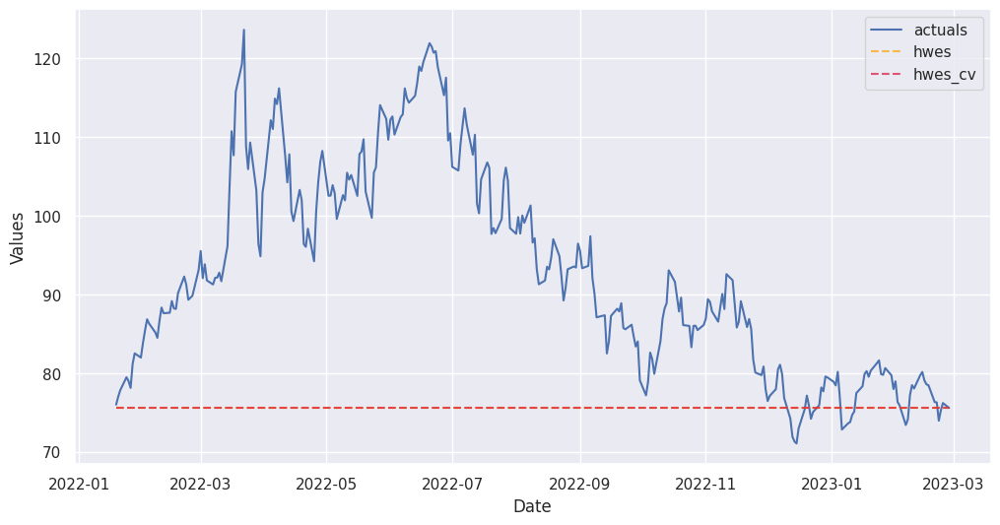

In [ ]:
# plot the cross validated forecast against standard forecast
f.plot_test_set(
    models=[
        "hwes",
        "hwes_cv"
    ],
    include_train=False,
)
plt.show()

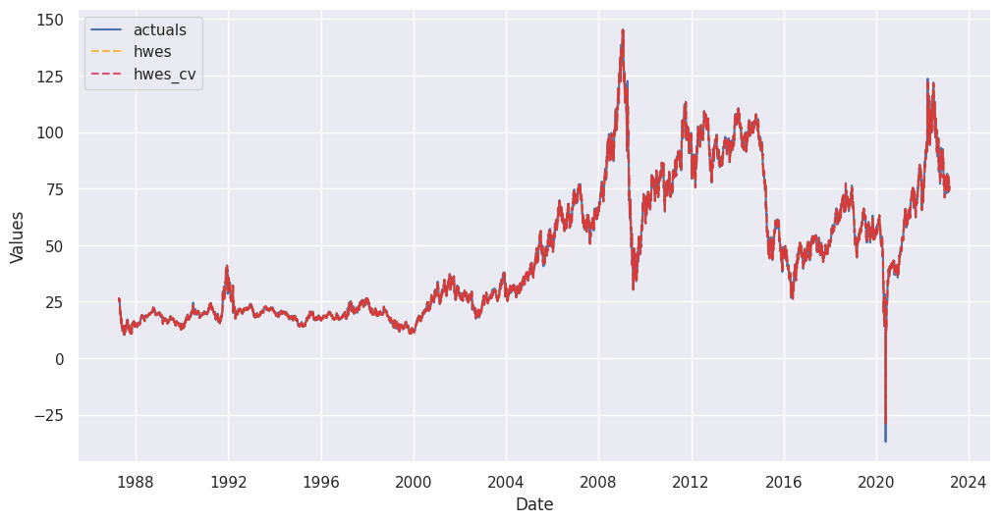

In [ ]:
f.plot_fitted(
    models=[
        "hwes",
        "hwes_cv"
    ],
    # include_train=False,
)
plt.show()

### 7) Silverkite

In [ ]:
f.set_estimator('silverkite')
f.manual_forecast(call_me='silverkite')

Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they. (Deprecated NumPy 1.22)
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they. (Deprecated NumPy 1.22)


In [ ]:
matplotlib.use("nbAgg")
%matplotlib inline
sns.set(rc={'figure.figsize':(12,8)})

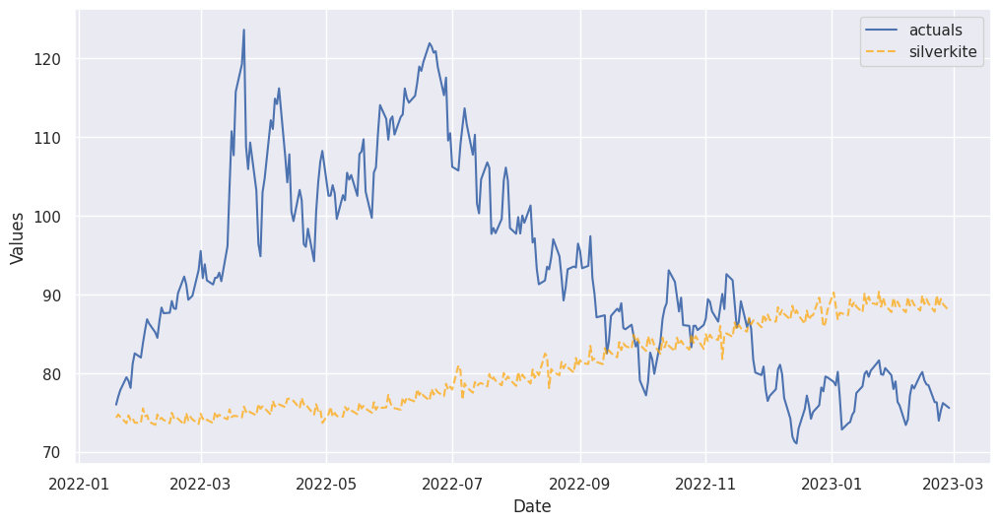

In [ ]:
# plot the test set actuals against the forecasted
f.plot_test_set(
    models=[
        "silverkite",
    ],
    include_train=False,
)
plt.show()

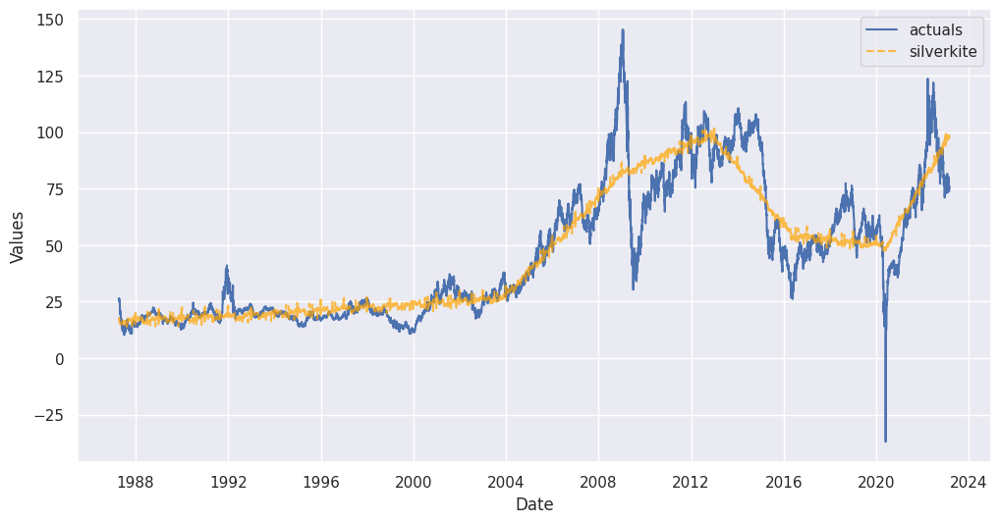

In [ ]:
f.plot_fitted(
    models=[
        "silverkite",
    ],
    # include_train=False,
)
plt.show()

In [ ]:
grid = {'changepoints':range(3,4)}
f.ingest_grid(grid)


In [ ]:
f.cross_validate(k=389,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f.auto_forecast(call_me="silverkite_cv")

In [ ]:
matplotlib.use("nbAgg")
%matplotlib inline
sns.set(rc={'figure.figsize':(12,8)})

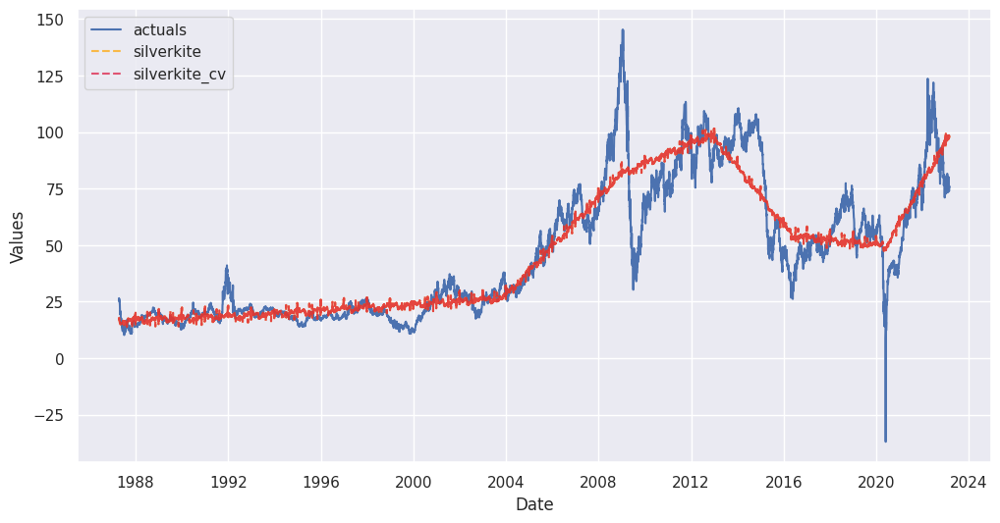

In [ ]:
f.plot_fitted(
    models=[
        "silverkite",
        "silverkite_cv"
    ],
    # include_train=False,
)
plt.show()

### 8) ARIMA

In [ ]:
f.set_estimator('arima')
f.manual_forecast(order=(4, 0, 0),seasonal_order=(0, 1, 1, 12),call_me='arima')

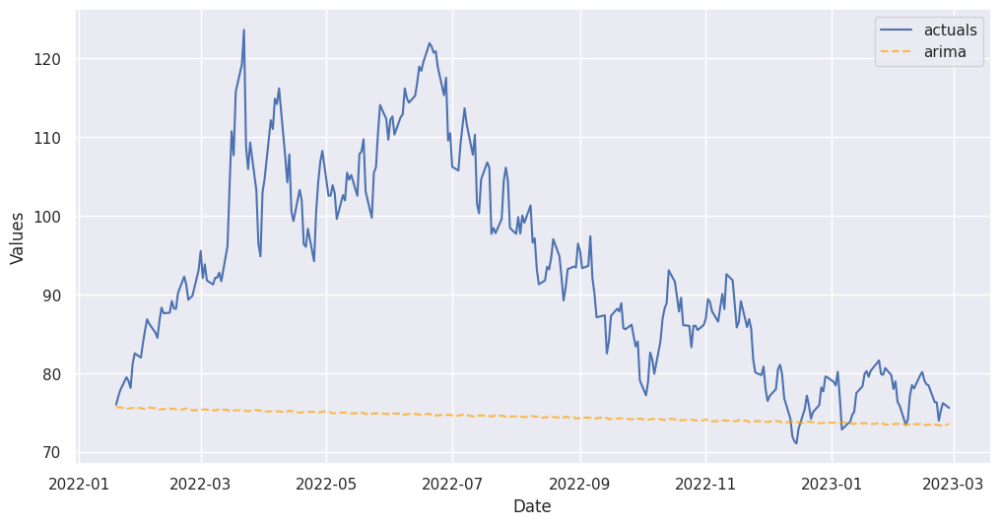

In [ ]:
# plot the test set actuals against the forecasted
f.plot_test_set(
    models=[
        "arima",
    ],
    include_train=False,
)
plt.show()

In [ ]:
grid = {
    'order':[
        (4, 0, 0)
    ],
    'seasonal_order':[
        (0, 1, 1, 12)
    ],
}

f.ingest_grid(grid)

In [ ]:
f.cross_validate(k=389,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f.auto_forecast(call_me="arima_cv")

Num hyperparams to try for the arima model: 1.
Fold 0: Train size: 506 (2020-01-10 00:00:00 - 2021-12-17 00:00:00). Test Size: 22 (2021-12-20 00:00:00 - 2022-01-18 00:00:00). 


Fold 1: Train size: 506 (2019-12-11 00:00:00 - 2021-11-17 00:00:00). Test Size: 22 (2021-11-18 00:00:00 - 2021-12-17 00:00:00). 


Fold 2: Train size: 506 (2019-11-11 00:00:00 - 2021-10-18 00:00:00). Test Size: 22 (2021-10-19 00:00:00 - 2021-11-17 00:00:00). 


Fold 3: Train size: 506 (2019-10-10 00:00:00 - 2021-09-16 00:00:00). Test Size: 22 (2021-09-17 00:00:00 - 2021-10-18 00:00:00). 


Fold 4: Train size: 506 (2019-09-10 00:00:00 - 2021-08-17 00:00:00). Test Size: 22 (2021-08-18 00:00:00 - 2021-09-16 00:00:00). 


Fold 5: Train size: 506 (2019-08-09 00:00:00 - 2021-07-16 00:00:00). Test Size: 22 (2021-07-19 00:00:00 - 2021-08-17 00:00:00). 


Fold 6: Train size: 506 (2019-07-10 00:00:00 - 2021-06-16 00:00:00). Test Size: 22 (2021-06-17 00:00:00 - 2021-07-16 00:00:00). 


Fold 7: Train size: 506 (2019-06-10 00:00:00 - 2021-05-17 00:00:00). Test Size: 22 (2021-05-18 00:00:00 - 2021-06-16 00:00:00). 


Fold 8: Train size: 506 (2019-05-09 00:00:00 - 2021-04-15 00:00:00). Test Size: 22 (2021-04-16 00:00:00 - 2021-05-17 00:00:00). 


Fold 9: Train size: 506 (2019-04-09 00:00:00 - 2021-03-16 00:00:00). Test Size: 22 (2021-03-17 00:00:00 - 2021-04-15 00:00:00). 


Fold 10: Train size: 506 (2019-03-08 00:00:00 - 2021-02-12 00:00:00). Test Size: 22 (2021-02-15 00:00:00 - 2021-03-16 00:00:00). 


Fold 11: Train size: 506 (2019-02-06 00:00:00 - 2021-01-13 00:00:00). Test Size: 22 (2021-01-14 00:00:00 - 2021-02-12 00:00:00). 


Fold 12: Train size: 506 (2019-01-07 00:00:00 - 2020-12-14 00:00:00). Test Size: 22 (2020-12-15 00:00:00 - 2021-01-13 00:00:00). 


Fold 13: Train size: 506 (2018-12-06 00:00:00 - 2020-11-12 00:00:00). Test Size: 22 (2020-11-13 00:00:00 - 2020-12-14 00:00:00). 


Fold 14: Train size: 506 (2018-11-06 00:00:00 - 2020-10-13 00:00:00). Test Size: 22 (2020-10-14 00:00:00 - 2020-11-12 00:00:00). 


Fold 15: Train size: 506 (2018-10-05 00:00:00 - 2020-09-11 00:00:00). Test Size: 22 (2020-09-14 00:00:00 - 2020-10-13 00:00:00). 


Fold 16: Train size: 506 (2018-09-05 00:00:00 - 2020-08-12 00:00:00). Test Size: 22 (2020-08-13 00:00:00 - 2020-09-11 00:00:00). 


Fold 17: Train size: 506 (2018-08-06 00:00:00 - 2020-07-13 00:00:00). Test Size: 22 (2020-07-14 00:00:00 - 2020-08-12 00:00:00). 


Fold 18: Train size: 506 (2018-07-05 00:00:00 - 2020-06-11 00:00:00). Test Size: 22 (2020-06-12 00:00:00 - 2020-07-13 00:00:00). 


Fold 19: Train size: 506 (2018-06-05 00:00:00 - 2020-05-12 00:00:00). Test Size: 22 (2020-05-13 00:00:00 - 2020-06-11 00:00:00). 


Fold 20: Train size: 506 (2018-05-04 00:00:00 - 2020-04-10 00:00:00). Test Size: 22 (2020-04-13 00:00:00 - 2020-05-12 00:00:00). 


Fold 21: Train size: 506 (2018-04-04 00:00:00 - 2020-03-11 00:00:00). Test Size: 22 (2020-03-12 00:00:00 - 2020-04-10 00:00:00). 


Fold 22: Train size: 506 (2018-03-05 00:00:00 - 2020-02-10 00:00:00). Test Size: 22 (2020-02-11 00:00:00 - 2020-03-11 00:00:00). 


Fold 23: Train size: 506 (2018-02-01 00:00:00 - 2020-01-09 00:00:00). Test Size: 22 (2020-01-10 00:00:00 - 2020-02-10 00:00:00). 


Fold 24: Train size: 506 (2018-01-02 00:00:00 - 2019-12-10 00:00:00). Test Size: 22 (2019-12-11 00:00:00 - 2020-01-09 00:00:00). 


Fold 25: Train size: 506 (2017-12-01 00:00:00 - 2019-11-08 00:00:00). Test Size: 22 (2019-11-11 00:00:00 - 2019-12-10 00:00:00). 


Fold 26: Train size: 506 (2017-11-01 00:00:00 - 2019-10-09 00:00:00). Test Size: 22 (2019-10-10 00:00:00 - 2019-11-08 00:00:00). 


Fold 27: Train size: 506 (2017-10-02 00:00:00 - 2019-09-09 00:00:00). Test Size: 22 (2019-09-10 00:00:00 - 2019-10-09 00:00:00). 


Fold 28: Train size: 506 (2017-08-31 00:00:00 - 2019-08-08 00:00:00). Test Size: 22 (2019-08-09 00:00:00 - 2019-09-09 00:00:00). 


Fold 29: Train size: 506 (2017-08-01 00:00:00 - 2019-07-09 00:00:00). Test Size: 22 (2019-07-10 00:00:00 - 2019-08-08 00:00:00). 


Fold 30: Train size: 506 (2017-06-30 00:00:00 - 2019-06-07 00:00:00). Test Size: 22 (2019-06-10 00:00:00 - 2019-07-09 00:00:00). 


Fold 31: Train size: 506 (2017-05-31 00:00:00 - 2019-05-08 00:00:00). Test Size: 22 (2019-05-09 00:00:00 - 2019-06-07 00:00:00). 


Fold 32: Train size: 506 (2017-05-01 00:00:00 - 2019-04-08 00:00:00). Test Size: 22 (2019-04-09 00:00:00 - 2019-05-08 00:00:00). 


Fold 33: Train size: 506 (2017-03-30 00:00:00 - 2019-03-07 00:00:00). Test Size: 22 (2019-03-08 00:00:00 - 2019-04-08 00:00:00). 


Fold 34: Train size: 506 (2017-02-28 00:00:00 - 2019-02-05 00:00:00). Test Size: 22 (2019-02-06 00:00:00 - 2019-03-07 00:00:00). 


Fold 35: Train size: 506 (2017-01-27 00:00:00 - 2019-01-04 00:00:00). Test Size: 22 (2019-01-07 00:00:00 - 2019-02-05 00:00:00). 


Fold 36: Train size: 506 (2016-12-28 00:00:00 - 2018-12-05 00:00:00). Test Size: 22 (2018-12-06 00:00:00 - 2019-01-04 00:00:00). 


Fold 37: Train size: 506 (2016-11-28 00:00:00 - 2018-11-05 00:00:00). Test Size: 22 (2018-11-06 00:00:00 - 2018-12-05 00:00:00). 


Fold 38: Train size: 506 (2016-10-27 00:00:00 - 2018-10-04 00:00:00). Test Size: 22 (2018-10-05 00:00:00 - 2018-11-05 00:00:00). 


Fold 39: Train size: 506 (2016-09-27 00:00:00 - 2018-09-04 00:00:00). Test Size: 22 (2018-09-05 00:00:00 - 2018-10-04 00:00:00). 


Fold 40: Train size: 506 (2016-08-26 00:00:00 - 2018-08-03 00:00:00). Test Size: 22 (2018-08-06 00:00:00 - 2018-09-04 00:00:00). 


Fold 41: Train size: 506 (2016-07-27 00:00:00 - 2018-07-04 00:00:00). Test Size: 22 (2018-07-05 00:00:00 - 2018-08-03 00:00:00). 


Fold 42: Train size: 506 (2016-06-27 00:00:00 - 2018-06-04 00:00:00). Test Size: 22 (2018-06-05 00:00:00 - 2018-07-04 00:00:00). 


Fold 43: Train size: 506 (2016-05-26 00:00:00 - 2018-05-03 00:00:00). Test Size: 22 (2018-05-04 00:00:00 - 2018-06-04 00:00:00). 


Fold 44: Train size: 506 (2016-04-26 00:00:00 - 2018-04-03 00:00:00). Test Size: 22 (2018-04-04 00:00:00 - 2018-05-03 00:00:00). 


Fold 45: Train size: 506 (2016-03-25 00:00:00 - 2018-03-02 00:00:00). Test Size: 22 (2018-03-05 00:00:00 - 2018-04-03 00:00:00). 


Fold 46: Train size: 506 (2016-02-24 00:00:00 - 2018-01-31 00:00:00). Test Size: 22 (2018-02-01 00:00:00 - 2018-03-02 00:00:00). 


Fold 47: Train size: 506 (2016-01-25 00:00:00 - 2018-01-01 00:00:00). Test Size: 22 (2018-01-02 00:00:00 - 2018-01-31 00:00:00). 


Fold 48: Train size: 506 (2015-12-24 00:00:00 - 2017-11-30 00:00:00). Test Size: 22 (2017-12-01 00:00:00 - 2018-01-01 00:00:00). 


Fold 49: Train size: 506 (2015-11-24 00:00:00 - 2017-10-31 00:00:00). Test Size: 22 (2017-11-01 00:00:00 - 2017-11-30 00:00:00). 


Fold 50: Train size: 506 (2015-10-23 00:00:00 - 2017-09-29 00:00:00). Test Size: 22 (2017-10-02 00:00:00 - 2017-10-31 00:00:00). 


Fold 51: Train size: 506 (2015-09-23 00:00:00 - 2017-08-30 00:00:00). Test Size: 22 (2017-08-31 00:00:00 - 2017-09-29 00:00:00). 


Fold 52: Train size: 506 (2015-08-24 00:00:00 - 2017-07-31 00:00:00). Test Size: 22 (2017-08-01 00:00:00 - 2017-08-30 00:00:00). 


Fold 53: Train size: 506 (2015-07-23 00:00:00 - 2017-06-29 00:00:00). Test Size: 22 (2017-06-30 00:00:00 - 2017-07-31 00:00:00). 


Fold 54: Train size: 506 (2015-06-23 00:00:00 - 2017-05-30 00:00:00). Test Size: 22 (2017-05-31 00:00:00 - 2017-06-29 00:00:00). 


Fold 55: Train size: 506 (2015-05-22 00:00:00 - 2017-04-28 00:00:00). Test Size: 22 (2017-05-01 00:00:00 - 2017-05-30 00:00:00). 


Fold 56: Train size: 506 (2015-04-22 00:00:00 - 2017-03-29 00:00:00). Test Size: 22 (2017-03-30 00:00:00 - 2017-04-28 00:00:00). 


Fold 57: Train size: 506 (2015-03-23 00:00:00 - 2017-02-27 00:00:00). Test Size: 22 (2017-02-28 00:00:00 - 2017-03-29 00:00:00). 


Fold 58: Train size: 506 (2015-02-19 00:00:00 - 2017-01-26 00:00:00). Test Size: 22 (2017-01-27 00:00:00 - 2017-02-27 00:00:00). 


Fold 59: Train size: 506 (2015-01-20 00:00:00 - 2016-12-27 00:00:00). Test Size: 22 (2016-12-28 00:00:00 - 2017-01-26 00:00:00). 


Fold 60: Train size: 506 (2014-12-19 00:00:00 - 2016-11-25 00:00:00). Test Size: 22 (2016-11-28 00:00:00 - 2016-12-27 00:00:00). 


Fold 61: Train size: 506 (2014-11-19 00:00:00 - 2016-10-26 00:00:00). Test Size: 22 (2016-10-27 00:00:00 - 2016-11-25 00:00:00). 


Fold 62: Train size: 506 (2014-10-20 00:00:00 - 2016-09-26 00:00:00). Test Size: 22 (2016-09-27 00:00:00 - 2016-10-26 00:00:00). 


Fold 63: Train size: 506 (2014-09-18 00:00:00 - 2016-08-25 00:00:00). Test Size: 22 (2016-08-26 00:00:00 - 2016-09-26 00:00:00). 


Fold 64: Train size: 506 (2014-08-19 00:00:00 - 2016-07-26 00:00:00). Test Size: 22 (2016-07-27 00:00:00 - 2016-08-25 00:00:00). 


Fold 65: Train size: 506 (2014-07-18 00:00:00 - 2016-06-24 00:00:00). Test Size: 22 (2016-06-27 00:00:00 - 2016-07-26 00:00:00). 


Fold 66: Train size: 506 (2014-06-18 00:00:00 - 2016-05-25 00:00:00). Test Size: 22 (2016-05-26 00:00:00 - 2016-06-24 00:00:00). 


Fold 67: Train size: 506 (2014-05-19 00:00:00 - 2016-04-25 00:00:00). Test Size: 22 (2016-04-26 00:00:00 - 2016-05-25 00:00:00). 


Fold 68: Train size: 506 (2014-04-17 00:00:00 - 2016-03-24 00:00:00). Test Size: 22 (2016-03-25 00:00:00 - 2016-04-25 00:00:00). 


Fold 69: Train size: 506 (2014-03-18 00:00:00 - 2016-02-23 00:00:00). Test Size: 22 (2016-02-24 00:00:00 - 2016-03-24 00:00:00). 


Fold 70: Train size: 506 (2014-02-14 00:00:00 - 2016-01-22 00:00:00). Test Size: 22 (2016-01-25 00:00:00 - 2016-02-23 00:00:00). 


Fold 71: Train size: 506 (2014-01-15 00:00:00 - 2015-12-23 00:00:00). Test Size: 22 (2015-12-24 00:00:00 - 2016-01-22 00:00:00). 


Fold 72: Train size: 506 (2013-12-16 00:00:00 - 2015-11-23 00:00:00). Test Size: 22 (2015-11-24 00:00:00 - 2015-12-23 00:00:00). 


Fold 73: Train size: 506 (2013-11-14 00:00:00 - 2015-10-22 00:00:00). Test Size: 22 (2015-10-23 00:00:00 - 2015-11-23 00:00:00). 


Fold 74: Train size: 506 (2013-10-15 00:00:00 - 2015-09-22 00:00:00). Test Size: 22 (2015-09-23 00:00:00 - 2015-10-22 00:00:00). 


Fold 75: Train size: 506 (2013-09-13 00:00:00 - 2015-08-21 00:00:00). Test Size: 22 (2015-08-24 00:00:00 - 2015-09-22 00:00:00). 


Fold 76: Train size: 506 (2013-08-14 00:00:00 - 2015-07-22 00:00:00). Test Size: 22 (2015-07-23 00:00:00 - 2015-08-21 00:00:00). 


Fold 77: Train size: 506 (2013-07-15 00:00:00 - 2015-06-22 00:00:00). Test Size: 22 (2015-06-23 00:00:00 - 2015-07-22 00:00:00). 


Fold 78: Train size: 506 (2013-06-13 00:00:00 - 2015-05-21 00:00:00). Test Size: 22 (2015-05-22 00:00:00 - 2015-06-22 00:00:00). 


Fold 79: Train size: 506 (2013-05-14 00:00:00 - 2015-04-21 00:00:00). Test Size: 22 (2015-04-22 00:00:00 - 2015-05-21 00:00:00). 


Fold 80: Train size: 506 (2013-04-12 00:00:00 - 2015-03-20 00:00:00). Test Size: 22 (2015-03-23 00:00:00 - 2015-04-21 00:00:00). 


Fold 81: Train size: 506 (2013-03-13 00:00:00 - 2015-02-18 00:00:00). Test Size: 22 (2015-02-19 00:00:00 - 2015-03-20 00:00:00). 


Fold 82: Train size: 506 (2013-02-11 00:00:00 - 2015-01-19 00:00:00). Test Size: 22 (2015-01-20 00:00:00 - 2015-02-18 00:00:00). 


Fold 83: Train size: 506 (2013-01-10 00:00:00 - 2014-12-18 00:00:00). Test Size: 22 (2014-12-19 00:00:00 - 2015-01-19 00:00:00). 


Fold 84: Train size: 506 (2012-12-11 00:00:00 - 2014-11-18 00:00:00). Test Size: 22 (2014-11-19 00:00:00 - 2014-12-18 00:00:00). 


Fold 85: Train size: 506 (2012-11-09 00:00:00 - 2014-10-17 00:00:00). Test Size: 22 (2014-10-20 00:00:00 - 2014-11-18 00:00:00). 


Fold 86: Train size: 506 (2012-10-10 00:00:00 - 2014-09-17 00:00:00). Test Size: 22 (2014-09-18 00:00:00 - 2014-10-17 00:00:00). 


Fold 87: Train size: 506 (2012-09-10 00:00:00 - 2014-08-18 00:00:00). Test Size: 22 (2014-08-19 00:00:00 - 2014-09-17 00:00:00). 


Fold 88: Train size: 506 (2012-08-09 00:00:00 - 2014-07-17 00:00:00). Test Size: 22 (2014-07-18 00:00:00 - 2014-08-18 00:00:00). 


Fold 89: Train size: 506 (2012-07-10 00:00:00 - 2014-06-17 00:00:00). Test Size: 22 (2014-06-18 00:00:00 - 2014-07-17 00:00:00). 


Fold 90: Train size: 506 (2012-06-08 00:00:00 - 2014-05-16 00:00:00). Test Size: 22 (2014-05-19 00:00:00 - 2014-06-17 00:00:00). 


Fold 91: Train size: 506 (2012-05-09 00:00:00 - 2014-04-16 00:00:00). Test Size: 22 (2014-04-17 00:00:00 - 2014-05-16 00:00:00). 


Fold 92: Train size: 506 (2012-04-09 00:00:00 - 2014-03-17 00:00:00). Test Size: 22 (2014-03-18 00:00:00 - 2014-04-16 00:00:00). 


Fold 93: Train size: 506 (2012-03-08 00:00:00 - 2014-02-13 00:00:00). Test Size: 22 (2014-02-14 00:00:00 - 2014-03-17 00:00:00). 


Fold 94: Train size: 506 (2012-02-07 00:00:00 - 2014-01-14 00:00:00). Test Size: 22 (2014-01-15 00:00:00 - 2014-02-13 00:00:00). 


Fold 95: Train size: 506 (2012-01-06 00:00:00 - 2013-12-13 00:00:00). Test Size: 22 (2013-12-16 00:00:00 - 2014-01-14 00:00:00). 


Fold 96: Train size: 506 (2011-12-07 00:00:00 - 2013-11-13 00:00:00). Test Size: 22 (2013-11-14 00:00:00 - 2013-12-13 00:00:00). 


Fold 97: Train size: 506 (2011-11-07 00:00:00 - 2013-10-14 00:00:00). Test Size: 22 (2013-10-15 00:00:00 - 2013-11-13 00:00:00). 


Fold 98: Train size: 506 (2011-10-06 00:00:00 - 2013-09-12 00:00:00). Test Size: 22 (2013-09-13 00:00:00 - 2013-10-14 00:00:00). 


Fold 99: Train size: 506 (2011-09-06 00:00:00 - 2013-08-13 00:00:00). Test Size: 22 (2013-08-14 00:00:00 - 2013-09-12 00:00:00). 


Fold 100: Train size: 506 (2011-08-05 00:00:00 - 2013-07-12 00:00:00). Test Size: 22 (2013-07-15 00:00:00 - 2013-08-13 00:00:00). 


Fold 101: Train size: 506 (2011-07-06 00:00:00 - 2013-06-12 00:00:00). Test Size: 22 (2013-06-13 00:00:00 - 2013-07-12 00:00:00). 


Fold 102: Train size: 506 (2011-06-06 00:00:00 - 2013-05-13 00:00:00). Test Size: 22 (2013-05-14 00:00:00 - 2013-06-12 00:00:00). 


Fold 103: Train size: 506 (2011-05-05 00:00:00 - 2013-04-11 00:00:00). Test Size: 22 (2013-04-12 00:00:00 - 2013-05-13 00:00:00). 


Fold 104: Train size: 506 (2011-04-05 00:00:00 - 2013-03-12 00:00:00). Test Size: 22 (2013-03-13 00:00:00 - 2013-04-11 00:00:00). 


Fold 105: Train size: 506 (2011-03-04 00:00:00 - 2013-02-08 00:00:00). Test Size: 22 (2013-02-11 00:00:00 - 2013-03-12 00:00:00). 


Fold 106: Train size: 506 (2011-02-02 00:00:00 - 2013-01-09 00:00:00). Test Size: 22 (2013-01-10 00:00:00 - 2013-02-08 00:00:00). 


Fold 107: Train size: 506 (2011-01-03 00:00:00 - 2012-12-10 00:00:00). Test Size: 22 (2012-12-11 00:00:00 - 2013-01-09 00:00:00). 


Fold 108: Train size: 506 (2010-12-02 00:00:00 - 2012-11-08 00:00:00). Test Size: 22 (2012-11-09 00:00:00 - 2012-12-10 00:00:00). 


Fold 109: Train size: 506 (2010-11-02 00:00:00 - 2012-10-09 00:00:00). Test Size: 22 (2012-10-10 00:00:00 - 2012-11-08 00:00:00). 


Fold 110: Train size: 506 (2010-10-01 00:00:00 - 2012-09-07 00:00:00). Test Size: 22 (2012-09-10 00:00:00 - 2012-10-09 00:00:00). 


Fold 111: Train size: 506 (2010-09-01 00:00:00 - 2012-08-08 00:00:00). Test Size: 22 (2012-08-09 00:00:00 - 2012-09-07 00:00:00). 


Fold 112: Train size: 506 (2010-08-02 00:00:00 - 2012-07-09 00:00:00). Test Size: 22 (2012-07-10 00:00:00 - 2012-08-08 00:00:00). 


Fold 113: Train size: 506 (2010-07-01 00:00:00 - 2012-06-07 00:00:00). Test Size: 22 (2012-06-08 00:00:00 - 2012-07-09 00:00:00). 


Fold 114: Train size: 506 (2010-06-01 00:00:00 - 2012-05-08 00:00:00). Test Size: 22 (2012-05-09 00:00:00 - 2012-06-07 00:00:00). 


Fold 115: Train size: 506 (2010-04-30 00:00:00 - 2012-04-06 00:00:00). Test Size: 22 (2012-04-09 00:00:00 - 2012-05-08 00:00:00). 


Fold 116: Train size: 506 (2010-03-31 00:00:00 - 2012-03-07 00:00:00). Test Size: 22 (2012-03-08 00:00:00 - 2012-04-06 00:00:00). 


Fold 117: Train size: 506 (2010-03-01 00:00:00 - 2012-02-06 00:00:00). Test Size: 22 (2012-02-07 00:00:00 - 2012-03-07 00:00:00). 


Fold 118: Train size: 506 (2010-01-28 00:00:00 - 2012-01-05 00:00:00). Test Size: 22 (2012-01-06 00:00:00 - 2012-02-06 00:00:00). 


Fold 119: Train size: 506 (2009-12-29 00:00:00 - 2011-12-06 00:00:00). Test Size: 22 (2011-12-07 00:00:00 - 2012-01-05 00:00:00). 


Fold 120: Train size: 506 (2009-11-27 00:00:00 - 2011-11-04 00:00:00). Test Size: 22 (2011-11-07 00:00:00 - 2011-12-06 00:00:00). 


Fold 121: Train size: 506 (2009-10-28 00:00:00 - 2011-10-05 00:00:00). Test Size: 22 (2011-10-06 00:00:00 - 2011-11-04 00:00:00). 


Fold 122: Train size: 506 (2009-09-28 00:00:00 - 2011-09-05 00:00:00). Test Size: 22 (2011-09-06 00:00:00 - 2011-10-05 00:00:00). 


Fold 123: Train size: 506 (2009-08-27 00:00:00 - 2011-08-04 00:00:00). Test Size: 22 (2011-08-05 00:00:00 - 2011-09-05 00:00:00). 


Fold 124: Train size: 506 (2009-07-28 00:00:00 - 2011-07-05 00:00:00). Test Size: 22 (2011-07-06 00:00:00 - 2011-08-04 00:00:00). 


Fold 125: Train size: 506 (2009-06-26 00:00:00 - 2011-06-03 00:00:00). Test Size: 22 (2011-06-06 00:00:00 - 2011-07-05 00:00:00). 


Fold 126: Train size: 506 (2009-05-27 00:00:00 - 2011-05-04 00:00:00). Test Size: 22 (2011-05-05 00:00:00 - 2011-06-03 00:00:00). 


Fold 127: Train size: 506 (2009-04-27 00:00:00 - 2011-04-04 00:00:00). Test Size: 22 (2011-04-05 00:00:00 - 2011-05-04 00:00:00). 


Fold 128: Train size: 506 (2009-03-26 00:00:00 - 2011-03-03 00:00:00). Test Size: 22 (2011-03-04 00:00:00 - 2011-04-04 00:00:00). 


Fold 129: Train size: 506 (2009-02-24 00:00:00 - 2011-02-01 00:00:00). Test Size: 22 (2011-02-02 00:00:00 - 2011-03-03 00:00:00). 


Fold 130: Train size: 506 (2009-01-23 00:00:00 - 2010-12-31 00:00:00). Test Size: 22 (2011-01-03 00:00:00 - 2011-02-01 00:00:00). 


Fold 131: Train size: 506 (2008-12-24 00:00:00 - 2010-12-01 00:00:00). Test Size: 22 (2010-12-02 00:00:00 - 2010-12-31 00:00:00). 


Fold 132: Train size: 506 (2008-11-24 00:00:00 - 2010-11-01 00:00:00). Test Size: 22 (2010-11-02 00:00:00 - 2010-12-01 00:00:00). 


Fold 133: Train size: 506 (2008-10-23 00:00:00 - 2010-09-30 00:00:00). Test Size: 22 (2010-10-01 00:00:00 - 2010-11-01 00:00:00). 


Fold 134: Train size: 506 (2008-09-23 00:00:00 - 2010-08-31 00:00:00). Test Size: 22 (2010-09-01 00:00:00 - 2010-09-30 00:00:00). 


Fold 135: Train size: 506 (2008-08-22 00:00:00 - 2010-07-30 00:00:00). Test Size: 22 (2010-08-02 00:00:00 - 2010-08-31 00:00:00). 


Fold 136: Train size: 506 (2008-07-23 00:00:00 - 2010-06-30 00:00:00). Test Size: 22 (2010-07-01 00:00:00 - 2010-07-30 00:00:00). 


Fold 137: Train size: 506 (2008-06-23 00:00:00 - 2010-05-31 00:00:00). Test Size: 22 (2010-06-01 00:00:00 - 2010-06-30 00:00:00). 


Fold 138: Train size: 506 (2008-05-22 00:00:00 - 2010-04-29 00:00:00). Test Size: 22 (2010-04-30 00:00:00 - 2010-05-31 00:00:00). 


Fold 139: Train size: 506 (2008-04-22 00:00:00 - 2010-03-30 00:00:00). Test Size: 22 (2010-03-31 00:00:00 - 2010-04-29 00:00:00). 


Fold 140: Train size: 506 (2008-03-21 00:00:00 - 2010-02-26 00:00:00). Test Size: 22 (2010-03-01 00:00:00 - 2010-03-30 00:00:00). 


Fold 141: Train size: 506 (2008-02-20 00:00:00 - 2010-01-27 00:00:00). Test Size: 22 (2010-01-28 00:00:00 - 2010-02-26 00:00:00). 


Fold 142: Train size: 506 (2008-01-21 00:00:00 - 2009-12-28 00:00:00). Test Size: 22 (2009-12-29 00:00:00 - 2010-01-27 00:00:00). 


Fold 143: Train size: 506 (2007-12-20 00:00:00 - 2009-11-26 00:00:00). Test Size: 22 (2009-11-27 00:00:00 - 2009-12-28 00:00:00). 


Fold 144: Train size: 506 (2007-11-20 00:00:00 - 2009-10-27 00:00:00). Test Size: 22 (2009-10-28 00:00:00 - 2009-11-26 00:00:00). 


Fold 145: Train size: 506 (2007-10-19 00:00:00 - 2009-09-25 00:00:00). Test Size: 22 (2009-09-28 00:00:00 - 2009-10-27 00:00:00). 


Fold 146: Train size: 506 (2007-09-19 00:00:00 - 2009-08-26 00:00:00). Test Size: 22 (2009-08-27 00:00:00 - 2009-09-25 00:00:00). 


Fold 147: Train size: 506 (2007-08-20 00:00:00 - 2009-07-27 00:00:00). Test Size: 22 (2009-07-28 00:00:00 - 2009-08-26 00:00:00). 


Fold 148: Train size: 506 (2007-07-19 00:00:00 - 2009-06-25 00:00:00). Test Size: 22 (2009-06-26 00:00:00 - 2009-07-27 00:00:00). 


Fold 149: Train size: 506 (2007-06-19 00:00:00 - 2009-05-26 00:00:00). Test Size: 22 (2009-05-27 00:00:00 - 2009-06-25 00:00:00). 


Fold 150: Train size: 506 (2007-05-18 00:00:00 - 2009-04-24 00:00:00). Test Size: 22 (2009-04-27 00:00:00 - 2009-05-26 00:00:00). 


Fold 151: Train size: 506 (2007-04-18 00:00:00 - 2009-03-25 00:00:00). Test Size: 22 (2009-03-26 00:00:00 - 2009-04-24 00:00:00). 


Fold 152: Train size: 506 (2007-03-19 00:00:00 - 2009-02-23 00:00:00). Test Size: 22 (2009-02-24 00:00:00 - 2009-03-25 00:00:00). 


Fold 153: Train size: 506 (2007-02-15 00:00:00 - 2009-01-22 00:00:00). Test Size: 22 (2009-01-23 00:00:00 - 2009-02-23 00:00:00). 


Fold 154: Train size: 506 (2007-01-16 00:00:00 - 2008-12-23 00:00:00). Test Size: 22 (2008-12-24 00:00:00 - 2009-01-22 00:00:00). 


Fold 155: Train size: 506 (2006-12-15 00:00:00 - 2008-11-21 00:00:00). Test Size: 22 (2008-11-24 00:00:00 - 2008-12-23 00:00:00). 


Fold 156: Train size: 506 (2006-11-15 00:00:00 - 2008-10-22 00:00:00). Test Size: 22 (2008-10-23 00:00:00 - 2008-11-21 00:00:00). 


Fold 157: Train size: 506 (2006-10-16 00:00:00 - 2008-09-22 00:00:00). Test Size: 22 (2008-09-23 00:00:00 - 2008-10-22 00:00:00). 


Fold 158: Train size: 506 (2006-09-14 00:00:00 - 2008-08-21 00:00:00). Test Size: 22 (2008-08-22 00:00:00 - 2008-09-22 00:00:00). 


Fold 159: Train size: 506 (2006-08-15 00:00:00 - 2008-07-22 00:00:00). Test Size: 22 (2008-07-23 00:00:00 - 2008-08-21 00:00:00). 


Fold 160: Train size: 506 (2006-07-14 00:00:00 - 2008-06-20 00:00:00). Test Size: 22 (2008-06-23 00:00:00 - 2008-07-22 00:00:00). 


Fold 161: Train size: 506 (2006-06-14 00:00:00 - 2008-05-21 00:00:00). Test Size: 22 (2008-05-22 00:00:00 - 2008-06-20 00:00:00). 


Fold 162: Train size: 506 (2006-05-15 00:00:00 - 2008-04-21 00:00:00). Test Size: 22 (2008-04-22 00:00:00 - 2008-05-21 00:00:00). 


Fold 163: Train size: 506 (2006-04-13 00:00:00 - 2008-03-20 00:00:00). Test Size: 22 (2008-03-21 00:00:00 - 2008-04-21 00:00:00). 


Fold 164: Train size: 506 (2006-03-14 00:00:00 - 2008-02-19 00:00:00). Test Size: 22 (2008-02-20 00:00:00 - 2008-03-20 00:00:00). 


Fold 165: Train size: 506 (2006-02-10 00:00:00 - 2008-01-18 00:00:00). Test Size: 22 (2008-01-21 00:00:00 - 2008-02-19 00:00:00). 


Fold 166: Train size: 506 (2006-01-11 00:00:00 - 2007-12-19 00:00:00). Test Size: 22 (2007-12-20 00:00:00 - 2008-01-18 00:00:00). 


Fold 167: Train size: 506 (2005-12-12 00:00:00 - 2007-11-19 00:00:00). Test Size: 22 (2007-11-20 00:00:00 - 2007-12-19 00:00:00). 


Fold 168: Train size: 506 (2005-11-10 00:00:00 - 2007-10-18 00:00:00). Test Size: 22 (2007-10-19 00:00:00 - 2007-11-19 00:00:00). 


Fold 169: Train size: 506 (2005-10-11 00:00:00 - 2007-09-18 00:00:00). Test Size: 22 (2007-09-19 00:00:00 - 2007-10-18 00:00:00). 


Fold 170: Train size: 506 (2005-09-09 00:00:00 - 2007-08-17 00:00:00). Test Size: 22 (2007-08-20 00:00:00 - 2007-09-18 00:00:00). 


Fold 171: Train size: 506 (2005-08-10 00:00:00 - 2007-07-18 00:00:00). Test Size: 22 (2007-07-19 00:00:00 - 2007-08-17 00:00:00). 


Fold 172: Train size: 506 (2005-07-11 00:00:00 - 2007-06-18 00:00:00). Test Size: 22 (2007-06-19 00:00:00 - 2007-07-18 00:00:00). 


Fold 173: Train size: 506 (2005-06-09 00:00:00 - 2007-05-17 00:00:00). Test Size: 22 (2007-05-18 00:00:00 - 2007-06-18 00:00:00). 


Fold 174: Train size: 506 (2005-05-10 00:00:00 - 2007-04-17 00:00:00). Test Size: 22 (2007-04-18 00:00:00 - 2007-05-17 00:00:00). 


Fold 175: Train size: 506 (2005-04-08 00:00:00 - 2007-03-16 00:00:00). Test Size: 22 (2007-03-19 00:00:00 - 2007-04-17 00:00:00). 


Fold 176: Train size: 506 (2005-03-09 00:00:00 - 2007-02-14 00:00:00). Test Size: 22 (2007-02-15 00:00:00 - 2007-03-16 00:00:00). 


Fold 177: Train size: 506 (2005-02-07 00:00:00 - 2007-01-15 00:00:00). Test Size: 22 (2007-01-16 00:00:00 - 2007-02-14 00:00:00). 


Fold 178: Train size: 506 (2005-01-06 00:00:00 - 2006-12-14 00:00:00). Test Size: 22 (2006-12-15 00:00:00 - 2007-01-15 00:00:00). 


Fold 179: Train size: 506 (2004-12-07 00:00:00 - 2006-11-14 00:00:00). Test Size: 22 (2006-11-15 00:00:00 - 2006-12-14 00:00:00). 


Fold 180: Train size: 506 (2004-11-05 00:00:00 - 2006-10-13 00:00:00). Test Size: 22 (2006-10-16 00:00:00 - 2006-11-14 00:00:00). 


Fold 181: Train size: 506 (2004-10-06 00:00:00 - 2006-09-13 00:00:00). Test Size: 22 (2006-09-14 00:00:00 - 2006-10-13 00:00:00). 


Fold 182: Train size: 506 (2004-09-06 00:00:00 - 2006-08-14 00:00:00). Test Size: 22 (2006-08-15 00:00:00 - 2006-09-13 00:00:00). 


Fold 183: Train size: 506 (2004-08-05 00:00:00 - 2006-07-13 00:00:00). Test Size: 22 (2006-07-14 00:00:00 - 2006-08-14 00:00:00). 


Fold 184: Train size: 506 (2004-07-06 00:00:00 - 2006-06-13 00:00:00). Test Size: 22 (2006-06-14 00:00:00 - 2006-07-13 00:00:00). 


Fold 185: Train size: 506 (2004-06-04 00:00:00 - 2006-05-12 00:00:00). Test Size: 22 (2006-05-15 00:00:00 - 2006-06-13 00:00:00). 


Fold 186: Train size: 506 (2004-05-05 00:00:00 - 2006-04-12 00:00:00). Test Size: 22 (2006-04-13 00:00:00 - 2006-05-12 00:00:00). 


Fold 187: Train size: 506 (2004-04-05 00:00:00 - 2006-03-13 00:00:00). Test Size: 22 (2006-03-14 00:00:00 - 2006-04-12 00:00:00). 


Fold 188: Train size: 506 (2004-03-04 00:00:00 - 2006-02-09 00:00:00). Test Size: 22 (2006-02-10 00:00:00 - 2006-03-13 00:00:00). 


Fold 189: Train size: 506 (2004-02-03 00:00:00 - 2006-01-10 00:00:00). Test Size: 22 (2006-01-11 00:00:00 - 2006-02-09 00:00:00). 


Fold 190: Train size: 506 (2004-01-02 00:00:00 - 2005-12-09 00:00:00). Test Size: 22 (2005-12-12 00:00:00 - 2006-01-10 00:00:00). 


Fold 191: Train size: 506 (2003-12-03 00:00:00 - 2005-11-09 00:00:00). Test Size: 22 (2005-11-10 00:00:00 - 2005-12-09 00:00:00). 


Fold 192: Train size: 506 (2003-11-03 00:00:00 - 2005-10-10 00:00:00). Test Size: 22 (2005-10-11 00:00:00 - 2005-11-09 00:00:00). 


Fold 193: Train size: 506 (2003-10-02 00:00:00 - 2005-09-08 00:00:00). Test Size: 22 (2005-09-09 00:00:00 - 2005-10-10 00:00:00). 


Fold 194: Train size: 506 (2003-09-02 00:00:00 - 2005-08-09 00:00:00). Test Size: 22 (2005-08-10 00:00:00 - 2005-09-08 00:00:00). 


Fold 195: Train size: 506 (2003-08-01 00:00:00 - 2005-07-08 00:00:00). Test Size: 22 (2005-07-11 00:00:00 - 2005-08-09 00:00:00). 


Fold 196: Train size: 506 (2003-07-02 00:00:00 - 2005-06-08 00:00:00). Test Size: 22 (2005-06-09 00:00:00 - 2005-07-08 00:00:00). 


Fold 197: Train size: 506 (2003-06-02 00:00:00 - 2005-05-09 00:00:00). Test Size: 22 (2005-05-10 00:00:00 - 2005-06-08 00:00:00). 


Fold 198: Train size: 506 (2003-05-01 00:00:00 - 2005-04-07 00:00:00). Test Size: 22 (2005-04-08 00:00:00 - 2005-05-09 00:00:00). 


Fold 199: Train size: 506 (2003-04-01 00:00:00 - 2005-03-08 00:00:00). Test Size: 22 (2005-03-09 00:00:00 - 2005-04-07 00:00:00). 


Fold 200: Train size: 506 (2003-02-28 00:00:00 - 2005-02-04 00:00:00). Test Size: 22 (2005-02-07 00:00:00 - 2005-03-08 00:00:00). 


Fold 201: Train size: 506 (2003-01-29 00:00:00 - 2005-01-05 00:00:00). Test Size: 22 (2005-01-06 00:00:00 - 2005-02-04 00:00:00). 


Fold 202: Train size: 506 (2002-12-30 00:00:00 - 2004-12-06 00:00:00). Test Size: 22 (2004-12-07 00:00:00 - 2005-01-05 00:00:00). 


Fold 203: Train size: 506 (2002-11-28 00:00:00 - 2004-11-04 00:00:00). Test Size: 22 (2004-11-05 00:00:00 - 2004-12-06 00:00:00). 


Fold 204: Train size: 506 (2002-10-29 00:00:00 - 2004-10-05 00:00:00). Test Size: 22 (2004-10-06 00:00:00 - 2004-11-04 00:00:00). 


Fold 205: Train size: 506 (2002-09-27 00:00:00 - 2004-09-03 00:00:00). Test Size: 22 (2004-09-06 00:00:00 - 2004-10-05 00:00:00). 


Fold 206: Train size: 506 (2002-08-28 00:00:00 - 2004-08-04 00:00:00). Test Size: 22 (2004-08-05 00:00:00 - 2004-09-03 00:00:00). 


Fold 207: Train size: 506 (2002-07-29 00:00:00 - 2004-07-05 00:00:00). Test Size: 22 (2004-07-06 00:00:00 - 2004-08-04 00:00:00). 


Fold 208: Train size: 506 (2002-06-27 00:00:00 - 2004-06-03 00:00:00). Test Size: 22 (2004-06-04 00:00:00 - 2004-07-05 00:00:00). 


Fold 209: Train size: 506 (2002-05-28 00:00:00 - 2004-05-04 00:00:00). Test Size: 22 (2004-05-05 00:00:00 - 2004-06-03 00:00:00). 


Fold 210: Train size: 506 (2002-04-26 00:00:00 - 2004-04-02 00:00:00). Test Size: 22 (2004-04-05 00:00:00 - 2004-05-04 00:00:00). 


Fold 211: Train size: 506 (2002-03-27 00:00:00 - 2004-03-03 00:00:00). Test Size: 22 (2004-03-04 00:00:00 - 2004-04-02 00:00:00). 


Fold 212: Train size: 506 (2002-02-25 00:00:00 - 2004-02-02 00:00:00). Test Size: 22 (2004-02-03 00:00:00 - 2004-03-03 00:00:00). 


Fold 213: Train size: 506 (2002-01-24 00:00:00 - 2004-01-01 00:00:00). Test Size: 22 (2004-01-02 00:00:00 - 2004-02-02 00:00:00). 


Fold 214: Train size: 506 (2001-12-25 00:00:00 - 2003-12-02 00:00:00). Test Size: 22 (2003-12-03 00:00:00 - 2004-01-01 00:00:00). 


Fold 215: Train size: 506 (2001-11-23 00:00:00 - 2003-10-31 00:00:00). Test Size: 22 (2003-11-03 00:00:00 - 2003-12-02 00:00:00). 


Fold 216: Train size: 506 (2001-10-24 00:00:00 - 2003-10-01 00:00:00). Test Size: 22 (2003-10-02 00:00:00 - 2003-10-31 00:00:00). 


Fold 217: Train size: 506 (2001-09-24 00:00:00 - 2003-09-01 00:00:00). Test Size: 22 (2003-09-02 00:00:00 - 2003-10-01 00:00:00). 


Fold 218: Train size: 506 (2001-08-23 00:00:00 - 2003-07-31 00:00:00). Test Size: 22 (2003-08-01 00:00:00 - 2003-09-01 00:00:00). 


Fold 219: Train size: 506 (2001-07-24 00:00:00 - 2003-07-01 00:00:00). Test Size: 22 (2003-07-02 00:00:00 - 2003-07-31 00:00:00). 


Fold 220: Train size: 506 (2001-06-22 00:00:00 - 2003-05-30 00:00:00). Test Size: 22 (2003-06-02 00:00:00 - 2003-07-01 00:00:00). 


Fold 221: Train size: 506 (2001-05-23 00:00:00 - 2003-04-30 00:00:00). Test Size: 22 (2003-05-01 00:00:00 - 2003-05-30 00:00:00). 


Fold 222: Train size: 506 (2001-04-23 00:00:00 - 2003-03-31 00:00:00). Test Size: 22 (2003-04-01 00:00:00 - 2003-04-30 00:00:00). 


Fold 223: Train size: 506 (2001-03-22 00:00:00 - 2003-02-27 00:00:00). Test Size: 22 (2003-02-28 00:00:00 - 2003-03-31 00:00:00). 


Fold 224: Train size: 506 (2001-02-20 00:00:00 - 2003-01-28 00:00:00). Test Size: 22 (2003-01-29 00:00:00 - 2003-02-27 00:00:00). 


Fold 225: Train size: 506 (2001-01-19 00:00:00 - 2002-12-27 00:00:00). Test Size: 22 (2002-12-30 00:00:00 - 2003-01-28 00:00:00). 


Fold 226: Train size: 506 (2000-12-20 00:00:00 - 2002-11-27 00:00:00). Test Size: 22 (2002-11-28 00:00:00 - 2002-12-27 00:00:00). 


Fold 227: Train size: 506 (2000-11-20 00:00:00 - 2002-10-28 00:00:00). Test Size: 22 (2002-10-29 00:00:00 - 2002-11-27 00:00:00). 


Fold 228: Train size: 506 (2000-10-19 00:00:00 - 2002-09-26 00:00:00). Test Size: 22 (2002-09-27 00:00:00 - 2002-10-28 00:00:00). 


Fold 229: Train size: 506 (2000-09-19 00:00:00 - 2002-08-27 00:00:00). Test Size: 22 (2002-08-28 00:00:00 - 2002-09-26 00:00:00). 


Fold 230: Train size: 506 (2000-08-18 00:00:00 - 2002-07-26 00:00:00). Test Size: 22 (2002-07-29 00:00:00 - 2002-08-27 00:00:00). 


Fold 231: Train size: 506 (2000-07-19 00:00:00 - 2002-06-26 00:00:00). Test Size: 22 (2002-06-27 00:00:00 - 2002-07-26 00:00:00). 


Fold 232: Train size: 506 (2000-06-19 00:00:00 - 2002-05-27 00:00:00). Test Size: 22 (2002-05-28 00:00:00 - 2002-06-26 00:00:00). 


Fold 233: Train size: 506 (2000-05-18 00:00:00 - 2002-04-25 00:00:00). Test Size: 22 (2002-04-26 00:00:00 - 2002-05-27 00:00:00). 


Fold 234: Train size: 506 (2000-04-18 00:00:00 - 2002-03-26 00:00:00). Test Size: 22 (2002-03-27 00:00:00 - 2002-04-25 00:00:00). 


Fold 235: Train size: 506 (2000-03-17 00:00:00 - 2002-02-22 00:00:00). Test Size: 22 (2002-02-25 00:00:00 - 2002-03-26 00:00:00). 


Fold 236: Train size: 506 (2000-02-16 00:00:00 - 2002-01-23 00:00:00). Test Size: 22 (2002-01-24 00:00:00 - 2002-02-22 00:00:00). 


Fold 237: Train size: 506 (2000-01-17 00:00:00 - 2001-12-24 00:00:00). Test Size: 22 (2001-12-25 00:00:00 - 2002-01-23 00:00:00). 


Fold 238: Train size: 506 (1999-12-16 00:00:00 - 2001-11-22 00:00:00). Test Size: 22 (2001-11-23 00:00:00 - 2001-12-24 00:00:00). 


Fold 239: Train size: 506 (1999-11-16 00:00:00 - 2001-10-23 00:00:00). Test Size: 22 (2001-10-24 00:00:00 - 2001-11-22 00:00:00). 


Fold 240: Train size: 506 (1999-10-15 00:00:00 - 2001-09-21 00:00:00). Test Size: 22 (2001-09-24 00:00:00 - 2001-10-23 00:00:00). 


Fold 241: Train size: 506 (1999-09-15 00:00:00 - 2001-08-22 00:00:00). Test Size: 22 (2001-08-23 00:00:00 - 2001-09-21 00:00:00). 


Fold 242: Train size: 506 (1999-08-16 00:00:00 - 2001-07-23 00:00:00). Test Size: 22 (2001-07-24 00:00:00 - 2001-08-22 00:00:00). 


Fold 243: Train size: 506 (1999-07-15 00:00:00 - 2001-06-21 00:00:00). Test Size: 22 (2001-06-22 00:00:00 - 2001-07-23 00:00:00). 


Fold 244: Train size: 506 (1999-06-15 00:00:00 - 2001-05-22 00:00:00). Test Size: 22 (2001-05-23 00:00:00 - 2001-06-21 00:00:00). 


Fold 245: Train size: 506 (1999-05-14 00:00:00 - 2001-04-20 00:00:00). Test Size: 22 (2001-04-23 00:00:00 - 2001-05-22 00:00:00). 


Fold 246: Train size: 506 (1999-04-14 00:00:00 - 2001-03-21 00:00:00). Test Size: 22 (2001-03-22 00:00:00 - 2001-04-20 00:00:00). 


Fold 247: Train size: 506 (1999-03-15 00:00:00 - 2001-02-19 00:00:00). Test Size: 22 (2001-02-20 00:00:00 - 2001-03-21 00:00:00). 


Fold 248: Train size: 506 (1999-02-11 00:00:00 - 2001-01-18 00:00:00). Test Size: 22 (2001-01-19 00:00:00 - 2001-02-19 00:00:00). 


Fold 249: Train size: 506 (1999-01-12 00:00:00 - 2000-12-19 00:00:00). Test Size: 22 (2000-12-20 00:00:00 - 2001-01-18 00:00:00). 


Fold 250: Train size: 506 (1998-12-11 00:00:00 - 2000-11-17 00:00:00). Test Size: 22 (2000-11-20 00:00:00 - 2000-12-19 00:00:00). 


Fold 251: Train size: 506 (1998-11-11 00:00:00 - 2000-10-18 00:00:00). Test Size: 22 (2000-10-19 00:00:00 - 2000-11-17 00:00:00). 


Fold 252: Train size: 506 (1998-10-12 00:00:00 - 2000-09-18 00:00:00). Test Size: 22 (2000-09-19 00:00:00 - 2000-10-18 00:00:00). 


Fold 253: Train size: 506 (1998-09-10 00:00:00 - 2000-08-17 00:00:00). Test Size: 22 (2000-08-18 00:00:00 - 2000-09-18 00:00:00). 


Fold 254: Train size: 506 (1998-08-11 00:00:00 - 2000-07-18 00:00:00). Test Size: 22 (2000-07-19 00:00:00 - 2000-08-17 00:00:00). 


Fold 255: Train size: 506 (1998-07-10 00:00:00 - 2000-06-16 00:00:00). Test Size: 22 (2000-06-19 00:00:00 - 2000-07-18 00:00:00). 


Fold 256: Train size: 506 (1998-06-10 00:00:00 - 2000-05-17 00:00:00). Test Size: 22 (2000-05-18 00:00:00 - 2000-06-16 00:00:00). 


Fold 257: Train size: 506 (1998-05-11 00:00:00 - 2000-04-17 00:00:00). Test Size: 22 (2000-04-18 00:00:00 - 2000-05-17 00:00:00). 


Fold 258: Train size: 506 (1998-04-09 00:00:00 - 2000-03-16 00:00:00). Test Size: 22 (2000-03-17 00:00:00 - 2000-04-17 00:00:00). 


Fold 259: Train size: 506 (1998-03-10 00:00:00 - 2000-02-15 00:00:00). Test Size: 22 (2000-02-16 00:00:00 - 2000-03-16 00:00:00). 


Fold 260: Train size: 506 (1998-02-06 00:00:00 - 2000-01-14 00:00:00). Test Size: 22 (2000-01-17 00:00:00 - 2000-02-15 00:00:00). 


Fold 261: Train size: 506 (1998-01-07 00:00:00 - 1999-12-15 00:00:00). Test Size: 22 (1999-12-16 00:00:00 - 2000-01-14 00:00:00). 


Fold 262: Train size: 506 (1997-12-08 00:00:00 - 1999-11-15 00:00:00). Test Size: 22 (1999-11-16 00:00:00 - 1999-12-15 00:00:00). 


Fold 263: Train size: 506 (1997-11-06 00:00:00 - 1999-10-14 00:00:00). Test Size: 22 (1999-10-15 00:00:00 - 1999-11-15 00:00:00). 


Fold 264: Train size: 506 (1997-10-07 00:00:00 - 1999-09-14 00:00:00). Test Size: 22 (1999-09-15 00:00:00 - 1999-10-14 00:00:00). 


Fold 265: Train size: 506 (1997-09-05 00:00:00 - 1999-08-13 00:00:00). Test Size: 22 (1999-08-16 00:00:00 - 1999-09-14 00:00:00). 


Fold 266: Train size: 506 (1997-08-06 00:00:00 - 1999-07-14 00:00:00). Test Size: 22 (1999-07-15 00:00:00 - 1999-08-13 00:00:00). 


Fold 267: Train size: 506 (1997-07-07 00:00:00 - 1999-06-14 00:00:00). Test Size: 22 (1999-06-15 00:00:00 - 1999-07-14 00:00:00). 


Fold 268: Train size: 506 (1997-06-05 00:00:00 - 1999-05-13 00:00:00). Test Size: 22 (1999-05-14 00:00:00 - 1999-06-14 00:00:00). 


Fold 269: Train size: 506 (1997-05-06 00:00:00 - 1999-04-13 00:00:00). Test Size: 22 (1999-04-14 00:00:00 - 1999-05-13 00:00:00). 


Fold 270: Train size: 506 (1997-04-04 00:00:00 - 1999-03-12 00:00:00). Test Size: 22 (1999-03-15 00:00:00 - 1999-04-13 00:00:00). 


Fold 271: Train size: 506 (1997-03-05 00:00:00 - 1999-02-10 00:00:00). Test Size: 22 (1999-02-11 00:00:00 - 1999-03-12 00:00:00). 


Fold 272: Train size: 506 (1997-02-03 00:00:00 - 1999-01-11 00:00:00). Test Size: 22 (1999-01-12 00:00:00 - 1999-02-10 00:00:00). 


Fold 273: Train size: 506 (1997-01-02 00:00:00 - 1998-12-10 00:00:00). Test Size: 22 (1998-12-11 00:00:00 - 1999-01-11 00:00:00). 


Fold 274: Train size: 506 (1996-12-03 00:00:00 - 1998-11-10 00:00:00). Test Size: 22 (1998-11-11 00:00:00 - 1998-12-10 00:00:00). 


Fold 275: Train size: 506 (1996-11-01 00:00:00 - 1998-10-09 00:00:00). Test Size: 22 (1998-10-12 00:00:00 - 1998-11-10 00:00:00). 


Fold 276: Train size: 506 (1996-10-02 00:00:00 - 1998-09-09 00:00:00). Test Size: 22 (1998-09-10 00:00:00 - 1998-10-09 00:00:00). 


Fold 277: Train size: 506 (1996-09-02 00:00:00 - 1998-08-10 00:00:00). Test Size: 22 (1998-08-11 00:00:00 - 1998-09-09 00:00:00). 


Fold 278: Train size: 506 (1996-08-01 00:00:00 - 1998-07-09 00:00:00). Test Size: 22 (1998-07-10 00:00:00 - 1998-08-10 00:00:00). 


Fold 279: Train size: 506 (1996-07-02 00:00:00 - 1998-06-09 00:00:00). Test Size: 22 (1998-06-10 00:00:00 - 1998-07-09 00:00:00). 


Fold 280: Train size: 506 (1996-05-31 00:00:00 - 1998-05-08 00:00:00). Test Size: 22 (1998-05-11 00:00:00 - 1998-06-09 00:00:00). 


Fold 281: Train size: 506 (1996-05-01 00:00:00 - 1998-04-08 00:00:00). Test Size: 22 (1998-04-09 00:00:00 - 1998-05-08 00:00:00). 


Fold 282: Train size: 506 (1996-04-01 00:00:00 - 1998-03-09 00:00:00). Test Size: 22 (1998-03-10 00:00:00 - 1998-04-08 00:00:00). 


Fold 283: Train size: 506 (1996-02-29 00:00:00 - 1998-02-05 00:00:00). Test Size: 22 (1998-02-06 00:00:00 - 1998-03-09 00:00:00). 


Fold 284: Train size: 506 (1996-01-30 00:00:00 - 1998-01-06 00:00:00). Test Size: 22 (1998-01-07 00:00:00 - 1998-02-05 00:00:00). 


Fold 285: Train size: 506 (1995-12-29 00:00:00 - 1997-12-05 00:00:00). Test Size: 22 (1997-12-08 00:00:00 - 1998-01-06 00:00:00). 


Fold 286: Train size: 506 (1995-11-29 00:00:00 - 1997-11-05 00:00:00). Test Size: 22 (1997-11-06 00:00:00 - 1997-12-05 00:00:00). 


Fold 287: Train size: 506 (1995-10-30 00:00:00 - 1997-10-06 00:00:00). Test Size: 22 (1997-10-07 00:00:00 - 1997-11-05 00:00:00). 


Fold 288: Train size: 506 (1995-09-28 00:00:00 - 1997-09-04 00:00:00). Test Size: 22 (1997-09-05 00:00:00 - 1997-10-06 00:00:00). 


Fold 289: Train size: 506 (1995-08-29 00:00:00 - 1997-08-05 00:00:00). Test Size: 22 (1997-08-06 00:00:00 - 1997-09-04 00:00:00). 


Fold 290: Train size: 506 (1995-07-28 00:00:00 - 1997-07-04 00:00:00). Test Size: 22 (1997-07-07 00:00:00 - 1997-08-05 00:00:00). 


Fold 291: Train size: 506 (1995-06-28 00:00:00 - 1997-06-04 00:00:00). Test Size: 22 (1997-06-05 00:00:00 - 1997-07-04 00:00:00). 


Fold 292: Train size: 506 (1995-05-29 00:00:00 - 1997-05-05 00:00:00). Test Size: 22 (1997-05-06 00:00:00 - 1997-06-04 00:00:00). 


Fold 293: Train size: 506 (1995-04-27 00:00:00 - 1997-04-03 00:00:00). Test Size: 22 (1997-04-04 00:00:00 - 1997-05-05 00:00:00). 


Fold 294: Train size: 506 (1995-03-28 00:00:00 - 1997-03-04 00:00:00). Test Size: 22 (1997-03-05 00:00:00 - 1997-04-03 00:00:00). 


Fold 295: Train size: 506 (1995-02-24 00:00:00 - 1997-01-31 00:00:00). Test Size: 22 (1997-02-03 00:00:00 - 1997-03-04 00:00:00). 


Fold 296: Train size: 506 (1995-01-25 00:00:00 - 1997-01-01 00:00:00). Test Size: 22 (1997-01-02 00:00:00 - 1997-01-31 00:00:00). 


Fold 297: Train size: 506 (1994-12-26 00:00:00 - 1996-12-02 00:00:00). Test Size: 22 (1996-12-03 00:00:00 - 1997-01-01 00:00:00). 


Fold 298: Train size: 506 (1994-11-24 00:00:00 - 1996-10-31 00:00:00). Test Size: 22 (1996-11-01 00:00:00 - 1996-12-02 00:00:00). 


Fold 299: Train size: 506 (1994-10-25 00:00:00 - 1996-10-01 00:00:00). Test Size: 22 (1996-10-02 00:00:00 - 1996-10-31 00:00:00). 


Fold 300: Train size: 506 (1994-09-23 00:00:00 - 1996-08-30 00:00:00). Test Size: 22 (1996-09-02 00:00:00 - 1996-10-01 00:00:00). 


Fold 301: Train size: 506 (1994-08-24 00:00:00 - 1996-07-31 00:00:00). Test Size: 22 (1996-08-01 00:00:00 - 1996-08-30 00:00:00). 


Fold 302: Train size: 506 (1994-07-25 00:00:00 - 1996-07-01 00:00:00). Test Size: 22 (1996-07-02 00:00:00 - 1996-07-31 00:00:00). 


Fold 303: Train size: 506 (1994-06-23 00:00:00 - 1996-05-30 00:00:00). Test Size: 22 (1996-05-31 00:00:00 - 1996-07-01 00:00:00). 


Fold 304: Train size: 506 (1994-05-24 00:00:00 - 1996-04-30 00:00:00). Test Size: 22 (1996-05-01 00:00:00 - 1996-05-30 00:00:00). 


Fold 305: Train size: 506 (1994-04-22 00:00:00 - 1996-03-29 00:00:00). Test Size: 22 (1996-04-01 00:00:00 - 1996-04-30 00:00:00). 


Fold 306: Train size: 506 (1994-03-23 00:00:00 - 1996-02-28 00:00:00). Test Size: 22 (1996-02-29 00:00:00 - 1996-03-29 00:00:00). 


Fold 307: Train size: 506 (1994-02-21 00:00:00 - 1996-01-29 00:00:00). Test Size: 22 (1996-01-30 00:00:00 - 1996-02-28 00:00:00). 


Fold 308: Train size: 506 (1994-01-20 00:00:00 - 1995-12-28 00:00:00). Test Size: 22 (1995-12-29 00:00:00 - 1996-01-29 00:00:00). 


Fold 309: Train size: 506 (1993-12-21 00:00:00 - 1995-11-28 00:00:00). Test Size: 22 (1995-11-29 00:00:00 - 1995-12-28 00:00:00). 


Fold 310: Train size: 506 (1993-11-19 00:00:00 - 1995-10-27 00:00:00). Test Size: 22 (1995-10-30 00:00:00 - 1995-11-28 00:00:00). 


Fold 311: Train size: 506 (1993-10-20 00:00:00 - 1995-09-27 00:00:00). Test Size: 22 (1995-09-28 00:00:00 - 1995-10-27 00:00:00). 


Fold 312: Train size: 506 (1993-09-20 00:00:00 - 1995-08-28 00:00:00). Test Size: 22 (1995-08-29 00:00:00 - 1995-09-27 00:00:00). 


Fold 313: Train size: 506 (1993-08-19 00:00:00 - 1995-07-27 00:00:00). Test Size: 22 (1995-07-28 00:00:00 - 1995-08-28 00:00:00). 


Fold 314: Train size: 506 (1993-07-20 00:00:00 - 1995-06-27 00:00:00). Test Size: 22 (1995-06-28 00:00:00 - 1995-07-27 00:00:00). 


Fold 315: Train size: 506 (1993-06-18 00:00:00 - 1995-05-26 00:00:00). Test Size: 22 (1995-05-29 00:00:00 - 1995-06-27 00:00:00). 


Fold 316: Train size: 506 (1993-05-19 00:00:00 - 1995-04-26 00:00:00). Test Size: 22 (1995-04-27 00:00:00 - 1995-05-26 00:00:00). 


Fold 317: Train size: 506 (1993-04-19 00:00:00 - 1995-03-27 00:00:00). Test Size: 22 (1995-03-28 00:00:00 - 1995-04-26 00:00:00). 


Fold 318: Train size: 506 (1993-03-18 00:00:00 - 1995-02-23 00:00:00). Test Size: 22 (1995-02-24 00:00:00 - 1995-03-27 00:00:00). 


Fold 319: Train size: 506 (1993-02-16 00:00:00 - 1995-01-24 00:00:00). Test Size: 22 (1995-01-25 00:00:00 - 1995-02-23 00:00:00). 


Fold 320: Train size: 506 (1993-01-15 00:00:00 - 1994-12-23 00:00:00). Test Size: 22 (1994-12-26 00:00:00 - 1995-01-24 00:00:00). 


Fold 321: Train size: 506 (1992-12-16 00:00:00 - 1994-11-23 00:00:00). Test Size: 22 (1994-11-24 00:00:00 - 1994-12-23 00:00:00). 


Fold 322: Train size: 506 (1992-11-16 00:00:00 - 1994-10-24 00:00:00). Test Size: 22 (1994-10-25 00:00:00 - 1994-11-23 00:00:00). 


Fold 323: Train size: 506 (1992-10-15 00:00:00 - 1994-09-22 00:00:00). Test Size: 22 (1994-09-23 00:00:00 - 1994-10-24 00:00:00). 


Fold 324: Train size: 506 (1992-09-15 00:00:00 - 1994-08-23 00:00:00). Test Size: 22 (1994-08-24 00:00:00 - 1994-09-22 00:00:00). 


Fold 325: Train size: 506 (1992-08-14 00:00:00 - 1994-07-22 00:00:00). Test Size: 22 (1994-07-25 00:00:00 - 1994-08-23 00:00:00). 


Fold 326: Train size: 506 (1992-07-15 00:00:00 - 1994-06-22 00:00:00). Test Size: 22 (1994-06-23 00:00:00 - 1994-07-22 00:00:00). 


Fold 327: Train size: 506 (1992-06-15 00:00:00 - 1994-05-23 00:00:00). Test Size: 22 (1994-05-24 00:00:00 - 1994-06-22 00:00:00). 


Fold 328: Train size: 506 (1992-05-14 00:00:00 - 1994-04-21 00:00:00). Test Size: 22 (1994-04-22 00:00:00 - 1994-05-23 00:00:00). 


Fold 329: Train size: 506 (1992-04-14 00:00:00 - 1994-03-22 00:00:00). Test Size: 22 (1994-03-23 00:00:00 - 1994-04-21 00:00:00). 


Fold 330: Train size: 506 (1992-03-13 00:00:00 - 1994-02-18 00:00:00). Test Size: 22 (1994-02-21 00:00:00 - 1994-03-22 00:00:00). 


Fold 331: Train size: 506 (1992-02-12 00:00:00 - 1994-01-19 00:00:00). Test Size: 22 (1994-01-20 00:00:00 - 1994-02-18 00:00:00). 


Fold 332: Train size: 506 (1992-01-13 00:00:00 - 1993-12-20 00:00:00). Test Size: 22 (1993-12-21 00:00:00 - 1994-01-19 00:00:00). 


Fold 333: Train size: 506 (1991-12-12 00:00:00 - 1993-11-18 00:00:00). Test Size: 22 (1993-11-19 00:00:00 - 1993-12-20 00:00:00). 


Fold 334: Train size: 506 (1991-11-12 00:00:00 - 1993-10-19 00:00:00). Test Size: 22 (1993-10-20 00:00:00 - 1993-11-18 00:00:00). 


Fold 335: Train size: 506 (1991-10-11 00:00:00 - 1993-09-17 00:00:00). Test Size: 22 (1993-09-20 00:00:00 - 1993-10-19 00:00:00). 


Fold 336: Train size: 506 (1991-09-11 00:00:00 - 1993-08-18 00:00:00). Test Size: 22 (1993-08-19 00:00:00 - 1993-09-17 00:00:00). 


Fold 337: Train size: 506 (1991-08-12 00:00:00 - 1993-07-19 00:00:00). Test Size: 22 (1993-07-20 00:00:00 - 1993-08-18 00:00:00). 


Fold 338: Train size: 506 (1991-07-11 00:00:00 - 1993-06-17 00:00:00). Test Size: 22 (1993-06-18 00:00:00 - 1993-07-19 00:00:00). 


Fold 339: Train size: 506 (1991-06-11 00:00:00 - 1993-05-18 00:00:00). Test Size: 22 (1993-05-19 00:00:00 - 1993-06-17 00:00:00). 


Fold 340: Train size: 506 (1991-05-10 00:00:00 - 1993-04-16 00:00:00). Test Size: 22 (1993-04-19 00:00:00 - 1993-05-18 00:00:00). 


Fold 341: Train size: 506 (1991-04-10 00:00:00 - 1993-03-17 00:00:00). Test Size: 22 (1993-03-18 00:00:00 - 1993-04-16 00:00:00). 


Fold 342: Train size: 506 (1991-03-11 00:00:00 - 1993-02-15 00:00:00). Test Size: 22 (1993-02-16 00:00:00 - 1993-03-17 00:00:00). 


Fold 343: Train size: 506 (1991-02-07 00:00:00 - 1993-01-14 00:00:00). Test Size: 22 (1993-01-15 00:00:00 - 1993-02-15 00:00:00). 


Fold 344: Train size: 506 (1991-01-08 00:00:00 - 1992-12-15 00:00:00). Test Size: 22 (1992-12-16 00:00:00 - 1993-01-14 00:00:00). 


Fold 345: Train size: 506 (1990-12-07 00:00:00 - 1992-11-13 00:00:00). Test Size: 22 (1992-11-16 00:00:00 - 1992-12-15 00:00:00). 


Fold 346: Train size: 506 (1990-11-07 00:00:00 - 1992-10-14 00:00:00). Test Size: 22 (1992-10-15 00:00:00 - 1992-11-13 00:00:00). 


Fold 347: Train size: 506 (1990-10-08 00:00:00 - 1992-09-14 00:00:00). Test Size: 22 (1992-09-15 00:00:00 - 1992-10-14 00:00:00). 


Fold 348: Train size: 506 (1990-09-06 00:00:00 - 1992-08-13 00:00:00). Test Size: 22 (1992-08-14 00:00:00 - 1992-09-14 00:00:00). 


Fold 349: Train size: 506 (1990-08-07 00:00:00 - 1992-07-14 00:00:00). Test Size: 22 (1992-07-15 00:00:00 - 1992-08-13 00:00:00). 


Fold 350: Train size: 506 (1990-07-06 00:00:00 - 1992-06-12 00:00:00). Test Size: 22 (1992-06-15 00:00:00 - 1992-07-14 00:00:00). 


Fold 351: Train size: 506 (1990-06-06 00:00:00 - 1992-05-13 00:00:00). Test Size: 22 (1992-05-14 00:00:00 - 1992-06-12 00:00:00). 


Fold 352: Train size: 506 (1990-05-07 00:00:00 - 1992-04-13 00:00:00). Test Size: 22 (1992-04-14 00:00:00 - 1992-05-13 00:00:00). 


Fold 353: Train size: 506 (1990-04-05 00:00:00 - 1992-03-12 00:00:00). Test Size: 22 (1992-03-13 00:00:00 - 1992-04-13 00:00:00). 


Fold 354: Train size: 506 (1990-03-06 00:00:00 - 1992-02-11 00:00:00). Test Size: 22 (1992-02-12 00:00:00 - 1992-03-12 00:00:00). 


Fold 355: Train size: 506 (1990-02-02 00:00:00 - 1992-01-10 00:00:00). Test Size: 22 (1992-01-13 00:00:00 - 1992-02-11 00:00:00). 


Fold 356: Train size: 506 (1990-01-03 00:00:00 - 1991-12-11 00:00:00). Test Size: 22 (1991-12-12 00:00:00 - 1992-01-10 00:00:00). 


Fold 357: Train size: 506 (1989-12-04 00:00:00 - 1991-11-11 00:00:00). Test Size: 22 (1991-11-12 00:00:00 - 1991-12-11 00:00:00). 


Fold 358: Train size: 506 (1989-11-02 00:00:00 - 1991-10-10 00:00:00). Test Size: 22 (1991-10-11 00:00:00 - 1991-11-11 00:00:00). 


Fold 359: Train size: 506 (1989-10-03 00:00:00 - 1991-09-10 00:00:00). Test Size: 22 (1991-09-11 00:00:00 - 1991-10-10 00:00:00). 


Fold 360: Train size: 506 (1989-09-01 00:00:00 - 1991-08-09 00:00:00). Test Size: 22 (1991-08-12 00:00:00 - 1991-09-10 00:00:00). 


Fold 361: Train size: 506 (1989-08-02 00:00:00 - 1991-07-10 00:00:00). Test Size: 22 (1991-07-11 00:00:00 - 1991-08-09 00:00:00). 


Fold 362: Train size: 506 (1989-07-03 00:00:00 - 1991-06-10 00:00:00). Test Size: 22 (1991-06-11 00:00:00 - 1991-07-10 00:00:00). 


Fold 363: Train size: 506 (1989-06-01 00:00:00 - 1991-05-09 00:00:00). Test Size: 22 (1991-05-10 00:00:00 - 1991-06-10 00:00:00). 


Fold 364: Train size: 506 (1989-05-02 00:00:00 - 1991-04-09 00:00:00). Test Size: 22 (1991-04-10 00:00:00 - 1991-05-09 00:00:00). 


Fold 365: Train size: 506 (1989-03-31 00:00:00 - 1991-03-08 00:00:00). Test Size: 22 (1991-03-11 00:00:00 - 1991-04-09 00:00:00). 


Fold 366: Train size: 506 (1989-03-01 00:00:00 - 1991-02-06 00:00:00). Test Size: 22 (1991-02-07 00:00:00 - 1991-03-08 00:00:00). 


Fold 367: Train size: 506 (1989-01-30 00:00:00 - 1991-01-07 00:00:00). Test Size: 22 (1991-01-08 00:00:00 - 1991-02-06 00:00:00). 


Fold 368: Train size: 506 (1988-12-29 00:00:00 - 1990-12-06 00:00:00). Test Size: 22 (1990-12-07 00:00:00 - 1991-01-07 00:00:00). 


Fold 369: Train size: 506 (1988-11-29 00:00:00 - 1990-11-06 00:00:00). Test Size: 22 (1990-11-07 00:00:00 - 1990-12-06 00:00:00). 


Fold 370: Train size: 506 (1988-10-28 00:00:00 - 1990-10-05 00:00:00). Test Size: 22 (1990-10-08 00:00:00 - 1990-11-06 00:00:00). 


Fold 371: Train size: 506 (1988-09-28 00:00:00 - 1990-09-05 00:00:00). Test Size: 22 (1990-09-06 00:00:00 - 1990-10-05 00:00:00). 


Fold 372: Train size: 506 (1988-08-29 00:00:00 - 1990-08-06 00:00:00). Test Size: 22 (1990-08-07 00:00:00 - 1990-09-05 00:00:00). 


Fold 373: Train size: 506 (1988-07-28 00:00:00 - 1990-07-05 00:00:00). Test Size: 22 (1990-07-06 00:00:00 - 1990-08-06 00:00:00). 


Fold 374: Train size: 506 (1988-06-28 00:00:00 - 1990-06-05 00:00:00). Test Size: 22 (1990-06-06 00:00:00 - 1990-07-05 00:00:00). 


Fold 375: Train size: 506 (1988-05-27 00:00:00 - 1990-05-04 00:00:00). Test Size: 22 (1990-05-07 00:00:00 - 1990-06-05 00:00:00). 


Fold 376: Train size: 506 (1988-04-27 00:00:00 - 1990-04-04 00:00:00). Test Size: 22 (1990-04-05 00:00:00 - 1990-05-04 00:00:00). 


Fold 377: Train size: 506 (1988-03-28 00:00:00 - 1990-03-05 00:00:00). Test Size: 22 (1990-03-06 00:00:00 - 1990-04-04 00:00:00). 


Fold 378: Train size: 506 (1988-02-25 00:00:00 - 1990-02-01 00:00:00). Test Size: 22 (1990-02-02 00:00:00 - 1990-03-05 00:00:00). 


Fold 379: Train size: 506 (1988-01-26 00:00:00 - 1990-01-02 00:00:00). Test Size: 22 (1990-01-03 00:00:00 - 1990-02-01 00:00:00). 


Fold 380: Train size: 506 (1987-12-25 00:00:00 - 1989-12-01 00:00:00). Test Size: 22 (1989-12-04 00:00:00 - 1990-01-02 00:00:00). 


Fold 381: Train size: 506 (1987-11-25 00:00:00 - 1989-11-01 00:00:00). Test Size: 22 (1989-11-02 00:00:00 - 1989-12-01 00:00:00). 


Fold 382: Train size: 506 (1987-10-26 00:00:00 - 1989-10-02 00:00:00). Test Size: 22 (1989-10-03 00:00:00 - 1989-11-01 00:00:00). 


Fold 383: Train size: 506 (1987-09-24 00:00:00 - 1989-08-31 00:00:00). Test Size: 22 (1989-09-01 00:00:00 - 1989-10-02 00:00:00). 


Fold 384: Train size: 506 (1987-08-25 00:00:00 - 1989-08-01 00:00:00). Test Size: 22 (1989-08-02 00:00:00 - 1989-08-31 00:00:00). 


Fold 385: Train size: 506 (1987-07-24 00:00:00 - 1989-06-30 00:00:00). Test Size: 22 (1989-07-03 00:00:00 - 1989-08-01 00:00:00). 


Fold 386: Train size: 506 (1987-06-24 00:00:00 - 1989-05-31 00:00:00). Test Size: 22 (1989-06-01 00:00:00 - 1989-06-30 00:00:00). 


Fold 387: Train size: 506 (1987-05-25 00:00:00 - 1989-05-01 00:00:00). Test Size: 22 (1989-05-02 00:00:00 - 1989-05-31 00:00:00). 


Fold 388: Train size: 506 (1987-04-23 00:00:00 - 1989-03-30 00:00:00). Test Size: 22 (1989-03-31 00:00:00 - 1989-05-01 00:00:00). 


Chosen paramaters: {'order': (4, 0, 0), 'seasonal_order': (0, 1, 1, 12)}.


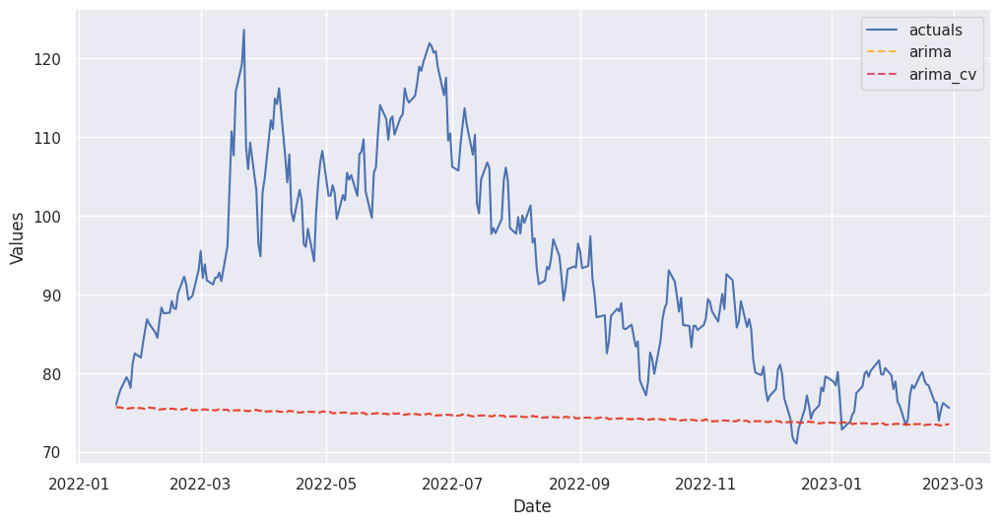

In [ ]:
# plot the cross validated forecast against standard forecast
f.plot_test_set(
    models=[
        "arima",
        "arima_cv",
    ],
    include_train=False,
)
plt.show()

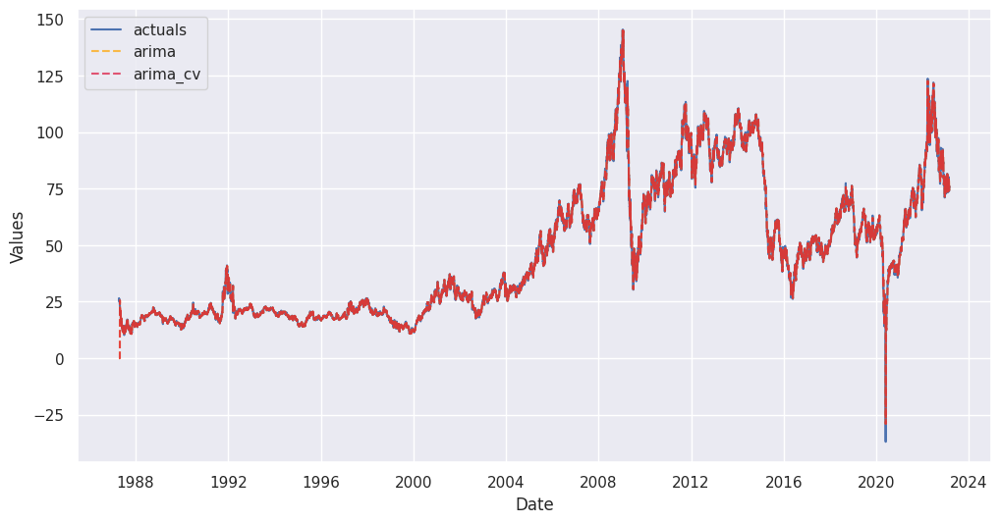

In [ ]:
f.plot_fitted(
    models=[
        "arima",
        "arima_cv",
    ],
)
plt.show()

### Stacking

In [ ]:
# add the auto regressor terms. add the predictions from all the above models as covariates for the stacked models. set the estimator for the stacked model as CATBOOST
f.add_ar_terms(48)
f.add_signals(
    f.history.keys(),
)
f.set_estimator('catboost')
f

Forecaster(
    DateStartActuals=1987-04-13T00:00:00.000000000
    DateEndActuals=2023-02-27T00:00:00.000000000
    Freq=B
    N_actuals=9361
    ForecastLength=289
    Xvars=['cycle6sin', 'cycle6cos', 'cycle9sin', 'cycle9cos', 'cycle12sin', 'cycle12cos', 'cycle15sin', 'cycle15cos', 'cycle18sin', 'cycle18cos', 'cycle21sin', 'cycle21cos', 'cycle24sin', 'cycle24cos', 'cycle27sin', 'cycle27cos', 'cycle30sin', 'cycle30cos', 'cycle33sin', 'cycle33cos', 'cycle36sin', 'cycle36cos', 'cycle39sin', 'cycle39cos', 'cycle42sin', 'cycle42cos', 'cycle45sin', 'cycle45cos', 'cycle48sin', 'cycle48cos', 'cycle51sin', 'cycle51cos', 'cycle54sin', 'cycle54cos', 'cycle57sin', 'cycle57cos', 'cycle60sin', 'cycle60cos', 'cycle63sin', 'cycle63cos', 'cycle66sin', 'cycle66cos', 'cycle69sin', 'cycle69cos', 'cycle72sin', 'cycle72cos', 'cycle75sin', 'cycle75cos', 'cycle78sin', 'cycle78cos', 'cycle81sin', 'cycle81cos', 'cycle84sin', 'cycle84cos', 'cycle87sin', 'cycle87cos', 'cycle90sin', 'cycle90cos', 'cycle93sin', 'c

In [ ]:
# use different variables to pull the stacked forecast - using all the variables, just the regressors with lags and finally anything that is not auto regressor
f.manual_forecast(
    Xvars='all',
    call_me='catboost_all_reg',
    verbose = False,
)
f.save_feature_importance(method = 'shap') # it would be interesting to see the shapley scores (later)
f.manual_forecast(
    Xvars=[x for x in f.get_regressor_names() if x.startswith('AR')],
    call_me = 'catboost_lags_only',
    verbose = False,
)
f.manual_forecast(
    Xvars=[x for x in f.get_regressor_names() if not x.startswith('AR')],
    call_me = 'catboost_signals_only',
    verbose = False,
)

/usr/local/lib/python3.9/dist-packages/scalecast/Forecaster.py:2689: Warning: Cannot set shap feature importance on catboost_all_reg. Here is the error: No module named 'shap'
  warnings.warn(


In [ ]:
results = f.export(determine_best_by='TestSetRMSE')
ms = results['model_summaries']
ms[
    [
        'ModelNickname',
        'TestSetLength',
        'TestSetRMSE',
        'InSampleRMSE',
        'TestSetMSE',
        'InSampleMSE'     
    ]
]

In [ ]:
ms.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/scalecast/model_metrics.csv')

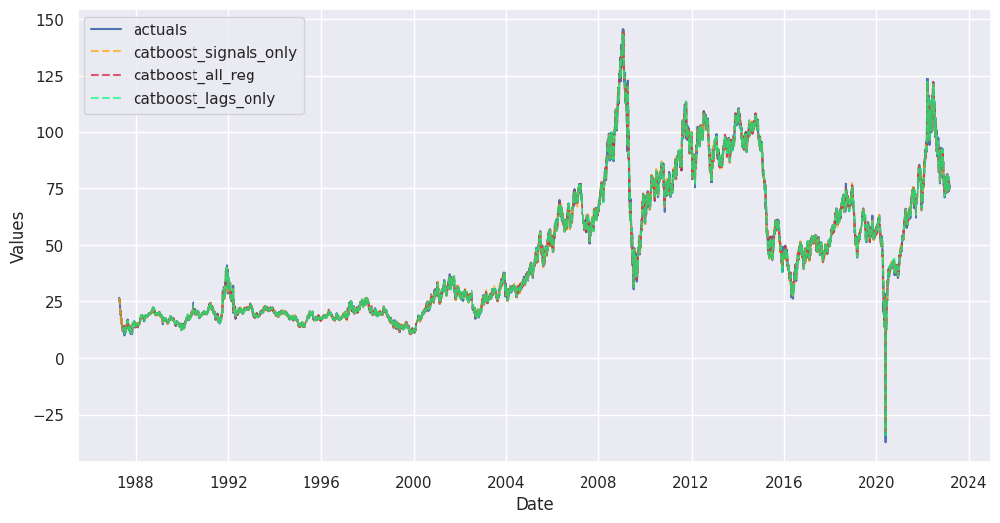

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
f.plot_fitted(
    models = [m for m in f.history if m.startswith('catboost')],
    order_by="TestSetRMSE",
    ax = ax
)
plt.show()

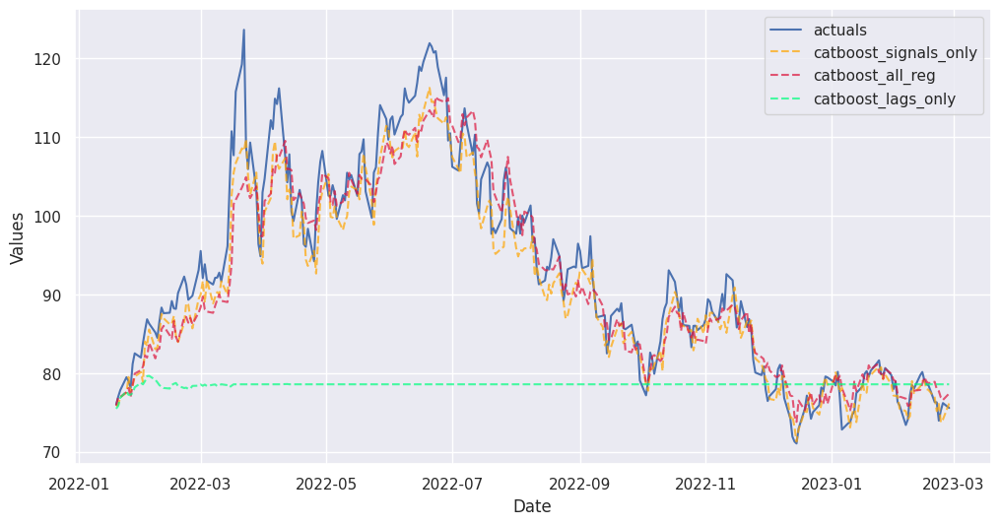

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
f.plot_test_set(
    models = [m for m in f.history if m.startswith('catboost')],
    order_by="TestSetRMSE",
    ax = ax,
    include_train=False,
)
plt.show()

In [ ]:
catboost_stacked_df = cushing_y_future.to_frame()

In [ ]:
catboost_stacked_df['catboost_signals_only'] = f.history['catboost_signals_only']['TestSetPredictions']
catboost_stacked_df['catboost_all_regressors'] = f.history['catboost_all_reg']['TestSetPredictions']

In [ ]:
catboost_stacked_df.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/scalecast/stacked_predictions.csv')

### Combo Models

In [ ]:
f.set_estimator('combo')
f.manual_forecast(models = ['gbt_cv','hwes_cv','silverkite'],call_me = 'combine_1')

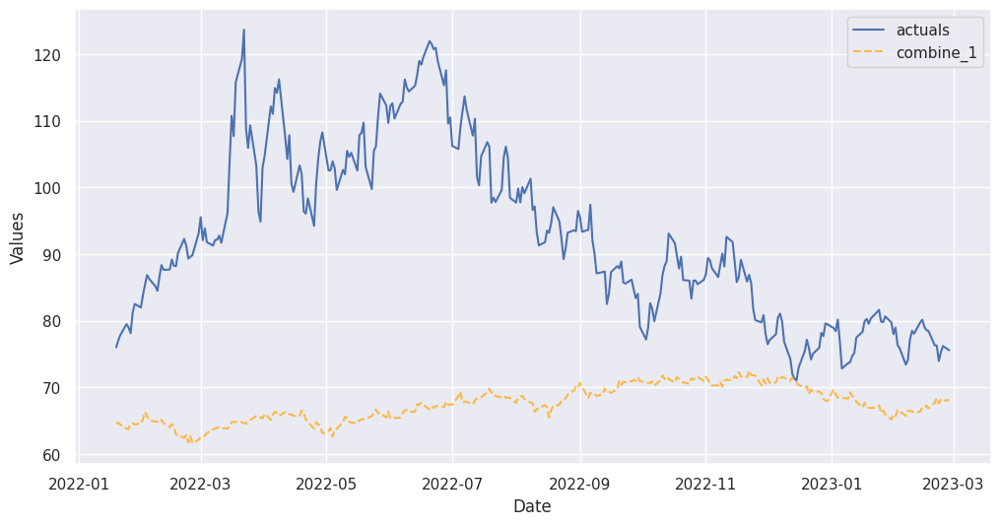

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
f.plot_test_set(
    models = 'combine_1',
    order_by="TestSetRMSE",
    ax = ax,
    include_train=False,
)
plt.show()

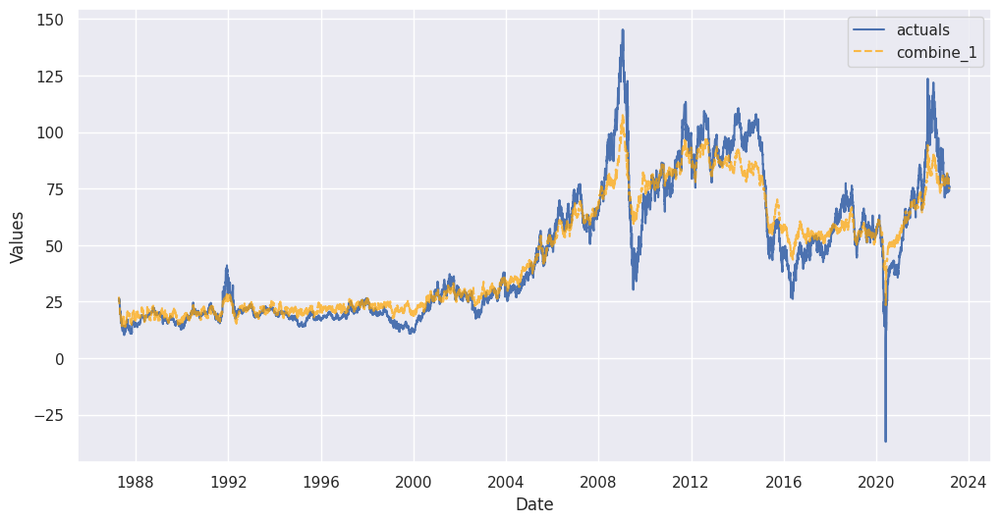

In [ ]:
f.plot_fitted(
    models=[
        "combine_1",
    ],
)
plt.show()

In [ ]:
f.set_estimator('combo')
f.manual_forecast(models = ['lightgbm_cv','xgboost_cv','gbt_cv'],call_me = 'combine_2')

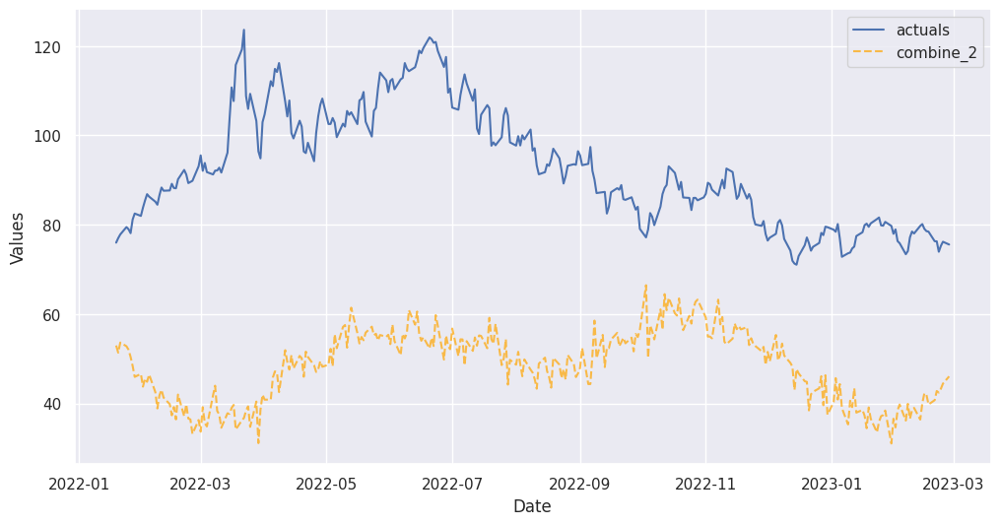

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
f.plot_test_set(
    models = 'combine_2',
    order_by="TestSetRMSE",
    ax = ax,
    include_train=False,
)
plt.show()

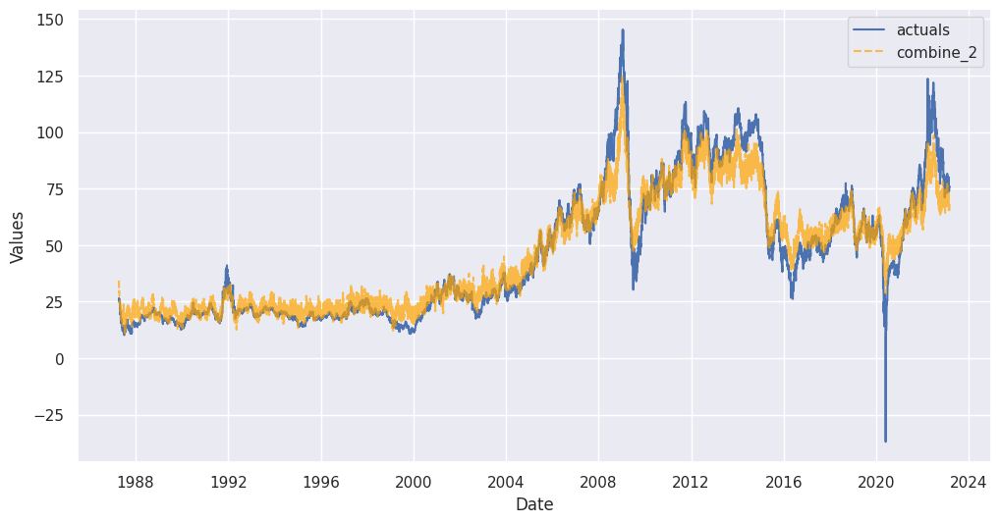

In [ ]:
f.plot_fitted(
    models=[
        "combine_2",
    ],
)
plt.show()

## Brent Data

In [ ]:
# Convert the date to dateimte object 
eu_brent['Date'] = pd.to_datetime(eu_brent['Date'], format = '%b %d, %Y')

In [ ]:
# rename price column
eu_brent.rename(columns={'Europe Brent Spot Price FOB (Dollars per Barrel)':'price'},inplace=True)

In [ ]:
brent_df = eu_brent

In [ ]:
# dropping the last NaN row in the dataframe
brent_df = brent_df[:-1]
brent_df

,Date,price
0,1987-05-20,18.63
1,1987-05-21,18.45
2,1987-05-22,18.55
3,1987-05-25,18.60
4,1987-05-26,18.63
...,...,...
9076,2023-02-21,82.14
9077,2023-02-22,79.55
9078,2023-02-23,82.08
9079,2023-02-24,82.31


In [ ]:
# Change the index of the Df as date index
# brent_df.index = pd.date_range(start='01-02-1986', end='02-27-2023', freq='D')
brent_df = brent_df.set_index('Date')

In [ ]:
# brent_df.index = pd.DatetimeIndex(brent_df.index).to_period('D')
brent_df.index = pd.DatetimeIndex(brent_df.index)
brent_df

,price
Date,
1987-05-20,18.63
1987-05-21,18.45
1987-05-22,18.55
1987-05-25,18.60
1987-05-26,18.63
...,...
2023-02-21,82.14
2023-02-22,79.55
2023-02-23,82.08


In [ ]:
# split the available data as historical and future for computing forecast error 
brent_y_hist = brent_df.loc['1987':'2021','price'] 
brent_y_future = brent_df.loc['2022':, 'price']
brent_y_hist, brent_y_future

(Date
 1987-05-20    18.63
 1987-05-21    18.45
 1987-05-22    18.55
 1987-05-25    18.60
 1987-05-26    18.63
               ...  
 2021-12-23    76.26
 2021-12-24    75.24
 2021-12-29    78.63
 2021-12-30    78.61
 2021-12-31    77.24
 Name: price, Length: 8789, dtype: float64,
 Date
 2022-01-03    78.25
 2022-01-04    79.39
 2022-01-05    80.60
 2022-01-06    81.99
 2022-01-07    82.28
               ...  
 2023-02-21    82.14
 2023-02-22    79.55
 2023-02-23    82.08
 2023-02-24    82.31
 2023-02-27    82.31
 Name: price, Length: 292, dtype: float64)

In [ ]:
# setting brent data frequency as business days "B"
brent_df = brent_df.asfreq('B')
brent_df

,price
Date,
1987-05-20,18.63
1987-05-21,18.45
1987-05-22,18.55
1987-05-25,18.60
1987-05-26,18.63
...,...
2023-02-21,82.14
2023-02-22,79.55
2023-02-23,82.08


In [ ]:
brent_data=brent_df.squeeze()

In [ ]:
brent_data.index

DatetimeIndex(['1987-05-20', '1987-05-21', '1987-05-22', '1987-05-25',
               '1987-05-26', '1987-05-27', '1987-05-28', '1987-05-29',
               '1987-06-01', '1987-06-02',
               ...
               '2023-02-14', '2023-02-15', '2023-02-16', '2023-02-17',
               '2023-02-20', '2023-02-21', '2023-02-22', '2023-02-23',
               '2023-02-24', '2023-02-27'],
              dtype='datetime64[ns]', name='Date', length=9334, freq='B')

### 1) Basic Model

In [ ]:
# initialize the forecaster for the brent data set
f_brent = Forecaster(y = brent_data,current_dates = brent_data.index,
               future_dates = 292,test_length = 292,cis = True,metrics = ['rmse'])
for i in np.arange(6, 289, 3): 
  f_brent.add_cycle(i)
f_brent

Forecaster(
    DateStartActuals=1988-05-09T00:00:00.000000000
    DateEndActuals=2023-02-27T00:00:00.000000000
    Freq=B
    N_actuals=9081
    ForecastLength=292
    Xvars=['cycle6sin', 'cycle6cos', 'cycle9sin', 'cycle9cos', 'cycle12sin', 'cycle12cos', 'cycle15sin', 'cycle15cos', 'cycle18sin', 'cycle18cos', 'cycle21sin', 'cycle21cos', 'cycle24sin', 'cycle24cos', 'cycle27sin', 'cycle27cos', 'cycle30sin', 'cycle30cos', 'cycle33sin', 'cycle33cos', 'cycle36sin', 'cycle36cos', 'cycle39sin', 'cycle39cos', 'cycle42sin', 'cycle42cos', 'cycle45sin', 'cycle45cos', 'cycle48sin', 'cycle48cos', 'cycle51sin', 'cycle51cos', 'cycle54sin', 'cycle54cos', 'cycle57sin', 'cycle57cos', 'cycle60sin', 'cycle60cos', 'cycle63sin', 'cycle63cos', 'cycle66sin', 'cycle66cos', 'cycle69sin', 'cycle69cos', 'cycle72sin', 'cycle72cos', 'cycle75sin', 'cycle75cos', 'cycle78sin', 'cycle78cos', 'cycle81sin', 'cycle81cos', 'cycle84sin', 'cycle84cos', 'cycle87sin', 'cycle87cos', 'cycle90sin', 'cycle90cos', 'cycle93sin', 'c

In [ ]:
# set the estimator type to be naive and run the manual forecast
f_brent.set_estimator('naive')
f_brent.manual_forecast()

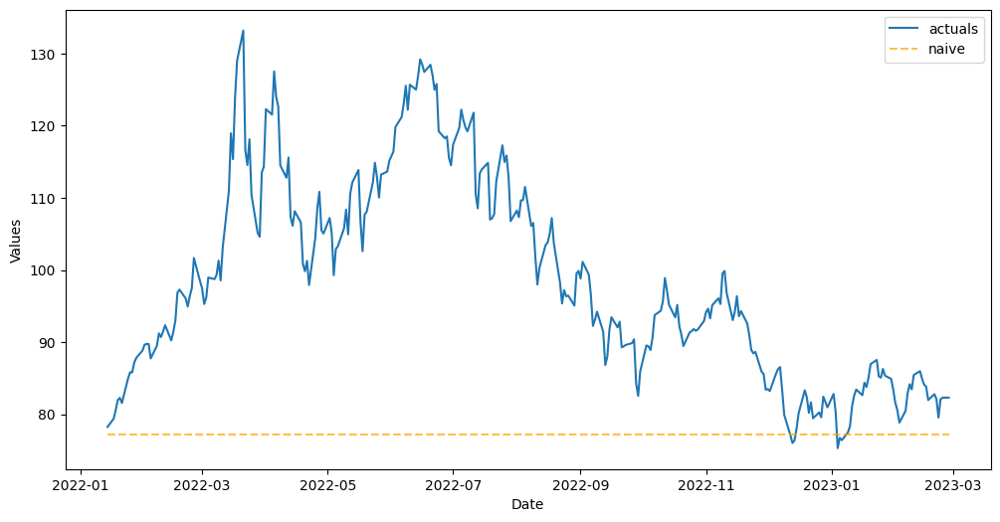

In [ ]:
# plot the test set actual data and predictions using the naive method.
f_brent.plot_test_set(
    models=[
        "naive",
    ],
    include_train=False,
)
plt.show()

In [ ]:
# cross validate the data using the grid below. setting the grid to run the cross validation
grid = {
    "seasonal": [False,True],
    "m": [24, 12],
}

In [ ]:
f_brent.ingest_grid(grid)

In [ ]:
f_brent.cross_validate(k=375,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)

Num hyperparams to try for the naive model: 4.
Fold 0: Train size: 506 (2020-01-07 00:00:00 - 2021-12-14 00:00:00). Test Size: 22 (2021-12-15 00:00:00 - 2022-01-13 00:00:00). 
Fold 1: Train size: 506 (2019-12-06 00:00:00 - 2021-11-12 00:00:00). Test Size: 22 (2021-11-15 00:00:00 - 2021-12-14 00:00:00). 
Fold 2: Train size: 506 (2019-11-06 00:00:00 - 2021-10-13 00:00:00). Test Size: 22 (2021-10-14 00:00:00 - 2021-11-12 00:00:00). 
Fold 3: Train size: 506 (2019-10-07 00:00:00 - 2021-09-13 00:00:00). Test Size: 22 (2021-09-14 00:00:00 - 2021-10-13 00:00:00). 
Fold 4: Train size: 506 (2019-09-05 00:00:00 - 2021-08-12 00:00:00). Test Size: 22 (2021-08-13 00:00:00 - 2021-09-13 00:00:00). 
Fold 5: Train size: 506 (2019-08-06 00:00:00 - 2021-07-13 00:00:00). Test Size: 22 (2021-07-14 00:00:00 - 2021-08-12 00:00:00). 
Fold 6: Train size: 506 (2019-07-05 00:00:00 - 2021-06-11 00:00:00). Test Size: 22 (2021-06-14 00:00:00 - 2021-07-13 00:00:00). 
Fold 7: Train size: 506 (2019-06-05 00:00:00 - 202

In [ ]:
# using auto forecast and the best parameters obtained from the grid search run the forecasting
f_brent.auto_forecast(call_me="naive_cv")

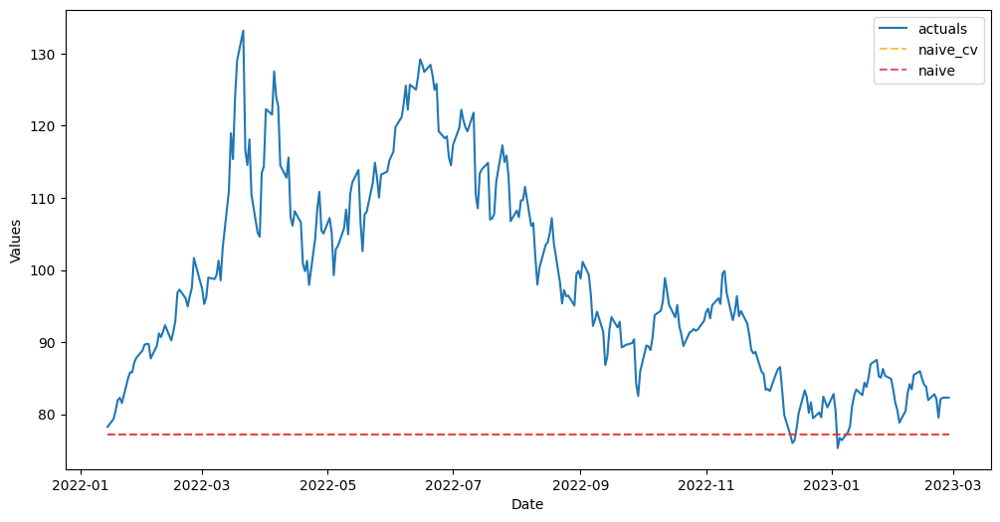

In [ ]:
# plot the cross validated forecast against standard forecast
f_brent.plot_test_set(
    models=[
        "naive_cv",
        "naive",
    ],
    include_train=False,
)
plt.show()

### 2) GBT

In [ ]:
# set the estimator to gradient boosted trees and run manual forecast
f_brent.set_estimator('gbt')
f_brent.manual_forecast()

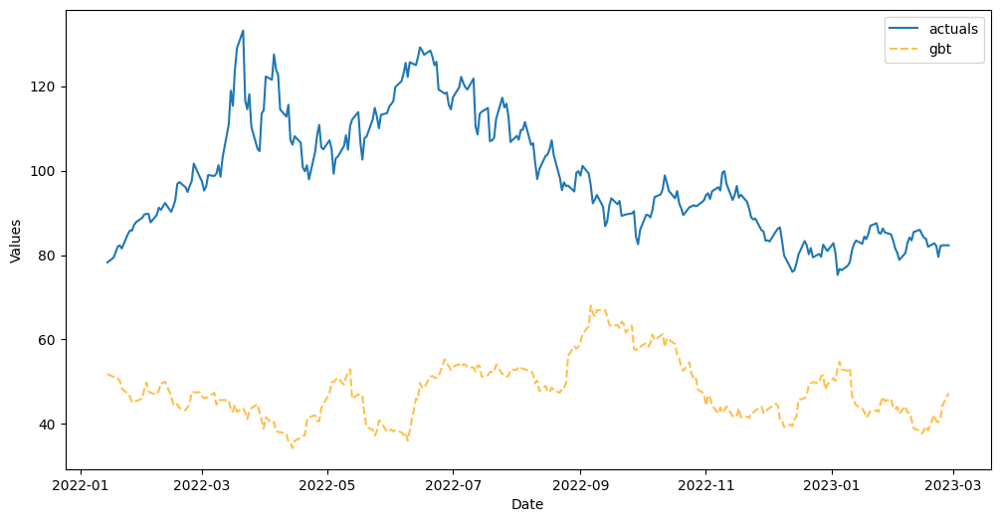

In [ ]:
# plot the test set actual data and predictions using the gradient boosted tree.
f_brent.plot_test_set(
    models=[
        "gbt",
    ],
    include_train=False,
)
plt.show()

In [ ]:
# cross validate the gradient boosted tree using the grid below. setting the grid to run the cross validation
grid = {
    "max_depth": [2],
    "subsample": [0.8],
}
f_brent.ingest_grid(grid)

In [ ]:
f_brent.cross_validate(k=375,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f_brent.auto_forecast(call_me="gbt_cv")

Num hyperparams to try for the gbt model: 1.
Fold 0: Train size: 506 (2020-01-07 00:00:00 - 2021-12-14 00:00:00). Test Size: 22 (2021-12-15 00:00:00 - 2022-01-13 00:00:00). 
Fold 1: Train size: 506 (2019-12-06 00:00:00 - 2021-11-12 00:00:00). Test Size: 22 (2021-11-15 00:00:00 - 2021-12-14 00:00:00). 
Fold 2: Train size: 506 (2019-11-06 00:00:00 - 2021-10-13 00:00:00). Test Size: 22 (2021-10-14 00:00:00 - 2021-11-12 00:00:00). 
Fold 3: Train size: 506 (2019-10-07 00:00:00 - 2021-09-13 00:00:00). Test Size: 22 (2021-09-14 00:00:00 - 2021-10-13 00:00:00). 
Fold 4: Train size: 506 (2019-09-05 00:00:00 - 2021-08-12 00:00:00). Test Size: 22 (2021-08-13 00:00:00 - 2021-09-13 00:00:00). 
Fold 5: Train size: 506 (2019-08-06 00:00:00 - 2021-07-13 00:00:00). Test Size: 22 (2021-07-14 00:00:00 - 2021-08-12 00:00:00). 
Fold 6: Train size: 506 (2019-07-05 00:00:00 - 2021-06-11 00:00:00). Test Size: 22 (2021-06-14 00:00:00 - 2021-07-13 00:00:00). 
Fold 7: Train size: 506 (2019-06-05 00:00:00 - 2021-

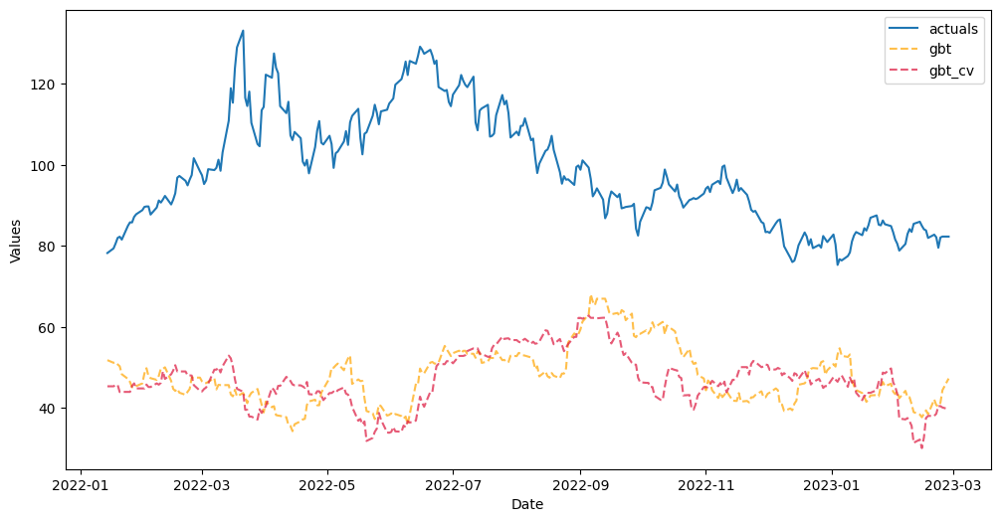

In [ ]:
# plot the cross validated forecast against standard forecast
f_brent.plot_test_set(
    models=[
        "gbt",
        "gbt_cv",
    ],
    include_train=False,
)
plt.show()

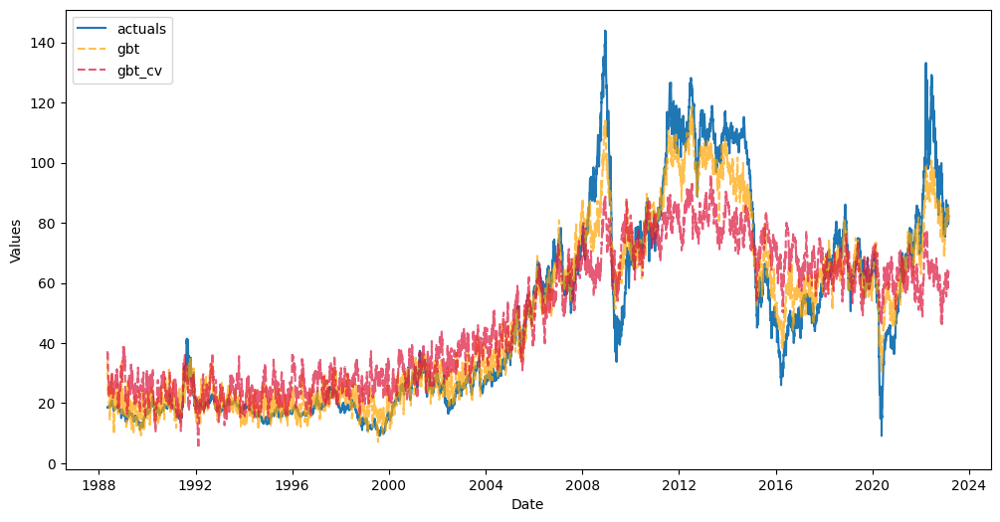

In [ ]:

f_brent.plot_fitted(
    models=[
        "gbt",
        "gbt_cv",
    ],
)
plt.show()

### 3) light gbm

In [ ]:
f_brent.set_estimator('lightgbm')
f_brent.manual_forecast()

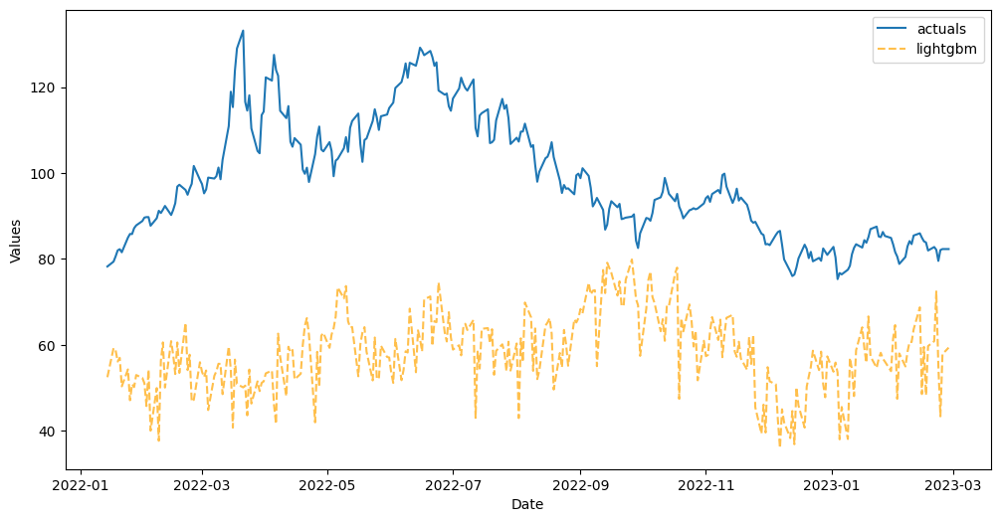

In [ ]:
# plot the test set actuals against the forecasted
f_brent.plot_test_set(
    models=[
        "lightgbm",
    ],
    include_train=False,
)
plt.show()

In [ ]:
grid = {
    "max_depth": [2,4],
    "subsample": [0.8,1],
}
f_brent.ingest_grid(grid)

In [ ]:
f_brent.cross_validate(k=375,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f_brent.auto_forecast(call_me="lightgbm_cv")

Num hyperparams to try for the lightgbm model: 4.
Fold 0: Train size: 506 (2020-01-07 00:00:00 - 2021-12-14 00:00:00). Test Size: 22 (2021-12-15 00:00:00 - 2022-01-13 00:00:00). 
Fold 1: Train size: 506 (2019-12-06 00:00:00 - 2021-11-12 00:00:00). Test Size: 22 (2021-11-15 00:00:00 - 2021-12-14 00:00:00). 
Fold 2: Train size: 506 (2019-11-06 00:00:00 - 2021-10-13 00:00:00). Test Size: 22 (2021-10-14 00:00:00 - 2021-11-12 00:00:00). 
Fold 3: Train size: 506 (2019-10-07 00:00:00 - 2021-09-13 00:00:00). Test Size: 22 (2021-09-14 00:00:00 - 2021-10-13 00:00:00). 
Fold 4: Train size: 506 (2019-09-05 00:00:00 - 2021-08-12 00:00:00). Test Size: 22 (2021-08-13 00:00:00 - 2021-09-13 00:00:00). 
Fold 5: Train size: 506 (2019-08-06 00:00:00 - 2021-07-13 00:00:00). Test Size: 22 (2021-07-14 00:00:00 - 2021-08-12 00:00:00). 
Fold 6: Train size: 506 (2019-07-05 00:00:00 - 2021-06-11 00:00:00). Test Size: 22 (2021-06-14 00:00:00 - 2021-07-13 00:00:00). 
Fold 7: Train size: 506 (2019-06-05 00:00:00 - 

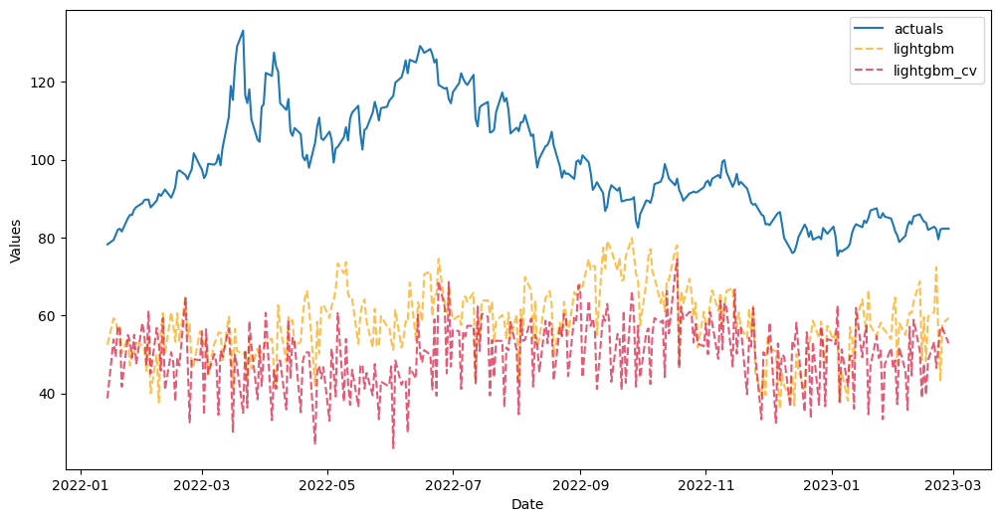

In [ ]:
# plot the cross validated forecast against standard forecast
f_brent.plot_test_set(
    models=[
        "lightgbm",
        "lightgbm_cv",
    ],
    include_train=False,
)
plt.show()

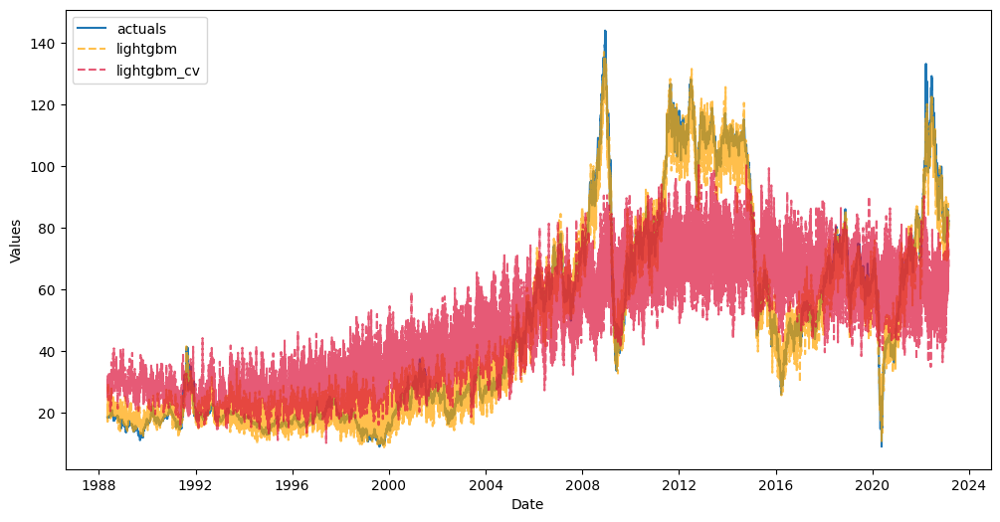

In [ ]:
f_brent.plot_fitted(
    models=[
        "lightgbm",
        "lightgbm_cv",
    ],
)
plt.show()

### 4) XGBoost

In [ ]:
f_brent.set_estimator('xgboost')
f_brent.manual_forecast()

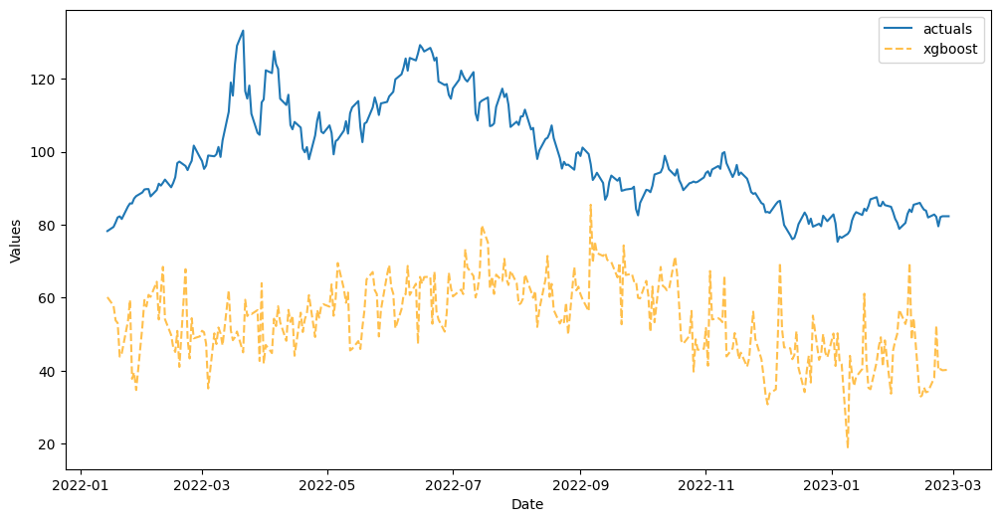

In [ ]:
# plot the test set actuals against the forecasted
f_brent.plot_test_set(
    models=[
        "xgboost",
    ],
    include_train=False,
)
plt.show()

In [ ]:
grid = {
    "max_depth": [2,4],
    "subsample": [0.8,1],
}
f_brent.ingest_grid(grid)

In [ ]:
f_brent.cross_validate(k=375,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f_brent.auto_forecast(call_me="xgboost_cv")

Num hyperparams to try for the xgboost model: 4.
Fold 0: Train size: 506 (2020-01-07 00:00:00 - 2021-12-14 00:00:00). Test Size: 22 (2021-12-15 00:00:00 - 2022-01-13 00:00:00). 
Fold 1: Train size: 506 (2019-12-06 00:00:00 - 2021-11-12 00:00:00). Test Size: 22 (2021-11-15 00:00:00 - 2021-12-14 00:00:00). 
Fold 2: Train size: 506 (2019-11-06 00:00:00 - 2021-10-13 00:00:00). Test Size: 22 (2021-10-14 00:00:00 - 2021-11-12 00:00:00). 
Fold 3: Train size: 506 (2019-10-07 00:00:00 - 2021-09-13 00:00:00). Test Size: 22 (2021-09-14 00:00:00 - 2021-10-13 00:00:00). 
Fold 4: Train size: 506 (2019-09-05 00:00:00 - 2021-08-12 00:00:00). Test Size: 22 (2021-08-13 00:00:00 - 2021-09-13 00:00:00). 
Fold 5: Train size: 506 (2019-08-06 00:00:00 - 2021-07-13 00:00:00). Test Size: 22 (2021-07-14 00:00:00 - 2021-08-12 00:00:00). 
Fold 6: Train size: 506 (2019-07-05 00:00:00 - 2021-06-11 00:00:00). Test Size: 22 (2021-06-14 00:00:00 - 2021-07-13 00:00:00). 
Fold 7: Train size: 506 (2019-06-05 00:00:00 - 2

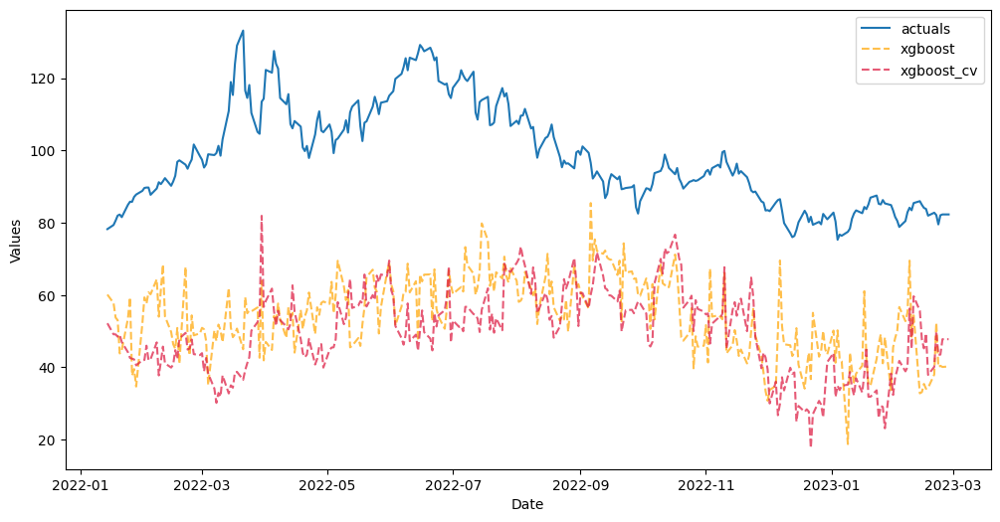

In [ ]:
# plot the cross validated forecast against standard forecast
f_brent.plot_test_set(
    models=[
        "xgboost",
        "xgboost_cv",
    ],
    include_train=False,
)
plt.show()

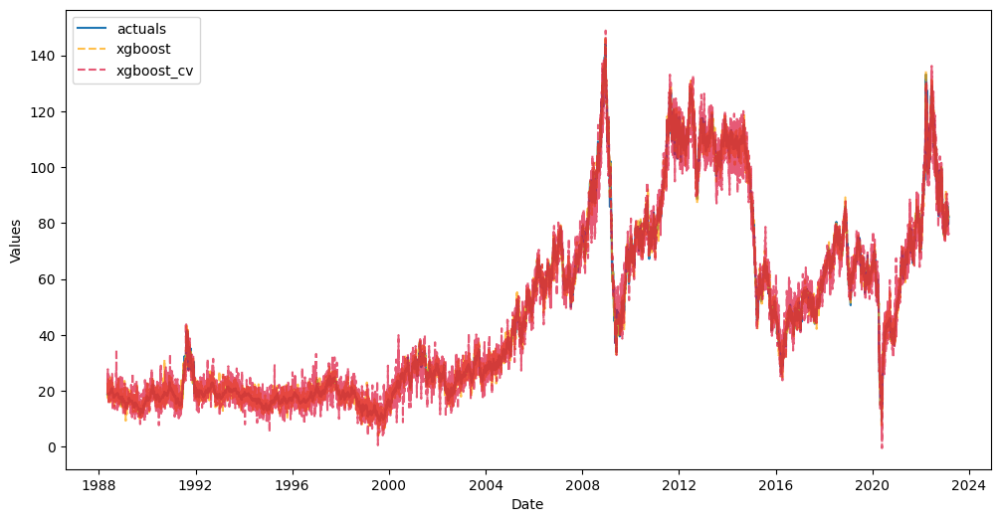

In [ ]:
f_brent.plot_fitted(
    models=[
        "xgboost",
        "xgboost_cv",
    ],
)
plt.show()

### 5) Prophet

In [ ]:
f_brent.set_estimator('prophet')
f_brent.manual_forecast()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ldolt9es.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/21szljcr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81714', 'data', 'file=/tmp/tmp1t5w10t5/ldolt9es.json', 'init=/tmp/tmp1t5w10t5/21szljcr.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeloy71608g/prophet_model-20230417140136.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:01:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:01:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5

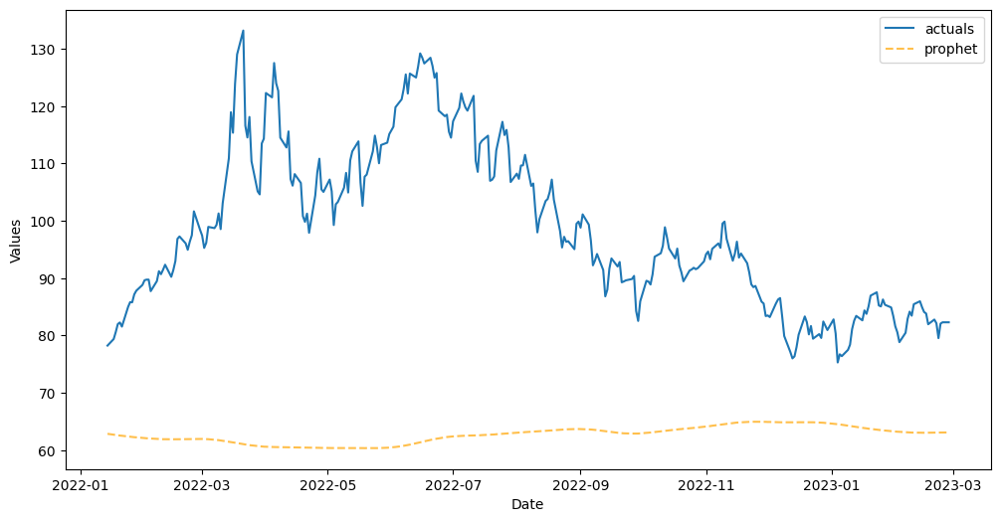

In [ ]:
# plot the test set actuals against the forecasted
f_brent.plot_test_set(
    models=[
        "prophet",
    ],
    include_train=False,
)
plt.show()

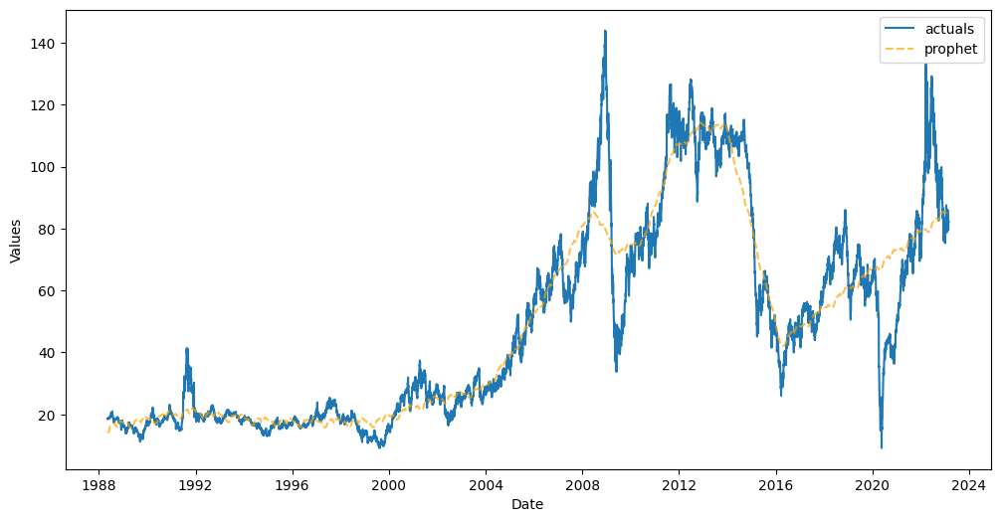

In [ ]:
f_brent.plot_fitted(
    models=[
        "prophet",
    ],
)
plt.show()

In [ ]:
grid = {
    'seasonality_mode':['additive','multiplicative']
}
f_brent.ingest_grid(grid)

In [ ]:
f_brent.cross_validate(k=375,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f_brent.auto_forecast(call_me="prophet_cv")

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rpamegfr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/i0t7ur9_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=151', 'data', 'file=/tmp/tmp1t5w10t5/rpamegfr.json', 'init=/tmp/tmp1t5w10t5/i0t7ur9_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeloysm9xxu/prophet_model-20230417140156.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:01:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:01:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Num hyperparams to try for the prophet model: 2.
Fold 0: Train size: 506 (2020-01-07 00:00:00 - 2021-12-14 00:00:00). Test Size: 22 (2021-12-15 00:00:00 - 2022-01-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bs1avjwx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/anhqq_1j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61599', 'data', 'file=/tmp/tmp1t5w10t5/bs1avjwx.json', 'init=/tmp/tmp1t5w10t5/anhqq_1j.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelqfgrw4fy/prophet_model-20230417140157.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:01:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:01:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 1: Train size: 506 (2019-12-06 00:00:00 - 2021-11-12 00:00:00). Test Size: 22 (2021-11-15 00:00:00 - 2021-12-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7e0mupeg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tbn1uln0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94872', 'data', 'file=/tmp/tmp1t5w10t5/7e0mupeg.json', 'init=/tmp/tmp1t5w10t5/tbn1uln0.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelgvirxrmk/prophet_model-20230417140158.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:01:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:01:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 2: Train size: 506 (2019-11-06 00:00:00 - 2021-10-13 00:00:00). Test Size: 22 (2021-10-14 00:00:00 - 2021-11-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/c_amhi0m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/aeiqw8fu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97835', 'data', 'file=/tmp/tmp1t5w10t5/c_amhi0m.json', 'init=/tmp/tmp1t5w10t5/aeiqw8fu.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelt3nc_hnc/prophet_model-20230417140200.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 3: Train size: 506 (2019-10-07 00:00:00 - 2021-09-13 00:00:00). Test Size: 22 (2021-09-14 00:00:00 - 2021-10-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/x97rh3bq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vwtwze2c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13400', 'data', 'file=/tmp/tmp1t5w10t5/x97rh3bq.json', 'init=/tmp/tmp1t5w10t5/vwtwze2c.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model_dwj5m9r/prophet_model-20230417140202.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 4: Train size: 506 (2019-09-05 00:00:00 - 2021-08-12 00:00:00). Test Size: 22 (2021-08-13 00:00:00 - 2021-09-13 00:00:00). 


14:02:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2jmn8api.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d_vn0qo1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88847', 'data', 'file=/tmp/tmp1t5w10t5/2jmn8api.json', 'init=/tmp/tmp1t5w10t5/d_vn0qo1.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelf1bxxdpl/prophet_model-20230417140204.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:04 - cmdstanpy - INFO - Chain [1] d

Fold 5: Train size: 506 (2019-08-06 00:00:00 - 2021-07-13 00:00:00). Test Size: 22 (2021-07-14 00:00:00 - 2021-08-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5wndgc1s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/sweneciw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96938', 'data', 'file=/tmp/tmp1t5w10t5/5wndgc1s.json', 'init=/tmp/tmp1t5w10t5/sweneciw.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzc_mlrd_/prophet_model-20230417140205.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 6: Train size: 506 (2019-07-05 00:00:00 - 2021-06-11 00:00:00). Test Size: 22 (2021-06-14 00:00:00 - 2021-07-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ixrrk14p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/itnbhc4_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25086', 'data', 'file=/tmp/tmp1t5w10t5/ixrrk14p.json', 'init=/tmp/tmp1t5w10t5/itnbhc4_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzh5n4nc3/prophet_model-20230417140207.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 7: Train size: 506 (2019-06-05 00:00:00 - 2021-05-12 00:00:00). Test Size: 22 (2021-05-13 00:00:00 - 2021-06-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/445fhnbg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/pqmljxnk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54652', 'data', 'file=/tmp/tmp1t5w10t5/445fhnbg.json', 'init=/tmp/tmp1t5w10t5/pqmljxnk.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelgu6oxl7_/prophet_model-20230417140209.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 8: Train size: 506 (2019-05-06 00:00:00 - 2021-04-12 00:00:00). Test Size: 22 (2021-04-13 00:00:00 - 2021-05-12 00:00:00). 


14:02:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/pna3s9nb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mzrse8gk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72397', 'data', 'file=/tmp/tmp1t5w10t5/pna3s9nb.json', 'init=/tmp/tmp1t5w10t5/mzrse8gk.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelq8pxrc6b/prophet_model-20230417140210.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:11 - cmdstanpy - INFO - Chain [1] d

Fold 9: Train size: 506 (2019-04-04 00:00:00 - 2021-03-11 00:00:00). Test Size: 22 (2021-03-12 00:00:00 - 2021-04-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9mmn1z1g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d21n_7fz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54867', 'data', 'file=/tmp/tmp1t5w10t5/9mmn1z1g.json', 'init=/tmp/tmp1t5w10t5/d21n_7fz.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelqaumoi66/prophet_model-20230417140212.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 10: Train size: 506 (2019-03-05 00:00:00 - 2021-02-09 00:00:00). Test Size: 22 (2021-02-10 00:00:00 - 2021-03-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/k8lw64jv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d_esv0mc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6581', 'data', 'file=/tmp/tmp1t5w10t5/k8lw64jv.json', 'init=/tmp/tmp1t5w10t5/d_esv0mc.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model9okp231y/prophet_model-20230417140213.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 11: Train size: 506 (2019-02-01 00:00:00 - 2021-01-08 00:00:00). Test Size: 22 (2021-01-11 00:00:00 - 2021-02-09 00:00:00). 


14:02:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0d0axnw6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fsy4pgkw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20559', 'data', 'file=/tmp/tmp1t5w10t5/0d0axnw6.json', 'init=/tmp/tmp1t5w10t5/fsy4pgkw.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelihqswbl8/prophet_model-20230417140215.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:16 - cmdstanpy - INFO - Chain [1] d

Fold 12: Train size: 506 (2019-01-02 00:00:00 - 2020-12-09 00:00:00). Test Size: 22 (2020-12-10 00:00:00 - 2021-01-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fgowoy2q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/i3jg6o5m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1618', 'data', 'file=/tmp/tmp1t5w10t5/fgowoy2q.json', 'init=/tmp/tmp1t5w10t5/i3jg6o5m.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelctmvnx45/prophet_model-20230417140217.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 13: Train size: 506 (2018-12-03 00:00:00 - 2020-11-09 00:00:00). Test Size: 22 (2020-11-10 00:00:00 - 2020-12-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vlivs4jo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/m78w0cs6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94129', 'data', 'file=/tmp/tmp1t5w10t5/vlivs4jo.json', 'init=/tmp/tmp1t5w10t5/m78w0cs6.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modellg29i0w3/prophet_model-20230417140219.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 14: Train size: 506 (2018-11-01 00:00:00 - 2020-10-08 00:00:00). Test Size: 22 (2020-10-09 00:00:00 - 2020-11-09 00:00:00). 


14:02:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q8ekdyib.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/lqf4xsqf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86549', 'data', 'file=/tmp/tmp1t5w10t5/q8ekdyib.json', 'init=/tmp/tmp1t5w10t5/lqf4xsqf.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelr6cf2_4h/prophet_model-20230417140220.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:21 - cmdstanpy - INFO - Chain [1] d

Fold 15: Train size: 506 (2018-10-02 00:00:00 - 2020-09-08 00:00:00). Test Size: 22 (2020-09-09 00:00:00 - 2020-10-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kqh4zv7u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/58e3_0pb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78349', 'data', 'file=/tmp/tmp1t5w10t5/kqh4zv7u.json', 'init=/tmp/tmp1t5w10t5/58e3_0pb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modellcyay4b7/prophet_model-20230417140222.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 16: Train size: 506 (2018-08-31 00:00:00 - 2020-08-07 00:00:00). Test Size: 22 (2020-08-10 00:00:00 - 2020-09-08 00:00:00). 


DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bdbq7cvw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_5brhpna.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59541', 'data', 'file=/tmp/tmp1t5w10t5/bdbq7cvw.json', 'init=/tmp/tmp1t5w10t5/_5brhpna.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelwghtnz1j/prophet_model-20230417140223.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1

Fold 17: Train size: 506 (2018-08-01 00:00:00 - 2020-07-08 00:00:00). Test Size: 22 (2020-07-09 00:00:00 - 2020-08-07 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zb00bw7c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/dp65xjfn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32648', 'data', 'file=/tmp/tmp1t5w10t5/zb00bw7c.json', 'init=/tmp/tmp1t5w10t5/dp65xjfn.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model_kq_uq_p/prophet_model-20230417140224.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 18: Train size: 506 (2018-07-02 00:00:00 - 2020-06-08 00:00:00). Test Size: 22 (2020-06-09 00:00:00 - 2020-07-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fudtrtii.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/yrr2nb4f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15960', 'data', 'file=/tmp/tmp1t5w10t5/fudtrtii.json', 'init=/tmp/tmp1t5w10t5/yrr2nb4f.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelmpzva018/prophet_model-20230417140226.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 19: Train size: 506 (2018-05-31 00:00:00 - 2020-05-07 00:00:00). Test Size: 22 (2020-05-08 00:00:00 - 2020-06-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/364ce0we.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ypvgmmcz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84744', 'data', 'file=/tmp/tmp1t5w10t5/364ce0we.json', 'init=/tmp/tmp1t5w10t5/ypvgmmcz.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnoj_yqs_/prophet_model-20230417140227.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 20: Train size: 506 (2018-05-01 00:00:00 - 2020-04-07 00:00:00). Test Size: 22 (2020-04-08 00:00:00 - 2020-05-07 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/uwdv99ap.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rmv02lom.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24237', 'data', 'file=/tmp/tmp1t5w10t5/uwdv99ap.json', 'init=/tmp/tmp1t5w10t5/rmv02lom.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model0x2wb8il/prophet_model-20230417140228.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 21: Train size: 506 (2018-03-30 00:00:00 - 2020-03-06 00:00:00). Test Size: 22 (2020-03-09 00:00:00 - 2020-04-07 00:00:00). 


14:02:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/o9fruvte.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1p60lfpv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95714', 'data', 'file=/tmp/tmp1t5w10t5/o9fruvte.json', 'init=/tmp/tmp1t5w10t5/1p60lfpv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelo0xgb9zg/prophet_model-20230417140230.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:30 - cmdstanpy - INFO - Chain [1] d

Fold 22: Train size: 506 (2018-02-28 00:00:00 - 2020-02-05 00:00:00). Test Size: 22 (2020-02-06 00:00:00 - 2020-03-06 00:00:00). 


14:02:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nrmv62gh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/p9p0nkyo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71992', 'data', 'file=/tmp/tmp1t5w10t5/nrmv62gh.json', 'init=/tmp/tmp1t5w10t5/p9p0nkyo.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model52mxkpa9/prophet_model-20230417140232.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:32 - cmdstanpy - INFO - Chain [1] d

Fold 23: Train size: 506 (2018-01-29 00:00:00 - 2020-01-06 00:00:00). Test Size: 22 (2020-01-07 00:00:00 - 2020-02-05 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7aqvuo_m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5gs6z44p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69189', 'data', 'file=/tmp/tmp1t5w10t5/7aqvuo_m.json', 'init=/tmp/tmp1t5w10t5/5gs6z44p.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelh4eg7it4/prophet_model-20230417140233.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 24: Train size: 506 (2017-12-28 00:00:00 - 2019-12-05 00:00:00). Test Size: 22 (2019-12-06 00:00:00 - 2020-01-06 00:00:00). 


14:02:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/idb6x6to.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/lvd4gx8a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33964', 'data', 'file=/tmp/tmp1t5w10t5/idb6x6to.json', 'init=/tmp/tmp1t5w10t5/lvd4gx8a.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model7a2eaq99/prophet_model-20230417140235.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:36 - cmdstanpy - INFO - Chain [1] d

Fold 25: Train size: 506 (2017-11-28 00:00:00 - 2019-11-05 00:00:00). Test Size: 22 (2019-11-06 00:00:00 - 2019-12-05 00:00:00). 


14:02:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/u1a7j99p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nmihqrfd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69513', 'data', 'file=/tmp/tmp1t5w10t5/u1a7j99p.json', 'init=/tmp/tmp1t5w10t5/nmihqrfd.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model6oc8ews0/prophet_model-20230417140237.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:37 - cmdstanpy - INFO - Chain [1] d

Fold 26: Train size: 506 (2017-10-27 00:00:00 - 2019-10-04 00:00:00). Test Size: 22 (2019-10-07 00:00:00 - 2019-11-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/s2rn4rqi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/3j94vnf2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35842', 'data', 'file=/tmp/tmp1t5w10t5/s2rn4rqi.json', 'init=/tmp/tmp1t5w10t5/3j94vnf2.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeli7wya70h/prophet_model-20230417140238.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 27: Train size: 506 (2017-09-27 00:00:00 - 2019-09-04 00:00:00). Test Size: 22 (2019-09-05 00:00:00 - 2019-10-04 00:00:00). 


14:02:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ke9aef5l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d6sfvckr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73163', 'data', 'file=/tmp/tmp1t5w10t5/ke9aef5l.json', 'init=/tmp/tmp1t5w10t5/d6sfvckr.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model0hj9vz3i/prophet_model-20230417140240.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:40 - cmdstanpy - INFO - Chain [1] d

Fold 28: Train size: 506 (2017-08-28 00:00:00 - 2019-08-05 00:00:00). Test Size: 22 (2019-08-06 00:00:00 - 2019-09-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wlfz1b1b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/hwhwmqb1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67749', 'data', 'file=/tmp/tmp1t5w10t5/wlfz1b1b.json', 'init=/tmp/tmp1t5w10t5/hwhwmqb1.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model5okp_c48/prophet_model-20230417140241.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 29: Train size: 506 (2017-07-27 00:00:00 - 2019-07-04 00:00:00). Test Size: 22 (2019-07-05 00:00:00 - 2019-08-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kew176ih.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ee6picnp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83440', 'data', 'file=/tmp/tmp1t5w10t5/kew176ih.json', 'init=/tmp/tmp1t5w10t5/ee6picnp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model6dli4px1/prophet_model-20230417140243.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 30: Train size: 506 (2017-06-27 00:00:00 - 2019-06-04 00:00:00). Test Size: 22 (2019-06-05 00:00:00 - 2019-07-04 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ef4d7bk4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/pk9h55y3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38671', 'data', 'file=/tmp/tmp1t5w10t5/ef4d7bk4.json', 'init=/tmp/tmp1t5w10t5/pk9h55y3.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelike4o5su/prophet_model-20230417140245.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 31: Train size: 506 (2017-05-26 00:00:00 - 2019-05-03 00:00:00). Test Size: 22 (2019-05-06 00:00:00 - 2019-06-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/29249m_8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zag7q0yu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53504', 'data', 'file=/tmp/tmp1t5w10t5/29249m_8.json', 'init=/tmp/tmp1t5w10t5/zag7q0yu.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model5coev7je/prophet_model-20230417140247.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 32: Train size: 506 (2017-04-26 00:00:00 - 2019-04-03 00:00:00). Test Size: 22 (2019-04-04 00:00:00 - 2019-05-03 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7w3nal16.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/e_si2qrz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64685', 'data', 'file=/tmp/tmp1t5w10t5/7w3nal16.json', 'init=/tmp/tmp1t5w10t5/e_si2qrz.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelchtso0h6/prophet_model-20230417140248.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 33: Train size: 506 (2017-03-27 00:00:00 - 2019-03-04 00:00:00). Test Size: 22 (2019-03-05 00:00:00 - 2019-04-03 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/abkp8ym1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d99tuhh8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21277', 'data', 'file=/tmp/tmp1t5w10t5/abkp8ym1.json', 'init=/tmp/tmp1t5w10t5/d99tuhh8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model88wb8jbt/prophet_model-20230417140249.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 34: Train size: 506 (2017-02-23 00:00:00 - 2019-01-31 00:00:00). Test Size: 22 (2019-02-01 00:00:00 - 2019-03-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fum50_e6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/z8pmbr2p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81108', 'data', 'file=/tmp/tmp1t5w10t5/fum50_e6.json', 'init=/tmp/tmp1t5w10t5/z8pmbr2p.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelfrmamr7y/prophet_model-20230417140250.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 35: Train size: 506 (2017-01-24 00:00:00 - 2019-01-01 00:00:00). Test Size: 22 (2019-01-02 00:00:00 - 2019-01-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8fi_czd1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ehjtq9m9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56723', 'data', 'file=/tmp/tmp1t5w10t5/8fi_czd1.json', 'init=/tmp/tmp1t5w10t5/ehjtq9m9.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model91yrrqt7/prophet_model-20230417140252.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 36: Train size: 506 (2016-12-23 00:00:00 - 2018-11-30 00:00:00). Test Size: 22 (2018-12-03 00:00:00 - 2019-01-01 00:00:00). 


14:02:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/m02d8j3a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wssu1zn0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75752', 'data', 'file=/tmp/tmp1t5w10t5/m02d8j3a.json', 'init=/tmp/tmp1t5w10t5/wssu1zn0.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelp93kl8x9/prophet_model-20230417140253.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:53 - cmdstanpy - INFO - Chain [1] d

Fold 37: Train size: 506 (2016-11-23 00:00:00 - 2018-10-31 00:00:00). Test Size: 22 (2018-11-01 00:00:00 - 2018-11-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/js66ryt1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1bhacfsa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16944', 'data', 'file=/tmp/tmp1t5w10t5/js66ryt1.json', 'init=/tmp/tmp1t5w10t5/1bhacfsa.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelvhyle0qh/prophet_model-20230417140254.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 38: Train size: 506 (2016-10-24 00:00:00 - 2018-10-01 00:00:00). Test Size: 22 (2018-10-02 00:00:00 - 2018-10-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8ci27f8v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/k5wocogq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22692', 'data', 'file=/tmp/tmp1t5w10t5/8ci27f8v.json', 'init=/tmp/tmp1t5w10t5/k5wocogq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelias9fxx2/prophet_model-20230417140256.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 39: Train size: 506 (2016-09-22 00:00:00 - 2018-08-30 00:00:00). Test Size: 22 (2018-08-31 00:00:00 - 2018-10-01 00:00:00). 


14:02:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/r21u4yaz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/07fdjc5v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77150', 'data', 'file=/tmp/tmp1t5w10t5/r21u4yaz.json', 'init=/tmp/tmp1t5w10t5/07fdjc5v.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelmrqd5ge6/prophet_model-20230417140257.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:57 - cmdstanpy - INFO - Chain [1] d

Fold 40: Train size: 506 (2016-08-23 00:00:00 - 2018-07-31 00:00:00). Test Size: 22 (2018-08-01 00:00:00 - 2018-08-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2fsuca21.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/s_wucc52.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35157', 'data', 'file=/tmp/tmp1t5w10t5/2fsuca21.json', 'init=/tmp/tmp1t5w10t5/s_wucc52.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelji0jqcek/prophet_model-20230417140258.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:02:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:02:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 41: Train size: 506 (2016-07-22 00:00:00 - 2018-06-29 00:00:00). Test Size: 22 (2018-07-02 00:00:00 - 2018-07-31 00:00:00). 


14:03:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kmo6mkrz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/sd1uwbll.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81285', 'data', 'file=/tmp/tmp1t5w10t5/kmo6mkrz.json', 'init=/tmp/tmp1t5w10t5/sd1uwbll.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelfli82lvf/prophet_model-20230417140300.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:00 - cmdstanpy - INFO - Chain [1] d

Fold 42: Train size: 506 (2016-06-22 00:00:00 - 2018-05-30 00:00:00). Test Size: 22 (2018-05-31 00:00:00 - 2018-06-29 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8_bntrki.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0n5oi8u4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49463', 'data', 'file=/tmp/tmp1t5w10t5/8_bntrki.json', 'init=/tmp/tmp1t5w10t5/0n5oi8u4.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modell_aoqzyy/prophet_model-20230417140301.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 43: Train size: 506 (2016-05-23 00:00:00 - 2018-04-30 00:00:00). Test Size: 22 (2018-05-01 00:00:00 - 2018-05-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/a4_kpq6f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/igei02th.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92679', 'data', 'file=/tmp/tmp1t5w10t5/a4_kpq6f.json', 'init=/tmp/tmp1t5w10t5/igei02th.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzj8r9a32/prophet_model-20230417140303.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 44: Train size: 506 (2016-04-21 00:00:00 - 2018-03-29 00:00:00). Test Size: 22 (2018-03-30 00:00:00 - 2018-04-30 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zh393l5c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/14dg57px.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35528', 'data', 'file=/tmp/tmp1t5w10t5/zh393l5c.json', 'init=/tmp/tmp1t5w10t5/14dg57px.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelbgg_teu2/prophet_model-20230417140304.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 45: Train size: 506 (2016-03-22 00:00:00 - 2018-02-27 00:00:00). Test Size: 22 (2018-02-28 00:00:00 - 2018-03-29 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/b28g9am4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1o44fee8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69262', 'data', 'file=/tmp/tmp1t5w10t5/b28g9am4.json', 'init=/tmp/tmp1t5w10t5/1o44fee8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzxu4ggpo/prophet_model-20230417140306.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 46: Train size: 506 (2016-02-19 00:00:00 - 2018-01-26 00:00:00). Test Size: 22 (2018-01-29 00:00:00 - 2018-02-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nqfpoe3y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qbb4ol25.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79473', 'data', 'file=/tmp/tmp1t5w10t5/nqfpoe3y.json', 'init=/tmp/tmp1t5w10t5/qbb4ol25.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelsa7swh7u/prophet_model-20230417140307.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 47: Train size: 506 (2016-01-20 00:00:00 - 2017-12-27 00:00:00). Test Size: 22 (2017-12-28 00:00:00 - 2018-01-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/siaesyad.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qfscvzyz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92020', 'data', 'file=/tmp/tmp1t5w10t5/siaesyad.json', 'init=/tmp/tmp1t5w10t5/qfscvzyz.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model2ne9gzba/prophet_model-20230417140309.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 48: Train size: 506 (2015-12-21 00:00:00 - 2017-11-27 00:00:00). Test Size: 22 (2017-11-28 00:00:00 - 2017-12-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/h75q6yid.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/b_9y486z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30002', 'data', 'file=/tmp/tmp1t5w10t5/h75q6yid.json', 'init=/tmp/tmp1t5w10t5/b_9y486z.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelva4s663o/prophet_model-20230417140310.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 49: Train size: 506 (2015-11-19 00:00:00 - 2017-10-26 00:00:00). Test Size: 22 (2017-10-27 00:00:00 - 2017-11-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/k0k9qje0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rdt0frv5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87557', 'data', 'file=/tmp/tmp1t5w10t5/k0k9qje0.json', 'init=/tmp/tmp1t5w10t5/rdt0frv5.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeljfmb1x38/prophet_model-20230417140312.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 50: Train size: 506 (2015-10-20 00:00:00 - 2017-09-26 00:00:00). Test Size: 22 (2017-09-27 00:00:00 - 2017-10-26 00:00:00). 


14:03:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/w9f3fgq4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_rw4s2u0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75', 'data', 'file=/tmp/tmp1t5w10t5/w9f3fgq4.json', 'init=/tmp/tmp1t5w10t5/_rw4s2u0.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_models70u65zk/prophet_model-20230417140313.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:14 - cmdstanpy - INFO - Chain [1] done

Fold 51: Train size: 506 (2015-09-18 00:00:00 - 2017-08-25 00:00:00). Test Size: 22 (2017-08-28 00:00:00 - 2017-09-26 00:00:00). 


DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zah_f53l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/eblrfwsr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61342', 'data', 'file=/tmp/tmp1t5w10t5/zah_f53l.json', 'init=/tmp/tmp1t5w10t5/eblrfwsr.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model7u4c2spf/prophet_model-20230417140315.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1

Fold 52: Train size: 506 (2015-08-19 00:00:00 - 2017-07-26 00:00:00). Test Size: 22 (2017-07-27 00:00:00 - 2017-08-25 00:00:00). 


14:03:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/f08bzyr9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/o3zisx0f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32843', 'data', 'file=/tmp/tmp1t5w10t5/f08bzyr9.json', 'init=/tmp/tmp1t5w10t5/o3zisx0f.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model8jlu02e3/prophet_model-20230417140317.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:17 - cmdstanpy - INFO - Chain [1] d

Fold 53: Train size: 506 (2015-07-20 00:00:00 - 2017-06-26 00:00:00). Test Size: 22 (2017-06-27 00:00:00 - 2017-07-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jb2nce1f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ev492wtv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1474', 'data', 'file=/tmp/tmp1t5w10t5/jb2nce1f.json', 'init=/tmp/tmp1t5w10t5/ev492wtv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelwen390_r/prophet_model-20230417140318.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 54: Train size: 506 (2015-06-18 00:00:00 - 2017-05-25 00:00:00). Test Size: 22 (2017-05-26 00:00:00 - 2017-06-26 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/w_yt_wsm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rgt6c6js.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92779', 'data', 'file=/tmp/tmp1t5w10t5/w_yt_wsm.json', 'init=/tmp/tmp1t5w10t5/rgt6c6js.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzjbejoow/prophet_model-20230417140319.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 55: Train size: 506 (2015-05-19 00:00:00 - 2017-04-25 00:00:00). Test Size: 22 (2017-04-26 00:00:00 - 2017-05-25 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/09qupmlc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/e4b5gdw_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65876', 'data', 'file=/tmp/tmp1t5w10t5/09qupmlc.json', 'init=/tmp/tmp1t5w10t5/e4b5gdw_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelqz5169mt/prophet_model-20230417140321.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 56: Train size: 506 (2015-04-17 00:00:00 - 2017-03-24 00:00:00). Test Size: 22 (2017-03-27 00:00:00 - 2017-04-25 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/lky5svjp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/voi1dy4e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76809', 'data', 'file=/tmp/tmp1t5w10t5/lky5svjp.json', 'init=/tmp/tmp1t5w10t5/voi1dy4e.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelxr8r2vdf/prophet_model-20230417140322.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 57: Train size: 506 (2015-03-18 00:00:00 - 2017-02-22 00:00:00). Test Size: 22 (2017-02-23 00:00:00 - 2017-03-24 00:00:00). 


14:03:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/o4oq1l4e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fpwdaqy8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69828', 'data', 'file=/tmp/tmp1t5w10t5/o4oq1l4e.json', 'init=/tmp/tmp1t5w10t5/fpwdaqy8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model9q6xo17q/prophet_model-20230417140324.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:24 - cmdstanpy - INFO - Chain [1] d

Fold 58: Train size: 506 (2015-02-16 00:00:00 - 2017-01-23 00:00:00). Test Size: 22 (2017-01-24 00:00:00 - 2017-02-22 00:00:00). 


14:03:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6tb4wyk9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rzt8isbv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29604', 'data', 'file=/tmp/tmp1t5w10t5/6tb4wyk9.json', 'init=/tmp/tmp1t5w10t5/rzt8isbv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model3dp2ebkc/prophet_model-20230417140326.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:26 - cmdstanpy - INFO - Chain [1] d

Fold 59: Train size: 506 (2015-01-15 00:00:00 - 2016-12-22 00:00:00). Test Size: 22 (2016-12-23 00:00:00 - 2017-01-23 00:00:00). 


14:03:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/okvrvyqc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vzt0t_qk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12710', 'data', 'file=/tmp/tmp1t5w10t5/okvrvyqc.json', 'init=/tmp/tmp1t5w10t5/vzt0t_qk.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeltneb4tf7/prophet_model-20230417140327.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:28 - cmdstanpy - INFO - Chain [1] d

Fold 60: Train size: 506 (2014-12-16 00:00:00 - 2016-11-22 00:00:00). Test Size: 22 (2016-11-23 00:00:00 - 2016-12-22 00:00:00). 


14:03:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/t1njnrvf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jg0fgvux.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14632', 'data', 'file=/tmp/tmp1t5w10t5/t1njnrvf.json', 'init=/tmp/tmp1t5w10t5/jg0fgvux.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model6fz90heg/prophet_model-20230417140329.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:30 - cmdstanpy - INFO - Chain [1] d

Fold 61: Train size: 506 (2014-11-14 00:00:00 - 2016-10-21 00:00:00). Test Size: 22 (2016-10-24 00:00:00 - 2016-11-22 00:00:00). 


14:03:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/uvqmuzak.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/a8r1j225.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52583', 'data', 'file=/tmp/tmp1t5w10t5/uvqmuzak.json', 'init=/tmp/tmp1t5w10t5/a8r1j225.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelcupchzoz/prophet_model-20230417140331.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:32 - cmdstanpy - INFO - Chain [1] d

Fold 62: Train size: 506 (2014-10-15 00:00:00 - 2016-09-21 00:00:00). Test Size: 22 (2016-09-22 00:00:00 - 2016-10-21 00:00:00). 


14:03:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/w502glf1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/yugseqdl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27011', 'data', 'file=/tmp/tmp1t5w10t5/w502glf1.json', 'init=/tmp/tmp1t5w10t5/yugseqdl.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelaqnorp1l/prophet_model-20230417140333.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:34 - cmdstanpy - INFO - Chain [1] d

Fold 63: Train size: 506 (2014-09-15 00:00:00 - 2016-08-22 00:00:00). Test Size: 22 (2016-08-23 00:00:00 - 2016-09-21 00:00:00). 


14:03:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fptd61gp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4n7osukv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70678', 'data', 'file=/tmp/tmp1t5w10t5/fptd61gp.json', 'init=/tmp/tmp1t5w10t5/4n7osukv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model45vzfaa3/prophet_model-20230417140335.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:35 - cmdstanpy - INFO - Chain [1] d

Fold 64: Train size: 506 (2014-08-14 00:00:00 - 2016-07-21 00:00:00). Test Size: 22 (2016-07-22 00:00:00 - 2016-08-22 00:00:00). 


14:03:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/e43xyaq0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/f7xdhq2v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58268', 'data', 'file=/tmp/tmp1t5w10t5/e43xyaq0.json', 'init=/tmp/tmp1t5w10t5/f7xdhq2v.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeljxpak3fy/prophet_model-20230417140336.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:37 - cmdstanpy - INFO - Chain [1] d

Fold 65: Train size: 506 (2014-07-15 00:00:00 - 2016-06-21 00:00:00). Test Size: 22 (2016-06-22 00:00:00 - 2016-07-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bmu5fjc3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5nfo25eb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51885', 'data', 'file=/tmp/tmp1t5w10t5/bmu5fjc3.json', 'init=/tmp/tmp1t5w10t5/5nfo25eb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model3vl9y_z8/prophet_model-20230417140338.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 66: Train size: 506 (2014-06-13 00:00:00 - 2016-05-20 00:00:00). Test Size: 22 (2016-05-23 00:00:00 - 2016-06-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_tgfroap.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vzqyi32n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26932', 'data', 'file=/tmp/tmp1t5w10t5/_tgfroap.json', 'init=/tmp/tmp1t5w10t5/vzqyi32n.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnnb6y2c4/prophet_model-20230417140340.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 67: Train size: 506 (2014-05-14 00:00:00 - 2016-04-20 00:00:00). Test Size: 22 (2016-04-21 00:00:00 - 2016-05-20 00:00:00). 


14:03:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tvirqla2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5wcowcmg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20333', 'data', 'file=/tmp/tmp1t5w10t5/tvirqla2.json', 'init=/tmp/tmp1t5w10t5/5wcowcmg.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelxpgdif0g/prophet_model-20230417140342.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:43 - cmdstanpy - INFO - Chain [1] d

Fold 68: Train size: 506 (2014-04-14 00:00:00 - 2016-03-21 00:00:00). Test Size: 22 (2016-03-22 00:00:00 - 2016-04-20 00:00:00). 


14:03:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/cqd72vhy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8ill35m5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60896', 'data', 'file=/tmp/tmp1t5w10t5/cqd72vhy.json', 'init=/tmp/tmp1t5w10t5/8ill35m5.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelpmbj8xz_/prophet_model-20230417140344.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:44 - cmdstanpy - INFO - Chain [1] d

Fold 69: Train size: 506 (2014-03-13 00:00:00 - 2016-02-18 00:00:00). Test Size: 22 (2016-02-19 00:00:00 - 2016-03-21 00:00:00). 


14:03:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/05qct5ey.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/lbru7x91.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35830', 'data', 'file=/tmp/tmp1t5w10t5/05qct5ey.json', 'init=/tmp/tmp1t5w10t5/lbru7x91.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model9eczt62c/prophet_model-20230417140345.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:46 - cmdstanpy - INFO - Chain [1] d

Fold 70: Train size: 506 (2014-02-11 00:00:00 - 2016-01-19 00:00:00). Test Size: 22 (2016-01-20 00:00:00 - 2016-02-18 00:00:00). 


14:03:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zryva3d2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ydie5d26.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61580', 'data', 'file=/tmp/tmp1t5w10t5/zryva3d2.json', 'init=/tmp/tmp1t5w10t5/ydie5d26.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelwplgq7p7/prophet_model-20230417140347.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:48 - cmdstanpy - INFO - Chain [1] d

Fold 71: Train size: 506 (2014-01-10 00:00:00 - 2015-12-18 00:00:00). Test Size: 22 (2015-12-21 00:00:00 - 2016-01-19 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6ewqfeh6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/x0p8wqnk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75590', 'data', 'file=/tmp/tmp1t5w10t5/6ewqfeh6.json', 'init=/tmp/tmp1t5w10t5/x0p8wqnk.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model4ovt1dlt/prophet_model-20230417140349.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 72: Train size: 506 (2013-12-11 00:00:00 - 2015-11-18 00:00:00). Test Size: 22 (2015-11-19 00:00:00 - 2015-12-18 00:00:00). 


14:03:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/hnle6m24.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ydr2afeo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78052', 'data', 'file=/tmp/tmp1t5w10t5/hnle6m24.json', 'init=/tmp/tmp1t5w10t5/ydr2afeo.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelv2su04m2/prophet_model-20230417140351.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:52 - cmdstanpy - INFO - Chain [1] d

Fold 73: Train size: 506 (2013-11-11 00:00:00 - 2015-10-19 00:00:00). Test Size: 22 (2015-10-20 00:00:00 - 2015-11-18 00:00:00). 


14:03:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bwm4c8r8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qktmeslf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58604', 'data', 'file=/tmp/tmp1t5w10t5/bwm4c8r8.json', 'init=/tmp/tmp1t5w10t5/qktmeslf.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelmgjw0nbu/prophet_model-20230417140353.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:54 - cmdstanpy - INFO - Chain [1] d

Fold 74: Train size: 506 (2013-10-10 00:00:00 - 2015-09-17 00:00:00). Test Size: 22 (2015-09-18 00:00:00 - 2015-10-19 00:00:00). 


14:03:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/66zkdcnz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/u0h7kt7s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31501', 'data', 'file=/tmp/tmp1t5w10t5/66zkdcnz.json', 'init=/tmp/tmp1t5w10t5/u0h7kt7s.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeloal0rugs/prophet_model-20230417140355.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:55 - cmdstanpy - INFO - Chain [1] d

Fold 75: Train size: 506 (2013-09-10 00:00:00 - 2015-08-18 00:00:00). Test Size: 22 (2015-08-19 00:00:00 - 2015-09-17 00:00:00). 


14:03:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/olmrfh6r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rwcgbi6v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9613', 'data', 'file=/tmp/tmp1t5w10t5/olmrfh6r.json', 'init=/tmp/tmp1t5w10t5/rwcgbi6v.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model2dodct9s/prophet_model-20230417140357.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:57 - cmdstanpy - INFO - Chain [1] do

Fold 76: Train size: 506 (2013-08-09 00:00:00 - 2015-07-17 00:00:00). Test Size: 22 (2015-07-20 00:00:00 - 2015-08-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rr1qyr69.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mgyk3alq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98093', 'data', 'file=/tmp/tmp1t5w10t5/rr1qyr69.json', 'init=/tmp/tmp1t5w10t5/mgyk3alq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnc25xk5i/prophet_model-20230417140358.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:03:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:03:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 77: Train size: 506 (2013-07-10 00:00:00 - 2015-06-17 00:00:00). Test Size: 22 (2015-06-18 00:00:00 - 2015-07-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mlu9f0np.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/peraxkgf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9119', 'data', 'file=/tmp/tmp1t5w10t5/mlu9f0np.json', 'init=/tmp/tmp1t5w10t5/peraxkgf.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelmzzheq36/prophet_model-20230417140400.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 78: Train size: 506 (2013-06-10 00:00:00 - 2015-05-18 00:00:00). Test Size: 22 (2015-05-19 00:00:00 - 2015-06-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xcsk_bdp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6rtjri8s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2745', 'data', 'file=/tmp/tmp1t5w10t5/xcsk_bdp.json', 'init=/tmp/tmp1t5w10t5/6rtjri8s.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnhq4rwid/prophet_model-20230417140401.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 79: Train size: 506 (2013-05-09 00:00:00 - 2015-04-16 00:00:00). Test Size: 22 (2015-04-17 00:00:00 - 2015-05-18 00:00:00). 


14:04:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/r4ws0m4x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kbd_l0en.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79088', 'data', 'file=/tmp/tmp1t5w10t5/r4ws0m4x.json', 'init=/tmp/tmp1t5w10t5/kbd_l0en.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeltptfnygx/prophet_model-20230417140402.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:03 - cmdstanpy - INFO - Chain [1] d

Fold 80: Train size: 506 (2013-04-09 00:00:00 - 2015-03-17 00:00:00). Test Size: 22 (2015-03-18 00:00:00 - 2015-04-16 00:00:00). 


14:04:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xgbks1mu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/iommqf_5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93282', 'data', 'file=/tmp/tmp1t5w10t5/xgbks1mu.json', 'init=/tmp/tmp1t5w10t5/iommqf_5.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelbjff19yj/prophet_model-20230417140404.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:04 - cmdstanpy - INFO - Chain [1] d

Fold 81: Train size: 506 (2013-03-08 00:00:00 - 2015-02-13 00:00:00). Test Size: 22 (2015-02-16 00:00:00 - 2015-03-17 00:00:00). 


14:04:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/yldne4nu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qrige7ln.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4231', 'data', 'file=/tmp/tmp1t5w10t5/yldne4nu.json', 'init=/tmp/tmp1t5w10t5/qrige7ln.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelg6qm7asw/prophet_model-20230417140405.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:06 - cmdstanpy - INFO - Chain [1] do

Fold 82: Train size: 506 (2013-02-06 00:00:00 - 2015-01-14 00:00:00). Test Size: 22 (2015-01-15 00:00:00 - 2015-02-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rmncwenj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ayy3sadz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9502', 'data', 'file=/tmp/tmp1t5w10t5/rmncwenj.json', 'init=/tmp/tmp1t5w10t5/ayy3sadz.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model46ci3l7i/prophet_model-20230417140407.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 83: Train size: 506 (2013-01-07 00:00:00 - 2014-12-15 00:00:00). Test Size: 22 (2014-12-16 00:00:00 - 2015-01-14 00:00:00). 


14:04:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ywse7ki2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/58nnmqbg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92469', 'data', 'file=/tmp/tmp1t5w10t5/ywse7ki2.json', 'init=/tmp/tmp1t5w10t5/58nnmqbg.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model2fhut8q8/prophet_model-20230417140409.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:09 - cmdstanpy - INFO - Chain [1] d

Fold 84: Train size: 506 (2012-12-06 00:00:00 - 2014-11-13 00:00:00). Test Size: 22 (2014-11-14 00:00:00 - 2014-12-15 00:00:00). 


14:04:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ydyftbl6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ftpsjt6b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78715', 'data', 'file=/tmp/tmp1t5w10t5/ydyftbl6.json', 'init=/tmp/tmp1t5w10t5/ftpsjt6b.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelukppgxjc/prophet_model-20230417140410.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:10 - cmdstanpy - INFO - Chain [1] d

Fold 85: Train size: 506 (2012-11-06 00:00:00 - 2014-10-14 00:00:00). Test Size: 22 (2014-10-15 00:00:00 - 2014-11-13 00:00:00). 


14:04:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/284noy0s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/srdwdkhc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96192', 'data', 'file=/tmp/tmp1t5w10t5/284noy0s.json', 'init=/tmp/tmp1t5w10t5/srdwdkhc.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelszjo6e9n/prophet_model-20230417140411.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:12 - cmdstanpy - INFO - Chain [1] d

Fold 86: Train size: 506 (2012-10-05 00:00:00 - 2014-09-12 00:00:00). Test Size: 22 (2014-09-15 00:00:00 - 2014-10-14 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/v9a6bawc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/oorxo5j8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45605', 'data', 'file=/tmp/tmp1t5w10t5/v9a6bawc.json', 'init=/tmp/tmp1t5w10t5/oorxo5j8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modela08kon_f/prophet_model-20230417140413.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 87: Train size: 506 (2012-09-05 00:00:00 - 2014-08-13 00:00:00). Test Size: 22 (2014-08-14 00:00:00 - 2014-09-12 00:00:00). 


14:04:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xa4anc0y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wvws_nbw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28131', 'data', 'file=/tmp/tmp1t5w10t5/xa4anc0y.json', 'init=/tmp/tmp1t5w10t5/wvws_nbw.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelsati22v4/prophet_model-20230417140415.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:16 - cmdstanpy - INFO - Chain [1] d

Fold 88: Train size: 506 (2012-08-06 00:00:00 - 2014-07-14 00:00:00). Test Size: 22 (2014-07-15 00:00:00 - 2014-08-13 00:00:00). 


14:04:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/215x7msk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/pq_z565n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94052', 'data', 'file=/tmp/tmp1t5w10t5/215x7msk.json', 'init=/tmp/tmp1t5w10t5/pq_z565n.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model7p9idhrb/prophet_model-20230417140417.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:18 - cmdstanpy - INFO - Chain [1] d

Fold 89: Train size: 506 (2012-07-05 00:00:00 - 2014-06-12 00:00:00). Test Size: 22 (2014-06-13 00:00:00 - 2014-07-14 00:00:00). 


14:04:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rl8zdoce.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/cxl0lnt6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28407', 'data', 'file=/tmp/tmp1t5w10t5/rl8zdoce.json', 'init=/tmp/tmp1t5w10t5/cxl0lnt6.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model9c65jbpt/prophet_model-20230417140419.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:20 - cmdstanpy - INFO - Chain [1] d

Fold 90: Train size: 506 (2012-06-05 00:00:00 - 2014-05-13 00:00:00). Test Size: 22 (2014-05-14 00:00:00 - 2014-06-12 00:00:00). 


14:04:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9hnlp5bz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mhz_fup1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98638', 'data', 'file=/tmp/tmp1t5w10t5/9hnlp5bz.json', 'init=/tmp/tmp1t5w10t5/mhz_fup1.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeljti34hu8/prophet_model-20230417140421.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:22 - cmdstanpy - INFO - Chain [1] d

Fold 91: Train size: 506 (2012-05-04 00:00:00 - 2014-04-11 00:00:00). Test Size: 22 (2014-04-14 00:00:00 - 2014-05-13 00:00:00). 


14:04:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d7x0ku8u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6hbqvzph.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10961', 'data', 'file=/tmp/tmp1t5w10t5/d7x0ku8u.json', 'init=/tmp/tmp1t5w10t5/6hbqvzph.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model0h2r2raz/prophet_model-20230417140423.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:24 - cmdstanpy - INFO - Chain [1] d

Fold 92: Train size: 506 (2012-04-04 00:00:00 - 2014-03-12 00:00:00). Test Size: 22 (2014-03-13 00:00:00 - 2014-04-11 00:00:00). 


14:04:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1l6avi_p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/elrkuy84.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50203', 'data', 'file=/tmp/tmp1t5w10t5/1l6avi_p.json', 'init=/tmp/tmp1t5w10t5/elrkuy84.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnv2nbs1c/prophet_model-20230417140425.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:26 - cmdstanpy - INFO - Chain [1] d

Fold 93: Train size: 506 (2012-03-05 00:00:00 - 2014-02-10 00:00:00). Test Size: 22 (2014-02-11 00:00:00 - 2014-03-12 00:00:00). 


14:04:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bvl6fsx_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/sx7rb5kr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16551', 'data', 'file=/tmp/tmp1t5w10t5/bvl6fsx_.json', 'init=/tmp/tmp1t5w10t5/sx7rb5kr.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelj8754f37/prophet_model-20230417140427.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:27 - cmdstanpy - INFO - Chain [1] d

Fold 94: Train size: 506 (2012-02-02 00:00:00 - 2014-01-09 00:00:00). Test Size: 22 (2014-01-10 00:00:00 - 2014-02-10 00:00:00). 


14:04:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/79aozovb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/41s45029.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23256', 'data', 'file=/tmp/tmp1t5w10t5/79aozovb.json', 'init=/tmp/tmp1t5w10t5/41s45029.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelmluwr76s/prophet_model-20230417140428.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:29 - cmdstanpy - INFO - Chain [1] d

Fold 95: Train size: 506 (2012-01-03 00:00:00 - 2013-12-10 00:00:00). Test Size: 22 (2013-12-11 00:00:00 - 2014-01-09 00:00:00). 


14:04:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bnl4mcyh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/dbkqgh3g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55327', 'data', 'file=/tmp/tmp1t5w10t5/bnl4mcyh.json', 'init=/tmp/tmp1t5w10t5/dbkqgh3g.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeltdiqx6uf/prophet_model-20230417140430.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:31 - cmdstanpy - INFO - Chain [1] d

Fold 96: Train size: 506 (2011-12-02 00:00:00 - 2013-11-08 00:00:00). Test Size: 22 (2013-11-11 00:00:00 - 2013-12-10 00:00:00). 


14:04:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/sxwtvjuz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mnqtkpwx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1325', 'data', 'file=/tmp/tmp1t5w10t5/sxwtvjuz.json', 'init=/tmp/tmp1t5w10t5/mnqtkpwx.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modele3b9ezrh/prophet_model-20230417140432.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:33 - cmdstanpy - INFO - Chain [1] do

Fold 97: Train size: 506 (2011-11-02 00:00:00 - 2013-10-09 00:00:00). Test Size: 22 (2013-10-10 00:00:00 - 2013-11-08 00:00:00). 


14:04:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/c1cq7oyi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4ubge42h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75537', 'data', 'file=/tmp/tmp1t5w10t5/c1cq7oyi.json', 'init=/tmp/tmp1t5w10t5/4ubge42h.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeln2evcl1e/prophet_model-20230417140434.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:34 - cmdstanpy - INFO - Chain [1] d

Fold 98: Train size: 506 (2011-10-03 00:00:00 - 2013-09-09 00:00:00). Test Size: 22 (2013-09-10 00:00:00 - 2013-10-09 00:00:00). 


14:04:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/a5qj8mlj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nfjq43nb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37682', 'data', 'file=/tmp/tmp1t5w10t5/a5qj8mlj.json', 'init=/tmp/tmp1t5w10t5/nfjq43nb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelqeaol8xq/prophet_model-20230417140435.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:36 - cmdstanpy - INFO - Chain [1] d

Fold 99: Train size: 506 (2011-09-01 00:00:00 - 2013-08-08 00:00:00). Test Size: 22 (2013-08-09 00:00:00 - 2013-09-09 00:00:00). 


14:04:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wrpqsuz9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7cwx7j11.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39940', 'data', 'file=/tmp/tmp1t5w10t5/wrpqsuz9.json', 'init=/tmp/tmp1t5w10t5/7cwx7j11.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeltr_t3vsr/prophet_model-20230417140437.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:37 - cmdstanpy - INFO - Chain [1] d

Fold 100: Train size: 506 (2011-08-02 00:00:00 - 2013-07-09 00:00:00). Test Size: 22 (2013-07-10 00:00:00 - 2013-08-08 00:00:00). 


14:04:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/caojyysq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1hj2rz98.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36630', 'data', 'file=/tmp/tmp1t5w10t5/caojyysq.json', 'init=/tmp/tmp1t5w10t5/1hj2rz98.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model_s0h2obf/prophet_model-20230417140439.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:39 - cmdstanpy - INFO - Chain [1] d

Fold 101: Train size: 506 (2011-07-01 00:00:00 - 2013-06-07 00:00:00). Test Size: 22 (2013-06-10 00:00:00 - 2013-07-09 00:00:00). 


14:04:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/f0iaiuvm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/y6p87xt9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47347', 'data', 'file=/tmp/tmp1t5w10t5/f0iaiuvm.json', 'init=/tmp/tmp1t5w10t5/y6p87xt9.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelsf0ti961/prophet_model-20230417140440.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:41 - cmdstanpy - INFO - Chain [1] d

Fold 102: Train size: 506 (2011-06-01 00:00:00 - 2013-05-08 00:00:00). Test Size: 22 (2013-05-09 00:00:00 - 2013-06-07 00:00:00). 


14:04:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mpqwrga0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/i0aujb68.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60692', 'data', 'file=/tmp/tmp1t5w10t5/mpqwrga0.json', 'init=/tmp/tmp1t5w10t5/i0aujb68.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modell9cs8tr2/prophet_model-20230417140442.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:42 - cmdstanpy - INFO - Chain [1] d

Fold 103: Train size: 506 (2011-05-02 00:00:00 - 2013-04-08 00:00:00). Test Size: 22 (2013-04-09 00:00:00 - 2013-05-08 00:00:00). 


14:04:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/e_96r624.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q45rwz57.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22648', 'data', 'file=/tmp/tmp1t5w10t5/e_96r624.json', 'init=/tmp/tmp1t5w10t5/q45rwz57.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelieli3oqf/prophet_model-20230417140443.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:44 - cmdstanpy - INFO - Chain [1] d

Fold 104: Train size: 506 (2011-03-31 00:00:00 - 2013-03-07 00:00:00). Test Size: 22 (2013-03-08 00:00:00 - 2013-04-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bkejpg7l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/icphw3nm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38838', 'data', 'file=/tmp/tmp1t5w10t5/bkejpg7l.json', 'init=/tmp/tmp1t5w10t5/icphw3nm.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelqn0a2kqz/prophet_model-20230417140445.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 105: Train size: 506 (2011-03-01 00:00:00 - 2013-02-05 00:00:00). Test Size: 22 (2013-02-06 00:00:00 - 2013-03-07 00:00:00). 


14:04:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/e3jnzkye.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q8alaxc7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8390', 'data', 'file=/tmp/tmp1t5w10t5/e3jnzkye.json', 'init=/tmp/tmp1t5w10t5/q8alaxc7.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzskmbnpi/prophet_model-20230417140446.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:47 - cmdstanpy - INFO - Chain [1] do

Fold 106: Train size: 506 (2011-01-28 00:00:00 - 2013-01-04 00:00:00). Test Size: 22 (2013-01-07 00:00:00 - 2013-02-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xt_54bnz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xvier40g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19348', 'data', 'file=/tmp/tmp1t5w10t5/xt_54bnz.json', 'init=/tmp/tmp1t5w10t5/xvier40g.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelb6w9d41y/prophet_model-20230417140448.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 107: Train size: 506 (2010-12-29 00:00:00 - 2012-12-05 00:00:00). Test Size: 22 (2012-12-06 00:00:00 - 2013-01-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/c2yni5dj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/z26jgow9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67295', 'data', 'file=/tmp/tmp1t5w10t5/c2yni5dj.json', 'init=/tmp/tmp1t5w10t5/z26jgow9.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelk3qpwg2p/prophet_model-20230417140449.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 108: Train size: 506 (2010-11-29 00:00:00 - 2012-11-05 00:00:00). Test Size: 22 (2012-11-06 00:00:00 - 2012-12-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_gpjjkna.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/afex34yb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38189', 'data', 'file=/tmp/tmp1t5w10t5/_gpjjkna.json', 'init=/tmp/tmp1t5w10t5/afex34yb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelpff730z2/prophet_model-20230417140450.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 109: Train size: 506 (2010-10-28 00:00:00 - 2012-10-04 00:00:00). Test Size: 22 (2012-10-05 00:00:00 - 2012-11-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/g2m65zot.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/s5_a2a9v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11003', 'data', 'file=/tmp/tmp1t5w10t5/g2m65zot.json', 'init=/tmp/tmp1t5w10t5/s5_a2a9v.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeldg71ocuw/prophet_model-20230417140452.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 110: Train size: 506 (2010-09-28 00:00:00 - 2012-09-04 00:00:00). Test Size: 22 (2012-09-05 00:00:00 - 2012-10-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tthin1yn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/g536t_i0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95435', 'data', 'file=/tmp/tmp1t5w10t5/tthin1yn.json', 'init=/tmp/tmp1t5w10t5/g536t_i0.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modela4kk71jk/prophet_model-20230417140453.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 111: Train size: 506 (2010-08-27 00:00:00 - 2012-08-03 00:00:00). Test Size: 22 (2012-08-06 00:00:00 - 2012-09-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/br_2rghy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ic0x65kp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55189', 'data', 'file=/tmp/tmp1t5w10t5/br_2rghy.json', 'init=/tmp/tmp1t5w10t5/ic0x65kp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model_im8ruxu/prophet_model-20230417140455.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 112: Train size: 506 (2010-07-28 00:00:00 - 2012-07-04 00:00:00). Test Size: 22 (2012-07-05 00:00:00 - 2012-08-03 00:00:00). 


14:04:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ez5dlrwx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4dldsvdc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51532', 'data', 'file=/tmp/tmp1t5w10t5/ez5dlrwx.json', 'init=/tmp/tmp1t5w10t5/4dldsvdc.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelbg0ql18u/prophet_model-20230417140456.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:56 - cmdstanpy - INFO - Chain [1] d

Fold 113: Train size: 506 (2010-06-28 00:00:00 - 2012-06-04 00:00:00). Test Size: 22 (2012-06-05 00:00:00 - 2012-07-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ntq10uep.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zyn8o887.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7562', 'data', 'file=/tmp/tmp1t5w10t5/ntq10uep.json', 'init=/tmp/tmp1t5w10t5/zyn8o887.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnstmdvar/prophet_model-20230417140457.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 114: Train size: 506 (2010-05-27 00:00:00 - 2012-05-03 00:00:00). Test Size: 22 (2012-05-04 00:00:00 - 2012-06-04 00:00:00). 


14:04:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qutimr1g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/hxrdlu_k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75218', 'data', 'file=/tmp/tmp1t5w10t5/qutimr1g.json', 'init=/tmp/tmp1t5w10t5/hxrdlu_k.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelgldirzeo/prophet_model-20230417140459.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:59 - cmdstanpy - INFO - Chain [1] d

Fold 115: Train size: 506 (2010-04-27 00:00:00 - 2012-04-03 00:00:00). Test Size: 22 (2012-04-04 00:00:00 - 2012-05-03 00:00:00). 


14:05:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xy7itls1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/uae_dt64.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99220', 'data', 'file=/tmp/tmp1t5w10t5/xy7itls1.json', 'init=/tmp/tmp1t5w10t5/uae_dt64.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelg_nde6c6/prophet_model-20230417140500.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:01 - cmdstanpy - INFO - Chain [1] d

Fold 116: Train size: 506 (2010-03-26 00:00:00 - 2012-03-02 00:00:00). Test Size: 22 (2012-03-05 00:00:00 - 2012-04-03 00:00:00). 


14:05:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/onwya950.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/09yawox_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18223', 'data', 'file=/tmp/tmp1t5w10t5/onwya950.json', 'init=/tmp/tmp1t5w10t5/09yawox_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model_60zaznw/prophet_model-20230417140502.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:02 - cmdstanpy - INFO - Chain [1] d

Fold 117: Train size: 506 (2010-02-24 00:00:00 - 2012-02-01 00:00:00). Test Size: 22 (2012-02-02 00:00:00 - 2012-03-02 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/on9_cnkf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d2u49eaf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92939', 'data', 'file=/tmp/tmp1t5w10t5/on9_cnkf.json', 'init=/tmp/tmp1t5w10t5/d2u49eaf.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelcj47t0x9/prophet_model-20230417140503.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 118: Train size: 506 (2010-01-25 00:00:00 - 2012-01-02 00:00:00). Test Size: 22 (2012-01-03 00:00:00 - 2012-02-01 00:00:00). 


14:05:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wn4axob4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qa3x5fgw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62601', 'data', 'file=/tmp/tmp1t5w10t5/wn4axob4.json', 'init=/tmp/tmp1t5w10t5/qa3x5fgw.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnc_co06y/prophet_model-20230417140505.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:05 - cmdstanpy - INFO - Chain [1] d

Fold 119: Train size: 506 (2009-12-24 00:00:00 - 2011-12-01 00:00:00). Test Size: 22 (2011-12-02 00:00:00 - 2012-01-02 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2orbyt20.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2gwdmnqq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18084', 'data', 'file=/tmp/tmp1t5w10t5/2orbyt20.json', 'init=/tmp/tmp1t5w10t5/2gwdmnqq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelu_k72cce/prophet_model-20230417140506.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 120: Train size: 506 (2009-11-24 00:00:00 - 2011-11-01 00:00:00). Test Size: 22 (2011-11-02 00:00:00 - 2011-12-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/b1qjyjbw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/b1846tyf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84296', 'data', 'file=/tmp/tmp1t5w10t5/b1qjyjbw.json', 'init=/tmp/tmp1t5w10t5/b1846tyf.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelb3kx54vf/prophet_model-20230417140508.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 121: Train size: 506 (2009-10-23 00:00:00 - 2011-09-30 00:00:00). Test Size: 22 (2011-10-03 00:00:00 - 2011-11-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2dq5us4s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9cao6l4v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2471', 'data', 'file=/tmp/tmp1t5w10t5/2dq5us4s.json', 'init=/tmp/tmp1t5w10t5/9cao6l4v.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelid4bt22d/prophet_model-20230417140509.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 122: Train size: 506 (2009-09-23 00:00:00 - 2011-08-31 00:00:00). Test Size: 22 (2011-09-01 00:00:00 - 2011-09-30 00:00:00). 


14:05:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1vfy85o5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6odsg0_f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68131', 'data', 'file=/tmp/tmp1t5w10t5/1vfy85o5.json', 'init=/tmp/tmp1t5w10t5/6odsg0_f.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model0hipoygh/prophet_model-20230417140510.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:11 - cmdstanpy - INFO - Chain [1] d

Fold 123: Train size: 506 (2009-08-24 00:00:00 - 2011-08-01 00:00:00). Test Size: 22 (2011-08-02 00:00:00 - 2011-08-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/93fjo3pv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/n7uao681.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59130', 'data', 'file=/tmp/tmp1t5w10t5/93fjo3pv.json', 'init=/tmp/tmp1t5w10t5/n7uao681.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model4kkg8fao/prophet_model-20230417140512.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 124: Train size: 506 (2009-07-23 00:00:00 - 2011-06-30 00:00:00). Test Size: 22 (2011-07-01 00:00:00 - 2011-08-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/aybv2h35.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0vq659c_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28680', 'data', 'file=/tmp/tmp1t5w10t5/aybv2h35.json', 'init=/tmp/tmp1t5w10t5/0vq659c_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelub46g4ng/prophet_model-20230417140514.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 125: Train size: 506 (2009-06-23 00:00:00 - 2011-05-31 00:00:00). Test Size: 22 (2011-06-01 00:00:00 - 2011-06-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/g5o3kplj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bbw9rw7c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22549', 'data', 'file=/tmp/tmp1t5w10t5/g5o3kplj.json', 'init=/tmp/tmp1t5w10t5/bbw9rw7c.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelgibzm6tn/prophet_model-20230417140515.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 126: Train size: 506 (2009-05-22 00:00:00 - 2011-04-29 00:00:00). Test Size: 22 (2011-05-02 00:00:00 - 2011-05-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/l4f7kew9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zgmgka48.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8885', 'data', 'file=/tmp/tmp1t5w10t5/l4f7kew9.json', 'init=/tmp/tmp1t5w10t5/zgmgka48.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelwm67nddb/prophet_model-20230417140517.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 127: Train size: 506 (2009-04-22 00:00:00 - 2011-03-30 00:00:00). Test Size: 22 (2011-03-31 00:00:00 - 2011-04-29 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zmdbcadh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/73ncijn_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15801', 'data', 'file=/tmp/tmp1t5w10t5/zmdbcadh.json', 'init=/tmp/tmp1t5w10t5/73ncijn_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model8k12e180/prophet_model-20230417140519.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 128: Train size: 506 (2009-03-23 00:00:00 - 2011-02-28 00:00:00). Test Size: 22 (2011-03-01 00:00:00 - 2011-03-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4q37c_xg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/z2tav371.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3543', 'data', 'file=/tmp/tmp1t5w10t5/4q37c_xg.json', 'init=/tmp/tmp1t5w10t5/z2tav371.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeli1yvmz2m/prophet_model-20230417140521.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 129: Train size: 506 (2009-02-19 00:00:00 - 2011-01-27 00:00:00). Test Size: 22 (2011-01-28 00:00:00 - 2011-02-28 00:00:00). 


14:05:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6d2sa5zh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ed_spb2b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14365', 'data', 'file=/tmp/tmp1t5w10t5/6d2sa5zh.json', 'init=/tmp/tmp1t5w10t5/ed_spb2b.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelz5hwu4wm/prophet_model-20230417140522.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:23 - cmdstanpy - INFO - Chain [1] d

Fold 130: Train size: 506 (2009-01-20 00:00:00 - 2010-12-28 00:00:00). Test Size: 22 (2010-12-29 00:00:00 - 2011-01-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/oa1r7w0t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/cs2avd4j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13188', 'data', 'file=/tmp/tmp1t5w10t5/oa1r7w0t.json', 'init=/tmp/tmp1t5w10t5/cs2avd4j.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelw_kw26wf/prophet_model-20230417140524.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 131: Train size: 506 (2008-12-19 00:00:00 - 2010-11-26 00:00:00). Test Size: 22 (2010-11-29 00:00:00 - 2010-12-28 00:00:00). 


14:05:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9z20v55m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/then2nht.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96327', 'data', 'file=/tmp/tmp1t5w10t5/9z20v55m.json', 'init=/tmp/tmp1t5w10t5/then2nht.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelfjt97pdb/prophet_model-20230417140525.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:25 - cmdstanpy - INFO - Chain [1] d

Fold 132: Train size: 506 (2008-11-19 00:00:00 - 2010-10-27 00:00:00). Test Size: 22 (2010-10-28 00:00:00 - 2010-11-26 00:00:00). 


14:05:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/z8b28o95.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bt9s_j_i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97427', 'data', 'file=/tmp/tmp1t5w10t5/z8b28o95.json', 'init=/tmp/tmp1t5w10t5/bt9s_j_i.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model5w87ozia/prophet_model-20230417140526.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:27 - cmdstanpy - INFO - Chain [1] d

Fold 133: Train size: 506 (2008-10-20 00:00:00 - 2010-09-27 00:00:00). Test Size: 22 (2010-09-28 00:00:00 - 2010-10-27 00:00:00). 


14:05:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/32pni9vz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/t_6st02n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6605', 'data', 'file=/tmp/tmp1t5w10t5/32pni9vz.json', 'init=/tmp/tmp1t5w10t5/t_6st02n.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelmb8hky_5/prophet_model-20230417140528.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:28 - cmdstanpy - INFO - Chain [1] do

Fold 134: Train size: 506 (2008-09-18 00:00:00 - 2010-08-26 00:00:00). Test Size: 22 (2010-08-27 00:00:00 - 2010-09-27 00:00:00). 


14:05:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/se6okjv3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_es7i9zo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20953', 'data', 'file=/tmp/tmp1t5w10t5/se6okjv3.json', 'init=/tmp/tmp1t5w10t5/_es7i9zo.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model8s76oi1z/prophet_model-20230417140529.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:30 - cmdstanpy - INFO - Chain [1] d

Fold 135: Train size: 506 (2008-08-19 00:00:00 - 2010-07-27 00:00:00). Test Size: 22 (2010-07-28 00:00:00 - 2010-08-26 00:00:00). 


14:05:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5f9_ruz4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_4kg0mg9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89122', 'data', 'file=/tmp/tmp1t5w10t5/5f9_ruz4.json', 'init=/tmp/tmp1t5w10t5/_4kg0mg9.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelcxdy0um5/prophet_model-20230417140531.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:32 - cmdstanpy - INFO - Chain [1] d

Fold 136: Train size: 506 (2008-07-18 00:00:00 - 2010-06-25 00:00:00). Test Size: 22 (2010-06-28 00:00:00 - 2010-07-27 00:00:00). 


14:05:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/hs7ig_a3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/gsv31itz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64408', 'data', 'file=/tmp/tmp1t5w10t5/hs7ig_a3.json', 'init=/tmp/tmp1t5w10t5/gsv31itz.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeloqborvig/prophet_model-20230417140533.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:34 - cmdstanpy - INFO - Chain [1] d

Fold 137: Train size: 506 (2008-06-18 00:00:00 - 2010-05-26 00:00:00). Test Size: 22 (2010-05-27 00:00:00 - 2010-06-25 00:00:00). 


14:05:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wp8fulat.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/93m6x3g5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30753', 'data', 'file=/tmp/tmp1t5w10t5/wp8fulat.json', 'init=/tmp/tmp1t5w10t5/93m6x3g5.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model2yi2h1to/prophet_model-20230417140535.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:36 - cmdstanpy - INFO - Chain [1] d

Fold 138: Train size: 506 (2008-05-19 00:00:00 - 2010-04-26 00:00:00). Test Size: 22 (2010-04-27 00:00:00 - 2010-05-26 00:00:00). 


14:05:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5td18_sw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/132kwmjd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48393', 'data', 'file=/tmp/tmp1t5w10t5/5td18_sw.json', 'init=/tmp/tmp1t5w10t5/132kwmjd.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model9zpo5c8c/prophet_model-20230417140537.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:37 - cmdstanpy - INFO - Chain [1] d

Fold 139: Train size: 506 (2008-04-17 00:00:00 - 2010-03-25 00:00:00). Test Size: 22 (2010-03-26 00:00:00 - 2010-04-26 00:00:00). 


14:05:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fau4h24h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ogzax0wd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58286', 'data', 'file=/tmp/tmp1t5w10t5/fau4h24h.json', 'init=/tmp/tmp1t5w10t5/ogzax0wd.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeljm1hq8xb/prophet_model-20230417140538.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:38 - cmdstanpy - INFO - Chain [1] d

Fold 140: Train size: 506 (2008-03-18 00:00:00 - 2010-02-23 00:00:00). Test Size: 22 (2010-02-24 00:00:00 - 2010-03-25 00:00:00). 


14:05:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/t1ab4zg0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/amd2oe7d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36742', 'data', 'file=/tmp/tmp1t5w10t5/t1ab4zg0.json', 'init=/tmp/tmp1t5w10t5/amd2oe7d.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelthtfl8u0/prophet_model-20230417140540.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:40 - cmdstanpy - INFO - Chain [1] d

Fold 141: Train size: 506 (2008-02-15 00:00:00 - 2010-01-22 00:00:00). Test Size: 22 (2010-01-25 00:00:00 - 2010-02-23 00:00:00). 


14:05:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qw5yfg6u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9qfxb9bu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39164', 'data', 'file=/tmp/tmp1t5w10t5/qw5yfg6u.json', 'init=/tmp/tmp1t5w10t5/9qfxb9bu.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelebqev13d/prophet_model-20230417140541.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:42 - cmdstanpy - INFO - Chain [1] d

Fold 142: Train size: 506 (2008-01-16 00:00:00 - 2009-12-23 00:00:00). Test Size: 22 (2009-12-24 00:00:00 - 2010-01-22 00:00:00). 


14:05:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kxjq0ba9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/lg3pz3j9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33352', 'data', 'file=/tmp/tmp1t5w10t5/kxjq0ba9.json', 'init=/tmp/tmp1t5w10t5/lg3pz3j9.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeltsu6x4b4/prophet_model-20230417140543.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:43 - cmdstanpy - INFO - Chain [1] d

Fold 143: Train size: 506 (2007-12-17 00:00:00 - 2009-11-23 00:00:00). Test Size: 22 (2009-11-24 00:00:00 - 2009-12-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/sardfsa7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8l8o58s2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92646', 'data', 'file=/tmp/tmp1t5w10t5/sardfsa7.json', 'init=/tmp/tmp1t5w10t5/8l8o58s2.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelyv1i4l_q/prophet_model-20230417140544.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 144: Train size: 506 (2007-11-15 00:00:00 - 2009-10-22 00:00:00). Test Size: 22 (2009-10-23 00:00:00 - 2009-11-23 00:00:00). 


14:05:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ufhk9x2e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8els4vii.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66880', 'data', 'file=/tmp/tmp1t5w10t5/ufhk9x2e.json', 'init=/tmp/tmp1t5w10t5/8els4vii.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelb_yzwvu0/prophet_model-20230417140546.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:47 - cmdstanpy - INFO - Chain [1] d

Fold 145: Train size: 506 (2007-10-16 00:00:00 - 2009-09-22 00:00:00). Test Size: 22 (2009-09-23 00:00:00 - 2009-10-22 00:00:00). 


14:05:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/r_bcedui.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5e30dzy8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60321', 'data', 'file=/tmp/tmp1t5w10t5/r_bcedui.json', 'init=/tmp/tmp1t5w10t5/5e30dzy8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelm365h6q4/prophet_model-20230417140548.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:48 - cmdstanpy - INFO - Chain [1] d

Fold 146: Train size: 506 (2007-09-14 00:00:00 - 2009-08-21 00:00:00). Test Size: 22 (2009-08-24 00:00:00 - 2009-09-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zv3k4rne.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/boc1gdjp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58909', 'data', 'file=/tmp/tmp1t5w10t5/zv3k4rne.json', 'init=/tmp/tmp1t5w10t5/boc1gdjp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model3j5n2v8m/prophet_model-20230417140550.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 147: Train size: 506 (2007-08-15 00:00:00 - 2009-07-22 00:00:00). Test Size: 22 (2009-07-23 00:00:00 - 2009-08-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wkq9e37_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/yodgukab.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11263', 'data', 'file=/tmp/tmp1t5w10t5/wkq9e37_.json', 'init=/tmp/tmp1t5w10t5/yodgukab.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model2t56dtqo/prophet_model-20230417140551.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 148: Train size: 506 (2007-07-16 00:00:00 - 2009-06-22 00:00:00). Test Size: 22 (2009-06-23 00:00:00 - 2009-07-22 00:00:00). 


14:05:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/hze631no.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/n77pdh98.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4434', 'data', 'file=/tmp/tmp1t5w10t5/hze631no.json', 'init=/tmp/tmp1t5w10t5/n77pdh98.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model9l3eler_/prophet_model-20230417140553.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:53 - cmdstanpy - INFO - Chain [1] do

Fold 149: Train size: 506 (2007-06-14 00:00:00 - 2009-05-21 00:00:00). Test Size: 22 (2009-05-22 00:00:00 - 2009-06-22 00:00:00). 


14:05:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/r_p4qc3i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/u5mhpksl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79439', 'data', 'file=/tmp/tmp1t5w10t5/r_p4qc3i.json', 'init=/tmp/tmp1t5w10t5/u5mhpksl.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model1f6qtzqr/prophet_model-20230417140554.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:54 - cmdstanpy - INFO - Chain [1] d

Fold 150: Train size: 506 (2007-05-15 00:00:00 - 2009-04-21 00:00:00). Test Size: 22 (2009-04-22 00:00:00 - 2009-05-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d85xfkkv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8sakzs69.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52677', 'data', 'file=/tmp/tmp1t5w10t5/d85xfkkv.json', 'init=/tmp/tmp1t5w10t5/8sakzs69.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model2youhve5/prophet_model-20230417140555.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 151: Train size: 506 (2007-04-13 00:00:00 - 2009-03-20 00:00:00). Test Size: 22 (2009-03-23 00:00:00 - 2009-04-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9_mow2o3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/h2unxivg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25530', 'data', 'file=/tmp/tmp1t5w10t5/9_mow2o3.json', 'init=/tmp/tmp1t5w10t5/h2unxivg.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelaebh0f8v/prophet_model-20230417140557.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 152: Train size: 506 (2007-03-14 00:00:00 - 2009-02-18 00:00:00). Test Size: 22 (2009-02-19 00:00:00 - 2009-03-20 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kj7dy6a9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jfj36_rc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4165', 'data', 'file=/tmp/tmp1t5w10t5/kj7dy6a9.json', 'init=/tmp/tmp1t5w10t5/jfj36_rc.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelrql5hi8m/prophet_model-20230417140558.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:05:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:05:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 153: Train size: 506 (2007-02-12 00:00:00 - 2009-01-19 00:00:00). Test Size: 22 (2009-01-20 00:00:00 - 2009-02-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/gsiyshzl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ek4sf4k8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17521', 'data', 'file=/tmp/tmp1t5w10t5/gsiyshzl.json', 'init=/tmp/tmp1t5w10t5/ek4sf4k8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeli1w_mfma/prophet_model-20230417140600.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 154: Train size: 506 (2007-01-11 00:00:00 - 2008-12-18 00:00:00). Test Size: 22 (2008-12-19 00:00:00 - 2009-01-19 00:00:00). 


14:06:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_hjishvt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/k0ju05tp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8150', 'data', 'file=/tmp/tmp1t5w10t5/_hjishvt.json', 'init=/tmp/tmp1t5w10t5/k0ju05tp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelkgh85blr/prophet_model-20230417140601.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:02 - cmdstanpy - INFO - Chain [1] do

Fold 155: Train size: 506 (2006-12-12 00:00:00 - 2008-11-18 00:00:00). Test Size: 22 (2008-11-19 00:00:00 - 2008-12-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/htx6q83n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q657sius.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91858', 'data', 'file=/tmp/tmp1t5w10t5/htx6q83n.json', 'init=/tmp/tmp1t5w10t5/q657sius.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeloikozp2i/prophet_model-20230417140603.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 156: Train size: 506 (2006-11-10 00:00:00 - 2008-10-17 00:00:00). Test Size: 22 (2008-10-20 00:00:00 - 2008-11-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/x3rpfj_9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q4hz7kmn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4919', 'data', 'file=/tmp/tmp1t5w10t5/x3rpfj_9.json', 'init=/tmp/tmp1t5w10t5/q4hz7kmn.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model9rlehqs_/prophet_model-20230417140605.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 157: Train size: 506 (2006-10-11 00:00:00 - 2008-09-17 00:00:00). Test Size: 22 (2008-09-18 00:00:00 - 2008-10-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ci__e8bk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d9is3g6a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8508', 'data', 'file=/tmp/tmp1t5w10t5/ci__e8bk.json', 'init=/tmp/tmp1t5w10t5/d9is3g6a.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model11eqomtt/prophet_model-20230417140606.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 158: Train size: 506 (2006-09-11 00:00:00 - 2008-08-18 00:00:00). Test Size: 22 (2008-08-19 00:00:00 - 2008-09-17 00:00:00). 


14:06:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/70795ica.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0futdenp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=895', 'data', 'file=/tmp/tmp1t5w10t5/70795ica.json', 'init=/tmp/tmp1t5w10t5/0futdenp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeld3ewn6bc/prophet_model-20230417140608.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:09 - cmdstanpy - INFO - Chain [1] don

Fold 159: Train size: 506 (2006-08-10 00:00:00 - 2008-07-17 00:00:00). Test Size: 22 (2008-07-18 00:00:00 - 2008-08-18 00:00:00). 


14:06:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6zop0qm3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/doxduk6_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76082', 'data', 'file=/tmp/tmp1t5w10t5/6zop0qm3.json', 'init=/tmp/tmp1t5w10t5/doxduk6_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model81k1hob_/prophet_model-20230417140610.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:10 - cmdstanpy - INFO - Chain [1] d

Fold 160: Train size: 506 (2006-07-11 00:00:00 - 2008-06-17 00:00:00). Test Size: 22 (2008-06-18 00:00:00 - 2008-07-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nm3vhueu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vnwc4stt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81160', 'data', 'file=/tmp/tmp1t5w10t5/nm3vhueu.json', 'init=/tmp/tmp1t5w10t5/vnwc4stt.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeliiihdwh8/prophet_model-20230417140611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 161: Train size: 506 (2006-06-09 00:00:00 - 2008-05-16 00:00:00). Test Size: 22 (2008-05-19 00:00:00 - 2008-06-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8pvuk8pt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ms62ar1m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91486', 'data', 'file=/tmp/tmp1t5w10t5/8pvuk8pt.json', 'init=/tmp/tmp1t5w10t5/ms62ar1m.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelyl_j02rw/prophet_model-20230417140613.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 162: Train size: 506 (2006-05-10 00:00:00 - 2008-04-16 00:00:00). Test Size: 22 (2008-04-17 00:00:00 - 2008-05-16 00:00:00). 


14:06:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/60kr51p2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fvlx1r9n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6353', 'data', 'file=/tmp/tmp1t5w10t5/60kr51p2.json', 'init=/tmp/tmp1t5w10t5/fvlx1r9n.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelbbh25inu/prophet_model-20230417140615.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:16 - cmdstanpy - INFO - Chain [1] do

Fold 163: Train size: 506 (2006-04-10 00:00:00 - 2008-03-17 00:00:00). Test Size: 22 (2008-03-18 00:00:00 - 2008-04-16 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tx_14pr2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/c_zu3m2z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74118', 'data', 'file=/tmp/tmp1t5w10t5/tx_14pr2.json', 'init=/tmp/tmp1t5w10t5/c_zu3m2z.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modell02nekrw/prophet_model-20230417140617.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 164: Train size: 506 (2006-03-09 00:00:00 - 2008-02-14 00:00:00). Test Size: 22 (2008-02-15 00:00:00 - 2008-03-17 00:00:00). 


14:06:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/r7vdd7vm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/f6ava9ip.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38945', 'data', 'file=/tmp/tmp1t5w10t5/r7vdd7vm.json', 'init=/tmp/tmp1t5w10t5/f6ava9ip.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelfas281xx/prophet_model-20230417140619.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:19 - cmdstanpy - INFO - Chain [1] d

Fold 165: Train size: 506 (2006-02-07 00:00:00 - 2008-01-15 00:00:00). Test Size: 22 (2008-01-16 00:00:00 - 2008-02-14 00:00:00). 


14:06:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mb1007bi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q8k2tvdk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=202', 'data', 'file=/tmp/tmp1t5w10t5/mb1007bi.json', 'init=/tmp/tmp1t5w10t5/q8k2tvdk.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeluqyzg6jf/prophet_model-20230417140620.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:21 - cmdstanpy - INFO - Chain [1] don

Fold 166: Train size: 506 (2006-01-06 00:00:00 - 2007-12-14 00:00:00). Test Size: 22 (2007-12-17 00:00:00 - 2008-01-15 00:00:00). 


14:06:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ixm7n720.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6m8e77mo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95022', 'data', 'file=/tmp/tmp1t5w10t5/ixm7n720.json', 'init=/tmp/tmp1t5w10t5/6m8e77mo.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelwumaza_z/prophet_model-20230417140623.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:23 - cmdstanpy - INFO - Chain [1] d

Fold 167: Train size: 506 (2005-12-07 00:00:00 - 2007-11-14 00:00:00). Test Size: 22 (2007-11-15 00:00:00 - 2007-12-14 00:00:00). 


14:06:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/s3rz77c9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/r9x_cqhb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10038', 'data', 'file=/tmp/tmp1t5w10t5/s3rz77c9.json', 'init=/tmp/tmp1t5w10t5/r9x_cqhb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modela7xe5y51/prophet_model-20230417140624.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:25 - cmdstanpy - INFO - Chain [1] d

Fold 168: Train size: 506 (2005-11-07 00:00:00 - 2007-10-15 00:00:00). Test Size: 22 (2007-10-16 00:00:00 - 2007-11-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4ah3iwbr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/x6kwqxg6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93712', 'data', 'file=/tmp/tmp1t5w10t5/4ah3iwbr.json', 'init=/tmp/tmp1t5w10t5/x6kwqxg6.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeloos7t1bi/prophet_model-20230417140626.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 169: Train size: 506 (2005-10-06 00:00:00 - 2007-09-13 00:00:00). Test Size: 22 (2007-09-14 00:00:00 - 2007-10-15 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0u88jdoh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1__yi_1z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1647', 'data', 'file=/tmp/tmp1t5w10t5/0u88jdoh.json', 'init=/tmp/tmp1t5w10t5/1__yi_1z.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model9bbvjo0h/prophet_model-20230417140627.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 170: Train size: 506 (2005-09-06 00:00:00 - 2007-08-14 00:00:00). Test Size: 22 (2007-08-15 00:00:00 - 2007-09-13 00:00:00). 


14:06:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/apcpcxi5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ibk_ztaq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68277', 'data', 'file=/tmp/tmp1t5w10t5/apcpcxi5.json', 'init=/tmp/tmp1t5w10t5/ibk_ztaq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model5pvgn21c/prophet_model-20230417140629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:30 - cmdstanpy - INFO - Chain [1] d

Fold 171: Train size: 506 (2005-08-05 00:00:00 - 2007-07-13 00:00:00). Test Size: 22 (2007-07-16 00:00:00 - 2007-08-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2as4mhh7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/dndonq9h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71648', 'data', 'file=/tmp/tmp1t5w10t5/2as4mhh7.json', 'init=/tmp/tmp1t5w10t5/dndonq9h.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model3x75fcsi/prophet_model-20230417140631.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 172: Train size: 506 (2005-07-06 00:00:00 - 2007-06-13 00:00:00). Test Size: 22 (2007-06-14 00:00:00 - 2007-07-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/r1lz38bu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/znaov2s8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85596', 'data', 'file=/tmp/tmp1t5w10t5/r1lz38bu.json', 'init=/tmp/tmp1t5w10t5/znaov2s8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeld6euamzy/prophet_model-20230417140632.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 173: Train size: 506 (2005-06-06 00:00:00 - 2007-05-14 00:00:00). Test Size: 22 (2007-05-15 00:00:00 - 2007-06-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9y2may94.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nvxuobak.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75619', 'data', 'file=/tmp/tmp1t5w10t5/9y2may94.json', 'init=/tmp/tmp1t5w10t5/nvxuobak.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelhnxg3dtb/prophet_model-20230417140633.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 174: Train size: 506 (2005-05-05 00:00:00 - 2007-04-12 00:00:00). Test Size: 22 (2007-04-13 00:00:00 - 2007-05-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/neggdi6r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qtpsjk3x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58466', 'data', 'file=/tmp/tmp1t5w10t5/neggdi6r.json', 'init=/tmp/tmp1t5w10t5/qtpsjk3x.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model8u4cjj9t/prophet_model-20230417140635.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 175: Train size: 506 (2005-04-05 00:00:00 - 2007-03-13 00:00:00). Test Size: 22 (2007-03-14 00:00:00 - 2007-04-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1br5fnbl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rhra19f5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26625', 'data', 'file=/tmp/tmp1t5w10t5/1br5fnbl.json', 'init=/tmp/tmp1t5w10t5/rhra19f5.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model5pboizwe/prophet_model-20230417140636.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 176: Train size: 506 (2005-03-04 00:00:00 - 2007-02-09 00:00:00). Test Size: 22 (2007-02-12 00:00:00 - 2007-03-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jo8fzzd8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/s107eskb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77401', 'data', 'file=/tmp/tmp1t5w10t5/jo8fzzd8.json', 'init=/tmp/tmp1t5w10t5/s107eskb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model03erauue/prophet_model-20230417140638.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 177: Train size: 506 (2005-02-02 00:00:00 - 2007-01-10 00:00:00). Test Size: 22 (2007-01-11 00:00:00 - 2007-02-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/91y1y6zy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/epaqjhkj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79185', 'data', 'file=/tmp/tmp1t5w10t5/91y1y6zy.json', 'init=/tmp/tmp1t5w10t5/epaqjhkj.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model166c8s2z/prophet_model-20230417140639.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 178: Train size: 506 (2005-01-03 00:00:00 - 2006-12-11 00:00:00). Test Size: 22 (2006-12-12 00:00:00 - 2007-01-10 00:00:00). 


14:06:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/s2o_bp9l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/udvuf6tv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5266', 'data', 'file=/tmp/tmp1t5w10t5/s2o_bp9l.json', 'init=/tmp/tmp1t5w10t5/udvuf6tv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeltkpyvjrb/prophet_model-20230417140641.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:41 - cmdstanpy - INFO - Chain [1] do

Fold 179: Train size: 506 (2004-12-02 00:00:00 - 2006-11-09 00:00:00). Test Size: 22 (2006-11-10 00:00:00 - 2006-12-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/p96q6bcd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/h7silmd3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28514', 'data', 'file=/tmp/tmp1t5w10t5/p96q6bcd.json', 'init=/tmp/tmp1t5w10t5/h7silmd3.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelyv10ybhg/prophet_model-20230417140642.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 180: Train size: 506 (2004-11-02 00:00:00 - 2006-10-10 00:00:00). Test Size: 22 (2006-10-11 00:00:00 - 2006-11-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bsr4mtjp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/t6s2q79o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3812', 'data', 'file=/tmp/tmp1t5w10t5/bsr4mtjp.json', 'init=/tmp/tmp1t5w10t5/t6s2q79o.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelmkpye2el/prophet_model-20230417140644.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 181: Train size: 506 (2004-10-01 00:00:00 - 2006-09-08 00:00:00). Test Size: 22 (2006-09-11 00:00:00 - 2006-10-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/v_6g9_1v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8b1c2sqw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20163', 'data', 'file=/tmp/tmp1t5w10t5/v_6g9_1v.json', 'init=/tmp/tmp1t5w10t5/8b1c2sqw.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelsfomef_l/prophet_model-20230417140645.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 182: Train size: 506 (2004-09-01 00:00:00 - 2006-08-09 00:00:00). Test Size: 22 (2006-08-10 00:00:00 - 2006-09-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0_qcdjy6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wbolxscm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62406', 'data', 'file=/tmp/tmp1t5w10t5/0_qcdjy6.json', 'init=/tmp/tmp1t5w10t5/wbolxscm.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelpk72u65b/prophet_model-20230417140647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 183: Train size: 506 (2004-08-02 00:00:00 - 2006-07-10 00:00:00). Test Size: 22 (2006-07-11 00:00:00 - 2006-08-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/e6h6h7bj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ufk4fec8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76741', 'data', 'file=/tmp/tmp1t5w10t5/e6h6h7bj.json', 'init=/tmp/tmp1t5w10t5/ufk4fec8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelw1_ab5pm/prophet_model-20230417140648.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 184: Train size: 506 (2004-07-01 00:00:00 - 2006-06-08 00:00:00). Test Size: 22 (2006-06-09 00:00:00 - 2006-07-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7h2ihg0m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/48ie3avm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31008', 'data', 'file=/tmp/tmp1t5w10t5/7h2ihg0m.json', 'init=/tmp/tmp1t5w10t5/48ie3avm.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model8mpfyy3f/prophet_model-20230417140650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 185: Train size: 506 (2004-06-01 00:00:00 - 2006-05-09 00:00:00). Test Size: 22 (2006-05-10 00:00:00 - 2006-06-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/749eg5_8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nwuqz9yd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85351', 'data', 'file=/tmp/tmp1t5w10t5/749eg5_8.json', 'init=/tmp/tmp1t5w10t5/nwuqz9yd.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model8r54p6gg/prophet_model-20230417140651.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 186: Train size: 506 (2004-04-30 00:00:00 - 2006-04-07 00:00:00). Test Size: 22 (2006-04-10 00:00:00 - 2006-05-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/yevb_pvc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/z30w1vhc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8339', 'data', 'file=/tmp/tmp1t5w10t5/yevb_pvc.json', 'init=/tmp/tmp1t5w10t5/z30w1vhc.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelvau4df5v/prophet_model-20230417140653.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 187: Train size: 506 (2004-03-31 00:00:00 - 2006-03-08 00:00:00). Test Size: 22 (2006-03-09 00:00:00 - 2006-04-07 00:00:00). 


14:06:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ti59g893.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1dqc5c99.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29551', 'data', 'file=/tmp/tmp1t5w10t5/ti59g893.json', 'init=/tmp/tmp1t5w10t5/1dqc5c99.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model1yn7t7w7/prophet_model-20230417140654.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:55 - cmdstanpy - INFO - Chain [1] d

Fold 188: Train size: 506 (2004-03-01 00:00:00 - 2006-02-06 00:00:00). Test Size: 22 (2006-02-07 00:00:00 - 2006-03-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vvq2zyh9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ti7py6zo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11120', 'data', 'file=/tmp/tmp1t5w10t5/vvq2zyh9.json', 'init=/tmp/tmp1t5w10t5/ti7py6zo.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_models_0fbj17/prophet_model-20230417140656.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 189: Train size: 506 (2004-01-29 00:00:00 - 2006-01-05 00:00:00). Test Size: 22 (2006-01-06 00:00:00 - 2006-02-06 00:00:00). 


14:06:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/llbvkbo1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/gvq8oacu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76147', 'data', 'file=/tmp/tmp1t5w10t5/llbvkbo1.json', 'init=/tmp/tmp1t5w10t5/gvq8oacu.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeleu04szwd/prophet_model-20230417140657.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:57 - cmdstanpy - INFO - Chain [1] d

Fold 190: Train size: 506 (2003-12-30 00:00:00 - 2005-12-06 00:00:00). Test Size: 22 (2005-12-07 00:00:00 - 2006-01-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ne_inh4o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6firrg6w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89092', 'data', 'file=/tmp/tmp1t5w10t5/ne_inh4o.json', 'init=/tmp/tmp1t5w10t5/6firrg6w.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeliubg2jry/prophet_model-20230417140658.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:06:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:06:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 191: Train size: 506 (2003-11-28 00:00:00 - 2005-11-04 00:00:00). Test Size: 22 (2005-11-07 00:00:00 - 2005-12-06 00:00:00). 


DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/erqm1r2a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bomovwf6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86288', 'data', 'file=/tmp/tmp1t5w10t5/erqm1r2a.json', 'init=/tmp/tmp1t5w10t5/bomovwf6.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelh_2mtl3p/prophet_model-20230417140700.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1

Fold 192: Train size: 506 (2003-10-29 00:00:00 - 2005-10-05 00:00:00). Test Size: 22 (2005-10-06 00:00:00 - 2005-11-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/43zpnovv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/etdpouk_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96796', 'data', 'file=/tmp/tmp1t5w10t5/43zpnovv.json', 'init=/tmp/tmp1t5w10t5/etdpouk_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeloy672e40/prophet_model-20230417140701.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 193: Train size: 506 (2003-09-29 00:00:00 - 2005-09-05 00:00:00). Test Size: 22 (2005-09-06 00:00:00 - 2005-10-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jl4q4xqe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5yxsfcqa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91724', 'data', 'file=/tmp/tmp1t5w10t5/jl4q4xqe.json', 'init=/tmp/tmp1t5w10t5/5yxsfcqa.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeld2kxck2l/prophet_model-20230417140702.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 194: Train size: 506 (2003-08-28 00:00:00 - 2005-08-04 00:00:00). Test Size: 22 (2005-08-05 00:00:00 - 2005-09-05 00:00:00). 


14:07:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/3jt56lmi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9c261mlk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99389', 'data', 'file=/tmp/tmp1t5w10t5/3jt56lmi.json', 'init=/tmp/tmp1t5w10t5/9c261mlk.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelx8bc08uv/prophet_model-20230417140703.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:04 - cmdstanpy - INFO - Chain [1] d

Fold 195: Train size: 506 (2003-07-29 00:00:00 - 2005-07-05 00:00:00). Test Size: 22 (2005-07-06 00:00:00 - 2005-08-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0q4_tpzo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_3bbmgku.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88985', 'data', 'file=/tmp/tmp1t5w10t5/0q4_tpzo.json', 'init=/tmp/tmp1t5w10t5/_3bbmgku.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modell9u3jbjt/prophet_model-20230417140705.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 196: Train size: 506 (2003-06-27 00:00:00 - 2005-06-03 00:00:00). Test Size: 22 (2005-06-06 00:00:00 - 2005-07-05 00:00:00). 


14:07:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/co90wc6s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_eejvk_4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95687', 'data', 'file=/tmp/tmp1t5w10t5/co90wc6s.json', 'init=/tmp/tmp1t5w10t5/_eejvk_4.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnjtnvqqu/prophet_model-20230417140706.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:06 - cmdstanpy - INFO - Chain [1] d

Fold 197: Train size: 506 (2003-05-28 00:00:00 - 2005-05-04 00:00:00). Test Size: 22 (2005-05-05 00:00:00 - 2005-06-03 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/f_jxzoj9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/15wumivg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59062', 'data', 'file=/tmp/tmp1t5w10t5/f_jxzoj9.json', 'init=/tmp/tmp1t5w10t5/15wumivg.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelz8hqz0s2/prophet_model-20230417140707.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 198: Train size: 506 (2003-04-28 00:00:00 - 2005-04-04 00:00:00). Test Size: 22 (2005-04-05 00:00:00 - 2005-05-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/95z1opz_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/gmyo_9x_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75444', 'data', 'file=/tmp/tmp1t5w10t5/95z1opz_.json', 'init=/tmp/tmp1t5w10t5/gmyo_9x_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelb6uoa9h5/prophet_model-20230417140708.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 199: Train size: 506 (2003-03-27 00:00:00 - 2005-03-03 00:00:00). Test Size: 22 (2005-03-04 00:00:00 - 2005-04-04 00:00:00). 


14:07:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ilypdhjo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vd675d6k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74537', 'data', 'file=/tmp/tmp1t5w10t5/ilypdhjo.json', 'init=/tmp/tmp1t5w10t5/vd675d6k.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelvqzb7o4u/prophet_model-20230417140710.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:10 - cmdstanpy - INFO - Chain [1] d

Fold 200: Train size: 506 (2003-02-25 00:00:00 - 2005-02-01 00:00:00). Test Size: 22 (2005-02-02 00:00:00 - 2005-03-03 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/uhg3m33w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2nhov4d2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17710', 'data', 'file=/tmp/tmp1t5w10t5/uhg3m33w.json', 'init=/tmp/tmp1t5w10t5/2nhov4d2.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model49h1zw18/prophet_model-20230417140711.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 201: Train size: 506 (2003-01-24 00:00:00 - 2004-12-31 00:00:00). Test Size: 22 (2005-01-03 00:00:00 - 2005-02-01 00:00:00). 


14:07:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/p18kqjot.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_y76tmtv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6206', 'data', 'file=/tmp/tmp1t5w10t5/p18kqjot.json', 'init=/tmp/tmp1t5w10t5/_y76tmtv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeliyilih98/prophet_model-20230417140714.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:14 - cmdstanpy - INFO - Chain [1] do

Fold 202: Train size: 506 (2002-12-25 00:00:00 - 2004-12-01 00:00:00). Test Size: 22 (2004-12-02 00:00:00 - 2004-12-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/oe_yj98h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/crnla6z5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34947', 'data', 'file=/tmp/tmp1t5w10t5/oe_yj98h.json', 'init=/tmp/tmp1t5w10t5/crnla6z5.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelhl7jb7n0/prophet_model-20230417140715.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 203: Train size: 506 (2002-11-25 00:00:00 - 2004-11-01 00:00:00). Test Size: 22 (2004-11-02 00:00:00 - 2004-12-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ul64fg8c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ot6xio4s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80214', 'data', 'file=/tmp/tmp1t5w10t5/ul64fg8c.json', 'init=/tmp/tmp1t5w10t5/ot6xio4s.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelt6qqyte7/prophet_model-20230417140716.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 204: Train size: 506 (2002-10-24 00:00:00 - 2004-09-30 00:00:00). Test Size: 22 (2004-10-01 00:00:00 - 2004-11-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_3hphs06.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/oe5g40hq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51669', 'data', 'file=/tmp/tmp1t5w10t5/_3hphs06.json', 'init=/tmp/tmp1t5w10t5/oe5g40hq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnxz3knwf/prophet_model-20230417140718.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 205: Train size: 506 (2002-09-24 00:00:00 - 2004-08-31 00:00:00). Test Size: 22 (2004-09-01 00:00:00 - 2004-09-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_hdcl0ra.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/3ymqt2bo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3691', 'data', 'file=/tmp/tmp1t5w10t5/_hdcl0ra.json', 'init=/tmp/tmp1t5w10t5/3ymqt2bo.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelpv_np06w/prophet_model-20230417140720.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 206: Train size: 506 (2002-08-23 00:00:00 - 2004-07-30 00:00:00). Test Size: 22 (2004-08-02 00:00:00 - 2004-08-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/g1rhye92.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/l271zls_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70674', 'data', 'file=/tmp/tmp1t5w10t5/g1rhye92.json', 'init=/tmp/tmp1t5w10t5/l271zls_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modela7ya6tv4/prophet_model-20230417140722.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 207: Train size: 506 (2002-07-24 00:00:00 - 2004-06-30 00:00:00). Test Size: 22 (2004-07-01 00:00:00 - 2004-07-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7_nh225i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rviufjif.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10575', 'data', 'file=/tmp/tmp1t5w10t5/7_nh225i.json', 'init=/tmp/tmp1t5w10t5/rviufjif.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model4ptswnwy/prophet_model-20230417140723.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 208: Train size: 506 (2002-06-24 00:00:00 - 2004-05-31 00:00:00). Test Size: 22 (2004-06-01 00:00:00 - 2004-06-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ebjjxqrw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5x63asto.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73806', 'data', 'file=/tmp/tmp1t5w10t5/ebjjxqrw.json', 'init=/tmp/tmp1t5w10t5/5x63asto.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model_or6b_in/prophet_model-20230417140725.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 209: Train size: 506 (2002-05-23 00:00:00 - 2004-04-29 00:00:00). Test Size: 22 (2004-04-30 00:00:00 - 2004-05-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_9qb9glf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tb39obqo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10510', 'data', 'file=/tmp/tmp1t5w10t5/_9qb9glf.json', 'init=/tmp/tmp1t5w10t5/tb39obqo.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelem1g8fhw/prophet_model-20230417140727.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 210: Train size: 506 (2002-04-23 00:00:00 - 2004-03-30 00:00:00). Test Size: 22 (2004-03-31 00:00:00 - 2004-04-29 00:00:00). 


14:07:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xrmd5lbm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vasup8h4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37492', 'data', 'file=/tmp/tmp1t5w10t5/xrmd5lbm.json', 'init=/tmp/tmp1t5w10t5/vasup8h4.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelswmnkmbr/prophet_model-20230417140728.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:29 - cmdstanpy - INFO - Chain [1] d

Fold 211: Train size: 506 (2002-03-22 00:00:00 - 2004-02-27 00:00:00). Test Size: 22 (2004-03-01 00:00:00 - 2004-03-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/otdfajkf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mus9re0s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17379', 'data', 'file=/tmp/tmp1t5w10t5/otdfajkf.json', 'init=/tmp/tmp1t5w10t5/mus9re0s.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model1zf67gnq/prophet_model-20230417140730.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 212: Train size: 506 (2002-02-20 00:00:00 - 2004-01-28 00:00:00). Test Size: 22 (2004-01-29 00:00:00 - 2004-02-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ael_kdsu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xosv9seb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71300', 'data', 'file=/tmp/tmp1t5w10t5/ael_kdsu.json', 'init=/tmp/tmp1t5w10t5/xosv9seb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelr_m91mss/prophet_model-20230417140732.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 213: Train size: 506 (2002-01-21 00:00:00 - 2003-12-29 00:00:00). Test Size: 22 (2003-12-30 00:00:00 - 2004-01-28 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9bbij76c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/j1hlyudj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22866', 'data', 'file=/tmp/tmp1t5w10t5/9bbij76c.json', 'init=/tmp/tmp1t5w10t5/j1hlyudj.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_models8qldb53/prophet_model-20230417140733.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 214: Train size: 506 (2001-12-20 00:00:00 - 2003-11-27 00:00:00). Test Size: 22 (2003-11-28 00:00:00 - 2003-12-29 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2q0olg5g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/29_e7u54.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41636', 'data', 'file=/tmp/tmp1t5w10t5/2q0olg5g.json', 'init=/tmp/tmp1t5w10t5/29_e7u54.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelf7cx6ul0/prophet_model-20230417140735.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 215: Train size: 506 (2001-11-20 00:00:00 - 2003-10-28 00:00:00). Test Size: 22 (2003-10-29 00:00:00 - 2003-11-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_kqltr7w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/c35mrnp0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44588', 'data', 'file=/tmp/tmp1t5w10t5/_kqltr7w.json', 'init=/tmp/tmp1t5w10t5/c35mrnp0.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelpr_i9u8t/prophet_model-20230417140736.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 216: Train size: 506 (2001-10-19 00:00:00 - 2003-09-26 00:00:00). Test Size: 22 (2003-09-29 00:00:00 - 2003-10-28 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/dev528b0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/iw5crso6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92390', 'data', 'file=/tmp/tmp1t5w10t5/dev528b0.json', 'init=/tmp/tmp1t5w10t5/iw5crso6.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeltmxd0zcl/prophet_model-20230417140738.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 217: Train size: 506 (2001-09-19 00:00:00 - 2003-08-27 00:00:00). Test Size: 22 (2003-08-28 00:00:00 - 2003-09-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/csqlhqtr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/iz8vpwnn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69031', 'data', 'file=/tmp/tmp1t5w10t5/csqlhqtr.json', 'init=/tmp/tmp1t5w10t5/iz8vpwnn.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelxuveceqw/prophet_model-20230417140739.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 218: Train size: 506 (2001-08-20 00:00:00 - 2003-07-28 00:00:00). Test Size: 22 (2003-07-29 00:00:00 - 2003-08-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0gurlghk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9alkv1d6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40525', 'data', 'file=/tmp/tmp1t5w10t5/0gurlghk.json', 'init=/tmp/tmp1t5w10t5/9alkv1d6.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelin63j4t0/prophet_model-20230417140741.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 219: Train size: 506 (2001-07-19 00:00:00 - 2003-06-26 00:00:00). Test Size: 22 (2003-06-27 00:00:00 - 2003-07-28 00:00:00). 


14:07:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ohnusrh2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fz2fhrrc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14255', 'data', 'file=/tmp/tmp1t5w10t5/ohnusrh2.json', 'init=/tmp/tmp1t5w10t5/fz2fhrrc.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelbwyp5f7d/prophet_model-20230417140742.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:43 - cmdstanpy - INFO - Chain [1] d

Fold 220: Train size: 506 (2001-06-19 00:00:00 - 2003-05-27 00:00:00). Test Size: 22 (2003-05-28 00:00:00 - 2003-06-26 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/77p1f8r7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ng2e5zem.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62459', 'data', 'file=/tmp/tmp1t5w10t5/77p1f8r7.json', 'init=/tmp/tmp1t5w10t5/ng2e5zem.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeliu1cowj0/prophet_model-20230417140744.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 221: Train size: 506 (2001-05-18 00:00:00 - 2003-04-25 00:00:00). Test Size: 22 (2003-04-28 00:00:00 - 2003-05-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/s9_bqq8e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/07rdgt2l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36250', 'data', 'file=/tmp/tmp1t5w10t5/s9_bqq8e.json', 'init=/tmp/tmp1t5w10t5/07rdgt2l.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzdc4o0j_/prophet_model-20230417140746.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 222: Train size: 506 (2001-04-18 00:00:00 - 2003-03-26 00:00:00). Test Size: 22 (2003-03-27 00:00:00 - 2003-04-25 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2j18pwqc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/i68f0x3a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70954', 'data', 'file=/tmp/tmp1t5w10t5/2j18pwqc.json', 'init=/tmp/tmp1t5w10t5/i68f0x3a.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnei87zin/prophet_model-20230417140747.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 223: Train size: 506 (2001-03-19 00:00:00 - 2003-02-24 00:00:00). Test Size: 22 (2003-02-25 00:00:00 - 2003-03-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/is55yu3r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_hgyo8we.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36013', 'data', 'file=/tmp/tmp1t5w10t5/is55yu3r.json', 'init=/tmp/tmp1t5w10t5/_hgyo8we.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnaku129t/prophet_model-20230417140749.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 224: Train size: 506 (2001-02-15 00:00:00 - 2003-01-23 00:00:00). Test Size: 22 (2003-01-24 00:00:00 - 2003-02-24 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d8c_2pvu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ijjb50py.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85563', 'data', 'file=/tmp/tmp1t5w10t5/d8c_2pvu.json', 'init=/tmp/tmp1t5w10t5/ijjb50py.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model71h36g_g/prophet_model-20230417140751.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 225: Train size: 506 (2001-01-16 00:00:00 - 2002-12-24 00:00:00). Test Size: 22 (2002-12-25 00:00:00 - 2003-01-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/c6l1poev.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/sqrg039x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96672', 'data', 'file=/tmp/tmp1t5w10t5/c6l1poev.json', 'init=/tmp/tmp1t5w10t5/sqrg039x.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelywj5tcsv/prophet_model-20230417140752.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 226: Train size: 506 (2000-12-15 00:00:00 - 2002-11-22 00:00:00). Test Size: 22 (2002-11-25 00:00:00 - 2002-12-24 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2ydlk8yy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/sj3ugzfy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93627', 'data', 'file=/tmp/tmp1t5w10t5/2ydlk8yy.json', 'init=/tmp/tmp1t5w10t5/sj3ugzfy.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnjqx2pxv/prophet_model-20230417140754.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 227: Train size: 506 (2000-11-15 00:00:00 - 2002-10-23 00:00:00). Test Size: 22 (2002-10-24 00:00:00 - 2002-11-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/n7webl9e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nf3i6p25.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82147', 'data', 'file=/tmp/tmp1t5w10t5/n7webl9e.json', 'init=/tmp/tmp1t5w10t5/nf3i6p25.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelvppuegeo/prophet_model-20230417140757.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 228: Train size: 506 (2000-10-16 00:00:00 - 2002-09-23 00:00:00). Test Size: 22 (2002-09-24 00:00:00 - 2002-10-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5e8_ihcf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/60vwk9u6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67799', 'data', 'file=/tmp/tmp1t5w10t5/5e8_ihcf.json', 'init=/tmp/tmp1t5w10t5/60vwk9u6.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model57kahfz5/prophet_model-20230417140758.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:07:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:07:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 229: Train size: 506 (2000-09-14 00:00:00 - 2002-08-22 00:00:00). Test Size: 22 (2002-08-23 00:00:00 - 2002-09-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ycj4eeyz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/g8f7t1hp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62933', 'data', 'file=/tmp/tmp1t5w10t5/ycj4eeyz.json', 'init=/tmp/tmp1t5w10t5/g8f7t1hp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model80vdsh_a/prophet_model-20230417140800.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 230: Train size: 506 (2000-08-15 00:00:00 - 2002-07-23 00:00:00). Test Size: 22 (2002-07-24 00:00:00 - 2002-08-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/s26xyob6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wjsoe3vm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6462', 'data', 'file=/tmp/tmp1t5w10t5/s26xyob6.json', 'init=/tmp/tmp1t5w10t5/wjsoe3vm.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelwumrp0rp/prophet_model-20230417140801.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 231: Train size: 506 (2000-07-14 00:00:00 - 2002-06-21 00:00:00). Test Size: 22 (2002-06-24 00:00:00 - 2002-07-23 00:00:00). 


DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/i07qj_6k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/cjte9zaq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68494', 'data', 'file=/tmp/tmp1t5w10t5/i07qj_6k.json', 'init=/tmp/tmp1t5w10t5/cjte9zaq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelh0j26r42/prophet_model-20230417140802.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1

Fold 232: Train size: 506 (2000-06-14 00:00:00 - 2002-05-22 00:00:00). Test Size: 22 (2002-05-23 00:00:00 - 2002-06-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tt26ue22.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/76fxop0y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59587', 'data', 'file=/tmp/tmp1t5w10t5/tt26ue22.json', 'init=/tmp/tmp1t5w10t5/76fxop0y.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzd17e5vs/prophet_model-20230417140804.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 233: Train size: 506 (2000-05-15 00:00:00 - 2002-04-22 00:00:00). Test Size: 22 (2002-04-23 00:00:00 - 2002-05-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/u7e0ve47.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rxc1madr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95590', 'data', 'file=/tmp/tmp1t5w10t5/u7e0ve47.json', 'init=/tmp/tmp1t5w10t5/rxc1madr.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelu72butg4/prophet_model-20230417140805.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 234: Train size: 506 (2000-04-13 00:00:00 - 2002-03-21 00:00:00). Test Size: 22 (2002-03-22 00:00:00 - 2002-04-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/he0p65xg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/w3ocxxh8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84675', 'data', 'file=/tmp/tmp1t5w10t5/he0p65xg.json', 'init=/tmp/tmp1t5w10t5/w3ocxxh8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model19yv52v8/prophet_model-20230417140806.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 235: Train size: 506 (2000-03-14 00:00:00 - 2002-02-19 00:00:00). Test Size: 22 (2002-02-20 00:00:00 - 2002-03-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jfyh67jw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/38fjk9us.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99594', 'data', 'file=/tmp/tmp1t5w10t5/jfyh67jw.json', 'init=/tmp/tmp1t5w10t5/38fjk9us.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelcp0if7yc/prophet_model-20230417140808.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 236: Train size: 506 (2000-02-11 00:00:00 - 2002-01-18 00:00:00). Test Size: 22 (2002-01-21 00:00:00 - 2002-02-19 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wb65mh97.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/19saytjk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84046', 'data', 'file=/tmp/tmp1t5w10t5/wb65mh97.json', 'init=/tmp/tmp1t5w10t5/19saytjk.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeleaeq5fx8/prophet_model-20230417140809.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 237: Train size: 506 (2000-01-12 00:00:00 - 2001-12-19 00:00:00). Test Size: 22 (2001-12-20 00:00:00 - 2002-01-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/l09hlauj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ahk2j_cb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74797', 'data', 'file=/tmp/tmp1t5w10t5/l09hlauj.json', 'init=/tmp/tmp1t5w10t5/ahk2j_cb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelcyh_9o6e/prophet_model-20230417140811.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 238: Train size: 506 (1999-12-13 00:00:00 - 2001-11-19 00:00:00). Test Size: 22 (2001-11-20 00:00:00 - 2001-12-19 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/hg1s1nt7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/x_bc4rv8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66765', 'data', 'file=/tmp/tmp1t5w10t5/hg1s1nt7.json', 'init=/tmp/tmp1t5w10t5/x_bc4rv8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelvzh1pc9w/prophet_model-20230417140812.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 239: Train size: 506 (1999-11-11 00:00:00 - 2001-10-18 00:00:00). Test Size: 22 (2001-10-19 00:00:00 - 2001-11-19 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9rfhc9jj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/406hxve8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25417', 'data', 'file=/tmp/tmp1t5w10t5/9rfhc9jj.json', 'init=/tmp/tmp1t5w10t5/406hxve8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelpn5vef2m/prophet_model-20230417140814.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 240: Train size: 506 (1999-10-12 00:00:00 - 2001-09-18 00:00:00). Test Size: 22 (2001-09-19 00:00:00 - 2001-10-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/007j9zj5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vy9gwz7r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73415', 'data', 'file=/tmp/tmp1t5w10t5/007j9zj5.json', 'init=/tmp/tmp1t5w10t5/vy9gwz7r.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelik4wb696/prophet_model-20230417140815.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 241: Train size: 506 (1999-09-10 00:00:00 - 2001-08-17 00:00:00). Test Size: 22 (2001-08-20 00:00:00 - 2001-09-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/83kxbfs_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/a10558ms.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20283', 'data', 'file=/tmp/tmp1t5w10t5/83kxbfs_.json', 'init=/tmp/tmp1t5w10t5/a10558ms.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelu4vu06ty/prophet_model-20230417140816.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 242: Train size: 506 (1999-08-11 00:00:00 - 2001-07-18 00:00:00). Test Size: 22 (2001-07-19 00:00:00 - 2001-08-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zsj7q8og.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ija_4s3m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54470', 'data', 'file=/tmp/tmp1t5w10t5/zsj7q8og.json', 'init=/tmp/tmp1t5w10t5/ija_4s3m.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelrbgmluf3/prophet_model-20230417140817.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 243: Train size: 506 (1999-07-12 00:00:00 - 2001-06-18 00:00:00). Test Size: 22 (2001-06-19 00:00:00 - 2001-07-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ulr9imus.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_qdmbq12.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52606', 'data', 'file=/tmp/tmp1t5w10t5/ulr9imus.json', 'init=/tmp/tmp1t5w10t5/_qdmbq12.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelq4iqvqzk/prophet_model-20230417140818.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 244: Train size: 506 (1999-06-10 00:00:00 - 2001-05-17 00:00:00). Test Size: 22 (2001-05-18 00:00:00 - 2001-06-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/m7o1nxni.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ht1jcs41.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56301', 'data', 'file=/tmp/tmp1t5w10t5/m7o1nxni.json', 'init=/tmp/tmp1t5w10t5/ht1jcs41.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelwqvgwqbc/prophet_model-20230417140820.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 245: Train size: 506 (1999-05-11 00:00:00 - 2001-04-17 00:00:00). Test Size: 22 (2001-04-18 00:00:00 - 2001-05-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kp0_53mi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ecm_chve.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38627', 'data', 'file=/tmp/tmp1t5w10t5/kp0_53mi.json', 'init=/tmp/tmp1t5w10t5/ecm_chve.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeldgak8ehz/prophet_model-20230417140821.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 246: Train size: 506 (1999-04-09 00:00:00 - 2001-03-16 00:00:00). Test Size: 22 (2001-03-19 00:00:00 - 2001-04-17 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/apc0dfia.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/enyxfceb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55273', 'data', 'file=/tmp/tmp1t5w10t5/apc0dfia.json', 'init=/tmp/tmp1t5w10t5/enyxfceb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelfwnvjfw2/prophet_model-20230417140823.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 247: Train size: 506 (1999-03-10 00:00:00 - 2001-02-14 00:00:00). Test Size: 22 (2001-02-15 00:00:00 - 2001-03-16 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9kg4ssoy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/uritpjuv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27751', 'data', 'file=/tmp/tmp1t5w10t5/9kg4ssoy.json', 'init=/tmp/tmp1t5w10t5/uritpjuv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model39lpisn1/prophet_model-20230417140824.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 248: Train size: 506 (1999-02-08 00:00:00 - 2001-01-15 00:00:00). Test Size: 22 (2001-01-16 00:00:00 - 2001-02-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0g1wik3v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9p4_t8qm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83651', 'data', 'file=/tmp/tmp1t5w10t5/0g1wik3v.json', 'init=/tmp/tmp1t5w10t5/9p4_t8qm.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelmy75pp8b/prophet_model-20230417140825.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 249: Train size: 506 (1999-01-07 00:00:00 - 2000-12-14 00:00:00). Test Size: 22 (2000-12-15 00:00:00 - 2001-01-15 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/yfzgyp3h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/hio25gi9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16946', 'data', 'file=/tmp/tmp1t5w10t5/yfzgyp3h.json', 'init=/tmp/tmp1t5w10t5/hio25gi9.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelje4rul6a/prophet_model-20230417140826.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 250: Train size: 506 (1998-12-08 00:00:00 - 2000-11-14 00:00:00). Test Size: 22 (2000-11-15 00:00:00 - 2000-12-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_hav0e3_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/c_oawoqh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82801', 'data', 'file=/tmp/tmp1t5w10t5/_hav0e3_.json', 'init=/tmp/tmp1t5w10t5/c_oawoqh.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelu1p5me2i/prophet_model-20230417140828.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 251: Train size: 506 (1998-11-06 00:00:00 - 2000-10-13 00:00:00). Test Size: 22 (2000-10-16 00:00:00 - 2000-11-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qnefngcb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/aohvd298.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88228', 'data', 'file=/tmp/tmp1t5w10t5/qnefngcb.json', 'init=/tmp/tmp1t5w10t5/aohvd298.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelfuvvm0bc/prophet_model-20230417140829.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 252: Train size: 506 (1998-10-07 00:00:00 - 2000-09-13 00:00:00). Test Size: 22 (2000-09-14 00:00:00 - 2000-10-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/c0rkq5kb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/dby2c9ho.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78735', 'data', 'file=/tmp/tmp1t5w10t5/c0rkq5kb.json', 'init=/tmp/tmp1t5w10t5/dby2c9ho.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model74v0rp7q/prophet_model-20230417140831.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 253: Train size: 506 (1998-09-07 00:00:00 - 2000-08-14 00:00:00). Test Size: 22 (2000-08-15 00:00:00 - 2000-09-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/63pn6ru6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zrl2wjiv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4092', 'data', 'file=/tmp/tmp1t5w10t5/63pn6ru6.json', 'init=/tmp/tmp1t5w10t5/zrl2wjiv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model0z7fnaoe/prophet_model-20230417140832.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 254: Train size: 506 (1998-08-06 00:00:00 - 2000-07-13 00:00:00). Test Size: 22 (2000-07-14 00:00:00 - 2000-08-14 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/uzzsn1dp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4afloqvg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89939', 'data', 'file=/tmp/tmp1t5w10t5/uzzsn1dp.json', 'init=/tmp/tmp1t5w10t5/4afloqvg.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelleoucu20/prophet_model-20230417140834.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 255: Train size: 506 (1998-07-07 00:00:00 - 2000-06-13 00:00:00). Test Size: 22 (2000-06-14 00:00:00 - 2000-07-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_tm21rgz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/e_0but10.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26333', 'data', 'file=/tmp/tmp1t5w10t5/_tm21rgz.json', 'init=/tmp/tmp1t5w10t5/e_0but10.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model0exkpgrn/prophet_model-20230417140835.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 256: Train size: 506 (1998-06-05 00:00:00 - 2000-05-12 00:00:00). Test Size: 22 (2000-05-15 00:00:00 - 2000-06-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/k700in7l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wo9n949a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77376', 'data', 'file=/tmp/tmp1t5w10t5/k700in7l.json', 'init=/tmp/tmp1t5w10t5/wo9n949a.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model64zfx3hh/prophet_model-20230417140837.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 257: Train size: 506 (1998-05-06 00:00:00 - 2000-04-12 00:00:00). Test Size: 22 (2000-04-13 00:00:00 - 2000-05-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5kzsj9mo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/frfrn_ml.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8083', 'data', 'file=/tmp/tmp1t5w10t5/5kzsj9mo.json', 'init=/tmp/tmp1t5w10t5/frfrn_ml.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelunp_3sg0/prophet_model-20230417140839.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 258: Train size: 506 (1998-04-06 00:00:00 - 2000-03-13 00:00:00). Test Size: 22 (2000-03-14 00:00:00 - 2000-04-12 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6g6na9n9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kib5wwyb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40585', 'data', 'file=/tmp/tmp1t5w10t5/6g6na9n9.json', 'init=/tmp/tmp1t5w10t5/kib5wwyb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelrwte4gum/prophet_model-20230417140840.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 259: Train size: 506 (1998-03-05 00:00:00 - 2000-02-10 00:00:00). Test Size: 22 (2000-02-11 00:00:00 - 2000-03-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fl7pmp3n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/djvus9ew.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58858', 'data', 'file=/tmp/tmp1t5w10t5/fl7pmp3n.json', 'init=/tmp/tmp1t5w10t5/djvus9ew.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelvfkagy7i/prophet_model-20230417140841.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 260: Train size: 506 (1998-02-03 00:00:00 - 2000-01-11 00:00:00). Test Size: 22 (2000-01-12 00:00:00 - 2000-02-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8g06nue3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/z1cdcb4h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82452', 'data', 'file=/tmp/tmp1t5w10t5/8g06nue3.json', 'init=/tmp/tmp1t5w10t5/z1cdcb4h.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model5ed1ryj4/prophet_model-20230417140843.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 261: Train size: 506 (1998-01-02 00:00:00 - 1999-12-10 00:00:00). Test Size: 22 (1999-12-13 00:00:00 - 2000-01-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fhqpf5q3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jp7glqyi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93471', 'data', 'file=/tmp/tmp1t5w10t5/fhqpf5q3.json', 'init=/tmp/tmp1t5w10t5/jp7glqyi.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelvh3lnheb/prophet_model-20230417140844.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 262: Train size: 506 (1997-12-03 00:00:00 - 1999-11-10 00:00:00). Test Size: 22 (1999-11-11 00:00:00 - 1999-12-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/lht5uane.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/n1gpc4gv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21372', 'data', 'file=/tmp/tmp1t5w10t5/lht5uane.json', 'init=/tmp/tmp1t5w10t5/n1gpc4gv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelid8jzezm/prophet_model-20230417140846.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 263: Train size: 506 (1997-11-03 00:00:00 - 1999-10-11 00:00:00). Test Size: 22 (1999-10-12 00:00:00 - 1999-11-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/t6qnv0vs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9xqely5p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51085', 'data', 'file=/tmp/tmp1t5w10t5/t6qnv0vs.json', 'init=/tmp/tmp1t5w10t5/9xqely5p.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelux8m50j2/prophet_model-20230417140848.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 264: Train size: 506 (1997-10-02 00:00:00 - 1999-09-09 00:00:00). Test Size: 22 (1999-09-10 00:00:00 - 1999-10-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/333x_i48.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mk4jxbdw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11303', 'data', 'file=/tmp/tmp1t5w10t5/333x_i48.json', 'init=/tmp/tmp1t5w10t5/mk4jxbdw.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelbflkvwgt/prophet_model-20230417140849.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 265: Train size: 506 (1997-09-02 00:00:00 - 1999-08-10 00:00:00). Test Size: 22 (1999-08-11 00:00:00 - 1999-09-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4kym5lsb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2oukapnp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96048', 'data', 'file=/tmp/tmp1t5w10t5/4kym5lsb.json', 'init=/tmp/tmp1t5w10t5/2oukapnp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeldksqr9lo/prophet_model-20230417140851.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 266: Train size: 506 (1997-08-01 00:00:00 - 1999-07-09 00:00:00). Test Size: 22 (1999-07-12 00:00:00 - 1999-08-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4act5vx5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zl3my6ow.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83501', 'data', 'file=/tmp/tmp1t5w10t5/4act5vx5.json', 'init=/tmp/tmp1t5w10t5/zl3my6ow.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model4mu6aegy/prophet_model-20230417140852.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 267: Train size: 506 (1997-07-02 00:00:00 - 1999-06-09 00:00:00). Test Size: 22 (1999-06-10 00:00:00 - 1999-07-09 00:00:00). 


14:08:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1ituuo48.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vy15p62l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44287', 'data', 'file=/tmp/tmp1t5w10t5/1ituuo48.json', 'init=/tmp/tmp1t5w10t5/vy15p62l.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelphvvw0j3/prophet_model-20230417140854.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:54 - cmdstanpy - INFO - Chain [1] d

Fold 268: Train size: 506 (1997-06-02 00:00:00 - 1999-05-10 00:00:00). Test Size: 22 (1999-05-11 00:00:00 - 1999-06-09 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/czbokrao.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/gomgipb7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84527', 'data', 'file=/tmp/tmp1t5w10t5/czbokrao.json', 'init=/tmp/tmp1t5w10t5/gomgipb7.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzjok8q3y/prophet_model-20230417140855.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 269: Train size: 506 (1997-05-01 00:00:00 - 1999-04-08 00:00:00). Test Size: 22 (1999-04-09 00:00:00 - 1999-05-10 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jxapolv9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ypo64rgp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34471', 'data', 'file=/tmp/tmp1t5w10t5/jxapolv9.json', 'init=/tmp/tmp1t5w10t5/ypo64rgp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelxnyglqwh/prophet_model-20230417140857.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 270: Train size: 506 (1997-04-01 00:00:00 - 1999-03-09 00:00:00). Test Size: 22 (1999-03-10 00:00:00 - 1999-04-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1rvuj_oj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qpi4uvtl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83211', 'data', 'file=/tmp/tmp1t5w10t5/1rvuj_oj.json', 'init=/tmp/tmp1t5w10t5/qpi4uvtl.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeleq5xlj_n/prophet_model-20230417140858.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:08:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 271: Train size: 506 (1997-02-28 00:00:00 - 1999-02-05 00:00:00). Test Size: 22 (1999-02-08 00:00:00 - 1999-03-09 00:00:00). 


14:08:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kqwz8cqb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/dhugfz6g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74449', 'data', 'file=/tmp/tmp1t5w10t5/kqwz8cqb.json', 'init=/tmp/tmp1t5w10t5/dhugfz6g.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelyomafauq/prophet_model-20230417140859.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:08:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:00 - cmdstanpy - INFO - Chain [1] d

Fold 272: Train size: 506 (1997-01-29 00:00:00 - 1999-01-06 00:00:00). Test Size: 22 (1999-01-07 00:00:00 - 1999-02-05 00:00:00). 


14:09:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xfvaj_gg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qdii1hm0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86564', 'data', 'file=/tmp/tmp1t5w10t5/xfvaj_gg.json', 'init=/tmp/tmp1t5w10t5/qdii1hm0.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelot4tlas2/prophet_model-20230417140901.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:02 - cmdstanpy - INFO - Chain [1] d

Fold 273: Train size: 506 (1996-12-30 00:00:00 - 1998-12-07 00:00:00). Test Size: 22 (1998-12-08 00:00:00 - 1999-01-06 00:00:00). 


14:09:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nfs2yd6w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ubv_cw21.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59793', 'data', 'file=/tmp/tmp1t5w10t5/nfs2yd6w.json', 'init=/tmp/tmp1t5w10t5/ubv_cw21.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelhyzlb8gg/prophet_model-20230417140903.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:04 - cmdstanpy - INFO - Chain [1] d

Fold 274: Train size: 506 (1996-11-28 00:00:00 - 1998-11-05 00:00:00). Test Size: 22 (1998-11-06 00:00:00 - 1998-12-07 00:00:00). 


14:09:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/v1iixw3z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zu3oszdg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68838', 'data', 'file=/tmp/tmp1t5w10t5/v1iixw3z.json', 'init=/tmp/tmp1t5w10t5/zu3oszdg.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelwdo6qe8m/prophet_model-20230417140905.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:05 - cmdstanpy - INFO - Chain [1] d

Fold 275: Train size: 506 (1996-10-29 00:00:00 - 1998-10-06 00:00:00). Test Size: 22 (1998-10-07 00:00:00 - 1998-11-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/uyjllbnv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kbh56vg_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61410', 'data', 'file=/tmp/tmp1t5w10t5/uyjllbnv.json', 'init=/tmp/tmp1t5w10t5/kbh56vg_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model_s89rrdt/prophet_model-20230417140907.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 276: Train size: 506 (1996-09-27 00:00:00 - 1998-09-04 00:00:00). Test Size: 22 (1998-09-07 00:00:00 - 1998-10-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/g6mfn5l1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/z68eepzq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92736', 'data', 'file=/tmp/tmp1t5w10t5/g6mfn5l1.json', 'init=/tmp/tmp1t5w10t5/z68eepzq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modell4fcg85j/prophet_model-20230417140908.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 277: Train size: 506 (1996-08-28 00:00:00 - 1998-08-05 00:00:00). Test Size: 22 (1998-08-06 00:00:00 - 1998-09-04 00:00:00). 


14:09:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/sxvos2h7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/w517li0w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65953', 'data', 'file=/tmp/tmp1t5w10t5/sxvos2h7.json', 'init=/tmp/tmp1t5w10t5/w517li0w.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelynews_5_/prophet_model-20230417140910.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:10 - cmdstanpy - INFO - Chain [1] d

Fold 278: Train size: 506 (1996-07-29 00:00:00 - 1998-07-06 00:00:00). Test Size: 22 (1998-07-07 00:00:00 - 1998-08-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1iv4mb6b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/82gbom3h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90697', 'data', 'file=/tmp/tmp1t5w10t5/1iv4mb6b.json', 'init=/tmp/tmp1t5w10t5/82gbom3h.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model0ct_xawz/prophet_model-20230417140911.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 279: Train size: 506 (1996-06-27 00:00:00 - 1998-06-04 00:00:00). Test Size: 22 (1998-06-05 00:00:00 - 1998-07-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/2msj6u65.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/th9hja_y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1450', 'data', 'file=/tmp/tmp1t5w10t5/2msj6u65.json', 'init=/tmp/tmp1t5w10t5/th9hja_y.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeli4_xqz1d/prophet_model-20230417140913.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 280: Train size: 506 (1996-05-28 00:00:00 - 1998-05-05 00:00:00). Test Size: 22 (1998-05-06 00:00:00 - 1998-06-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tazqjnir.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/p1284irp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73120', 'data', 'file=/tmp/tmp1t5w10t5/tazqjnir.json', 'init=/tmp/tmp1t5w10t5/p1284irp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model5qntj41q/prophet_model-20230417140915.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 281: Train size: 506 (1996-04-26 00:00:00 - 1998-04-03 00:00:00). Test Size: 22 (1998-04-06 00:00:00 - 1998-05-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/topgu9g4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ye2erxh4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97991', 'data', 'file=/tmp/tmp1t5w10t5/topgu9g4.json', 'init=/tmp/tmp1t5w10t5/ye2erxh4.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelggtnqlo8/prophet_model-20230417140916.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 282: Train size: 506 (1996-03-27 00:00:00 - 1998-03-04 00:00:00). Test Size: 22 (1998-03-05 00:00:00 - 1998-04-03 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qwyszojr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/stso_us6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81493', 'data', 'file=/tmp/tmp1t5w10t5/qwyszojr.json', 'init=/tmp/tmp1t5w10t5/stso_us6.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelb6lk5ore/prophet_model-20230417140918.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 283: Train size: 506 (1996-02-26 00:00:00 - 1998-02-02 00:00:00). Test Size: 22 (1998-02-03 00:00:00 - 1998-03-04 00:00:00). 


14:09:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/56k32azj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_5hworwv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30491', 'data', 'file=/tmp/tmp1t5w10t5/56k32azj.json', 'init=/tmp/tmp1t5w10t5/_5hworwv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model00lb_2y6/prophet_model-20230417140920.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:20 - cmdstanpy - INFO - Chain [1] d

Fold 284: Train size: 506 (1996-01-25 00:00:00 - 1998-01-01 00:00:00). Test Size: 22 (1998-01-02 00:00:00 - 1998-02-02 00:00:00). 


14:09:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_p1003pr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kf39aq6j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27660', 'data', 'file=/tmp/tmp1t5w10t5/_p1003pr.json', 'init=/tmp/tmp1t5w10t5/kf39aq6j.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model8nvgu1wp/prophet_model-20230417140921.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:22 - cmdstanpy - INFO - Chain [1] d

Fold 285: Train size: 506 (1995-12-26 00:00:00 - 1997-12-02 00:00:00). Test Size: 22 (1997-12-03 00:00:00 - 1998-01-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0o1y0cxy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4jxhlkwe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45246', 'data', 'file=/tmp/tmp1t5w10t5/0o1y0cxy.json', 'init=/tmp/tmp1t5w10t5/4jxhlkwe.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model_nayc0sf/prophet_model-20230417140923.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 286: Train size: 506 (1995-11-24 00:00:00 - 1997-10-31 00:00:00). Test Size: 22 (1997-11-03 00:00:00 - 1997-12-02 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/x62jd_vk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/u3j1bmek.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96178', 'data', 'file=/tmp/tmp1t5w10t5/x62jd_vk.json', 'init=/tmp/tmp1t5w10t5/u3j1bmek.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model66dkabx3/prophet_model-20230417140925.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 287: Train size: 506 (1995-10-25 00:00:00 - 1997-10-01 00:00:00). Test Size: 22 (1997-10-02 00:00:00 - 1997-10-31 00:00:00). 


14:09:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9p7r52t5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zjgqd9f7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51620', 'data', 'file=/tmp/tmp1t5w10t5/9p7r52t5.json', 'init=/tmp/tmp1t5w10t5/zjgqd9f7.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model8fjq8biw/prophet_model-20230417140926.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:27 - cmdstanpy - INFO - Chain [1] d

Fold 288: Train size: 506 (1995-09-25 00:00:00 - 1997-09-01 00:00:00). Test Size: 22 (1997-09-02 00:00:00 - 1997-10-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xcapx766.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/r2j7kj9i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26974', 'data', 'file=/tmp/tmp1t5w10t5/xcapx766.json', 'init=/tmp/tmp1t5w10t5/r2j7kj9i.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelhi09qn4p/prophet_model-20230417140928.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 289: Train size: 506 (1995-08-24 00:00:00 - 1997-07-31 00:00:00). Test Size: 22 (1997-08-01 00:00:00 - 1997-09-01 00:00:00). 


14:09:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/n9txwti0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/x0mqb8u4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45711', 'data', 'file=/tmp/tmp1t5w10t5/n9txwti0.json', 'init=/tmp/tmp1t5w10t5/x0mqb8u4.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelwl_52hx0/prophet_model-20230417140929.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:30 - cmdstanpy - INFO - Chain [1] d

Fold 290: Train size: 506 (1995-07-25 00:00:00 - 1997-07-01 00:00:00). Test Size: 22 (1997-07-02 00:00:00 - 1997-07-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7aw1d8oj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/3aml1vjb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24602', 'data', 'file=/tmp/tmp1t5w10t5/7aw1d8oj.json', 'init=/tmp/tmp1t5w10t5/3aml1vjb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeldeh0rakg/prophet_model-20230417140931.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 291: Train size: 506 (1995-06-23 00:00:00 - 1997-05-30 00:00:00). Test Size: 22 (1997-06-02 00:00:00 - 1997-07-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/58sdcfz8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/foccgdsp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56708', 'data', 'file=/tmp/tmp1t5w10t5/58sdcfz8.json', 'init=/tmp/tmp1t5w10t5/foccgdsp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelczndsxbf/prophet_model-20230417140933.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 292: Train size: 506 (1995-05-24 00:00:00 - 1997-04-30 00:00:00). Test Size: 22 (1997-05-01 00:00:00 - 1997-05-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/dpilsewh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5lw6m_n3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26275', 'data', 'file=/tmp/tmp1t5w10t5/dpilsewh.json', 'init=/tmp/tmp1t5w10t5/5lw6m_n3.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelq4h6r35y/prophet_model-20230417140934.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 293: Train size: 506 (1995-04-24 00:00:00 - 1997-03-31 00:00:00). Test Size: 22 (1997-04-01 00:00:00 - 1997-04-30 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ry1oq6ec.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/63l8vtc2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59937', 'data', 'file=/tmp/tmp1t5w10t5/ry1oq6ec.json', 'init=/tmp/tmp1t5w10t5/63l8vtc2.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelc5st3d11/prophet_model-20230417140936.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 294: Train size: 506 (1995-03-23 00:00:00 - 1997-02-27 00:00:00). Test Size: 22 (1997-02-28 00:00:00 - 1997-03-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fpdf9n0y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/lxij69y_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86946', 'data', 'file=/tmp/tmp1t5w10t5/fpdf9n0y.json', 'init=/tmp/tmp1t5w10t5/lxij69y_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeldroleibu/prophet_model-20230417140937.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 295: Train size: 506 (1995-02-21 00:00:00 - 1997-01-28 00:00:00). Test Size: 22 (1997-01-29 00:00:00 - 1997-02-27 00:00:00). 


14:09:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/gz7t6zwh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ofxgc24t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30231', 'data', 'file=/tmp/tmp1t5w10t5/gz7t6zwh.json', 'init=/tmp/tmp1t5w10t5/ofxgc24t.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeln9zmixf5/prophet_model-20230417140939.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:39 - cmdstanpy - INFO - Chain [1] d

Fold 296: Train size: 506 (1995-01-20 00:00:00 - 1996-12-27 00:00:00). Test Size: 22 (1996-12-30 00:00:00 - 1997-01-28 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/yav8l7dg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/cesiq812.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43426', 'data', 'file=/tmp/tmp1t5w10t5/yav8l7dg.json', 'init=/tmp/tmp1t5w10t5/cesiq812.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelr835ag7k/prophet_model-20230417140940.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 297: Train size: 506 (1994-12-21 00:00:00 - 1996-11-27 00:00:00). Test Size: 22 (1996-11-28 00:00:00 - 1996-12-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/t4txo3cr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ldtdtld2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43670', 'data', 'file=/tmp/tmp1t5w10t5/t4txo3cr.json', 'init=/tmp/tmp1t5w10t5/ldtdtld2.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelr1thkfrv/prophet_model-20230417140942.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 298: Train size: 506 (1994-11-21 00:00:00 - 1996-10-28 00:00:00). Test Size: 22 (1996-10-29 00:00:00 - 1996-11-27 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/3y7vecte.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tejasg8o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1729', 'data', 'file=/tmp/tmp1t5w10t5/3y7vecte.json', 'init=/tmp/tmp1t5w10t5/tejasg8o.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeli5j22x6k/prophet_model-20230417140943.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
I

Fold 299: Train size: 506 (1994-10-20 00:00:00 - 1996-09-26 00:00:00). Test Size: 22 (1996-09-27 00:00:00 - 1996-10-28 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/peqc_ijd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/yzgpnmrv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17140', 'data', 'file=/tmp/tmp1t5w10t5/peqc_ijd.json', 'init=/tmp/tmp1t5w10t5/yzgpnmrv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelxhrf85t9/prophet_model-20230417140945.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 300: Train size: 506 (1994-09-20 00:00:00 - 1996-08-27 00:00:00). Test Size: 22 (1996-08-28 00:00:00 - 1996-09-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6v4hnf56.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/t037c12q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85392', 'data', 'file=/tmp/tmp1t5w10t5/6v4hnf56.json', 'init=/tmp/tmp1t5w10t5/t037c12q.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeljap85gyk/prophet_model-20230417140947.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 301: Train size: 506 (1994-08-19 00:00:00 - 1996-07-26 00:00:00). Test Size: 22 (1996-07-29 00:00:00 - 1996-08-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q790qaii.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/cs2q21kk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67051', 'data', 'file=/tmp/tmp1t5w10t5/q790qaii.json', 'init=/tmp/tmp1t5w10t5/cs2q21kk.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model1zf32t1x/prophet_model-20230417140949.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 302: Train size: 506 (1994-07-20 00:00:00 - 1996-06-26 00:00:00). Test Size: 22 (1996-06-27 00:00:00 - 1996-07-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qt35vmo6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/pxt3cvko.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53801', 'data', 'file=/tmp/tmp1t5w10t5/qt35vmo6.json', 'init=/tmp/tmp1t5w10t5/pxt3cvko.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelej6i76dz/prophet_model-20230417140950.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 303: Train size: 506 (1994-06-20 00:00:00 - 1996-05-27 00:00:00). Test Size: 22 (1996-05-28 00:00:00 - 1996-06-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ynpfnrul.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6vihh81e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70109', 'data', 'file=/tmp/tmp1t5w10t5/ynpfnrul.json', 'init=/tmp/tmp1t5w10t5/6vihh81e.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelszbxqxob/prophet_model-20230417140952.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 304: Train size: 506 (1994-05-19 00:00:00 - 1996-04-25 00:00:00). Test Size: 22 (1996-04-26 00:00:00 - 1996-05-27 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5xwqkxz3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_nlmmagi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83021', 'data', 'file=/tmp/tmp1t5w10t5/5xwqkxz3.json', 'init=/tmp/tmp1t5w10t5/_nlmmagi.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model0xhtsdcw/prophet_model-20230417140953.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 305: Train size: 506 (1994-04-19 00:00:00 - 1996-03-26 00:00:00). Test Size: 22 (1996-03-27 00:00:00 - 1996-04-25 00:00:00). 


14:09:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ec46kt3z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/l05pupmp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36734', 'data', 'file=/tmp/tmp1t5w10t5/ec46kt3z.json', 'init=/tmp/tmp1t5w10t5/l05pupmp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelpxvza50z/prophet_model-20230417140955.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:55 - cmdstanpy - INFO - Chain [1] d

Fold 306: Train size: 506 (1994-03-18 00:00:00 - 1996-02-23 00:00:00). Test Size: 22 (1996-02-26 00:00:00 - 1996-03-26 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nq5l5ir0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ggzhbm91.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92867', 'data', 'file=/tmp/tmp1t5w10t5/nq5l5ir0.json', 'init=/tmp/tmp1t5w10t5/ggzhbm91.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelo3elpqxf/prophet_model-20230417140956.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 307: Train size: 506 (1994-02-16 00:00:00 - 1996-01-24 00:00:00). Test Size: 22 (1996-01-25 00:00:00 - 1996-02-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q77x85nz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0r8m708p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46903', 'data', 'file=/tmp/tmp1t5w10t5/q77x85nz.json', 'init=/tmp/tmp1t5w10t5/0r8m708p.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modely14q8hrs/prophet_model-20230417140958.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:09:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 308: Train size: 506 (1994-01-17 00:00:00 - 1995-12-25 00:00:00). Test Size: 22 (1995-12-26 00:00:00 - 1996-01-24 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/02tbn4cb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/37_zau8c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74155', 'data', 'file=/tmp/tmp1t5w10t5/02tbn4cb.json', 'init=/tmp/tmp1t5w10t5/37_zau8c.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelbm2zfiq4/prophet_model-20230417140959.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:09:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 309: Train size: 506 (1993-12-16 00:00:00 - 1995-11-23 00:00:00). Test Size: 22 (1995-11-24 00:00:00 - 1995-12-25 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q3kyc0u3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jd_kzgzq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54954', 'data', 'file=/tmp/tmp1t5w10t5/q3kyc0u3.json', 'init=/tmp/tmp1t5w10t5/jd_kzgzq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model6cehf_w1/prophet_model-20230417141001.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 310: Train size: 506 (1993-11-16 00:00:00 - 1995-10-24 00:00:00). Test Size: 22 (1995-10-25 00:00:00 - 1995-11-23 00:00:00). 


14:10:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/h2vh8rc0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q0boz1o1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11406', 'data', 'file=/tmp/tmp1t5w10t5/h2vh8rc0.json', 'init=/tmp/tmp1t5w10t5/q0boz1o1.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelb2caknh7/prophet_model-20230417141003.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:03 - cmdstanpy - INFO - Chain [1] d

Fold 311: Train size: 506 (1993-10-15 00:00:00 - 1995-09-22 00:00:00). Test Size: 22 (1995-09-25 00:00:00 - 1995-10-24 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/y0qh8b51.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/q0nja1rb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34968', 'data', 'file=/tmp/tmp1t5w10t5/y0qh8b51.json', 'init=/tmp/tmp1t5w10t5/q0nja1rb.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelcxsc65os/prophet_model-20230417141004.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 312: Train size: 506 (1993-09-15 00:00:00 - 1995-08-23 00:00:00). Test Size: 22 (1995-08-24 00:00:00 - 1995-09-22 00:00:00). 


14:10:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6gtghlkn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/f8ngssbj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22458', 'data', 'file=/tmp/tmp1t5w10t5/6gtghlkn.json', 'init=/tmp/tmp1t5w10t5/f8ngssbj.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelldhakx0p/prophet_model-20230417141005.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:06 - cmdstanpy - INFO - Chain [1] d

Fold 313: Train size: 506 (1993-08-16 00:00:00 - 1995-07-24 00:00:00). Test Size: 22 (1995-07-25 00:00:00 - 1995-08-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/41arj9kf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rdq5z7vx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9052', 'data', 'file=/tmp/tmp1t5w10t5/41arj9kf.json', 'init=/tmp/tmp1t5w10t5/rdq5z7vx.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelgyyo6gwq/prophet_model-20230417141007.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 314: Train size: 506 (1993-07-15 00:00:00 - 1995-06-22 00:00:00). Test Size: 22 (1995-06-23 00:00:00 - 1995-07-24 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6u46ub2z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/adl6mjo2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1409', 'data', 'file=/tmp/tmp1t5w10t5/6u46ub2z.json', 'init=/tmp/tmp1t5w10t5/adl6mjo2.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelip0_89vj/prophet_model-20230417141008.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 315: Train size: 506 (1993-06-15 00:00:00 - 1995-05-23 00:00:00). Test Size: 22 (1995-05-24 00:00:00 - 1995-06-22 00:00:00). 


14:10:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8uy1d1j4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ern0soua.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3615', 'data', 'file=/tmp/tmp1t5w10t5/8uy1d1j4.json', 'init=/tmp/tmp1t5w10t5/ern0soua.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model080498jr/prophet_model-20230417141009.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:10 - cmdstanpy - INFO - Chain [1] do

Fold 316: Train size: 506 (1993-05-14 00:00:00 - 1995-04-21 00:00:00). Test Size: 22 (1995-04-24 00:00:00 - 1995-05-23 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/m0j6lbey.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7kj2ahkz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15928', 'data', 'file=/tmp/tmp1t5w10t5/m0j6lbey.json', 'init=/tmp/tmp1t5w10t5/7kj2ahkz.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model0fz_fs1h/prophet_model-20230417141011.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 317: Train size: 506 (1993-04-14 00:00:00 - 1995-03-22 00:00:00). Test Size: 22 (1995-03-23 00:00:00 - 1995-04-21 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/u1icjprr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rf8z7817.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57965', 'data', 'file=/tmp/tmp1t5w10t5/u1icjprr.json', 'init=/tmp/tmp1t5w10t5/rf8z7817.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeln36r6_jw/prophet_model-20230417141013.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 318: Train size: 506 (1993-03-15 00:00:00 - 1995-02-20 00:00:00). Test Size: 22 (1995-02-21 00:00:00 - 1995-03-22 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6qb6thbe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ryufcs8r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98040', 'data', 'file=/tmp/tmp1t5w10t5/6qb6thbe.json', 'init=/tmp/tmp1t5w10t5/ryufcs8r.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model1337lxnk/prophet_model-20230417141014.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 319: Train size: 506 (1993-02-11 00:00:00 - 1995-01-19 00:00:00). Test Size: 22 (1995-01-20 00:00:00 - 1995-02-20 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/3oea2d8y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/u1n2c_ug.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9373', 'data', 'file=/tmp/tmp1t5w10t5/3oea2d8y.json', 'init=/tmp/tmp1t5w10t5/u1n2c_ug.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelracxfcwy/prophet_model-20230417141016.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 320: Train size: 506 (1993-01-12 00:00:00 - 1994-12-20 00:00:00). Test Size: 22 (1994-12-21 00:00:00 - 1995-01-19 00:00:00). 


14:10:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/34y48ugt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/beqd0qp_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83384', 'data', 'file=/tmp/tmp1t5w10t5/34y48ugt.json', 'init=/tmp/tmp1t5w10t5/beqd0qp_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnld46a1p/prophet_model-20230417141018.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:18 - cmdstanpy - INFO - Chain [1] d

Fold 321: Train size: 506 (1992-12-11 00:00:00 - 1994-11-18 00:00:00). Test Size: 22 (1994-11-21 00:00:00 - 1994-12-20 00:00:00). 


14:10:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/uws0yc1r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8wdveqlq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94840', 'data', 'file=/tmp/tmp1t5w10t5/uws0yc1r.json', 'init=/tmp/tmp1t5w10t5/8wdveqlq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelz7y2ikuf/prophet_model-20230417141019.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:20 - cmdstanpy - INFO - Chain [1] d

Fold 322: Train size: 506 (1992-11-11 00:00:00 - 1994-10-19 00:00:00). Test Size: 22 (1994-10-20 00:00:00 - 1994-11-18 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_9xv3rtk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/x9xsiz8y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92738', 'data', 'file=/tmp/tmp1t5w10t5/_9xv3rtk.json', 'init=/tmp/tmp1t5w10t5/x9xsiz8y.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model04ozso5n/prophet_model-20230417141021.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 323: Train size: 506 (1992-10-12 00:00:00 - 1994-09-19 00:00:00). Test Size: 22 (1994-09-20 00:00:00 - 1994-10-19 00:00:00). 


14:10:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zhinnjj7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/j9_yvow7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65859', 'data', 'file=/tmp/tmp1t5w10t5/zhinnjj7.json', 'init=/tmp/tmp1t5w10t5/j9_yvow7.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelc8n5gkui/prophet_model-20230417141022.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:23 - cmdstanpy - INFO - Chain [1] d

Fold 324: Train size: 506 (1992-09-10 00:00:00 - 1994-08-18 00:00:00). Test Size: 22 (1994-08-19 00:00:00 - 1994-09-19 00:00:00). 


14:10:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tb10btsv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/63ha0d55.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93021', 'data', 'file=/tmp/tmp1t5w10t5/tb10btsv.json', 'init=/tmp/tmp1t5w10t5/63ha0d55.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model750y719l/prophet_model-20230417141024.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:25 - cmdstanpy - INFO - Chain [1] d

Fold 325: Train size: 506 (1992-08-11 00:00:00 - 1994-07-19 00:00:00). Test Size: 22 (1994-07-20 00:00:00 - 1994-08-18 00:00:00). 


14:10:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/usbsa5s3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/c450hvj8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4120', 'data', 'file=/tmp/tmp1t5w10t5/usbsa5s3.json', 'init=/tmp/tmp1t5w10t5/c450hvj8.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modellq1hyh5h/prophet_model-20230417141026.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:26 - cmdstanpy - INFO - Chain [1] do

Fold 326: Train size: 506 (1992-07-10 00:00:00 - 1994-06-17 00:00:00). Test Size: 22 (1994-06-20 00:00:00 - 1994-07-19 00:00:00). 


14:10:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/73jox13y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/p_qmu9yv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30554', 'data', 'file=/tmp/tmp1t5w10t5/73jox13y.json', 'init=/tmp/tmp1t5w10t5/p_qmu9yv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modellguq9aes/prophet_model-20230417141028.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:29 - cmdstanpy - INFO - Chain [1] d

Fold 327: Train size: 506 (1992-06-10 00:00:00 - 1994-05-18 00:00:00). Test Size: 22 (1994-05-19 00:00:00 - 1994-06-17 00:00:00). 


14:10:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6j_xu0n1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qrn_39tv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77725', 'data', 'file=/tmp/tmp1t5w10t5/6j_xu0n1.json', 'init=/tmp/tmp1t5w10t5/qrn_39tv.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelsxdas44g/prophet_model-20230417141030.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:30 - cmdstanpy - INFO - Chain [1] d

Fold 328: Train size: 506 (1992-05-11 00:00:00 - 1994-04-18 00:00:00). Test Size: 22 (1994-04-19 00:00:00 - 1994-05-18 00:00:00). 


14:10:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ecvl203q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5rr8yh7l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76046', 'data', 'file=/tmp/tmp1t5w10t5/ecvl203q.json', 'init=/tmp/tmp1t5w10t5/5rr8yh7l.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelx7ik_yeg/prophet_model-20230417141031.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:32 - cmdstanpy - INFO - Chain [1] d

Fold 329: Train size: 506 (1992-04-09 00:00:00 - 1994-03-17 00:00:00). Test Size: 22 (1994-03-18 00:00:00 - 1994-04-18 00:00:00). 


14:10:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/52_mn4lt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/78sdntyu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58691', 'data', 'file=/tmp/tmp1t5w10t5/52_mn4lt.json', 'init=/tmp/tmp1t5w10t5/78sdntyu.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelu6suzlr9/prophet_model-20230417141033.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:34 - cmdstanpy - INFO - Chain [1] d

Fold 330: Train size: 506 (1992-03-10 00:00:00 - 1994-02-15 00:00:00). Test Size: 22 (1994-02-16 00:00:00 - 1994-03-17 00:00:00). 


14:10:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7rhvyy1v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/e302oq7l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84838', 'data', 'file=/tmp/tmp1t5w10t5/7rhvyy1v.json', 'init=/tmp/tmp1t5w10t5/e302oq7l.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeloq9clixm/prophet_model-20230417141035.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:36 - cmdstanpy - INFO - Chain [1] d

Fold 331: Train size: 506 (1992-02-07 00:00:00 - 1994-01-14 00:00:00). Test Size: 22 (1994-01-17 00:00:00 - 1994-02-15 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/rg21efpv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jlsjvqeu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98594', 'data', 'file=/tmp/tmp1t5w10t5/rg21efpv.json', 'init=/tmp/tmp1t5w10t5/jlsjvqeu.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelmpna6ozz/prophet_model-20230417141037.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 332: Train size: 506 (1992-01-08 00:00:00 - 1993-12-15 00:00:00). Test Size: 22 (1993-12-16 00:00:00 - 1994-01-14 00:00:00). 


14:10:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vt7mu6ux.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/puti31vc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93909', 'data', 'file=/tmp/tmp1t5w10t5/vt7mu6ux.json', 'init=/tmp/tmp1t5w10t5/puti31vc.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model5aeidx29/prophet_model-20230417141039.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:39 - cmdstanpy - INFO - Chain [1] d

Fold 333: Train size: 506 (1991-12-09 00:00:00 - 1993-11-15 00:00:00). Test Size: 22 (1993-11-16 00:00:00 - 1993-12-15 00:00:00). 


14:10:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/axt21gdt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/af_5uuyx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44634', 'data', 'file=/tmp/tmp1t5w10t5/axt21gdt.json', 'init=/tmp/tmp1t5w10t5/af_5uuyx.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model18ruj131/prophet_model-20230417141040.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:41 - cmdstanpy - INFO - Chain [1] d

Fold 334: Train size: 506 (1991-11-07 00:00:00 - 1993-10-14 00:00:00). Test Size: 22 (1993-10-15 00:00:00 - 1993-11-15 00:00:00). 


14:10:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/gbu20jzt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/aq2955vc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5444', 'data', 'file=/tmp/tmp1t5w10t5/gbu20jzt.json', 'init=/tmp/tmp1t5w10t5/aq2955vc.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeladf9ct8y/prophet_model-20230417141042.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:42 - cmdstanpy - INFO - Chain [1] do

Fold 335: Train size: 506 (1991-10-08 00:00:00 - 1993-09-14 00:00:00). Test Size: 22 (1993-09-15 00:00:00 - 1993-10-14 00:00:00). 


14:10:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/fgp9cwio.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ggcfbr3w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4820', 'data', 'file=/tmp/tmp1t5w10t5/fgp9cwio.json', 'init=/tmp/tmp1t5w10t5/ggcfbr3w.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnlkquraa/prophet_model-20230417141044.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:44 - cmdstanpy - INFO - Chain [1] do

Fold 336: Train size: 506 (1991-09-06 00:00:00 - 1993-08-13 00:00:00). Test Size: 22 (1993-08-16 00:00:00 - 1993-09-14 00:00:00). 


14:10:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/olq3_loc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/uijgz6do.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68926', 'data', 'file=/tmp/tmp1t5w10t5/olq3_loc.json', 'init=/tmp/tmp1t5w10t5/uijgz6do.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modele7svui4i/prophet_model-20230417141045.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:45 - cmdstanpy - INFO - Chain [1] d

Fold 337: Train size: 506 (1991-08-07 00:00:00 - 1993-07-14 00:00:00). Test Size: 22 (1993-07-15 00:00:00 - 1993-08-13 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wq49si5_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wo3_l2bq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61449', 'data', 'file=/tmp/tmp1t5w10t5/wq49si5_.json', 'init=/tmp/tmp1t5w10t5/wo3_l2bq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelljl359a1/prophet_model-20230417141046.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 338: Train size: 506 (1991-07-08 00:00:00 - 1993-06-14 00:00:00). Test Size: 22 (1993-06-15 00:00:00 - 1993-07-14 00:00:00). 


14:10:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/hbc1mspr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4ovlufsi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80994', 'data', 'file=/tmp/tmp1t5w10t5/hbc1mspr.json', 'init=/tmp/tmp1t5w10t5/4ovlufsi.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelsje40rd_/prophet_model-20230417141048.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:48 - cmdstanpy - INFO - Chain [1] d

Fold 339: Train size: 506 (1991-06-06 00:00:00 - 1993-05-13 00:00:00). Test Size: 22 (1993-05-14 00:00:00 - 1993-06-14 00:00:00). 


14:10:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mtkffczo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/he7t_up7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86147', 'data', 'file=/tmp/tmp1t5w10t5/mtkffczo.json', 'init=/tmp/tmp1t5w10t5/he7t_up7.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelcesx5u91/prophet_model-20230417141049.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:50 - cmdstanpy - INFO - Chain [1] d

Fold 340: Train size: 506 (1991-05-07 00:00:00 - 1993-04-13 00:00:00). Test Size: 22 (1993-04-14 00:00:00 - 1993-05-13 00:00:00). 


14:10:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tc541q5o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/y2oantld.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82253', 'data', 'file=/tmp/tmp1t5w10t5/tc541q5o.json', 'init=/tmp/tmp1t5w10t5/y2oantld.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelpdbv6ntu/prophet_model-20230417141051.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:51 - cmdstanpy - INFO - Chain [1] d

Fold 341: Train size: 506 (1991-04-05 00:00:00 - 1993-03-12 00:00:00). Test Size: 22 (1993-03-15 00:00:00 - 1993-04-13 00:00:00). 


14:10:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/x55o1b25.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wn2474l2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80402', 'data', 'file=/tmp/tmp1t5w10t5/x55o1b25.json', 'init=/tmp/tmp1t5w10t5/wn2474l2.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelz66yo21f/prophet_model-20230417141053.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:53 - cmdstanpy - INFO - Chain [1] d

Fold 342: Train size: 506 (1991-03-06 00:00:00 - 1993-02-10 00:00:00). Test Size: 22 (1993-02-11 00:00:00 - 1993-03-12 00:00:00). 


14:10:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6h5av3s5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/gyr0plrt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98485', 'data', 'file=/tmp/tmp1t5w10t5/6h5av3s5.json', 'init=/tmp/tmp1t5w10t5/gyr0plrt.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelcb84kj3n/prophet_model-20230417141055.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:55 - cmdstanpy - INFO - Chain [1] d

Fold 343: Train size: 506 (1991-02-04 00:00:00 - 1993-01-11 00:00:00). Test Size: 22 (1993-01-12 00:00:00 - 1993-02-10 00:00:00). 


14:10:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/houbat08.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_s2og_rp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50749', 'data', 'file=/tmp/tmp1t5w10t5/houbat08.json', 'init=/tmp/tmp1t5w10t5/_s2og_rp.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelac5vqqp2/prophet_model-20230417141056.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:57 - cmdstanpy - INFO - Chain [1] d

Fold 344: Train size: 506 (1991-01-03 00:00:00 - 1992-12-10 00:00:00). Test Size: 22 (1992-12-11 00:00:00 - 1993-01-11 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wwkjo78q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/hfz1q731.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16651', 'data', 'file=/tmp/tmp1t5w10t5/wwkjo78q.json', 'init=/tmp/tmp1t5w10t5/hfz1q731.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelnkf_m702/prophet_model-20230417141058.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:10:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 345: Train size: 506 (1990-12-04 00:00:00 - 1992-11-10 00:00:00). Test Size: 22 (1992-11-11 00:00:00 - 1992-12-10 00:00:00). 


14:10:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_vl3llii.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/brdrk1sz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5718', 'data', 'file=/tmp/tmp1t5w10t5/_vl3llii.json', 'init=/tmp/tmp1t5w10t5/brdrk1sz.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelgkppec0w/prophet_model-20230417141059.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:10:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:00 - cmdstanpy - INFO - Chain [1] do

Fold 346: Train size: 506 (1990-11-02 00:00:00 - 1992-10-09 00:00:00). Test Size: 22 (1992-10-12 00:00:00 - 1992-11-10 00:00:00). 


14:11:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/3t_p2pwf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/3r0kxuif.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5063', 'data', 'file=/tmp/tmp1t5w10t5/3t_p2pwf.json', 'init=/tmp/tmp1t5w10t5/3r0kxuif.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelkasglvke/prophet_model-20230417141101.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:01 - cmdstanpy - INFO - Chain [1] do

Fold 347: Train size: 506 (1990-10-03 00:00:00 - 1992-09-09 00:00:00). Test Size: 22 (1992-09-10 00:00:00 - 1992-10-09 00:00:00). 


14:11:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/pn9op7uj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/vjtk356p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88480', 'data', 'file=/tmp/tmp1t5w10t5/pn9op7uj.json', 'init=/tmp/tmp1t5w10t5/vjtk356p.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model7_uh_jdp/prophet_model-20230417141102.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:03 - cmdstanpy - INFO - Chain [1] d

Fold 348: Train size: 506 (1990-09-03 00:00:00 - 1992-08-10 00:00:00). Test Size: 22 (1992-08-11 00:00:00 - 1992-09-09 00:00:00). 


14:11:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/cd90tw8z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/nq6yby83.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78729', 'data', 'file=/tmp/tmp1t5w10t5/cd90tw8z.json', 'init=/tmp/tmp1t5w10t5/nq6yby83.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modela0_6kalf/prophet_model-20230417141104.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:04 - cmdstanpy - INFO - Chain [1] d

Fold 349: Train size: 506 (1990-08-02 00:00:00 - 1992-07-09 00:00:00). Test Size: 22 (1992-07-10 00:00:00 - 1992-08-10 00:00:00). 


14:11:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1wm5o6f_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/c3zub1rm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72336', 'data', 'file=/tmp/tmp1t5w10t5/1wm5o6f_.json', 'init=/tmp/tmp1t5w10t5/c3zub1rm.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model2lz3newb/prophet_model-20230417141105.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:05 - cmdstanpy - INFO - Chain [1] d

Fold 350: Train size: 506 (1990-07-03 00:00:00 - 1992-06-09 00:00:00). Test Size: 22 (1992-06-10 00:00:00 - 1992-07-09 00:00:00). 


14:11:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/id_3bczy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/1uo_1qp1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5105', 'data', 'file=/tmp/tmp1t5w10t5/id_3bczy.json', 'init=/tmp/tmp1t5w10t5/1uo_1qp1.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model7g1hkot4/prophet_model-20230417141107.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:07 - cmdstanpy - INFO - Chain [1] do

Fold 351: Train size: 506 (1990-06-01 00:00:00 - 1992-05-08 00:00:00). Test Size: 22 (1992-05-11 00:00:00 - 1992-06-09 00:00:00). 


14:11:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/d9jopair.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/05wjhds_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27811', 'data', 'file=/tmp/tmp1t5w10t5/d9jopair.json', 'init=/tmp/tmp1t5w10t5/05wjhds_.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeljs6tx08o/prophet_model-20230417141108.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:09 - cmdstanpy - INFO - Chain [1] d

Fold 352: Train size: 506 (1990-05-02 00:00:00 - 1992-04-08 00:00:00). Test Size: 22 (1992-04-09 00:00:00 - 1992-05-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4xrina36.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tkpyft_l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90049', 'data', 'file=/tmp/tmp1t5w10t5/4xrina36.json', 'init=/tmp/tmp1t5w10t5/tkpyft_l.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model3t62sdex/prophet_model-20230417141110.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 353: Train size: 506 (1990-04-02 00:00:00 - 1992-03-09 00:00:00). Test Size: 22 (1992-03-10 00:00:00 - 1992-04-08 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/840ja9oa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tl_yv_9b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70346', 'data', 'file=/tmp/tmp1t5w10t5/840ja9oa.json', 'init=/tmp/tmp1t5w10t5/tl_yv_9b.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelno5tf6ix/prophet_model-20230417141112.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 354: Train size: 506 (1990-03-01 00:00:00 - 1992-02-06 00:00:00). Test Size: 22 (1992-02-07 00:00:00 - 1992-03-09 00:00:00). 


14:11:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/bju6un7z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/0c92ckmt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72318', 'data', 'file=/tmp/tmp1t5w10t5/bju6un7z.json', 'init=/tmp/tmp1t5w10t5/0c92ckmt.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model0gr9dgt_/prophet_model-20230417141113.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:13 - cmdstanpy - INFO - Chain [1] d

Fold 355: Train size: 506 (1990-01-30 00:00:00 - 1992-01-07 00:00:00). Test Size: 22 (1992-01-08 00:00:00 - 1992-02-06 00:00:00). 


14:11:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/duvau6b0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6s034641.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14446', 'data', 'file=/tmp/tmp1t5w10t5/duvau6b0.json', 'init=/tmp/tmp1t5w10t5/6s034641.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modela17lm_al/prophet_model-20230417141115.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:15 - cmdstanpy - INFO - Chain [1] d

Fold 356: Train size: 506 (1989-12-29 00:00:00 - 1991-12-06 00:00:00). Test Size: 22 (1991-12-09 00:00:00 - 1992-01-07 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/g6xl2s99.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/xa0wrhz3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=100', 'data', 'file=/tmp/tmp1t5w10t5/g6xl2s99.json', 'init=/tmp/tmp1t5w10t5/xa0wrhz3.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelo72g1jaw/prophet_model-20230417141116.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. 

Fold 357: Train size: 506 (1989-11-29 00:00:00 - 1991-11-06 00:00:00). Test Size: 22 (1991-11-07 00:00:00 - 1991-12-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/6tn31dy5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/kbfkosdw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55883', 'data', 'file=/tmp/tmp1t5w10t5/6tn31dy5.json', 'init=/tmp/tmp1t5w10t5/kbfkosdw.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelo9r9jox9/prophet_model-20230417141117.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 358: Train size: 506 (1989-10-30 00:00:00 - 1991-10-07 00:00:00). Test Size: 22 (1991-10-08 00:00:00 - 1991-11-06 00:00:00). 


14:11:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/povl8u06.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7v5rfm3s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33999', 'data', 'file=/tmp/tmp1t5w10t5/povl8u06.json', 'init=/tmp/tmp1t5w10t5/7v5rfm3s.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelarykb5nm/prophet_model-20230417141118.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:19 - cmdstanpy - INFO - Chain [1] d

Fold 359: Train size: 506 (1989-09-28 00:00:00 - 1991-09-05 00:00:00). Test Size: 22 (1991-09-06 00:00:00 - 1991-10-07 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/edrl2xbx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/_sbyjit1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80390', 'data', 'file=/tmp/tmp1t5w10t5/edrl2xbx.json', 'init=/tmp/tmp1t5w10t5/_sbyjit1.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model7spwv4r2/prophet_model-20230417141120.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 360: Train size: 506 (1989-08-29 00:00:00 - 1991-08-06 00:00:00). Test Size: 22 (1991-08-07 00:00:00 - 1991-09-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/l0mmpu3c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zrkt7x5n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2956', 'data', 'file=/tmp/tmp1t5w10t5/l0mmpu3c.json', 'init=/tmp/tmp1t5w10t5/zrkt7x5n.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modeli8bg3_mb/prophet_model-20230417141121.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality.

Fold 361: Train size: 506 (1989-07-28 00:00:00 - 1991-07-05 00:00:00). Test Size: 22 (1991-07-08 00:00:00 - 1991-08-06 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5rzrjusm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/8_v_5t9a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27407', 'data', 'file=/tmp/tmp1t5w10t5/5rzrjusm.json', 'init=/tmp/tmp1t5w10t5/8_v_5t9a.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model7rhd0228/prophet_model-20230417141122.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 362: Train size: 506 (1989-06-28 00:00:00 - 1991-06-05 00:00:00). Test Size: 22 (1991-06-06 00:00:00 - 1991-07-05 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/wqgt53ue.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/93qbvfan.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15542', 'data', 'file=/tmp/tmp1t5w10t5/wqgt53ue.json', 'init=/tmp/tmp1t5w10t5/93qbvfan.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model375xiazx/prophet_model-20230417141124.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 363: Train size: 506 (1989-05-29 00:00:00 - 1991-05-06 00:00:00). Test Size: 22 (1991-05-07 00:00:00 - 1991-06-05 00:00:00). 


14:11:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/95xvba5f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/4fp3mbfy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39898', 'data', 'file=/tmp/tmp1t5w10t5/95xvba5f.json', 'init=/tmp/tmp1t5w10t5/4fp3mbfy.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelxdw3zu7t/prophet_model-20230417141126.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:27 - cmdstanpy - INFO - Chain [1] d

Fold 364: Train size: 506 (1989-04-27 00:00:00 - 1991-04-04 00:00:00). Test Size: 22 (1991-04-05 00:00:00 - 1991-05-06 00:00:00). 


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/jg7gwby3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/k6hv8ip7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65393', 'data', 'file=/tmp/tmp1t5w10t5/jg7gwby3.json', 'init=/tmp/tmp1t5w10t5/k6hv8ip7.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelg27p1obu/prophet_model-20230417141128.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Fold 365: Train size: 506 (1989-03-28 00:00:00 - 1991-03-05 00:00:00). Test Size: 22 (1991-03-06 00:00:00 - 1991-04-04 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/zfho1k48.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/5cfk81mk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63930', 'data', 'file=/tmp/tmp1t5w10t5/zfho1k48.json', 'init=/tmp/tmp1t5w10t5/5cfk81mk.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelb3pe2sxv/prophet_model-20230417141130.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 366: Train size: 506 (1989-02-24 00:00:00 - 1991-02-01 00:00:00). Test Size: 22 (1991-02-04 00:00:00 - 1991-03-05 00:00:00). 


14:11:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ghppufdh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mspa5kxy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28918', 'data', 'file=/tmp/tmp1t5w10t5/ghppufdh.json', 'init=/tmp/tmp1t5w10t5/mspa5kxy.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelf7k2wkg0/prophet_model-20230417141131.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:32 - cmdstanpy - INFO - Chain [1] d

Fold 367: Train size: 506 (1989-01-25 00:00:00 - 1991-01-02 00:00:00). Test Size: 22 (1991-01-03 00:00:00 - 1991-02-01 00:00:00). 


14:11:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/qb4z6zkl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/sw3zqx3x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11691', 'data', 'file=/tmp/tmp1t5w10t5/qb4z6zkl.json', 'init=/tmp/tmp1t5w10t5/sw3zqx3x.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzh0fkyii/prophet_model-20230417141133.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:33 - cmdstanpy - INFO - Chain [1] d

Fold 368: Train size: 506 (1988-12-26 00:00:00 - 1990-12-03 00:00:00). Test Size: 22 (1990-12-04 00:00:00 - 1991-01-02 00:00:00). 


14:11:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/77dtx34d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/b0wb8grj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24429', 'data', 'file=/tmp/tmp1t5w10t5/77dtx34d.json', 'init=/tmp/tmp1t5w10t5/b0wb8grj.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelqr2z7pei/prophet_model-20230417141135.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:35 - cmdstanpy - INFO - Chain [1] d

Fold 369: Train size: 506 (1988-11-24 00:00:00 - 1990-11-01 00:00:00). Test Size: 22 (1990-11-02 00:00:00 - 1990-12-03 00:00:00). 


14:11:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/tk9mz5la.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/cd_15pqs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99355', 'data', 'file=/tmp/tmp1t5w10t5/tk9mz5la.json', 'init=/tmp/tmp1t5w10t5/cd_15pqs.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model3v3b18t6/prophet_model-20230417141136.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:36 - cmdstanpy - INFO - Chain [1] d

Fold 370: Train size: 506 (1988-10-25 00:00:00 - 1990-10-02 00:00:00). Test Size: 22 (1990-10-03 00:00:00 - 1990-11-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/86tf3plg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/mdnskq3b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96019', 'data', 'file=/tmp/tmp1t5w10t5/86tf3plg.json', 'init=/tmp/tmp1t5w10t5/mdnskq3b.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelsitmv9wv/prophet_model-20230417141138.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 371: Train size: 506 (1988-09-23 00:00:00 - 1990-08-31 00:00:00). Test Size: 22 (1990-09-03 00:00:00 - 1990-10-02 00:00:00). 


14:11:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ibcz_bty.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/ptpw7qww.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57227', 'data', 'file=/tmp/tmp1t5w10t5/ibcz_bty.json', 'init=/tmp/tmp1t5w10t5/ptpw7qww.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model26ts1tot/prophet_model-20230417141140.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:40 - cmdstanpy - INFO - Chain [1] d

Fold 372: Train size: 506 (1988-08-24 00:00:00 - 1990-08-01 00:00:00). Test Size: 22 (1990-08-02 00:00:00 - 1990-08-31 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/cm5jf2wy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9ozor1wu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11416', 'data', 'file=/tmp/tmp1t5w10t5/cm5jf2wy.json', 'init=/tmp/tmp1t5w10t5/9ozor1wu.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelr9h4fpw4/prophet_model-20230417141141.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 373: Train size: 506 (1988-07-25 00:00:00 - 1990-07-02 00:00:00). Test Size: 22 (1990-07-03 00:00:00 - 1990-08-01 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/7cbhgcom.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/3not6zsq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34025', 'data', 'file=/tmp/tmp1t5w10t5/7cbhgcom.json', 'init=/tmp/tmp1t5w10t5/3not6zsq.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model7bqt88ec/prophet_model-20230417141143.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality

Fold 374: Train size: 506 (1988-06-23 00:00:00 - 1990-05-31 00:00:00). Test Size: 22 (1990-06-01 00:00:00 - 1990-07-02 00:00:00). 


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/lw0ioqqq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/lfhme621.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98054', 'data', 'file=/tmp/tmp1t5w10t5/lw0ioqqq.json', 'init=/tmp/tmp1t5w10t5/lfhme621.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_model8mw62kso/prophet_model-20230417141144.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:11:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Chosen paramaters: {'seasonality_mode': 'multiplicative'}.


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/79sjav6i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5w10t5/9794oxql.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64874', 'data', 'file=/tmp/tmp1t5w10t5/79sjav6i.json', 'init=/tmp/tmp1t5w10t5/9794oxql.json', 'output', 'file=/tmp/tmp1t5w10t5/prophet_modelzum2v0l_/prophet_model-20230417141146.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:11:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:12:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1t5

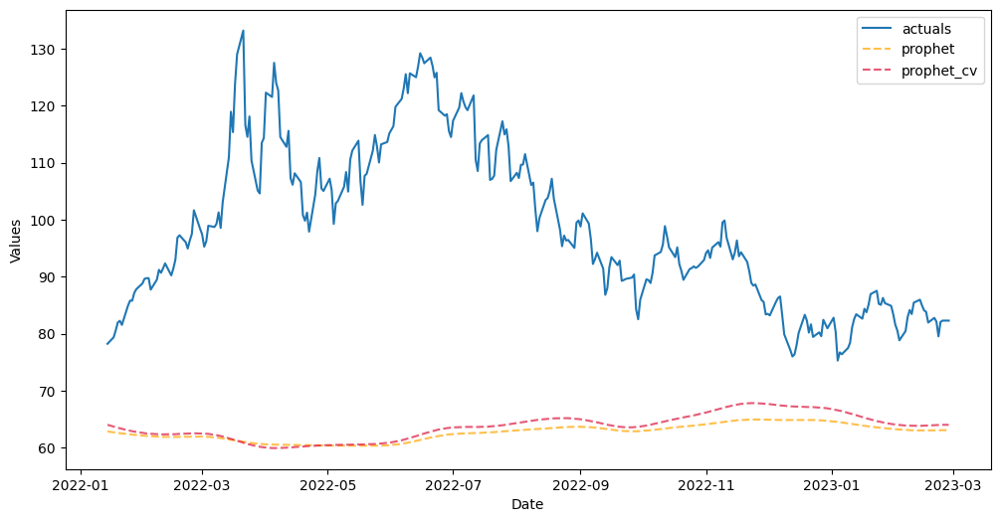

In [ ]:
# plot the cross validated forecast against standard forecast
f_brent.plot_test_set(
    models=[
        "prophet",
        "prophet_cv"
    ],
    include_train=False,
)
plt.show()

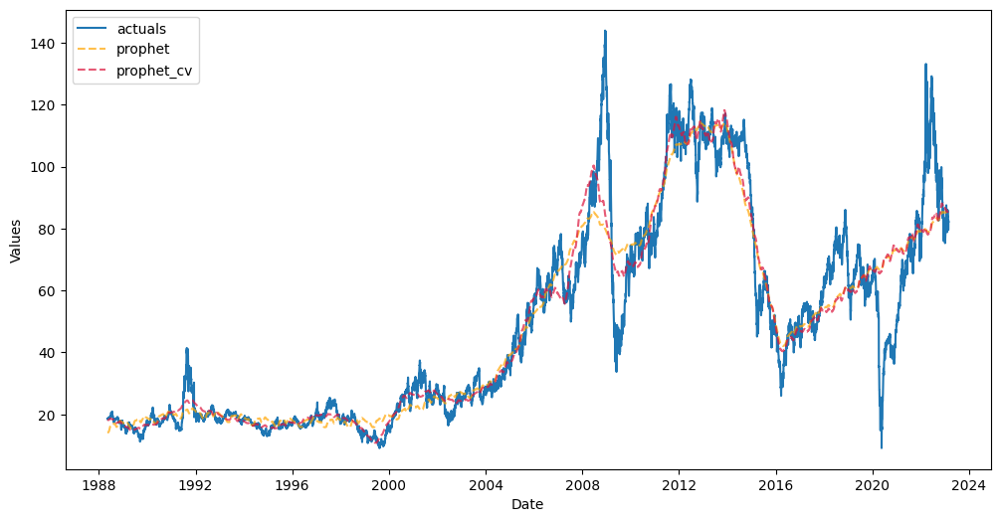

In [ ]:
f_brent.plot_fitted(
    models=[
        "prophet",
        "prophet_cv"
    ],
)
plt.show()

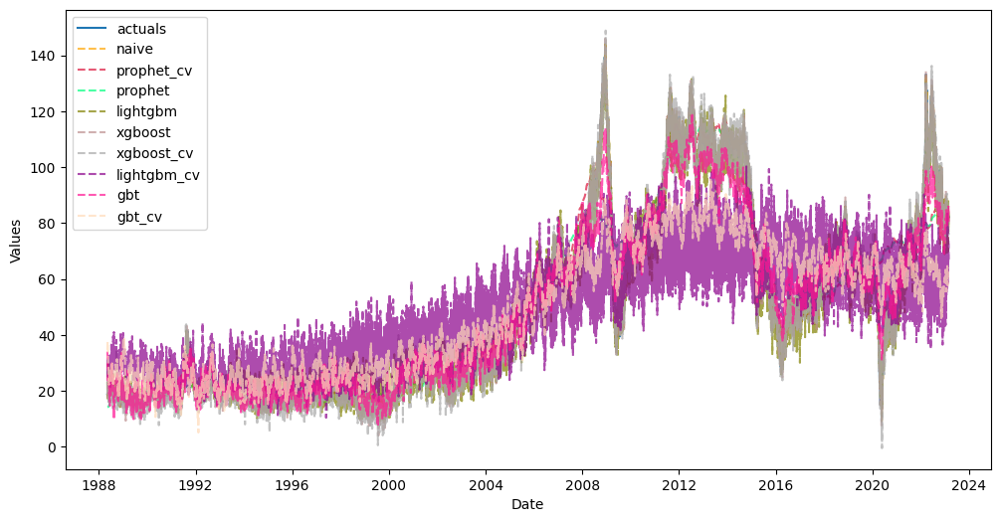

In [ ]:
f_brent.plot_fitted(order_by="TestSetRMSE")
plt.show()

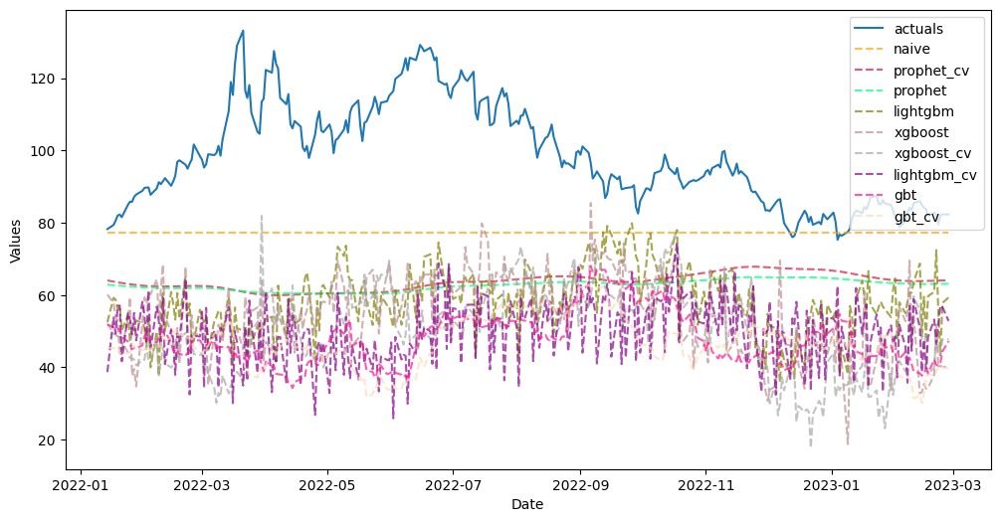

In [ ]:
f_brent.plot_test_set(order_by="TestSetRMSE",include_train=False,)
plt.show()

### 6) HSE

In [ ]:
f_brent.set_estimator('hwes')
f_brent.manual_forecast()

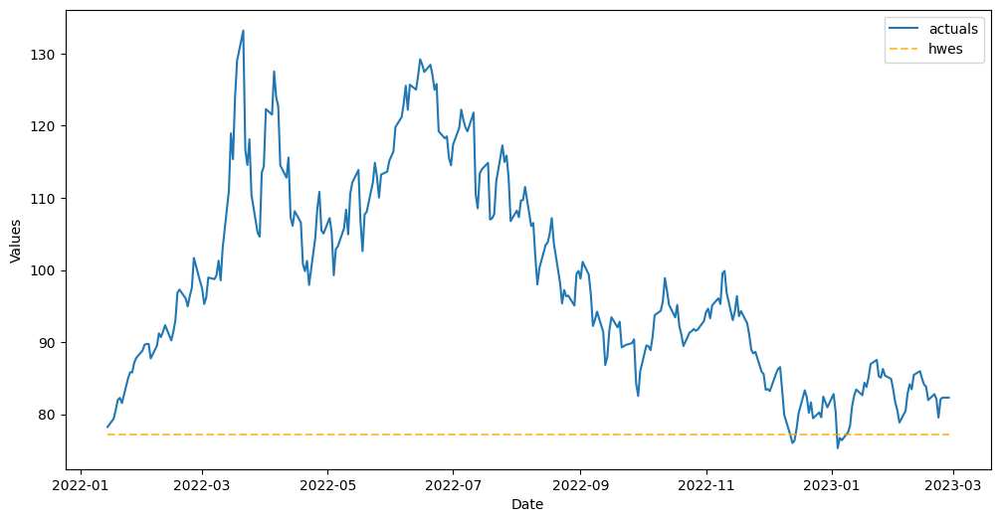

In [ ]:
# plot the test set actuals against the forecasted
f_brent.plot_test_set(
    models=[
        "hwes",
    ],
    include_train=False,
)
plt.show()

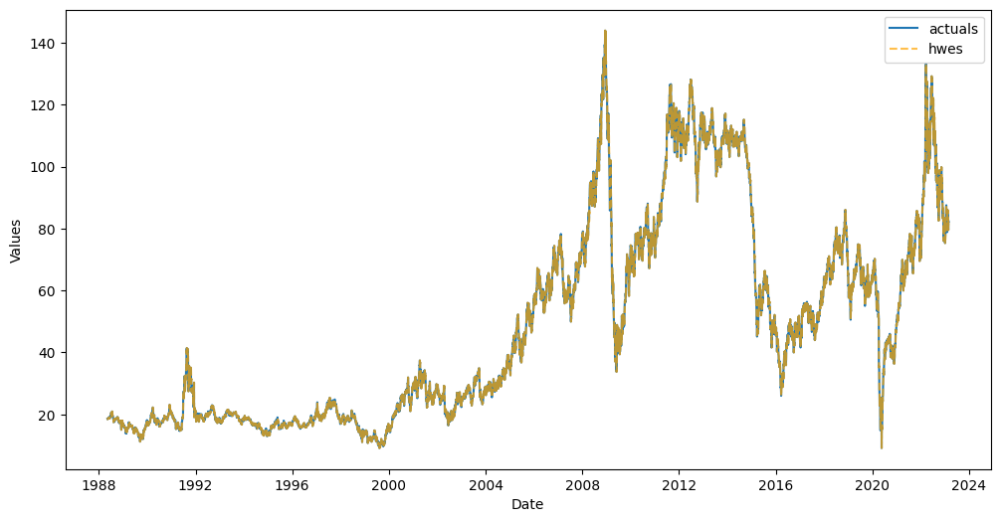

In [ ]:
f_brent.plot_fitted(
    models=[
        "hwes",
    ],
    # include_train=False,
)
plt.show()

In [ ]:
hwes_grid = {
    'trend':['add',None],
    'seasonal':['add',None],
    'use_boxcox':[True,False],
}
f_brent.ingest_grid(hwes_grid)

In [ ]:
f_brent.cross_validate(k=375,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f_brent.auto_forecast(call_me="hwes_cv")

Num hyperparams to try for the hwes model: 8.
Fold 0: Train size: 506 (2020-01-07 00:00:00 - 2021-12-14 00:00:00). Test Size: 22 (2021-12-15 00:00:00 - 2022-01-13 00:00:00). 


Fold 1: Train size: 506 (2019-12-06 00:00:00 - 2021-11-12 00:00:00). Test Size: 22 (2021-11-15 00:00:00 - 2021-12-14 00:00:00). 


Fold 2: Train size: 506 (2019-11-06 00:00:00 - 2021-10-13 00:00:00). Test Size: 22 (2021-10-14 00:00:00 - 2021-11-12 00:00:00). 


Fold 3: Train size: 506 (2019-10-07 00:00:00 - 2021-09-13 00:00:00). Test Size: 22 (2021-09-14 00:00:00 - 2021-10-13 00:00:00). 


Fold 4: Train size: 506 (2019-09-05 00:00:00 - 2021-08-12 00:00:00). Test Size: 22 (2021-08-13 00:00:00 - 2021-09-13 00:00:00). 


Fold 5: Train size: 506 (2019-08-06 00:00:00 - 2021-07-13 00:00:00). Test Size: 22 (2021-07-14 00:00:00 - 2021-08-12 00:00:00). 


Fold 6: Train size: 506 (2019-07-05 00:00:00 - 2021-06-11 00:00:00). Test Size: 22 (2021-06-14 00:00:00 - 2021-07-13 00:00:00). 


Fold 7: Train size: 506 (2019-06-05 00:00:00 - 2021-05-12 00:00:00). Test Size: 22 (2021-05-13 00:00:00 - 2021-06-11 00:00:00). 


Fold 8: Train size: 506 (2019-05-06 00:00:00 - 2021-04-12 00:00:00). Test Size: 22 (2021-04-13 00:00:00 - 2021-05-12 00:00:00). 


Fold 9: Train size: 506 (2019-04-04 00:00:00 - 2021-03-11 00:00:00). Test Size: 22 (2021-03-12 00:00:00 - 2021-04-12 00:00:00). 


Fold 10: Train size: 506 (2019-03-05 00:00:00 - 2021-02-09 00:00:00). Test Size: 22 (2021-02-10 00:00:00 - 2021-03-11 00:00:00). 


Fold 11: Train size: 506 (2019-02-01 00:00:00 - 2021-01-08 00:00:00). Test Size: 22 (2021-01-11 00:00:00 - 2021-02-09 00:00:00). 


Fold 12: Train size: 506 (2019-01-02 00:00:00 - 2020-12-09 00:00:00). Test Size: 22 (2020-12-10 00:00:00 - 2021-01-08 00:00:00). 


Fold 13: Train size: 506 (2018-12-03 00:00:00 - 2020-11-09 00:00:00). Test Size: 22 (2020-11-10 00:00:00 - 2020-12-09 00:00:00). 


Fold 14: Train size: 506 (2018-11-01 00:00:00 - 2020-10-08 00:00:00). Test Size: 22 (2020-10-09 00:00:00 - 2020-11-09 00:00:00). 


Fold 15: Train size: 506 (2018-10-02 00:00:00 - 2020-09-08 00:00:00). Test Size: 22 (2020-09-09 00:00:00 - 2020-10-08 00:00:00). 


Fold 16: Train size: 506 (2018-08-31 00:00:00 - 2020-08-07 00:00:00). Test Size: 22 (2020-08-10 00:00:00 - 2020-09-08 00:00:00). 


Fold 17: Train size: 506 (2018-08-01 00:00:00 - 2020-07-08 00:00:00). Test Size: 22 (2020-07-09 00:00:00 - 2020-08-07 00:00:00). 


Fold 18: Train size: 506 (2018-07-02 00:00:00 - 2020-06-08 00:00:00). Test Size: 22 (2020-06-09 00:00:00 - 2020-07-08 00:00:00). 


Fold 19: Train size: 506 (2018-05-31 00:00:00 - 2020-05-07 00:00:00). Test Size: 22 (2020-05-08 00:00:00 - 2020-06-08 00:00:00). 


Fold 20: Train size: 506 (2018-05-01 00:00:00 - 2020-04-07 00:00:00). Test Size: 22 (2020-04-08 00:00:00 - 2020-05-07 00:00:00). 


Fold 21: Train size: 506 (2018-03-30 00:00:00 - 2020-03-06 00:00:00). Test Size: 22 (2020-03-09 00:00:00 - 2020-04-07 00:00:00). 


Fold 22: Train size: 506 (2018-02-28 00:00:00 - 2020-02-05 00:00:00). Test Size: 22 (2020-02-06 00:00:00 - 2020-03-06 00:00:00). 


Fold 23: Train size: 506 (2018-01-29 00:00:00 - 2020-01-06 00:00:00). Test Size: 22 (2020-01-07 00:00:00 - 2020-02-05 00:00:00). 


Fold 24: Train size: 506 (2017-12-28 00:00:00 - 2019-12-05 00:00:00). Test Size: 22 (2019-12-06 00:00:00 - 2020-01-06 00:00:00). 


Fold 25: Train size: 506 (2017-11-28 00:00:00 - 2019-11-05 00:00:00). Test Size: 22 (2019-11-06 00:00:00 - 2019-12-05 00:00:00). 


Fold 26: Train size: 506 (2017-10-27 00:00:00 - 2019-10-04 00:00:00). Test Size: 22 (2019-10-07 00:00:00 - 2019-11-05 00:00:00). 


Fold 27: Train size: 506 (2017-09-27 00:00:00 - 2019-09-04 00:00:00). Test Size: 22 (2019-09-05 00:00:00 - 2019-10-04 00:00:00). 


Fold 28: Train size: 506 (2017-08-28 00:00:00 - 2019-08-05 00:00:00). Test Size: 22 (2019-08-06 00:00:00 - 2019-09-04 00:00:00). 


Fold 29: Train size: 506 (2017-07-27 00:00:00 - 2019-07-04 00:00:00). Test Size: 22 (2019-07-05 00:00:00 - 2019-08-05 00:00:00). 


Fold 30: Train size: 506 (2017-06-27 00:00:00 - 2019-06-04 00:00:00). Test Size: 22 (2019-06-05 00:00:00 - 2019-07-04 00:00:00). 


Fold 31: Train size: 506 (2017-05-26 00:00:00 - 2019-05-03 00:00:00). Test Size: 22 (2019-05-06 00:00:00 - 2019-06-04 00:00:00). 


Fold 32: Train size: 506 (2017-04-26 00:00:00 - 2019-04-03 00:00:00). Test Size: 22 (2019-04-04 00:00:00 - 2019-05-03 00:00:00). 


Fold 33: Train size: 506 (2017-03-27 00:00:00 - 2019-03-04 00:00:00). Test Size: 22 (2019-03-05 00:00:00 - 2019-04-03 00:00:00). 


Fold 34: Train size: 506 (2017-02-23 00:00:00 - 2019-01-31 00:00:00). Test Size: 22 (2019-02-01 00:00:00 - 2019-03-04 00:00:00). 


Fold 35: Train size: 506 (2017-01-24 00:00:00 - 2019-01-01 00:00:00). Test Size: 22 (2019-01-02 00:00:00 - 2019-01-31 00:00:00). 


Fold 36: Train size: 506 (2016-12-23 00:00:00 - 2018-11-30 00:00:00). Test Size: 22 (2018-12-03 00:00:00 - 2019-01-01 00:00:00). 


Fold 37: Train size: 506 (2016-11-23 00:00:00 - 2018-10-31 00:00:00). Test Size: 22 (2018-11-01 00:00:00 - 2018-11-30 00:00:00). 


Fold 38: Train size: 506 (2016-10-24 00:00:00 - 2018-10-01 00:00:00). Test Size: 22 (2018-10-02 00:00:00 - 2018-10-31 00:00:00). 


Fold 39: Train size: 506 (2016-09-22 00:00:00 - 2018-08-30 00:00:00). Test Size: 22 (2018-08-31 00:00:00 - 2018-10-01 00:00:00). 


Fold 40: Train size: 506 (2016-08-23 00:00:00 - 2018-07-31 00:00:00). Test Size: 22 (2018-08-01 00:00:00 - 2018-08-30 00:00:00). 


Fold 41: Train size: 506 (2016-07-22 00:00:00 - 2018-06-29 00:00:00). Test Size: 22 (2018-07-02 00:00:00 - 2018-07-31 00:00:00). 


Fold 42: Train size: 506 (2016-06-22 00:00:00 - 2018-05-30 00:00:00). Test Size: 22 (2018-05-31 00:00:00 - 2018-06-29 00:00:00). 


Fold 43: Train size: 506 (2016-05-23 00:00:00 - 2018-04-30 00:00:00). Test Size: 22 (2018-05-01 00:00:00 - 2018-05-30 00:00:00). 


Fold 44: Train size: 506 (2016-04-21 00:00:00 - 2018-03-29 00:00:00). Test Size: 22 (2018-03-30 00:00:00 - 2018-04-30 00:00:00). 


Fold 45: Train size: 506 (2016-03-22 00:00:00 - 2018-02-27 00:00:00). Test Size: 22 (2018-02-28 00:00:00 - 2018-03-29 00:00:00). 


Fold 46: Train size: 506 (2016-02-19 00:00:00 - 2018-01-26 00:00:00). Test Size: 22 (2018-01-29 00:00:00 - 2018-02-27 00:00:00). 


Fold 47: Train size: 506 (2016-01-20 00:00:00 - 2017-12-27 00:00:00). Test Size: 22 (2017-12-28 00:00:00 - 2018-01-26 00:00:00). 


Fold 48: Train size: 506 (2015-12-21 00:00:00 - 2017-11-27 00:00:00). Test Size: 22 (2017-11-28 00:00:00 - 2017-12-27 00:00:00). 


Fold 49: Train size: 506 (2015-11-19 00:00:00 - 2017-10-26 00:00:00). Test Size: 22 (2017-10-27 00:00:00 - 2017-11-27 00:00:00). 


Fold 50: Train size: 506 (2015-10-20 00:00:00 - 2017-09-26 00:00:00). Test Size: 22 (2017-09-27 00:00:00 - 2017-10-26 00:00:00). 


Fold 51: Train size: 506 (2015-09-18 00:00:00 - 2017-08-25 00:00:00). Test Size: 22 (2017-08-28 00:00:00 - 2017-09-26 00:00:00). 


Fold 52: Train size: 506 (2015-08-19 00:00:00 - 2017-07-26 00:00:00). Test Size: 22 (2017-07-27 00:00:00 - 2017-08-25 00:00:00). 


Fold 53: Train size: 506 (2015-07-20 00:00:00 - 2017-06-26 00:00:00). Test Size: 22 (2017-06-27 00:00:00 - 2017-07-26 00:00:00). 


Fold 54: Train size: 506 (2015-06-18 00:00:00 - 2017-05-25 00:00:00). Test Size: 22 (2017-05-26 00:00:00 - 2017-06-26 00:00:00). 


Fold 55: Train size: 506 (2015-05-19 00:00:00 - 2017-04-25 00:00:00). Test Size: 22 (2017-04-26 00:00:00 - 2017-05-25 00:00:00). 


Fold 56: Train size: 506 (2015-04-17 00:00:00 - 2017-03-24 00:00:00). Test Size: 22 (2017-03-27 00:00:00 - 2017-04-25 00:00:00). 


Fold 57: Train size: 506 (2015-03-18 00:00:00 - 2017-02-22 00:00:00). Test Size: 22 (2017-02-23 00:00:00 - 2017-03-24 00:00:00). 


Fold 58: Train size: 506 (2015-02-16 00:00:00 - 2017-01-23 00:00:00). Test Size: 22 (2017-01-24 00:00:00 - 2017-02-22 00:00:00). 


Fold 59: Train size: 506 (2015-01-15 00:00:00 - 2016-12-22 00:00:00). Test Size: 22 (2016-12-23 00:00:00 - 2017-01-23 00:00:00). 


Fold 60: Train size: 506 (2014-12-16 00:00:00 - 2016-11-22 00:00:00). Test Size: 22 (2016-11-23 00:00:00 - 2016-12-22 00:00:00). 


Fold 61: Train size: 506 (2014-11-14 00:00:00 - 2016-10-21 00:00:00). Test Size: 22 (2016-10-24 00:00:00 - 2016-11-22 00:00:00). 


Fold 62: Train size: 506 (2014-10-15 00:00:00 - 2016-09-21 00:00:00). Test Size: 22 (2016-09-22 00:00:00 - 2016-10-21 00:00:00). 


Fold 63: Train size: 506 (2014-09-15 00:00:00 - 2016-08-22 00:00:00). Test Size: 22 (2016-08-23 00:00:00 - 2016-09-21 00:00:00). 


Fold 64: Train size: 506 (2014-08-14 00:00:00 - 2016-07-21 00:00:00). Test Size: 22 (2016-07-22 00:00:00 - 2016-08-22 00:00:00). 


Fold 65: Train size: 506 (2014-07-15 00:00:00 - 2016-06-21 00:00:00). Test Size: 22 (2016-06-22 00:00:00 - 2016-07-21 00:00:00). 


Fold 66: Train size: 506 (2014-06-13 00:00:00 - 2016-05-20 00:00:00). Test Size: 22 (2016-05-23 00:00:00 - 2016-06-21 00:00:00). 


Fold 67: Train size: 506 (2014-05-14 00:00:00 - 2016-04-20 00:00:00). Test Size: 22 (2016-04-21 00:00:00 - 2016-05-20 00:00:00). 


Fold 68: Train size: 506 (2014-04-14 00:00:00 - 2016-03-21 00:00:00). Test Size: 22 (2016-03-22 00:00:00 - 2016-04-20 00:00:00). 


Fold 69: Train size: 506 (2014-03-13 00:00:00 - 2016-02-18 00:00:00). Test Size: 22 (2016-02-19 00:00:00 - 2016-03-21 00:00:00). 


Fold 70: Train size: 506 (2014-02-11 00:00:00 - 2016-01-19 00:00:00). Test Size: 22 (2016-01-20 00:00:00 - 2016-02-18 00:00:00). 


Fold 71: Train size: 506 (2014-01-10 00:00:00 - 2015-12-18 00:00:00). Test Size: 22 (2015-12-21 00:00:00 - 2016-01-19 00:00:00). 


Fold 72: Train size: 506 (2013-12-11 00:00:00 - 2015-11-18 00:00:00). Test Size: 22 (2015-11-19 00:00:00 - 2015-12-18 00:00:00). 


Fold 73: Train size: 506 (2013-11-11 00:00:00 - 2015-10-19 00:00:00). Test Size: 22 (2015-10-20 00:00:00 - 2015-11-18 00:00:00). 


Fold 74: Train size: 506 (2013-10-10 00:00:00 - 2015-09-17 00:00:00). Test Size: 22 (2015-09-18 00:00:00 - 2015-10-19 00:00:00). 


Fold 75: Train size: 506 (2013-09-10 00:00:00 - 2015-08-18 00:00:00). Test Size: 22 (2015-08-19 00:00:00 - 2015-09-17 00:00:00). 


Fold 76: Train size: 506 (2013-08-09 00:00:00 - 2015-07-17 00:00:00). Test Size: 22 (2015-07-20 00:00:00 - 2015-08-18 00:00:00). 


Fold 77: Train size: 506 (2013-07-10 00:00:00 - 2015-06-17 00:00:00). Test Size: 22 (2015-06-18 00:00:00 - 2015-07-17 00:00:00). 


Fold 78: Train size: 506 (2013-06-10 00:00:00 - 2015-05-18 00:00:00). Test Size: 22 (2015-05-19 00:00:00 - 2015-06-17 00:00:00). 


Fold 79: Train size: 506 (2013-05-09 00:00:00 - 2015-04-16 00:00:00). Test Size: 22 (2015-04-17 00:00:00 - 2015-05-18 00:00:00). 


Fold 80: Train size: 506 (2013-04-09 00:00:00 - 2015-03-17 00:00:00). Test Size: 22 (2015-03-18 00:00:00 - 2015-04-16 00:00:00). 


Fold 81: Train size: 506 (2013-03-08 00:00:00 - 2015-02-13 00:00:00). Test Size: 22 (2015-02-16 00:00:00 - 2015-03-17 00:00:00). 


Fold 82: Train size: 506 (2013-02-06 00:00:00 - 2015-01-14 00:00:00). Test Size: 22 (2015-01-15 00:00:00 - 2015-02-13 00:00:00). 


Fold 83: Train size: 506 (2013-01-07 00:00:00 - 2014-12-15 00:00:00). Test Size: 22 (2014-12-16 00:00:00 - 2015-01-14 00:00:00). 


Fold 84: Train size: 506 (2012-12-06 00:00:00 - 2014-11-13 00:00:00). Test Size: 22 (2014-11-14 00:00:00 - 2014-12-15 00:00:00). 


Fold 85: Train size: 506 (2012-11-06 00:00:00 - 2014-10-14 00:00:00). Test Size: 22 (2014-10-15 00:00:00 - 2014-11-13 00:00:00). 


Fold 86: Train size: 506 (2012-10-05 00:00:00 - 2014-09-12 00:00:00). Test Size: 22 (2014-09-15 00:00:00 - 2014-10-14 00:00:00). 


Fold 87: Train size: 506 (2012-09-05 00:00:00 - 2014-08-13 00:00:00). Test Size: 22 (2014-08-14 00:00:00 - 2014-09-12 00:00:00). 


Fold 88: Train size: 506 (2012-08-06 00:00:00 - 2014-07-14 00:00:00). Test Size: 22 (2014-07-15 00:00:00 - 2014-08-13 00:00:00). 


Fold 89: Train size: 506 (2012-07-05 00:00:00 - 2014-06-12 00:00:00). Test Size: 22 (2014-06-13 00:00:00 - 2014-07-14 00:00:00). 


Fold 90: Train size: 506 (2012-06-05 00:00:00 - 2014-05-13 00:00:00). Test Size: 22 (2014-05-14 00:00:00 - 2014-06-12 00:00:00). 


Fold 91: Train size: 506 (2012-05-04 00:00:00 - 2014-04-11 00:00:00). Test Size: 22 (2014-04-14 00:00:00 - 2014-05-13 00:00:00). 


Fold 92: Train size: 506 (2012-04-04 00:00:00 - 2014-03-12 00:00:00). Test Size: 22 (2014-03-13 00:00:00 - 2014-04-11 00:00:00). 


Fold 93: Train size: 506 (2012-03-05 00:00:00 - 2014-02-10 00:00:00). Test Size: 22 (2014-02-11 00:00:00 - 2014-03-12 00:00:00). 


Fold 94: Train size: 506 (2012-02-02 00:00:00 - 2014-01-09 00:00:00). Test Size: 22 (2014-01-10 00:00:00 - 2014-02-10 00:00:00). 


Fold 95: Train size: 506 (2012-01-03 00:00:00 - 2013-12-10 00:00:00). Test Size: 22 (2013-12-11 00:00:00 - 2014-01-09 00:00:00). 


Fold 96: Train size: 506 (2011-12-02 00:00:00 - 2013-11-08 00:00:00). Test Size: 22 (2013-11-11 00:00:00 - 2013-12-10 00:00:00). 


Fold 97: Train size: 506 (2011-11-02 00:00:00 - 2013-10-09 00:00:00). Test Size: 22 (2013-10-10 00:00:00 - 2013-11-08 00:00:00). 


Fold 98: Train size: 506 (2011-10-03 00:00:00 - 2013-09-09 00:00:00). Test Size: 22 (2013-09-10 00:00:00 - 2013-10-09 00:00:00). 


Fold 99: Train size: 506 (2011-09-01 00:00:00 - 2013-08-08 00:00:00). Test Size: 22 (2013-08-09 00:00:00 - 2013-09-09 00:00:00). 


Fold 100: Train size: 506 (2011-08-02 00:00:00 - 2013-07-09 00:00:00). Test Size: 22 (2013-07-10 00:00:00 - 2013-08-08 00:00:00). 


Fold 101: Train size: 506 (2011-07-01 00:00:00 - 2013-06-07 00:00:00). Test Size: 22 (2013-06-10 00:00:00 - 2013-07-09 00:00:00). 


Fold 102: Train size: 506 (2011-06-01 00:00:00 - 2013-05-08 00:00:00). Test Size: 22 (2013-05-09 00:00:00 - 2013-06-07 00:00:00). 


Fold 103: Train size: 506 (2011-05-02 00:00:00 - 2013-04-08 00:00:00). Test Size: 22 (2013-04-09 00:00:00 - 2013-05-08 00:00:00). 


Fold 104: Train size: 506 (2011-03-31 00:00:00 - 2013-03-07 00:00:00). Test Size: 22 (2013-03-08 00:00:00 - 2013-04-08 00:00:00). 


Fold 105: Train size: 506 (2011-03-01 00:00:00 - 2013-02-05 00:00:00). Test Size: 22 (2013-02-06 00:00:00 - 2013-03-07 00:00:00). 


Fold 106: Train size: 506 (2011-01-28 00:00:00 - 2013-01-04 00:00:00). Test Size: 22 (2013-01-07 00:00:00 - 2013-02-05 00:00:00). 


Fold 107: Train size: 506 (2010-12-29 00:00:00 - 2012-12-05 00:00:00). Test Size: 22 (2012-12-06 00:00:00 - 2013-01-04 00:00:00). 


Fold 108: Train size: 506 (2010-11-29 00:00:00 - 2012-11-05 00:00:00). Test Size: 22 (2012-11-06 00:00:00 - 2012-12-05 00:00:00). 


Fold 109: Train size: 506 (2010-10-28 00:00:00 - 2012-10-04 00:00:00). Test Size: 22 (2012-10-05 00:00:00 - 2012-11-05 00:00:00). 


Fold 110: Train size: 506 (2010-09-28 00:00:00 - 2012-09-04 00:00:00). Test Size: 22 (2012-09-05 00:00:00 - 2012-10-04 00:00:00). 


Fold 111: Train size: 506 (2010-08-27 00:00:00 - 2012-08-03 00:00:00). Test Size: 22 (2012-08-06 00:00:00 - 2012-09-04 00:00:00). 


Fold 112: Train size: 506 (2010-07-28 00:00:00 - 2012-07-04 00:00:00). Test Size: 22 (2012-07-05 00:00:00 - 2012-08-03 00:00:00). 


Fold 113: Train size: 506 (2010-06-28 00:00:00 - 2012-06-04 00:00:00). Test Size: 22 (2012-06-05 00:00:00 - 2012-07-04 00:00:00). 


Fold 114: Train size: 506 (2010-05-27 00:00:00 - 2012-05-03 00:00:00). Test Size: 22 (2012-05-04 00:00:00 - 2012-06-04 00:00:00). 


Fold 115: Train size: 506 (2010-04-27 00:00:00 - 2012-04-03 00:00:00). Test Size: 22 (2012-04-04 00:00:00 - 2012-05-03 00:00:00). 


Fold 116: Train size: 506 (2010-03-26 00:00:00 - 2012-03-02 00:00:00). Test Size: 22 (2012-03-05 00:00:00 - 2012-04-03 00:00:00). 


Fold 117: Train size: 506 (2010-02-24 00:00:00 - 2012-02-01 00:00:00). Test Size: 22 (2012-02-02 00:00:00 - 2012-03-02 00:00:00). 


Fold 118: Train size: 506 (2010-01-25 00:00:00 - 2012-01-02 00:00:00). Test Size: 22 (2012-01-03 00:00:00 - 2012-02-01 00:00:00). 


Fold 119: Train size: 506 (2009-12-24 00:00:00 - 2011-12-01 00:00:00). Test Size: 22 (2011-12-02 00:00:00 - 2012-01-02 00:00:00). 


Fold 120: Train size: 506 (2009-11-24 00:00:00 - 2011-11-01 00:00:00). Test Size: 22 (2011-11-02 00:00:00 - 2011-12-01 00:00:00). 


Fold 121: Train size: 506 (2009-10-23 00:00:00 - 2011-09-30 00:00:00). Test Size: 22 (2011-10-03 00:00:00 - 2011-11-01 00:00:00). 


Fold 122: Train size: 506 (2009-09-23 00:00:00 - 2011-08-31 00:00:00). Test Size: 22 (2011-09-01 00:00:00 - 2011-09-30 00:00:00). 


Fold 123: Train size: 506 (2009-08-24 00:00:00 - 2011-08-01 00:00:00). Test Size: 22 (2011-08-02 00:00:00 - 2011-08-31 00:00:00). 


Fold 124: Train size: 506 (2009-07-23 00:00:00 - 2011-06-30 00:00:00). Test Size: 22 (2011-07-01 00:00:00 - 2011-08-01 00:00:00). 


Fold 125: Train size: 506 (2009-06-23 00:00:00 - 2011-05-31 00:00:00). Test Size: 22 (2011-06-01 00:00:00 - 2011-06-30 00:00:00). 


Fold 126: Train size: 506 (2009-05-22 00:00:00 - 2011-04-29 00:00:00). Test Size: 22 (2011-05-02 00:00:00 - 2011-05-31 00:00:00). 


Fold 127: Train size: 506 (2009-04-22 00:00:00 - 2011-03-30 00:00:00). Test Size: 22 (2011-03-31 00:00:00 - 2011-04-29 00:00:00). 


Fold 128: Train size: 506 (2009-03-23 00:00:00 - 2011-02-28 00:00:00). Test Size: 22 (2011-03-01 00:00:00 - 2011-03-30 00:00:00). 


Fold 129: Train size: 506 (2009-02-19 00:00:00 - 2011-01-27 00:00:00). Test Size: 22 (2011-01-28 00:00:00 - 2011-02-28 00:00:00). 


Fold 130: Train size: 506 (2009-01-20 00:00:00 - 2010-12-28 00:00:00). Test Size: 22 (2010-12-29 00:00:00 - 2011-01-27 00:00:00). 


Fold 131: Train size: 506 (2008-12-19 00:00:00 - 2010-11-26 00:00:00). Test Size: 22 (2010-11-29 00:00:00 - 2010-12-28 00:00:00). 


Fold 132: Train size: 506 (2008-11-19 00:00:00 - 2010-10-27 00:00:00). Test Size: 22 (2010-10-28 00:00:00 - 2010-11-26 00:00:00). 


Fold 133: Train size: 506 (2008-10-20 00:00:00 - 2010-09-27 00:00:00). Test Size: 22 (2010-09-28 00:00:00 - 2010-10-27 00:00:00). 


Fold 134: Train size: 506 (2008-09-18 00:00:00 - 2010-08-26 00:00:00). Test Size: 22 (2010-08-27 00:00:00 - 2010-09-27 00:00:00). 


Fold 135: Train size: 506 (2008-08-19 00:00:00 - 2010-07-27 00:00:00). Test Size: 22 (2010-07-28 00:00:00 - 2010-08-26 00:00:00). 


Fold 136: Train size: 506 (2008-07-18 00:00:00 - 2010-06-25 00:00:00). Test Size: 22 (2010-06-28 00:00:00 - 2010-07-27 00:00:00). 


Fold 137: Train size: 506 (2008-06-18 00:00:00 - 2010-05-26 00:00:00). Test Size: 22 (2010-05-27 00:00:00 - 2010-06-25 00:00:00). 


Fold 138: Train size: 506 (2008-05-19 00:00:00 - 2010-04-26 00:00:00). Test Size: 22 (2010-04-27 00:00:00 - 2010-05-26 00:00:00). 


Fold 139: Train size: 506 (2008-04-17 00:00:00 - 2010-03-25 00:00:00). Test Size: 22 (2010-03-26 00:00:00 - 2010-04-26 00:00:00). 


Fold 140: Train size: 506 (2008-03-18 00:00:00 - 2010-02-23 00:00:00). Test Size: 22 (2010-02-24 00:00:00 - 2010-03-25 00:00:00). 


Fold 141: Train size: 506 (2008-02-15 00:00:00 - 2010-01-22 00:00:00). Test Size: 22 (2010-01-25 00:00:00 - 2010-02-23 00:00:00). 


Fold 142: Train size: 506 (2008-01-16 00:00:00 - 2009-12-23 00:00:00). Test Size: 22 (2009-12-24 00:00:00 - 2010-01-22 00:00:00). 


Fold 143: Train size: 506 (2007-12-17 00:00:00 - 2009-11-23 00:00:00). Test Size: 22 (2009-11-24 00:00:00 - 2009-12-23 00:00:00). 


Fold 144: Train size: 506 (2007-11-15 00:00:00 - 2009-10-22 00:00:00). Test Size: 22 (2009-10-23 00:00:00 - 2009-11-23 00:00:00). 


Fold 145: Train size: 506 (2007-10-16 00:00:00 - 2009-09-22 00:00:00). Test Size: 22 (2009-09-23 00:00:00 - 2009-10-22 00:00:00). 


Fold 146: Train size: 506 (2007-09-14 00:00:00 - 2009-08-21 00:00:00). Test Size: 22 (2009-08-24 00:00:00 - 2009-09-22 00:00:00). 


Fold 147: Train size: 506 (2007-08-15 00:00:00 - 2009-07-22 00:00:00). Test Size: 22 (2009-07-23 00:00:00 - 2009-08-21 00:00:00). 


Fold 148: Train size: 506 (2007-07-16 00:00:00 - 2009-06-22 00:00:00). Test Size: 22 (2009-06-23 00:00:00 - 2009-07-22 00:00:00). 


Fold 149: Train size: 506 (2007-06-14 00:00:00 - 2009-05-21 00:00:00). Test Size: 22 (2009-05-22 00:00:00 - 2009-06-22 00:00:00). 


Fold 150: Train size: 506 (2007-05-15 00:00:00 - 2009-04-21 00:00:00). Test Size: 22 (2009-04-22 00:00:00 - 2009-05-21 00:00:00). 


Fold 151: Train size: 506 (2007-04-13 00:00:00 - 2009-03-20 00:00:00). Test Size: 22 (2009-03-23 00:00:00 - 2009-04-21 00:00:00). 


Fold 152: Train size: 506 (2007-03-14 00:00:00 - 2009-02-18 00:00:00). Test Size: 22 (2009-02-19 00:00:00 - 2009-03-20 00:00:00). 


Fold 153: Train size: 506 (2007-02-12 00:00:00 - 2009-01-19 00:00:00). Test Size: 22 (2009-01-20 00:00:00 - 2009-02-18 00:00:00). 


Fold 154: Train size: 506 (2007-01-11 00:00:00 - 2008-12-18 00:00:00). Test Size: 22 (2008-12-19 00:00:00 - 2009-01-19 00:00:00). 


Fold 155: Train size: 506 (2006-12-12 00:00:00 - 2008-11-18 00:00:00). Test Size: 22 (2008-11-19 00:00:00 - 2008-12-18 00:00:00). 


Fold 156: Train size: 506 (2006-11-10 00:00:00 - 2008-10-17 00:00:00). Test Size: 22 (2008-10-20 00:00:00 - 2008-11-18 00:00:00). 


Fold 157: Train size: 506 (2006-10-11 00:00:00 - 2008-09-17 00:00:00). Test Size: 22 (2008-09-18 00:00:00 - 2008-10-17 00:00:00). 


Fold 158: Train size: 506 (2006-09-11 00:00:00 - 2008-08-18 00:00:00). Test Size: 22 (2008-08-19 00:00:00 - 2008-09-17 00:00:00). 


Fold 159: Train size: 506 (2006-08-10 00:00:00 - 2008-07-17 00:00:00). Test Size: 22 (2008-07-18 00:00:00 - 2008-08-18 00:00:00). 


Fold 160: Train size: 506 (2006-07-11 00:00:00 - 2008-06-17 00:00:00). Test Size: 22 (2008-06-18 00:00:00 - 2008-07-17 00:00:00). 


Fold 161: Train size: 506 (2006-06-09 00:00:00 - 2008-05-16 00:00:00). Test Size: 22 (2008-05-19 00:00:00 - 2008-06-17 00:00:00). 


Fold 162: Train size: 506 (2006-05-10 00:00:00 - 2008-04-16 00:00:00). Test Size: 22 (2008-04-17 00:00:00 - 2008-05-16 00:00:00). 


Fold 163: Train size: 506 (2006-04-10 00:00:00 - 2008-03-17 00:00:00). Test Size: 22 (2008-03-18 00:00:00 - 2008-04-16 00:00:00). 


Fold 164: Train size: 506 (2006-03-09 00:00:00 - 2008-02-14 00:00:00). Test Size: 22 (2008-02-15 00:00:00 - 2008-03-17 00:00:00). 


Fold 165: Train size: 506 (2006-02-07 00:00:00 - 2008-01-15 00:00:00). Test Size: 22 (2008-01-16 00:00:00 - 2008-02-14 00:00:00). 


Fold 166: Train size: 506 (2006-01-06 00:00:00 - 2007-12-14 00:00:00). Test Size: 22 (2007-12-17 00:00:00 - 2008-01-15 00:00:00). 


Fold 167: Train size: 506 (2005-12-07 00:00:00 - 2007-11-14 00:00:00). Test Size: 22 (2007-11-15 00:00:00 - 2007-12-14 00:00:00). 


Fold 168: Train size: 506 (2005-11-07 00:00:00 - 2007-10-15 00:00:00). Test Size: 22 (2007-10-16 00:00:00 - 2007-11-14 00:00:00). 


Fold 169: Train size: 506 (2005-10-06 00:00:00 - 2007-09-13 00:00:00). Test Size: 22 (2007-09-14 00:00:00 - 2007-10-15 00:00:00). 


Fold 170: Train size: 506 (2005-09-06 00:00:00 - 2007-08-14 00:00:00). Test Size: 22 (2007-08-15 00:00:00 - 2007-09-13 00:00:00). 


Fold 171: Train size: 506 (2005-08-05 00:00:00 - 2007-07-13 00:00:00). Test Size: 22 (2007-07-16 00:00:00 - 2007-08-14 00:00:00). 


Fold 172: Train size: 506 (2005-07-06 00:00:00 - 2007-06-13 00:00:00). Test Size: 22 (2007-06-14 00:00:00 - 2007-07-13 00:00:00). 


Fold 173: Train size: 506 (2005-06-06 00:00:00 - 2007-05-14 00:00:00). Test Size: 22 (2007-05-15 00:00:00 - 2007-06-13 00:00:00). 


Fold 174: Train size: 506 (2005-05-05 00:00:00 - 2007-04-12 00:00:00). Test Size: 22 (2007-04-13 00:00:00 - 2007-05-14 00:00:00). 


Fold 175: Train size: 506 (2005-04-05 00:00:00 - 2007-03-13 00:00:00). Test Size: 22 (2007-03-14 00:00:00 - 2007-04-12 00:00:00). 


Fold 176: Train size: 506 (2005-03-04 00:00:00 - 2007-02-09 00:00:00). Test Size: 22 (2007-02-12 00:00:00 - 2007-03-13 00:00:00). 


Fold 177: Train size: 506 (2005-02-02 00:00:00 - 2007-01-10 00:00:00). Test Size: 22 (2007-01-11 00:00:00 - 2007-02-09 00:00:00). 


Fold 178: Train size: 506 (2005-01-03 00:00:00 - 2006-12-11 00:00:00). Test Size: 22 (2006-12-12 00:00:00 - 2007-01-10 00:00:00). 


Fold 179: Train size: 506 (2004-12-02 00:00:00 - 2006-11-09 00:00:00). Test Size: 22 (2006-11-10 00:00:00 - 2006-12-11 00:00:00). 


Fold 180: Train size: 506 (2004-11-02 00:00:00 - 2006-10-10 00:00:00). Test Size: 22 (2006-10-11 00:00:00 - 2006-11-09 00:00:00). 


Fold 181: Train size: 506 (2004-10-01 00:00:00 - 2006-09-08 00:00:00). Test Size: 22 (2006-09-11 00:00:00 - 2006-10-10 00:00:00). 


Fold 182: Train size: 506 (2004-09-01 00:00:00 - 2006-08-09 00:00:00). Test Size: 22 (2006-08-10 00:00:00 - 2006-09-08 00:00:00). 


Fold 183: Train size: 506 (2004-08-02 00:00:00 - 2006-07-10 00:00:00). Test Size: 22 (2006-07-11 00:00:00 - 2006-08-09 00:00:00). 


Fold 184: Train size: 506 (2004-07-01 00:00:00 - 2006-06-08 00:00:00). Test Size: 22 (2006-06-09 00:00:00 - 2006-07-10 00:00:00). 


Fold 185: Train size: 506 (2004-06-01 00:00:00 - 2006-05-09 00:00:00). Test Size: 22 (2006-05-10 00:00:00 - 2006-06-08 00:00:00). 


Fold 186: Train size: 506 (2004-04-30 00:00:00 - 2006-04-07 00:00:00). Test Size: 22 (2006-04-10 00:00:00 - 2006-05-09 00:00:00). 


Fold 187: Train size: 506 (2004-03-31 00:00:00 - 2006-03-08 00:00:00). Test Size: 22 (2006-03-09 00:00:00 - 2006-04-07 00:00:00). 


Fold 188: Train size: 506 (2004-03-01 00:00:00 - 2006-02-06 00:00:00). Test Size: 22 (2006-02-07 00:00:00 - 2006-03-08 00:00:00). 


Fold 189: Train size: 506 (2004-01-29 00:00:00 - 2006-01-05 00:00:00). Test Size: 22 (2006-01-06 00:00:00 - 2006-02-06 00:00:00). 


Fold 190: Train size: 506 (2003-12-30 00:00:00 - 2005-12-06 00:00:00). Test Size: 22 (2005-12-07 00:00:00 - 2006-01-05 00:00:00). 


Fold 191: Train size: 506 (2003-11-28 00:00:00 - 2005-11-04 00:00:00). Test Size: 22 (2005-11-07 00:00:00 - 2005-12-06 00:00:00). 


Fold 192: Train size: 506 (2003-10-29 00:00:00 - 2005-10-05 00:00:00). Test Size: 22 (2005-10-06 00:00:00 - 2005-11-04 00:00:00). 


Fold 193: Train size: 506 (2003-09-29 00:00:00 - 2005-09-05 00:00:00). Test Size: 22 (2005-09-06 00:00:00 - 2005-10-05 00:00:00). 


Fold 194: Train size: 506 (2003-08-28 00:00:00 - 2005-08-04 00:00:00). Test Size: 22 (2005-08-05 00:00:00 - 2005-09-05 00:00:00). 


Fold 195: Train size: 506 (2003-07-29 00:00:00 - 2005-07-05 00:00:00). Test Size: 22 (2005-07-06 00:00:00 - 2005-08-04 00:00:00). 


Fold 196: Train size: 506 (2003-06-27 00:00:00 - 2005-06-03 00:00:00). Test Size: 22 (2005-06-06 00:00:00 - 2005-07-05 00:00:00). 


Fold 197: Train size: 506 (2003-05-28 00:00:00 - 2005-05-04 00:00:00). Test Size: 22 (2005-05-05 00:00:00 - 2005-06-03 00:00:00). 


Fold 198: Train size: 506 (2003-04-28 00:00:00 - 2005-04-04 00:00:00). Test Size: 22 (2005-04-05 00:00:00 - 2005-05-04 00:00:00). 


Fold 199: Train size: 506 (2003-03-27 00:00:00 - 2005-03-03 00:00:00). Test Size: 22 (2005-03-04 00:00:00 - 2005-04-04 00:00:00). 


Fold 200: Train size: 506 (2003-02-25 00:00:00 - 2005-02-01 00:00:00). Test Size: 22 (2005-02-02 00:00:00 - 2005-03-03 00:00:00). 


Fold 201: Train size: 506 (2003-01-24 00:00:00 - 2004-12-31 00:00:00). Test Size: 22 (2005-01-03 00:00:00 - 2005-02-01 00:00:00). 


Fold 202: Train size: 506 (2002-12-25 00:00:00 - 2004-12-01 00:00:00). Test Size: 22 (2004-12-02 00:00:00 - 2004-12-31 00:00:00). 


Fold 203: Train size: 506 (2002-11-25 00:00:00 - 2004-11-01 00:00:00). Test Size: 22 (2004-11-02 00:00:00 - 2004-12-01 00:00:00). 


Fold 204: Train size: 506 (2002-10-24 00:00:00 - 2004-09-30 00:00:00). Test Size: 22 (2004-10-01 00:00:00 - 2004-11-01 00:00:00). 


Fold 205: Train size: 506 (2002-09-24 00:00:00 - 2004-08-31 00:00:00). Test Size: 22 (2004-09-01 00:00:00 - 2004-09-30 00:00:00). 


Fold 206: Train size: 506 (2002-08-23 00:00:00 - 2004-07-30 00:00:00). Test Size: 22 (2004-08-02 00:00:00 - 2004-08-31 00:00:00). 


Fold 207: Train size: 506 (2002-07-24 00:00:00 - 2004-06-30 00:00:00). Test Size: 22 (2004-07-01 00:00:00 - 2004-07-30 00:00:00). 


Fold 208: Train size: 506 (2002-06-24 00:00:00 - 2004-05-31 00:00:00). Test Size: 22 (2004-06-01 00:00:00 - 2004-06-30 00:00:00). 


Fold 209: Train size: 506 (2002-05-23 00:00:00 - 2004-04-29 00:00:00). Test Size: 22 (2004-04-30 00:00:00 - 2004-05-31 00:00:00). 


Fold 210: Train size: 506 (2002-04-23 00:00:00 - 2004-03-30 00:00:00). Test Size: 22 (2004-03-31 00:00:00 - 2004-04-29 00:00:00). 


Fold 211: Train size: 506 (2002-03-22 00:00:00 - 2004-02-27 00:00:00). Test Size: 22 (2004-03-01 00:00:00 - 2004-03-30 00:00:00). 


Fold 212: Train size: 506 (2002-02-20 00:00:00 - 2004-01-28 00:00:00). Test Size: 22 (2004-01-29 00:00:00 - 2004-02-27 00:00:00). 


Fold 213: Train size: 506 (2002-01-21 00:00:00 - 2003-12-29 00:00:00). Test Size: 22 (2003-12-30 00:00:00 - 2004-01-28 00:00:00). 


Fold 214: Train size: 506 (2001-12-20 00:00:00 - 2003-11-27 00:00:00). Test Size: 22 (2003-11-28 00:00:00 - 2003-12-29 00:00:00). 


Fold 215: Train size: 506 (2001-11-20 00:00:00 - 2003-10-28 00:00:00). Test Size: 22 (2003-10-29 00:00:00 - 2003-11-27 00:00:00). 


Fold 216: Train size: 506 (2001-10-19 00:00:00 - 2003-09-26 00:00:00). Test Size: 22 (2003-09-29 00:00:00 - 2003-10-28 00:00:00). 


Fold 217: Train size: 506 (2001-09-19 00:00:00 - 2003-08-27 00:00:00). Test Size: 22 (2003-08-28 00:00:00 - 2003-09-26 00:00:00). 


Fold 218: Train size: 506 (2001-08-20 00:00:00 - 2003-07-28 00:00:00). Test Size: 22 (2003-07-29 00:00:00 - 2003-08-27 00:00:00). 


Fold 219: Train size: 506 (2001-07-19 00:00:00 - 2003-06-26 00:00:00). Test Size: 22 (2003-06-27 00:00:00 - 2003-07-28 00:00:00). 


Fold 220: Train size: 506 (2001-06-19 00:00:00 - 2003-05-27 00:00:00). Test Size: 22 (2003-05-28 00:00:00 - 2003-06-26 00:00:00). 


Fold 221: Train size: 506 (2001-05-18 00:00:00 - 2003-04-25 00:00:00). Test Size: 22 (2003-04-28 00:00:00 - 2003-05-27 00:00:00). 


Fold 222: Train size: 506 (2001-04-18 00:00:00 - 2003-03-26 00:00:00). Test Size: 22 (2003-03-27 00:00:00 - 2003-04-25 00:00:00). 


Fold 223: Train size: 506 (2001-03-19 00:00:00 - 2003-02-24 00:00:00). Test Size: 22 (2003-02-25 00:00:00 - 2003-03-26 00:00:00). 


Fold 224: Train size: 506 (2001-02-15 00:00:00 - 2003-01-23 00:00:00). Test Size: 22 (2003-01-24 00:00:00 - 2003-02-24 00:00:00). 


Fold 225: Train size: 506 (2001-01-16 00:00:00 - 2002-12-24 00:00:00). Test Size: 22 (2002-12-25 00:00:00 - 2003-01-23 00:00:00). 


Fold 226: Train size: 506 (2000-12-15 00:00:00 - 2002-11-22 00:00:00). Test Size: 22 (2002-11-25 00:00:00 - 2002-12-24 00:00:00). 


Fold 227: Train size: 506 (2000-11-15 00:00:00 - 2002-10-23 00:00:00). Test Size: 22 (2002-10-24 00:00:00 - 2002-11-22 00:00:00). 


Fold 228: Train size: 506 (2000-10-16 00:00:00 - 2002-09-23 00:00:00). Test Size: 22 (2002-09-24 00:00:00 - 2002-10-23 00:00:00). 


Fold 229: Train size: 506 (2000-09-14 00:00:00 - 2002-08-22 00:00:00). Test Size: 22 (2002-08-23 00:00:00 - 2002-09-23 00:00:00). 


Fold 230: Train size: 506 (2000-08-15 00:00:00 - 2002-07-23 00:00:00). Test Size: 22 (2002-07-24 00:00:00 - 2002-08-22 00:00:00). 


Fold 231: Train size: 506 (2000-07-14 00:00:00 - 2002-06-21 00:00:00). Test Size: 22 (2002-06-24 00:00:00 - 2002-07-23 00:00:00). 


Fold 232: Train size: 506 (2000-06-14 00:00:00 - 2002-05-22 00:00:00). Test Size: 22 (2002-05-23 00:00:00 - 2002-06-21 00:00:00). 


Fold 233: Train size: 506 (2000-05-15 00:00:00 - 2002-04-22 00:00:00). Test Size: 22 (2002-04-23 00:00:00 - 2002-05-22 00:00:00). 


Fold 234: Train size: 506 (2000-04-13 00:00:00 - 2002-03-21 00:00:00). Test Size: 22 (2002-03-22 00:00:00 - 2002-04-22 00:00:00). 


Fold 235: Train size: 506 (2000-03-14 00:00:00 - 2002-02-19 00:00:00). Test Size: 22 (2002-02-20 00:00:00 - 2002-03-21 00:00:00). 


Fold 236: Train size: 506 (2000-02-11 00:00:00 - 2002-01-18 00:00:00). Test Size: 22 (2002-01-21 00:00:00 - 2002-02-19 00:00:00). 


Fold 237: Train size: 506 (2000-01-12 00:00:00 - 2001-12-19 00:00:00). Test Size: 22 (2001-12-20 00:00:00 - 2002-01-18 00:00:00). 


Fold 238: Train size: 506 (1999-12-13 00:00:00 - 2001-11-19 00:00:00). Test Size: 22 (2001-11-20 00:00:00 - 2001-12-19 00:00:00). 


Fold 239: Train size: 506 (1999-11-11 00:00:00 - 2001-10-18 00:00:00). Test Size: 22 (2001-10-19 00:00:00 - 2001-11-19 00:00:00). 


Fold 240: Train size: 506 (1999-10-12 00:00:00 - 2001-09-18 00:00:00). Test Size: 22 (2001-09-19 00:00:00 - 2001-10-18 00:00:00). 


Fold 241: Train size: 506 (1999-09-10 00:00:00 - 2001-08-17 00:00:00). Test Size: 22 (2001-08-20 00:00:00 - 2001-09-18 00:00:00). 


Fold 242: Train size: 506 (1999-08-11 00:00:00 - 2001-07-18 00:00:00). Test Size: 22 (2001-07-19 00:00:00 - 2001-08-17 00:00:00). 


Fold 243: Train size: 506 (1999-07-12 00:00:00 - 2001-06-18 00:00:00). Test Size: 22 (2001-06-19 00:00:00 - 2001-07-18 00:00:00). 


Fold 244: Train size: 506 (1999-06-10 00:00:00 - 2001-05-17 00:00:00). Test Size: 22 (2001-05-18 00:00:00 - 2001-06-18 00:00:00). 


Fold 245: Train size: 506 (1999-05-11 00:00:00 - 2001-04-17 00:00:00). Test Size: 22 (2001-04-18 00:00:00 - 2001-05-17 00:00:00). 


Fold 246: Train size: 506 (1999-04-09 00:00:00 - 2001-03-16 00:00:00). Test Size: 22 (2001-03-19 00:00:00 - 2001-04-17 00:00:00). 


Fold 247: Train size: 506 (1999-03-10 00:00:00 - 2001-02-14 00:00:00). Test Size: 22 (2001-02-15 00:00:00 - 2001-03-16 00:00:00). 


Fold 248: Train size: 506 (1999-02-08 00:00:00 - 2001-01-15 00:00:00). Test Size: 22 (2001-01-16 00:00:00 - 2001-02-14 00:00:00). 


Fold 249: Train size: 506 (1999-01-07 00:00:00 - 2000-12-14 00:00:00). Test Size: 22 (2000-12-15 00:00:00 - 2001-01-15 00:00:00). 


Fold 250: Train size: 506 (1998-12-08 00:00:00 - 2000-11-14 00:00:00). Test Size: 22 (2000-11-15 00:00:00 - 2000-12-14 00:00:00). 


Fold 251: Train size: 506 (1998-11-06 00:00:00 - 2000-10-13 00:00:00). Test Size: 22 (2000-10-16 00:00:00 - 2000-11-14 00:00:00). 


Fold 252: Train size: 506 (1998-10-07 00:00:00 - 2000-09-13 00:00:00). Test Size: 22 (2000-09-14 00:00:00 - 2000-10-13 00:00:00). 


Fold 253: Train size: 506 (1998-09-07 00:00:00 - 2000-08-14 00:00:00). Test Size: 22 (2000-08-15 00:00:00 - 2000-09-13 00:00:00). 


Fold 254: Train size: 506 (1998-08-06 00:00:00 - 2000-07-13 00:00:00). Test Size: 22 (2000-07-14 00:00:00 - 2000-08-14 00:00:00). 


Fold 255: Train size: 506 (1998-07-07 00:00:00 - 2000-06-13 00:00:00). Test Size: 22 (2000-06-14 00:00:00 - 2000-07-13 00:00:00). 


Fold 256: Train size: 506 (1998-06-05 00:00:00 - 2000-05-12 00:00:00). Test Size: 22 (2000-05-15 00:00:00 - 2000-06-13 00:00:00). 


Fold 257: Train size: 506 (1998-05-06 00:00:00 - 2000-04-12 00:00:00). Test Size: 22 (2000-04-13 00:00:00 - 2000-05-12 00:00:00). 


Fold 258: Train size: 506 (1998-04-06 00:00:00 - 2000-03-13 00:00:00). Test Size: 22 (2000-03-14 00:00:00 - 2000-04-12 00:00:00). 


Fold 259: Train size: 506 (1998-03-05 00:00:00 - 2000-02-10 00:00:00). Test Size: 22 (2000-02-11 00:00:00 - 2000-03-13 00:00:00). 


Fold 260: Train size: 506 (1998-02-03 00:00:00 - 2000-01-11 00:00:00). Test Size: 22 (2000-01-12 00:00:00 - 2000-02-10 00:00:00). 


Fold 261: Train size: 506 (1998-01-02 00:00:00 - 1999-12-10 00:00:00). Test Size: 22 (1999-12-13 00:00:00 - 2000-01-11 00:00:00). 


Fold 262: Train size: 506 (1997-12-03 00:00:00 - 1999-11-10 00:00:00). Test Size: 22 (1999-11-11 00:00:00 - 1999-12-10 00:00:00). 


Fold 263: Train size: 506 (1997-11-03 00:00:00 - 1999-10-11 00:00:00). Test Size: 22 (1999-10-12 00:00:00 - 1999-11-10 00:00:00). 


Fold 264: Train size: 506 (1997-10-02 00:00:00 - 1999-09-09 00:00:00). Test Size: 22 (1999-09-10 00:00:00 - 1999-10-11 00:00:00). 


Fold 265: Train size: 506 (1997-09-02 00:00:00 - 1999-08-10 00:00:00). Test Size: 22 (1999-08-11 00:00:00 - 1999-09-09 00:00:00). 


Fold 266: Train size: 506 (1997-08-01 00:00:00 - 1999-07-09 00:00:00). Test Size: 22 (1999-07-12 00:00:00 - 1999-08-10 00:00:00). 


Fold 267: Train size: 506 (1997-07-02 00:00:00 - 1999-06-09 00:00:00). Test Size: 22 (1999-06-10 00:00:00 - 1999-07-09 00:00:00). 


Fold 268: Train size: 506 (1997-06-02 00:00:00 - 1999-05-10 00:00:00). Test Size: 22 (1999-05-11 00:00:00 - 1999-06-09 00:00:00). 


Fold 269: Train size: 506 (1997-05-01 00:00:00 - 1999-04-08 00:00:00). Test Size: 22 (1999-04-09 00:00:00 - 1999-05-10 00:00:00). 


Fold 270: Train size: 506 (1997-04-01 00:00:00 - 1999-03-09 00:00:00). Test Size: 22 (1999-03-10 00:00:00 - 1999-04-08 00:00:00). 


Fold 271: Train size: 506 (1997-02-28 00:00:00 - 1999-02-05 00:00:00). Test Size: 22 (1999-02-08 00:00:00 - 1999-03-09 00:00:00). 


Fold 272: Train size: 506 (1997-01-29 00:00:00 - 1999-01-06 00:00:00). Test Size: 22 (1999-01-07 00:00:00 - 1999-02-05 00:00:00). 


Fold 273: Train size: 506 (1996-12-30 00:00:00 - 1998-12-07 00:00:00). Test Size: 22 (1998-12-08 00:00:00 - 1999-01-06 00:00:00). 


Fold 274: Train size: 506 (1996-11-28 00:00:00 - 1998-11-05 00:00:00). Test Size: 22 (1998-11-06 00:00:00 - 1998-12-07 00:00:00). 


Fold 275: Train size: 506 (1996-10-29 00:00:00 - 1998-10-06 00:00:00). Test Size: 22 (1998-10-07 00:00:00 - 1998-11-05 00:00:00). 


Fold 276: Train size: 506 (1996-09-27 00:00:00 - 1998-09-04 00:00:00). Test Size: 22 (1998-09-07 00:00:00 - 1998-10-06 00:00:00). 


Fold 277: Train size: 506 (1996-08-28 00:00:00 - 1998-08-05 00:00:00). Test Size: 22 (1998-08-06 00:00:00 - 1998-09-04 00:00:00). 


Fold 278: Train size: 506 (1996-07-29 00:00:00 - 1998-07-06 00:00:00). Test Size: 22 (1998-07-07 00:00:00 - 1998-08-05 00:00:00). 


Fold 279: Train size: 506 (1996-06-27 00:00:00 - 1998-06-04 00:00:00). Test Size: 22 (1998-06-05 00:00:00 - 1998-07-06 00:00:00). 


Fold 280: Train size: 506 (1996-05-28 00:00:00 - 1998-05-05 00:00:00). Test Size: 22 (1998-05-06 00:00:00 - 1998-06-04 00:00:00). 


Fold 281: Train size: 506 (1996-04-26 00:00:00 - 1998-04-03 00:00:00). Test Size: 22 (1998-04-06 00:00:00 - 1998-05-05 00:00:00). 


Fold 282: Train size: 506 (1996-03-27 00:00:00 - 1998-03-04 00:00:00). Test Size: 22 (1998-03-05 00:00:00 - 1998-04-03 00:00:00). 


Fold 283: Train size: 506 (1996-02-26 00:00:00 - 1998-02-02 00:00:00). Test Size: 22 (1998-02-03 00:00:00 - 1998-03-04 00:00:00). 


Fold 284: Train size: 506 (1996-01-25 00:00:00 - 1998-01-01 00:00:00). Test Size: 22 (1998-01-02 00:00:00 - 1998-02-02 00:00:00). 


Fold 285: Train size: 506 (1995-12-26 00:00:00 - 1997-12-02 00:00:00). Test Size: 22 (1997-12-03 00:00:00 - 1998-01-01 00:00:00). 


Fold 286: Train size: 506 (1995-11-24 00:00:00 - 1997-10-31 00:00:00). Test Size: 22 (1997-11-03 00:00:00 - 1997-12-02 00:00:00). 


Fold 287: Train size: 506 (1995-10-25 00:00:00 - 1997-10-01 00:00:00). Test Size: 22 (1997-10-02 00:00:00 - 1997-10-31 00:00:00). 


Fold 288: Train size: 506 (1995-09-25 00:00:00 - 1997-09-01 00:00:00). Test Size: 22 (1997-09-02 00:00:00 - 1997-10-01 00:00:00). 


Fold 289: Train size: 506 (1995-08-24 00:00:00 - 1997-07-31 00:00:00). Test Size: 22 (1997-08-01 00:00:00 - 1997-09-01 00:00:00). 


Fold 290: Train size: 506 (1995-07-25 00:00:00 - 1997-07-01 00:00:00). Test Size: 22 (1997-07-02 00:00:00 - 1997-07-31 00:00:00). 


Fold 291: Train size: 506 (1995-06-23 00:00:00 - 1997-05-30 00:00:00). Test Size: 22 (1997-06-02 00:00:00 - 1997-07-01 00:00:00). 


Fold 292: Train size: 506 (1995-05-24 00:00:00 - 1997-04-30 00:00:00). Test Size: 22 (1997-05-01 00:00:00 - 1997-05-30 00:00:00). 


Fold 293: Train size: 506 (1995-04-24 00:00:00 - 1997-03-31 00:00:00). Test Size: 22 (1997-04-01 00:00:00 - 1997-04-30 00:00:00). 


Fold 294: Train size: 506 (1995-03-23 00:00:00 - 1997-02-27 00:00:00). Test Size: 22 (1997-02-28 00:00:00 - 1997-03-31 00:00:00). 


Fold 295: Train size: 506 (1995-02-21 00:00:00 - 1997-01-28 00:00:00). Test Size: 22 (1997-01-29 00:00:00 - 1997-02-27 00:00:00). 


Fold 296: Train size: 506 (1995-01-20 00:00:00 - 1996-12-27 00:00:00). Test Size: 22 (1996-12-30 00:00:00 - 1997-01-28 00:00:00). 


Fold 297: Train size: 506 (1994-12-21 00:00:00 - 1996-11-27 00:00:00). Test Size: 22 (1996-11-28 00:00:00 - 1996-12-27 00:00:00). 


Fold 298: Train size: 506 (1994-11-21 00:00:00 - 1996-10-28 00:00:00). Test Size: 22 (1996-10-29 00:00:00 - 1996-11-27 00:00:00). 


Fold 299: Train size: 506 (1994-10-20 00:00:00 - 1996-09-26 00:00:00). Test Size: 22 (1996-09-27 00:00:00 - 1996-10-28 00:00:00). 


Fold 300: Train size: 506 (1994-09-20 00:00:00 - 1996-08-27 00:00:00). Test Size: 22 (1996-08-28 00:00:00 - 1996-09-26 00:00:00). 


Fold 301: Train size: 506 (1994-08-19 00:00:00 - 1996-07-26 00:00:00). Test Size: 22 (1996-07-29 00:00:00 - 1996-08-27 00:00:00). 


Fold 302: Train size: 506 (1994-07-20 00:00:00 - 1996-06-26 00:00:00). Test Size: 22 (1996-06-27 00:00:00 - 1996-07-26 00:00:00). 


Fold 303: Train size: 506 (1994-06-20 00:00:00 - 1996-05-27 00:00:00). Test Size: 22 (1996-05-28 00:00:00 - 1996-06-26 00:00:00). 


Fold 304: Train size: 506 (1994-05-19 00:00:00 - 1996-04-25 00:00:00). Test Size: 22 (1996-04-26 00:00:00 - 1996-05-27 00:00:00). 


Fold 305: Train size: 506 (1994-04-19 00:00:00 - 1996-03-26 00:00:00). Test Size: 22 (1996-03-27 00:00:00 - 1996-04-25 00:00:00). 


Fold 306: Train size: 506 (1994-03-18 00:00:00 - 1996-02-23 00:00:00). Test Size: 22 (1996-02-26 00:00:00 - 1996-03-26 00:00:00). 


Fold 307: Train size: 506 (1994-02-16 00:00:00 - 1996-01-24 00:00:00). Test Size: 22 (1996-01-25 00:00:00 - 1996-02-23 00:00:00). 


Fold 308: Train size: 506 (1994-01-17 00:00:00 - 1995-12-25 00:00:00). Test Size: 22 (1995-12-26 00:00:00 - 1996-01-24 00:00:00). 


Fold 309: Train size: 506 (1993-12-16 00:00:00 - 1995-11-23 00:00:00). Test Size: 22 (1995-11-24 00:00:00 - 1995-12-25 00:00:00). 


Fold 310: Train size: 506 (1993-11-16 00:00:00 - 1995-10-24 00:00:00). Test Size: 22 (1995-10-25 00:00:00 - 1995-11-23 00:00:00). 


Fold 311: Train size: 506 (1993-10-15 00:00:00 - 1995-09-22 00:00:00). Test Size: 22 (1995-09-25 00:00:00 - 1995-10-24 00:00:00). 


Fold 312: Train size: 506 (1993-09-15 00:00:00 - 1995-08-23 00:00:00). Test Size: 22 (1995-08-24 00:00:00 - 1995-09-22 00:00:00). 


Fold 313: Train size: 506 (1993-08-16 00:00:00 - 1995-07-24 00:00:00). Test Size: 22 (1995-07-25 00:00:00 - 1995-08-23 00:00:00). 


Fold 314: Train size: 506 (1993-07-15 00:00:00 - 1995-06-22 00:00:00). Test Size: 22 (1995-06-23 00:00:00 - 1995-07-24 00:00:00). 


Fold 315: Train size: 506 (1993-06-15 00:00:00 - 1995-05-23 00:00:00). Test Size: 22 (1995-05-24 00:00:00 - 1995-06-22 00:00:00). 


Fold 316: Train size: 506 (1993-05-14 00:00:00 - 1995-04-21 00:00:00). Test Size: 22 (1995-04-24 00:00:00 - 1995-05-23 00:00:00). 


Fold 317: Train size: 506 (1993-04-14 00:00:00 - 1995-03-22 00:00:00). Test Size: 22 (1995-03-23 00:00:00 - 1995-04-21 00:00:00). 


Fold 318: Train size: 506 (1993-03-15 00:00:00 - 1995-02-20 00:00:00). Test Size: 22 (1995-02-21 00:00:00 - 1995-03-22 00:00:00). 


Fold 319: Train size: 506 (1993-02-11 00:00:00 - 1995-01-19 00:00:00). Test Size: 22 (1995-01-20 00:00:00 - 1995-02-20 00:00:00). 


Fold 320: Train size: 506 (1993-01-12 00:00:00 - 1994-12-20 00:00:00). Test Size: 22 (1994-12-21 00:00:00 - 1995-01-19 00:00:00). 


Fold 321: Train size: 506 (1992-12-11 00:00:00 - 1994-11-18 00:00:00). Test Size: 22 (1994-11-21 00:00:00 - 1994-12-20 00:00:00). 


Fold 322: Train size: 506 (1992-11-11 00:00:00 - 1994-10-19 00:00:00). Test Size: 22 (1994-10-20 00:00:00 - 1994-11-18 00:00:00). 


Fold 323: Train size: 506 (1992-10-12 00:00:00 - 1994-09-19 00:00:00). Test Size: 22 (1994-09-20 00:00:00 - 1994-10-19 00:00:00). 


Fold 324: Train size: 506 (1992-09-10 00:00:00 - 1994-08-18 00:00:00). Test Size: 22 (1994-08-19 00:00:00 - 1994-09-19 00:00:00). 


Fold 325: Train size: 506 (1992-08-11 00:00:00 - 1994-07-19 00:00:00). Test Size: 22 (1994-07-20 00:00:00 - 1994-08-18 00:00:00). 


Fold 326: Train size: 506 (1992-07-10 00:00:00 - 1994-06-17 00:00:00). Test Size: 22 (1994-06-20 00:00:00 - 1994-07-19 00:00:00). 


Fold 327: Train size: 506 (1992-06-10 00:00:00 - 1994-05-18 00:00:00). Test Size: 22 (1994-05-19 00:00:00 - 1994-06-17 00:00:00). 


Fold 328: Train size: 506 (1992-05-11 00:00:00 - 1994-04-18 00:00:00). Test Size: 22 (1994-04-19 00:00:00 - 1994-05-18 00:00:00). 


Fold 329: Train size: 506 (1992-04-09 00:00:00 - 1994-03-17 00:00:00). Test Size: 22 (1994-03-18 00:00:00 - 1994-04-18 00:00:00). 


Fold 330: Train size: 506 (1992-03-10 00:00:00 - 1994-02-15 00:00:00). Test Size: 22 (1994-02-16 00:00:00 - 1994-03-17 00:00:00). 


Fold 331: Train size: 506 (1992-02-07 00:00:00 - 1994-01-14 00:00:00). Test Size: 22 (1994-01-17 00:00:00 - 1994-02-15 00:00:00). 


Fold 332: Train size: 506 (1992-01-08 00:00:00 - 1993-12-15 00:00:00). Test Size: 22 (1993-12-16 00:00:00 - 1994-01-14 00:00:00). 


Fold 333: Train size: 506 (1991-12-09 00:00:00 - 1993-11-15 00:00:00). Test Size: 22 (1993-11-16 00:00:00 - 1993-12-15 00:00:00). 


Fold 334: Train size: 506 (1991-11-07 00:00:00 - 1993-10-14 00:00:00). Test Size: 22 (1993-10-15 00:00:00 - 1993-11-15 00:00:00). 


Fold 335: Train size: 506 (1991-10-08 00:00:00 - 1993-09-14 00:00:00). Test Size: 22 (1993-09-15 00:00:00 - 1993-10-14 00:00:00). 


Fold 336: Train size: 506 (1991-09-06 00:00:00 - 1993-08-13 00:00:00). Test Size: 22 (1993-08-16 00:00:00 - 1993-09-14 00:00:00). 


Fold 337: Train size: 506 (1991-08-07 00:00:00 - 1993-07-14 00:00:00). Test Size: 22 (1993-07-15 00:00:00 - 1993-08-13 00:00:00). 


Fold 338: Train size: 506 (1991-07-08 00:00:00 - 1993-06-14 00:00:00). Test Size: 22 (1993-06-15 00:00:00 - 1993-07-14 00:00:00). 


Fold 339: Train size: 506 (1991-06-06 00:00:00 - 1993-05-13 00:00:00). Test Size: 22 (1993-05-14 00:00:00 - 1993-06-14 00:00:00). 


Fold 340: Train size: 506 (1991-05-07 00:00:00 - 1993-04-13 00:00:00). Test Size: 22 (1993-04-14 00:00:00 - 1993-05-13 00:00:00). 


Fold 341: Train size: 506 (1991-04-05 00:00:00 - 1993-03-12 00:00:00). Test Size: 22 (1993-03-15 00:00:00 - 1993-04-13 00:00:00). 


Fold 342: Train size: 506 (1991-03-06 00:00:00 - 1993-02-10 00:00:00). Test Size: 22 (1993-02-11 00:00:00 - 1993-03-12 00:00:00). 


Fold 343: Train size: 506 (1991-02-04 00:00:00 - 1993-01-11 00:00:00). Test Size: 22 (1993-01-12 00:00:00 - 1993-02-10 00:00:00). 


Fold 344: Train size: 506 (1991-01-03 00:00:00 - 1992-12-10 00:00:00). Test Size: 22 (1992-12-11 00:00:00 - 1993-01-11 00:00:00). 


Fold 345: Train size: 506 (1990-12-04 00:00:00 - 1992-11-10 00:00:00). Test Size: 22 (1992-11-11 00:00:00 - 1992-12-10 00:00:00). 


Fold 346: Train size: 506 (1990-11-02 00:00:00 - 1992-10-09 00:00:00). Test Size: 22 (1992-10-12 00:00:00 - 1992-11-10 00:00:00). 


Fold 347: Train size: 506 (1990-10-03 00:00:00 - 1992-09-09 00:00:00). Test Size: 22 (1992-09-10 00:00:00 - 1992-10-09 00:00:00). 


Fold 348: Train size: 506 (1990-09-03 00:00:00 - 1992-08-10 00:00:00). Test Size: 22 (1992-08-11 00:00:00 - 1992-09-09 00:00:00). 


Fold 349: Train size: 506 (1990-08-02 00:00:00 - 1992-07-09 00:00:00). Test Size: 22 (1992-07-10 00:00:00 - 1992-08-10 00:00:00). 


Fold 350: Train size: 506 (1990-07-03 00:00:00 - 1992-06-09 00:00:00). Test Size: 22 (1992-06-10 00:00:00 - 1992-07-09 00:00:00). 


Fold 351: Train size: 506 (1990-06-01 00:00:00 - 1992-05-08 00:00:00). Test Size: 22 (1992-05-11 00:00:00 - 1992-06-09 00:00:00). 


Fold 352: Train size: 506 (1990-05-02 00:00:00 - 1992-04-08 00:00:00). Test Size: 22 (1992-04-09 00:00:00 - 1992-05-08 00:00:00). 


Fold 353: Train size: 506 (1990-04-02 00:00:00 - 1992-03-09 00:00:00). Test Size: 22 (1992-03-10 00:00:00 - 1992-04-08 00:00:00). 


Fold 354: Train size: 506 (1990-03-01 00:00:00 - 1992-02-06 00:00:00). Test Size: 22 (1992-02-07 00:00:00 - 1992-03-09 00:00:00). 


Fold 355: Train size: 506 (1990-01-30 00:00:00 - 1992-01-07 00:00:00). Test Size: 22 (1992-01-08 00:00:00 - 1992-02-06 00:00:00). 


Fold 356: Train size: 506 (1989-12-29 00:00:00 - 1991-12-06 00:00:00). Test Size: 22 (1991-12-09 00:00:00 - 1992-01-07 00:00:00). 


Fold 357: Train size: 506 (1989-11-29 00:00:00 - 1991-11-06 00:00:00). Test Size: 22 (1991-11-07 00:00:00 - 1991-12-06 00:00:00). 


Fold 358: Train size: 506 (1989-10-30 00:00:00 - 1991-10-07 00:00:00). Test Size: 22 (1991-10-08 00:00:00 - 1991-11-06 00:00:00). 


Fold 359: Train size: 506 (1989-09-28 00:00:00 - 1991-09-05 00:00:00). Test Size: 22 (1991-09-06 00:00:00 - 1991-10-07 00:00:00). 


Fold 360: Train size: 506 (1989-08-29 00:00:00 - 1991-08-06 00:00:00). Test Size: 22 (1991-08-07 00:00:00 - 1991-09-05 00:00:00). 


Fold 361: Train size: 506 (1989-07-28 00:00:00 - 1991-07-05 00:00:00). Test Size: 22 (1991-07-08 00:00:00 - 1991-08-06 00:00:00). 


Fold 362: Train size: 506 (1989-06-28 00:00:00 - 1991-06-05 00:00:00). Test Size: 22 (1991-06-06 00:00:00 - 1991-07-05 00:00:00). 


Fold 363: Train size: 506 (1989-05-29 00:00:00 - 1991-05-06 00:00:00). Test Size: 22 (1991-05-07 00:00:00 - 1991-06-05 00:00:00). 


Fold 364: Train size: 506 (1989-04-27 00:00:00 - 1991-04-04 00:00:00). Test Size: 22 (1991-04-05 00:00:00 - 1991-05-06 00:00:00). 


Fold 365: Train size: 506 (1989-03-28 00:00:00 - 1991-03-05 00:00:00). Test Size: 22 (1991-03-06 00:00:00 - 1991-04-04 00:00:00). 


Fold 366: Train size: 506 (1989-02-24 00:00:00 - 1991-02-01 00:00:00). Test Size: 22 (1991-02-04 00:00:00 - 1991-03-05 00:00:00). 


Fold 367: Train size: 506 (1989-01-25 00:00:00 - 1991-01-02 00:00:00). Test Size: 22 (1991-01-03 00:00:00 - 1991-02-01 00:00:00). 


Fold 368: Train size: 506 (1988-12-26 00:00:00 - 1990-12-03 00:00:00). Test Size: 22 (1990-12-04 00:00:00 - 1991-01-02 00:00:00). 


Fold 369: Train size: 506 (1988-11-24 00:00:00 - 1990-11-01 00:00:00). Test Size: 22 (1990-11-02 00:00:00 - 1990-12-03 00:00:00). 


Fold 370: Train size: 506 (1988-10-25 00:00:00 - 1990-10-02 00:00:00). Test Size: 22 (1990-10-03 00:00:00 - 1990-11-01 00:00:00). 


Fold 371: Train size: 506 (1988-09-23 00:00:00 - 1990-08-31 00:00:00). Test Size: 22 (1990-09-03 00:00:00 - 1990-10-02 00:00:00). 


Fold 372: Train size: 506 (1988-08-24 00:00:00 - 1990-08-01 00:00:00). Test Size: 22 (1990-08-02 00:00:00 - 1990-08-31 00:00:00). 


Fold 373: Train size: 506 (1988-07-25 00:00:00 - 1990-07-02 00:00:00). Test Size: 22 (1990-07-03 00:00:00 - 1990-08-01 00:00:00). 


Fold 374: Train size: 506 (1988-06-23 00:00:00 - 1990-05-31 00:00:00). Test Size: 22 (1990-06-01 00:00:00 - 1990-07-02 00:00:00). 


Chosen paramaters: {'trend': None, 'seasonal': None, 'use_boxcox': True}.


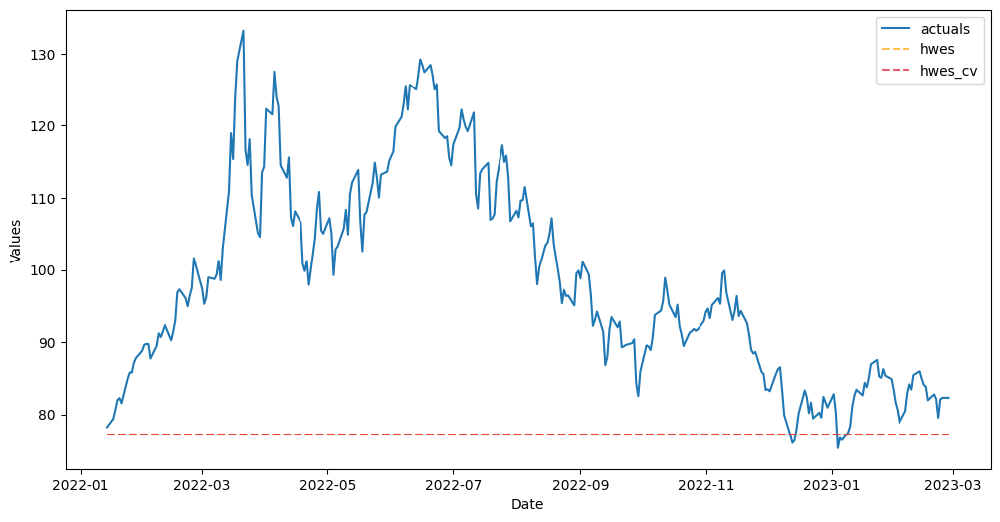

In [ ]:
# plot the cross validated forecast against standard forecast
f_brent.plot_test_set(
    models=[
        "hwes",
        "hwes_cv"
    ],
    include_train=False,
)
plt.show()

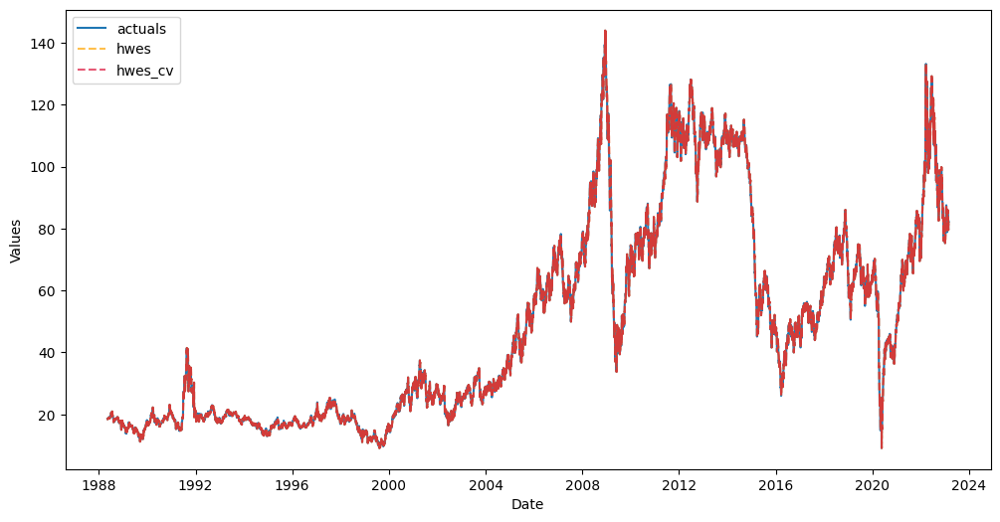

In [ ]:
f_brent.plot_fitted(
    models=[
        "hwes",
        "hwes_cv"
    ],
    # include_train=False,
)
plt.show()

### 7) Silverkite

In [ ]:
f_brent.set_estimator('silverkite')
f_brent.manual_forecast(call_me='silverkite')

Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they. (Deprecated NumPy 1.22)
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they. (Deprecated NumPy 1.22)


In [ ]:
matplotlib.use("nbAgg")
%matplotlib inline
sns.set(rc={'figure.figsize':(12,8)})

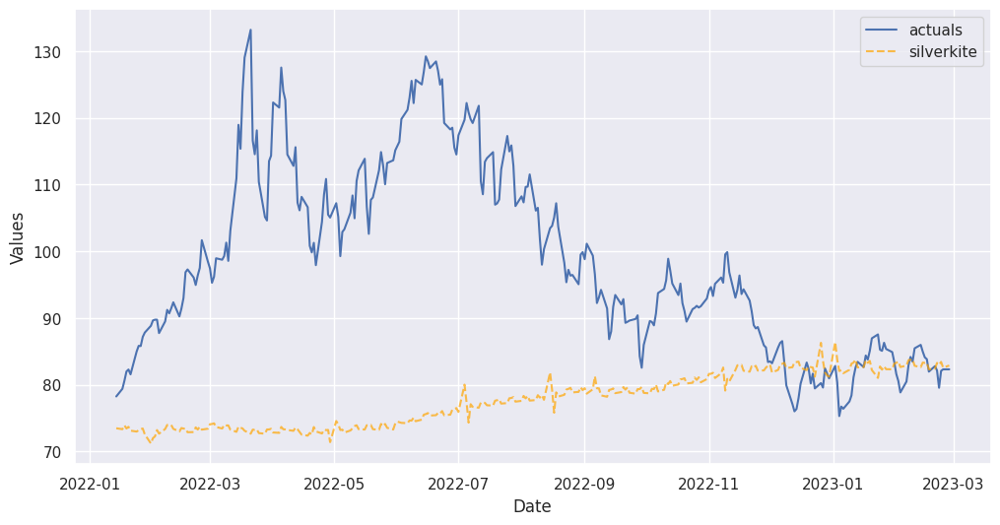

In [ ]:
# plot the test set actuals against the forecasted
f_brent.plot_test_set(
    models=[
        "silverkite",
    ],
    include_train=False,
)
plt.show()

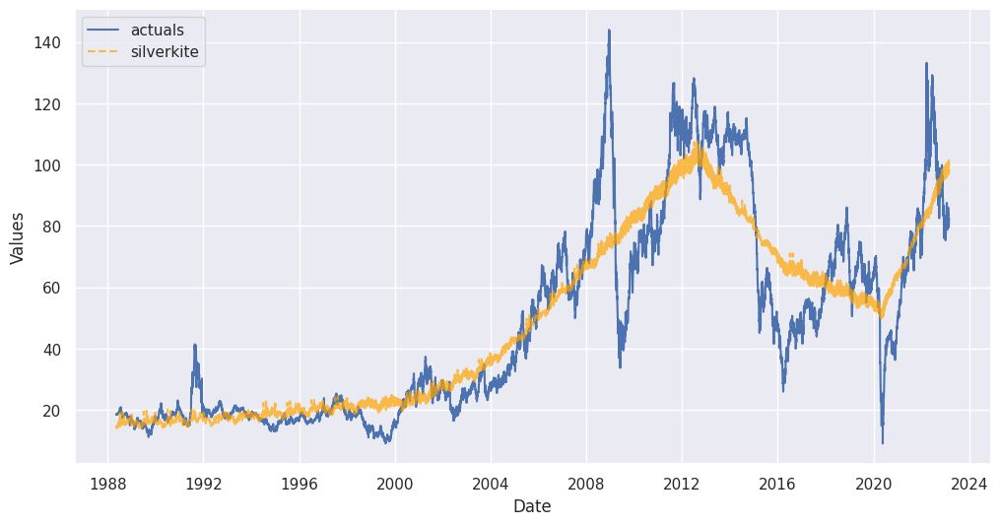

In [ ]:
f_brent.plot_fitted(
    models=[
        "silverkite",
    ],
    # include_train=False,
)
plt.show()

### 8) ARIMA

In [ ]:
f_brent.set_estimator('arima')
f_brent.manual_forecast(order=(4, 0, 0),seasonal_order=(0, 1, 1, 12),call_me='arima')

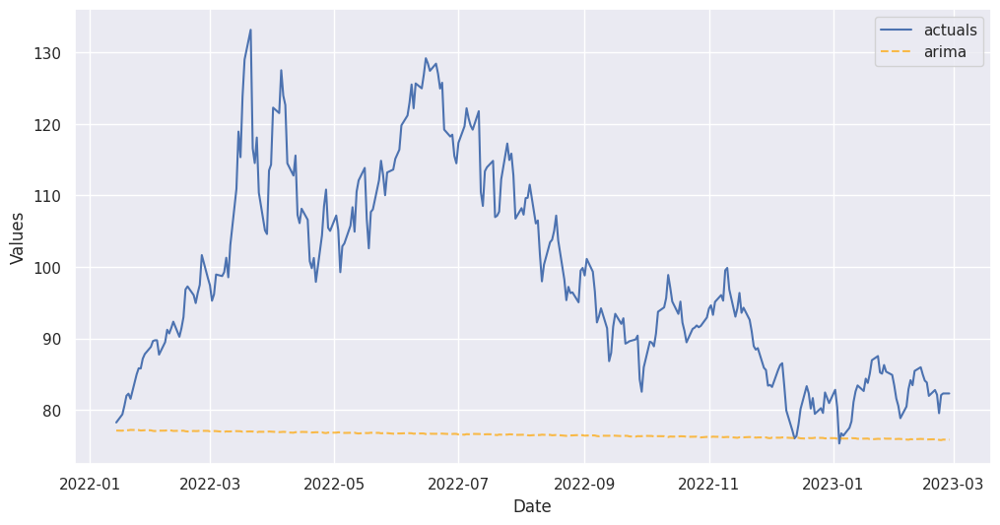

In [ ]:
# plot the test set actuals against the forecasted
f_brent.plot_test_set(
    models=[
        "arima",
    ],
    include_train=False,
)
plt.show()

In [ ]:
grid = {
    'order':[
        (4, 0, 0)
    ],
    'seasonal_order':[
        (0, 1, 1, 12)
    ],
}

f_brent.ingest_grid(grid)

In [ ]:
f_brent.cross_validate(k=375,train_length = 506,test_length=22,space_between_sets=22,rolling=False,verbose = True)
f_brent.auto_forecast(call_me="arima_cv")

Num hyperparams to try for the arima model: 1.
Fold 0: Train size: 506 (2020-01-07 00:00:00 - 2021-12-14 00:00:00). Test Size: 22 (2021-12-15 00:00:00 - 2022-01-13 00:00:00). 


Fold 1: Train size: 506 (2019-12-06 00:00:00 - 2021-11-12 00:00:00). Test Size: 22 (2021-11-15 00:00:00 - 2021-12-14 00:00:00). 


Fold 2: Train size: 506 (2019-11-06 00:00:00 - 2021-10-13 00:00:00). Test Size: 22 (2021-10-14 00:00:00 - 2021-11-12 00:00:00). 


Fold 3: Train size: 506 (2019-10-07 00:00:00 - 2021-09-13 00:00:00). Test Size: 22 (2021-09-14 00:00:00 - 2021-10-13 00:00:00). 


Fold 4: Train size: 506 (2019-09-05 00:00:00 - 2021-08-12 00:00:00). Test Size: 22 (2021-08-13 00:00:00 - 2021-09-13 00:00:00). 


Fold 5: Train size: 506 (2019-08-06 00:00:00 - 2021-07-13 00:00:00). Test Size: 22 (2021-07-14 00:00:00 - 2021-08-12 00:00:00). 


Fold 6: Train size: 506 (2019-07-05 00:00:00 - 2021-06-11 00:00:00). Test Size: 22 (2021-06-14 00:00:00 - 2021-07-13 00:00:00). 


Fold 7: Train size: 506 (2019-06-05 00:00:00 - 2021-05-12 00:00:00). Test Size: 22 (2021-05-13 00:00:00 - 2021-06-11 00:00:00). 


Fold 8: Train size: 506 (2019-05-06 00:00:00 - 2021-04-12 00:00:00). Test Size: 22 (2021-04-13 00:00:00 - 2021-05-12 00:00:00). 


Fold 9: Train size: 506 (2019-04-04 00:00:00 - 2021-03-11 00:00:00). Test Size: 22 (2021-03-12 00:00:00 - 2021-04-12 00:00:00). 


Fold 10: Train size: 506 (2019-03-05 00:00:00 - 2021-02-09 00:00:00). Test Size: 22 (2021-02-10 00:00:00 - 2021-03-11 00:00:00). 


Fold 11: Train size: 506 (2019-02-01 00:00:00 - 2021-01-08 00:00:00). Test Size: 22 (2021-01-11 00:00:00 - 2021-02-09 00:00:00). 


Fold 12: Train size: 506 (2019-01-02 00:00:00 - 2020-12-09 00:00:00). Test Size: 22 (2020-12-10 00:00:00 - 2021-01-08 00:00:00). 


Fold 13: Train size: 506 (2018-12-03 00:00:00 - 2020-11-09 00:00:00). Test Size: 22 (2020-11-10 00:00:00 - 2020-12-09 00:00:00). 


Fold 14: Train size: 506 (2018-11-01 00:00:00 - 2020-10-08 00:00:00). Test Size: 22 (2020-10-09 00:00:00 - 2020-11-09 00:00:00). 


Fold 15: Train size: 506 (2018-10-02 00:00:00 - 2020-09-08 00:00:00). Test Size: 22 (2020-09-09 00:00:00 - 2020-10-08 00:00:00). 


Fold 16: Train size: 506 (2018-08-31 00:00:00 - 2020-08-07 00:00:00). Test Size: 22 (2020-08-10 00:00:00 - 2020-09-08 00:00:00). 


Fold 17: Train size: 506 (2018-08-01 00:00:00 - 2020-07-08 00:00:00). Test Size: 22 (2020-07-09 00:00:00 - 2020-08-07 00:00:00). 


Fold 18: Train size: 506 (2018-07-02 00:00:00 - 2020-06-08 00:00:00). Test Size: 22 (2020-06-09 00:00:00 - 2020-07-08 00:00:00). 


Fold 19: Train size: 506 (2018-05-31 00:00:00 - 2020-05-07 00:00:00). Test Size: 22 (2020-05-08 00:00:00 - 2020-06-08 00:00:00). 


Fold 20: Train size: 506 (2018-05-01 00:00:00 - 2020-04-07 00:00:00). Test Size: 22 (2020-04-08 00:00:00 - 2020-05-07 00:00:00). 


Fold 21: Train size: 506 (2018-03-30 00:00:00 - 2020-03-06 00:00:00). Test Size: 22 (2020-03-09 00:00:00 - 2020-04-07 00:00:00). 


Fold 22: Train size: 506 (2018-02-28 00:00:00 - 2020-02-05 00:00:00). Test Size: 22 (2020-02-06 00:00:00 - 2020-03-06 00:00:00). 


Fold 23: Train size: 506 (2018-01-29 00:00:00 - 2020-01-06 00:00:00). Test Size: 22 (2020-01-07 00:00:00 - 2020-02-05 00:00:00). 


Fold 24: Train size: 506 (2017-12-28 00:00:00 - 2019-12-05 00:00:00). Test Size: 22 (2019-12-06 00:00:00 - 2020-01-06 00:00:00). 


Fold 25: Train size: 506 (2017-11-28 00:00:00 - 2019-11-05 00:00:00). Test Size: 22 (2019-11-06 00:00:00 - 2019-12-05 00:00:00). 


Fold 26: Train size: 506 (2017-10-27 00:00:00 - 2019-10-04 00:00:00). Test Size: 22 (2019-10-07 00:00:00 - 2019-11-05 00:00:00). 


Fold 27: Train size: 506 (2017-09-27 00:00:00 - 2019-09-04 00:00:00). Test Size: 22 (2019-09-05 00:00:00 - 2019-10-04 00:00:00). 


Fold 28: Train size: 506 (2017-08-28 00:00:00 - 2019-08-05 00:00:00). Test Size: 22 (2019-08-06 00:00:00 - 2019-09-04 00:00:00). 


Fold 29: Train size: 506 (2017-07-27 00:00:00 - 2019-07-04 00:00:00). Test Size: 22 (2019-07-05 00:00:00 - 2019-08-05 00:00:00). 


Fold 30: Train size: 506 (2017-06-27 00:00:00 - 2019-06-04 00:00:00). Test Size: 22 (2019-06-05 00:00:00 - 2019-07-04 00:00:00). 


Fold 31: Train size: 506 (2017-05-26 00:00:00 - 2019-05-03 00:00:00). Test Size: 22 (2019-05-06 00:00:00 - 2019-06-04 00:00:00). 


Fold 32: Train size: 506 (2017-04-26 00:00:00 - 2019-04-03 00:00:00). Test Size: 22 (2019-04-04 00:00:00 - 2019-05-03 00:00:00). 


Fold 33: Train size: 506 (2017-03-27 00:00:00 - 2019-03-04 00:00:00). Test Size: 22 (2019-03-05 00:00:00 - 2019-04-03 00:00:00). 


Fold 34: Train size: 506 (2017-02-23 00:00:00 - 2019-01-31 00:00:00). Test Size: 22 (2019-02-01 00:00:00 - 2019-03-04 00:00:00). 


Fold 35: Train size: 506 (2017-01-24 00:00:00 - 2019-01-01 00:00:00). Test Size: 22 (2019-01-02 00:00:00 - 2019-01-31 00:00:00). 


Fold 36: Train size: 506 (2016-12-23 00:00:00 - 2018-11-30 00:00:00). Test Size: 22 (2018-12-03 00:00:00 - 2019-01-01 00:00:00). 


Fold 37: Train size: 506 (2016-11-23 00:00:00 - 2018-10-31 00:00:00). Test Size: 22 (2018-11-01 00:00:00 - 2018-11-30 00:00:00). 


Fold 38: Train size: 506 (2016-10-24 00:00:00 - 2018-10-01 00:00:00). Test Size: 22 (2018-10-02 00:00:00 - 2018-10-31 00:00:00). 


Fold 39: Train size: 506 (2016-09-22 00:00:00 - 2018-08-30 00:00:00). Test Size: 22 (2018-08-31 00:00:00 - 2018-10-01 00:00:00). 


Fold 40: Train size: 506 (2016-08-23 00:00:00 - 2018-07-31 00:00:00). Test Size: 22 (2018-08-01 00:00:00 - 2018-08-30 00:00:00). 


Fold 41: Train size: 506 (2016-07-22 00:00:00 - 2018-06-29 00:00:00). Test Size: 22 (2018-07-02 00:00:00 - 2018-07-31 00:00:00). 


Fold 42: Train size: 506 (2016-06-22 00:00:00 - 2018-05-30 00:00:00). Test Size: 22 (2018-05-31 00:00:00 - 2018-06-29 00:00:00). 


Fold 43: Train size: 506 (2016-05-23 00:00:00 - 2018-04-30 00:00:00). Test Size: 22 (2018-05-01 00:00:00 - 2018-05-30 00:00:00). 


Fold 44: Train size: 506 (2016-04-21 00:00:00 - 2018-03-29 00:00:00). Test Size: 22 (2018-03-30 00:00:00 - 2018-04-30 00:00:00). 


Fold 45: Train size: 506 (2016-03-22 00:00:00 - 2018-02-27 00:00:00). Test Size: 22 (2018-02-28 00:00:00 - 2018-03-29 00:00:00). 


Fold 46: Train size: 506 (2016-02-19 00:00:00 - 2018-01-26 00:00:00). Test Size: 22 (2018-01-29 00:00:00 - 2018-02-27 00:00:00). 


Fold 47: Train size: 506 (2016-01-20 00:00:00 - 2017-12-27 00:00:00). Test Size: 22 (2017-12-28 00:00:00 - 2018-01-26 00:00:00). 


Fold 48: Train size: 506 (2015-12-21 00:00:00 - 2017-11-27 00:00:00). Test Size: 22 (2017-11-28 00:00:00 - 2017-12-27 00:00:00). 


Fold 49: Train size: 506 (2015-11-19 00:00:00 - 2017-10-26 00:00:00). Test Size: 22 (2017-10-27 00:00:00 - 2017-11-27 00:00:00). 


Fold 50: Train size: 506 (2015-10-20 00:00:00 - 2017-09-26 00:00:00). Test Size: 22 (2017-09-27 00:00:00 - 2017-10-26 00:00:00). 


Fold 51: Train size: 506 (2015-09-18 00:00:00 - 2017-08-25 00:00:00). Test Size: 22 (2017-08-28 00:00:00 - 2017-09-26 00:00:00). 


Fold 52: Train size: 506 (2015-08-19 00:00:00 - 2017-07-26 00:00:00). Test Size: 22 (2017-07-27 00:00:00 - 2017-08-25 00:00:00). 


Fold 53: Train size: 506 (2015-07-20 00:00:00 - 2017-06-26 00:00:00). Test Size: 22 (2017-06-27 00:00:00 - 2017-07-26 00:00:00). 


Fold 54: Train size: 506 (2015-06-18 00:00:00 - 2017-05-25 00:00:00). Test Size: 22 (2017-05-26 00:00:00 - 2017-06-26 00:00:00). 


Fold 55: Train size: 506 (2015-05-19 00:00:00 - 2017-04-25 00:00:00). Test Size: 22 (2017-04-26 00:00:00 - 2017-05-25 00:00:00). 


Fold 56: Train size: 506 (2015-04-17 00:00:00 - 2017-03-24 00:00:00). Test Size: 22 (2017-03-27 00:00:00 - 2017-04-25 00:00:00). 


Fold 57: Train size: 506 (2015-03-18 00:00:00 - 2017-02-22 00:00:00). Test Size: 22 (2017-02-23 00:00:00 - 2017-03-24 00:00:00). 


Fold 58: Train size: 506 (2015-02-16 00:00:00 - 2017-01-23 00:00:00). Test Size: 22 (2017-01-24 00:00:00 - 2017-02-22 00:00:00). 


Fold 59: Train size: 506 (2015-01-15 00:00:00 - 2016-12-22 00:00:00). Test Size: 22 (2016-12-23 00:00:00 - 2017-01-23 00:00:00). 


Fold 60: Train size: 506 (2014-12-16 00:00:00 - 2016-11-22 00:00:00). Test Size: 22 (2016-11-23 00:00:00 - 2016-12-22 00:00:00). 


Fold 61: Train size: 506 (2014-11-14 00:00:00 - 2016-10-21 00:00:00). Test Size: 22 (2016-10-24 00:00:00 - 2016-11-22 00:00:00). 


Fold 62: Train size: 506 (2014-10-15 00:00:00 - 2016-09-21 00:00:00). Test Size: 22 (2016-09-22 00:00:00 - 2016-10-21 00:00:00). 


Fold 63: Train size: 506 (2014-09-15 00:00:00 - 2016-08-22 00:00:00). Test Size: 22 (2016-08-23 00:00:00 - 2016-09-21 00:00:00). 


Fold 64: Train size: 506 (2014-08-14 00:00:00 - 2016-07-21 00:00:00). Test Size: 22 (2016-07-22 00:00:00 - 2016-08-22 00:00:00). 


Fold 65: Train size: 506 (2014-07-15 00:00:00 - 2016-06-21 00:00:00). Test Size: 22 (2016-06-22 00:00:00 - 2016-07-21 00:00:00). 


Fold 66: Train size: 506 (2014-06-13 00:00:00 - 2016-05-20 00:00:00). Test Size: 22 (2016-05-23 00:00:00 - 2016-06-21 00:00:00). 


Fold 67: Train size: 506 (2014-05-14 00:00:00 - 2016-04-20 00:00:00). Test Size: 22 (2016-04-21 00:00:00 - 2016-05-20 00:00:00). 


Fold 68: Train size: 506 (2014-04-14 00:00:00 - 2016-03-21 00:00:00). Test Size: 22 (2016-03-22 00:00:00 - 2016-04-20 00:00:00). 


Fold 69: Train size: 506 (2014-03-13 00:00:00 - 2016-02-18 00:00:00). Test Size: 22 (2016-02-19 00:00:00 - 2016-03-21 00:00:00). 


Fold 70: Train size: 506 (2014-02-11 00:00:00 - 2016-01-19 00:00:00). Test Size: 22 (2016-01-20 00:00:00 - 2016-02-18 00:00:00). 


Fold 71: Train size: 506 (2014-01-10 00:00:00 - 2015-12-18 00:00:00). Test Size: 22 (2015-12-21 00:00:00 - 2016-01-19 00:00:00). 


Fold 72: Train size: 506 (2013-12-11 00:00:00 - 2015-11-18 00:00:00). Test Size: 22 (2015-11-19 00:00:00 - 2015-12-18 00:00:00). 


Fold 73: Train size: 506 (2013-11-11 00:00:00 - 2015-10-19 00:00:00). Test Size: 22 (2015-10-20 00:00:00 - 2015-11-18 00:00:00). 


Fold 74: Train size: 506 (2013-10-10 00:00:00 - 2015-09-17 00:00:00). Test Size: 22 (2015-09-18 00:00:00 - 2015-10-19 00:00:00). 


Fold 75: Train size: 506 (2013-09-10 00:00:00 - 2015-08-18 00:00:00). Test Size: 22 (2015-08-19 00:00:00 - 2015-09-17 00:00:00). 


Fold 76: Train size: 506 (2013-08-09 00:00:00 - 2015-07-17 00:00:00). Test Size: 22 (2015-07-20 00:00:00 - 2015-08-18 00:00:00). 


Fold 77: Train size: 506 (2013-07-10 00:00:00 - 2015-06-17 00:00:00). Test Size: 22 (2015-06-18 00:00:00 - 2015-07-17 00:00:00). 


Fold 78: Train size: 506 (2013-06-10 00:00:00 - 2015-05-18 00:00:00). Test Size: 22 (2015-05-19 00:00:00 - 2015-06-17 00:00:00). 


Fold 79: Train size: 506 (2013-05-09 00:00:00 - 2015-04-16 00:00:00). Test Size: 22 (2015-04-17 00:00:00 - 2015-05-18 00:00:00). 


Fold 80: Train size: 506 (2013-04-09 00:00:00 - 2015-03-17 00:00:00). Test Size: 22 (2015-03-18 00:00:00 - 2015-04-16 00:00:00). 


Fold 81: Train size: 506 (2013-03-08 00:00:00 - 2015-02-13 00:00:00). Test Size: 22 (2015-02-16 00:00:00 - 2015-03-17 00:00:00). 


Fold 82: Train size: 506 (2013-02-06 00:00:00 - 2015-01-14 00:00:00). Test Size: 22 (2015-01-15 00:00:00 - 2015-02-13 00:00:00). 


Fold 83: Train size: 506 (2013-01-07 00:00:00 - 2014-12-15 00:00:00). Test Size: 22 (2014-12-16 00:00:00 - 2015-01-14 00:00:00). 


Fold 84: Train size: 506 (2012-12-06 00:00:00 - 2014-11-13 00:00:00). Test Size: 22 (2014-11-14 00:00:00 - 2014-12-15 00:00:00). 


Fold 85: Train size: 506 (2012-11-06 00:00:00 - 2014-10-14 00:00:00). Test Size: 22 (2014-10-15 00:00:00 - 2014-11-13 00:00:00). 


Fold 86: Train size: 506 (2012-10-05 00:00:00 - 2014-09-12 00:00:00). Test Size: 22 (2014-09-15 00:00:00 - 2014-10-14 00:00:00). 


Fold 87: Train size: 506 (2012-09-05 00:00:00 - 2014-08-13 00:00:00). Test Size: 22 (2014-08-14 00:00:00 - 2014-09-12 00:00:00). 


Fold 88: Train size: 506 (2012-08-06 00:00:00 - 2014-07-14 00:00:00). Test Size: 22 (2014-07-15 00:00:00 - 2014-08-13 00:00:00). 


Fold 89: Train size: 506 (2012-07-05 00:00:00 - 2014-06-12 00:00:00). Test Size: 22 (2014-06-13 00:00:00 - 2014-07-14 00:00:00). 


Fold 90: Train size: 506 (2012-06-05 00:00:00 - 2014-05-13 00:00:00). Test Size: 22 (2014-05-14 00:00:00 - 2014-06-12 00:00:00). 


Fold 91: Train size: 506 (2012-05-04 00:00:00 - 2014-04-11 00:00:00). Test Size: 22 (2014-04-14 00:00:00 - 2014-05-13 00:00:00). 


Fold 92: Train size: 506 (2012-04-04 00:00:00 - 2014-03-12 00:00:00). Test Size: 22 (2014-03-13 00:00:00 - 2014-04-11 00:00:00). 


Fold 93: Train size: 506 (2012-03-05 00:00:00 - 2014-02-10 00:00:00). Test Size: 22 (2014-02-11 00:00:00 - 2014-03-12 00:00:00). 


Fold 94: Train size: 506 (2012-02-02 00:00:00 - 2014-01-09 00:00:00). Test Size: 22 (2014-01-10 00:00:00 - 2014-02-10 00:00:00). 


Fold 95: Train size: 506 (2012-01-03 00:00:00 - 2013-12-10 00:00:00). Test Size: 22 (2013-12-11 00:00:00 - 2014-01-09 00:00:00). 


Fold 96: Train size: 506 (2011-12-02 00:00:00 - 2013-11-08 00:00:00). Test Size: 22 (2013-11-11 00:00:00 - 2013-12-10 00:00:00). 


Fold 97: Train size: 506 (2011-11-02 00:00:00 - 2013-10-09 00:00:00). Test Size: 22 (2013-10-10 00:00:00 - 2013-11-08 00:00:00). 


Fold 98: Train size: 506 (2011-10-03 00:00:00 - 2013-09-09 00:00:00). Test Size: 22 (2013-09-10 00:00:00 - 2013-10-09 00:00:00). 


Fold 99: Train size: 506 (2011-09-01 00:00:00 - 2013-08-08 00:00:00). Test Size: 22 (2013-08-09 00:00:00 - 2013-09-09 00:00:00). 


Fold 100: Train size: 506 (2011-08-02 00:00:00 - 2013-07-09 00:00:00). Test Size: 22 (2013-07-10 00:00:00 - 2013-08-08 00:00:00). 


Fold 101: Train size: 506 (2011-07-01 00:00:00 - 2013-06-07 00:00:00). Test Size: 22 (2013-06-10 00:00:00 - 2013-07-09 00:00:00). 


Fold 102: Train size: 506 (2011-06-01 00:00:00 - 2013-05-08 00:00:00). Test Size: 22 (2013-05-09 00:00:00 - 2013-06-07 00:00:00). 


Fold 103: Train size: 506 (2011-05-02 00:00:00 - 2013-04-08 00:00:00). Test Size: 22 (2013-04-09 00:00:00 - 2013-05-08 00:00:00). 


Fold 104: Train size: 506 (2011-03-31 00:00:00 - 2013-03-07 00:00:00). Test Size: 22 (2013-03-08 00:00:00 - 2013-04-08 00:00:00). 


Fold 105: Train size: 506 (2011-03-01 00:00:00 - 2013-02-05 00:00:00). Test Size: 22 (2013-02-06 00:00:00 - 2013-03-07 00:00:00). 


Fold 106: Train size: 506 (2011-01-28 00:00:00 - 2013-01-04 00:00:00). Test Size: 22 (2013-01-07 00:00:00 - 2013-02-05 00:00:00). 


Fold 107: Train size: 506 (2010-12-29 00:00:00 - 2012-12-05 00:00:00). Test Size: 22 (2012-12-06 00:00:00 - 2013-01-04 00:00:00). 


Fold 108: Train size: 506 (2010-11-29 00:00:00 - 2012-11-05 00:00:00). Test Size: 22 (2012-11-06 00:00:00 - 2012-12-05 00:00:00). 


Fold 109: Train size: 506 (2010-10-28 00:00:00 - 2012-10-04 00:00:00). Test Size: 22 (2012-10-05 00:00:00 - 2012-11-05 00:00:00). 


Fold 110: Train size: 506 (2010-09-28 00:00:00 - 2012-09-04 00:00:00). Test Size: 22 (2012-09-05 00:00:00 - 2012-10-04 00:00:00). 


Fold 111: Train size: 506 (2010-08-27 00:00:00 - 2012-08-03 00:00:00). Test Size: 22 (2012-08-06 00:00:00 - 2012-09-04 00:00:00). 


Fold 112: Train size: 506 (2010-07-28 00:00:00 - 2012-07-04 00:00:00). Test Size: 22 (2012-07-05 00:00:00 - 2012-08-03 00:00:00). 


Fold 113: Train size: 506 (2010-06-28 00:00:00 - 2012-06-04 00:00:00). Test Size: 22 (2012-06-05 00:00:00 - 2012-07-04 00:00:00). 


Fold 114: Train size: 506 (2010-05-27 00:00:00 - 2012-05-03 00:00:00). Test Size: 22 (2012-05-04 00:00:00 - 2012-06-04 00:00:00). 


Fold 115: Train size: 506 (2010-04-27 00:00:00 - 2012-04-03 00:00:00). Test Size: 22 (2012-04-04 00:00:00 - 2012-05-03 00:00:00). 


Fold 116: Train size: 506 (2010-03-26 00:00:00 - 2012-03-02 00:00:00). Test Size: 22 (2012-03-05 00:00:00 - 2012-04-03 00:00:00). 


Fold 117: Train size: 506 (2010-02-24 00:00:00 - 2012-02-01 00:00:00). Test Size: 22 (2012-02-02 00:00:00 - 2012-03-02 00:00:00). 


Fold 118: Train size: 506 (2010-01-25 00:00:00 - 2012-01-02 00:00:00). Test Size: 22 (2012-01-03 00:00:00 - 2012-02-01 00:00:00). 


Fold 119: Train size: 506 (2009-12-24 00:00:00 - 2011-12-01 00:00:00). Test Size: 22 (2011-12-02 00:00:00 - 2012-01-02 00:00:00). 


Fold 120: Train size: 506 (2009-11-24 00:00:00 - 2011-11-01 00:00:00). Test Size: 22 (2011-11-02 00:00:00 - 2011-12-01 00:00:00). 


Fold 121: Train size: 506 (2009-10-23 00:00:00 - 2011-09-30 00:00:00). Test Size: 22 (2011-10-03 00:00:00 - 2011-11-01 00:00:00). 


Fold 122: Train size: 506 (2009-09-23 00:00:00 - 2011-08-31 00:00:00). Test Size: 22 (2011-09-01 00:00:00 - 2011-09-30 00:00:00). 


Fold 123: Train size: 506 (2009-08-24 00:00:00 - 2011-08-01 00:00:00). Test Size: 22 (2011-08-02 00:00:00 - 2011-08-31 00:00:00). 


Fold 124: Train size: 506 (2009-07-23 00:00:00 - 2011-06-30 00:00:00). Test Size: 22 (2011-07-01 00:00:00 - 2011-08-01 00:00:00). 


Fold 125: Train size: 506 (2009-06-23 00:00:00 - 2011-05-31 00:00:00). Test Size: 22 (2011-06-01 00:00:00 - 2011-06-30 00:00:00). 


Fold 126: Train size: 506 (2009-05-22 00:00:00 - 2011-04-29 00:00:00). Test Size: 22 (2011-05-02 00:00:00 - 2011-05-31 00:00:00). 


Fold 127: Train size: 506 (2009-04-22 00:00:00 - 2011-03-30 00:00:00). Test Size: 22 (2011-03-31 00:00:00 - 2011-04-29 00:00:00). 


Fold 128: Train size: 506 (2009-03-23 00:00:00 - 2011-02-28 00:00:00). Test Size: 22 (2011-03-01 00:00:00 - 2011-03-30 00:00:00). 


Fold 129: Train size: 506 (2009-02-19 00:00:00 - 2011-01-27 00:00:00). Test Size: 22 (2011-01-28 00:00:00 - 2011-02-28 00:00:00). 


Fold 130: Train size: 506 (2009-01-20 00:00:00 - 2010-12-28 00:00:00). Test Size: 22 (2010-12-29 00:00:00 - 2011-01-27 00:00:00). 


Fold 131: Train size: 506 (2008-12-19 00:00:00 - 2010-11-26 00:00:00). Test Size: 22 (2010-11-29 00:00:00 - 2010-12-28 00:00:00). 


Fold 132: Train size: 506 (2008-11-19 00:00:00 - 2010-10-27 00:00:00). Test Size: 22 (2010-10-28 00:00:00 - 2010-11-26 00:00:00). 


Fold 133: Train size: 506 (2008-10-20 00:00:00 - 2010-09-27 00:00:00). Test Size: 22 (2010-09-28 00:00:00 - 2010-10-27 00:00:00). 


Fold 134: Train size: 506 (2008-09-18 00:00:00 - 2010-08-26 00:00:00). Test Size: 22 (2010-08-27 00:00:00 - 2010-09-27 00:00:00). 


Fold 135: Train size: 506 (2008-08-19 00:00:00 - 2010-07-27 00:00:00). Test Size: 22 (2010-07-28 00:00:00 - 2010-08-26 00:00:00). 


Fold 136: Train size: 506 (2008-07-18 00:00:00 - 2010-06-25 00:00:00). Test Size: 22 (2010-06-28 00:00:00 - 2010-07-27 00:00:00). 


Fold 137: Train size: 506 (2008-06-18 00:00:00 - 2010-05-26 00:00:00). Test Size: 22 (2010-05-27 00:00:00 - 2010-06-25 00:00:00). 


Fold 138: Train size: 506 (2008-05-19 00:00:00 - 2010-04-26 00:00:00). Test Size: 22 (2010-04-27 00:00:00 - 2010-05-26 00:00:00). 


Fold 139: Train size: 506 (2008-04-17 00:00:00 - 2010-03-25 00:00:00). Test Size: 22 (2010-03-26 00:00:00 - 2010-04-26 00:00:00). 


Fold 140: Train size: 506 (2008-03-18 00:00:00 - 2010-02-23 00:00:00). Test Size: 22 (2010-02-24 00:00:00 - 2010-03-25 00:00:00). 


Fold 141: Train size: 506 (2008-02-15 00:00:00 - 2010-01-22 00:00:00). Test Size: 22 (2010-01-25 00:00:00 - 2010-02-23 00:00:00). 


Fold 142: Train size: 506 (2008-01-16 00:00:00 - 2009-12-23 00:00:00). Test Size: 22 (2009-12-24 00:00:00 - 2010-01-22 00:00:00). 


Fold 143: Train size: 506 (2007-12-17 00:00:00 - 2009-11-23 00:00:00). Test Size: 22 (2009-11-24 00:00:00 - 2009-12-23 00:00:00). 


Fold 144: Train size: 506 (2007-11-15 00:00:00 - 2009-10-22 00:00:00). Test Size: 22 (2009-10-23 00:00:00 - 2009-11-23 00:00:00). 


Fold 145: Train size: 506 (2007-10-16 00:00:00 - 2009-09-22 00:00:00). Test Size: 22 (2009-09-23 00:00:00 - 2009-10-22 00:00:00). 


Fold 146: Train size: 506 (2007-09-14 00:00:00 - 2009-08-21 00:00:00). Test Size: 22 (2009-08-24 00:00:00 - 2009-09-22 00:00:00). 


Fold 147: Train size: 506 (2007-08-15 00:00:00 - 2009-07-22 00:00:00). Test Size: 22 (2009-07-23 00:00:00 - 2009-08-21 00:00:00). 


Fold 148: Train size: 506 (2007-07-16 00:00:00 - 2009-06-22 00:00:00). Test Size: 22 (2009-06-23 00:00:00 - 2009-07-22 00:00:00). 


Fold 149: Train size: 506 (2007-06-14 00:00:00 - 2009-05-21 00:00:00). Test Size: 22 (2009-05-22 00:00:00 - 2009-06-22 00:00:00). 


Fold 150: Train size: 506 (2007-05-15 00:00:00 - 2009-04-21 00:00:00). Test Size: 22 (2009-04-22 00:00:00 - 2009-05-21 00:00:00). 


Fold 151: Train size: 506 (2007-04-13 00:00:00 - 2009-03-20 00:00:00). Test Size: 22 (2009-03-23 00:00:00 - 2009-04-21 00:00:00). 


Fold 152: Train size: 506 (2007-03-14 00:00:00 - 2009-02-18 00:00:00). Test Size: 22 (2009-02-19 00:00:00 - 2009-03-20 00:00:00). 


Fold 153: Train size: 506 (2007-02-12 00:00:00 - 2009-01-19 00:00:00). Test Size: 22 (2009-01-20 00:00:00 - 2009-02-18 00:00:00). 


Fold 154: Train size: 506 (2007-01-11 00:00:00 - 2008-12-18 00:00:00). Test Size: 22 (2008-12-19 00:00:00 - 2009-01-19 00:00:00). 


Fold 155: Train size: 506 (2006-12-12 00:00:00 - 2008-11-18 00:00:00). Test Size: 22 (2008-11-19 00:00:00 - 2008-12-18 00:00:00). 


Fold 156: Train size: 506 (2006-11-10 00:00:00 - 2008-10-17 00:00:00). Test Size: 22 (2008-10-20 00:00:00 - 2008-11-18 00:00:00). 


Fold 157: Train size: 506 (2006-10-11 00:00:00 - 2008-09-17 00:00:00). Test Size: 22 (2008-09-18 00:00:00 - 2008-10-17 00:00:00). 


Fold 158: Train size: 506 (2006-09-11 00:00:00 - 2008-08-18 00:00:00). Test Size: 22 (2008-08-19 00:00:00 - 2008-09-17 00:00:00). 


Fold 159: Train size: 506 (2006-08-10 00:00:00 - 2008-07-17 00:00:00). Test Size: 22 (2008-07-18 00:00:00 - 2008-08-18 00:00:00). 


Fold 160: Train size: 506 (2006-07-11 00:00:00 - 2008-06-17 00:00:00). Test Size: 22 (2008-06-18 00:00:00 - 2008-07-17 00:00:00). 


Fold 161: Train size: 506 (2006-06-09 00:00:00 - 2008-05-16 00:00:00). Test Size: 22 (2008-05-19 00:00:00 - 2008-06-17 00:00:00). 


Fold 162: Train size: 506 (2006-05-10 00:00:00 - 2008-04-16 00:00:00). Test Size: 22 (2008-04-17 00:00:00 - 2008-05-16 00:00:00). 


Fold 163: Train size: 506 (2006-04-10 00:00:00 - 2008-03-17 00:00:00). Test Size: 22 (2008-03-18 00:00:00 - 2008-04-16 00:00:00). 


Fold 164: Train size: 506 (2006-03-09 00:00:00 - 2008-02-14 00:00:00). Test Size: 22 (2008-02-15 00:00:00 - 2008-03-17 00:00:00). 


Fold 165: Train size: 506 (2006-02-07 00:00:00 - 2008-01-15 00:00:00). Test Size: 22 (2008-01-16 00:00:00 - 2008-02-14 00:00:00). 


Fold 166: Train size: 506 (2006-01-06 00:00:00 - 2007-12-14 00:00:00). Test Size: 22 (2007-12-17 00:00:00 - 2008-01-15 00:00:00). 


Fold 167: Train size: 506 (2005-12-07 00:00:00 - 2007-11-14 00:00:00). Test Size: 22 (2007-11-15 00:00:00 - 2007-12-14 00:00:00). 


Fold 168: Train size: 506 (2005-11-07 00:00:00 - 2007-10-15 00:00:00). Test Size: 22 (2007-10-16 00:00:00 - 2007-11-14 00:00:00). 


Fold 169: Train size: 506 (2005-10-06 00:00:00 - 2007-09-13 00:00:00). Test Size: 22 (2007-09-14 00:00:00 - 2007-10-15 00:00:00). 


Fold 170: Train size: 506 (2005-09-06 00:00:00 - 2007-08-14 00:00:00). Test Size: 22 (2007-08-15 00:00:00 - 2007-09-13 00:00:00). 


Fold 171: Train size: 506 (2005-08-05 00:00:00 - 2007-07-13 00:00:00). Test Size: 22 (2007-07-16 00:00:00 - 2007-08-14 00:00:00). 


Fold 172: Train size: 506 (2005-07-06 00:00:00 - 2007-06-13 00:00:00). Test Size: 22 (2007-06-14 00:00:00 - 2007-07-13 00:00:00). 


Fold 173: Train size: 506 (2005-06-06 00:00:00 - 2007-05-14 00:00:00). Test Size: 22 (2007-05-15 00:00:00 - 2007-06-13 00:00:00). 


Fold 174: Train size: 506 (2005-05-05 00:00:00 - 2007-04-12 00:00:00). Test Size: 22 (2007-04-13 00:00:00 - 2007-05-14 00:00:00). 


Fold 175: Train size: 506 (2005-04-05 00:00:00 - 2007-03-13 00:00:00). Test Size: 22 (2007-03-14 00:00:00 - 2007-04-12 00:00:00). 


Fold 176: Train size: 506 (2005-03-04 00:00:00 - 2007-02-09 00:00:00). Test Size: 22 (2007-02-12 00:00:00 - 2007-03-13 00:00:00). 


Fold 177: Train size: 506 (2005-02-02 00:00:00 - 2007-01-10 00:00:00). Test Size: 22 (2007-01-11 00:00:00 - 2007-02-09 00:00:00). 


Fold 178: Train size: 506 (2005-01-03 00:00:00 - 2006-12-11 00:00:00). Test Size: 22 (2006-12-12 00:00:00 - 2007-01-10 00:00:00). 


Fold 179: Train size: 506 (2004-12-02 00:00:00 - 2006-11-09 00:00:00). Test Size: 22 (2006-11-10 00:00:00 - 2006-12-11 00:00:00). 


Fold 180: Train size: 506 (2004-11-02 00:00:00 - 2006-10-10 00:00:00). Test Size: 22 (2006-10-11 00:00:00 - 2006-11-09 00:00:00). 


Fold 181: Train size: 506 (2004-10-01 00:00:00 - 2006-09-08 00:00:00). Test Size: 22 (2006-09-11 00:00:00 - 2006-10-10 00:00:00). 


Fold 182: Train size: 506 (2004-09-01 00:00:00 - 2006-08-09 00:00:00). Test Size: 22 (2006-08-10 00:00:00 - 2006-09-08 00:00:00). 


Fold 183: Train size: 506 (2004-08-02 00:00:00 - 2006-07-10 00:00:00). Test Size: 22 (2006-07-11 00:00:00 - 2006-08-09 00:00:00). 


Fold 184: Train size: 506 (2004-07-01 00:00:00 - 2006-06-08 00:00:00). Test Size: 22 (2006-06-09 00:00:00 - 2006-07-10 00:00:00). 


Fold 185: Train size: 506 (2004-06-01 00:00:00 - 2006-05-09 00:00:00). Test Size: 22 (2006-05-10 00:00:00 - 2006-06-08 00:00:00). 


Fold 186: Train size: 506 (2004-04-30 00:00:00 - 2006-04-07 00:00:00). Test Size: 22 (2006-04-10 00:00:00 - 2006-05-09 00:00:00). 


Fold 187: Train size: 506 (2004-03-31 00:00:00 - 2006-03-08 00:00:00). Test Size: 22 (2006-03-09 00:00:00 - 2006-04-07 00:00:00). 


Fold 188: Train size: 506 (2004-03-01 00:00:00 - 2006-02-06 00:00:00). Test Size: 22 (2006-02-07 00:00:00 - 2006-03-08 00:00:00). 


Fold 189: Train size: 506 (2004-01-29 00:00:00 - 2006-01-05 00:00:00). Test Size: 22 (2006-01-06 00:00:00 - 2006-02-06 00:00:00). 


Fold 190: Train size: 506 (2003-12-30 00:00:00 - 2005-12-06 00:00:00). Test Size: 22 (2005-12-07 00:00:00 - 2006-01-05 00:00:00). 


Fold 191: Train size: 506 (2003-11-28 00:00:00 - 2005-11-04 00:00:00). Test Size: 22 (2005-11-07 00:00:00 - 2005-12-06 00:00:00). 


Fold 192: Train size: 506 (2003-10-29 00:00:00 - 2005-10-05 00:00:00). Test Size: 22 (2005-10-06 00:00:00 - 2005-11-04 00:00:00). 


Fold 193: Train size: 506 (2003-09-29 00:00:00 - 2005-09-05 00:00:00). Test Size: 22 (2005-09-06 00:00:00 - 2005-10-05 00:00:00). 


Fold 194: Train size: 506 (2003-08-28 00:00:00 - 2005-08-04 00:00:00). Test Size: 22 (2005-08-05 00:00:00 - 2005-09-05 00:00:00). 


Fold 195: Train size: 506 (2003-07-29 00:00:00 - 2005-07-05 00:00:00). Test Size: 22 (2005-07-06 00:00:00 - 2005-08-04 00:00:00). 


Fold 196: Train size: 506 (2003-06-27 00:00:00 - 2005-06-03 00:00:00). Test Size: 22 (2005-06-06 00:00:00 - 2005-07-05 00:00:00). 


Fold 197: Train size: 506 (2003-05-28 00:00:00 - 2005-05-04 00:00:00). Test Size: 22 (2005-05-05 00:00:00 - 2005-06-03 00:00:00). 


Fold 198: Train size: 506 (2003-04-28 00:00:00 - 2005-04-04 00:00:00). Test Size: 22 (2005-04-05 00:00:00 - 2005-05-04 00:00:00). 


Fold 199: Train size: 506 (2003-03-27 00:00:00 - 2005-03-03 00:00:00). Test Size: 22 (2005-03-04 00:00:00 - 2005-04-04 00:00:00). 


Fold 200: Train size: 506 (2003-02-25 00:00:00 - 2005-02-01 00:00:00). Test Size: 22 (2005-02-02 00:00:00 - 2005-03-03 00:00:00). 


Fold 201: Train size: 506 (2003-01-24 00:00:00 - 2004-12-31 00:00:00). Test Size: 22 (2005-01-03 00:00:00 - 2005-02-01 00:00:00). 


Fold 202: Train size: 506 (2002-12-25 00:00:00 - 2004-12-01 00:00:00). Test Size: 22 (2004-12-02 00:00:00 - 2004-12-31 00:00:00). 


Fold 203: Train size: 506 (2002-11-25 00:00:00 - 2004-11-01 00:00:00). Test Size: 22 (2004-11-02 00:00:00 - 2004-12-01 00:00:00). 


Fold 204: Train size: 506 (2002-10-24 00:00:00 - 2004-09-30 00:00:00). Test Size: 22 (2004-10-01 00:00:00 - 2004-11-01 00:00:00). 


Fold 205: Train size: 506 (2002-09-24 00:00:00 - 2004-08-31 00:00:00). Test Size: 22 (2004-09-01 00:00:00 - 2004-09-30 00:00:00). 


Fold 206: Train size: 506 (2002-08-23 00:00:00 - 2004-07-30 00:00:00). Test Size: 22 (2004-08-02 00:00:00 - 2004-08-31 00:00:00). 


Fold 207: Train size: 506 (2002-07-24 00:00:00 - 2004-06-30 00:00:00). Test Size: 22 (2004-07-01 00:00:00 - 2004-07-30 00:00:00). 


Fold 208: Train size: 506 (2002-06-24 00:00:00 - 2004-05-31 00:00:00). Test Size: 22 (2004-06-01 00:00:00 - 2004-06-30 00:00:00). 


Fold 209: Train size: 506 (2002-05-23 00:00:00 - 2004-04-29 00:00:00). Test Size: 22 (2004-04-30 00:00:00 - 2004-05-31 00:00:00). 


Fold 210: Train size: 506 (2002-04-23 00:00:00 - 2004-03-30 00:00:00). Test Size: 22 (2004-03-31 00:00:00 - 2004-04-29 00:00:00). 


Fold 211: Train size: 506 (2002-03-22 00:00:00 - 2004-02-27 00:00:00). Test Size: 22 (2004-03-01 00:00:00 - 2004-03-30 00:00:00). 


Fold 212: Train size: 506 (2002-02-20 00:00:00 - 2004-01-28 00:00:00). Test Size: 22 (2004-01-29 00:00:00 - 2004-02-27 00:00:00). 


Fold 213: Train size: 506 (2002-01-21 00:00:00 - 2003-12-29 00:00:00). Test Size: 22 (2003-12-30 00:00:00 - 2004-01-28 00:00:00). 


Fold 214: Train size: 506 (2001-12-20 00:00:00 - 2003-11-27 00:00:00). Test Size: 22 (2003-11-28 00:00:00 - 2003-12-29 00:00:00). 


Fold 215: Train size: 506 (2001-11-20 00:00:00 - 2003-10-28 00:00:00). Test Size: 22 (2003-10-29 00:00:00 - 2003-11-27 00:00:00). 


Fold 216: Train size: 506 (2001-10-19 00:00:00 - 2003-09-26 00:00:00). Test Size: 22 (2003-09-29 00:00:00 - 2003-10-28 00:00:00). 


Fold 217: Train size: 506 (2001-09-19 00:00:00 - 2003-08-27 00:00:00). Test Size: 22 (2003-08-28 00:00:00 - 2003-09-26 00:00:00). 


Fold 218: Train size: 506 (2001-08-20 00:00:00 - 2003-07-28 00:00:00). Test Size: 22 (2003-07-29 00:00:00 - 2003-08-27 00:00:00). 


Fold 219: Train size: 506 (2001-07-19 00:00:00 - 2003-06-26 00:00:00). Test Size: 22 (2003-06-27 00:00:00 - 2003-07-28 00:00:00). 


Fold 220: Train size: 506 (2001-06-19 00:00:00 - 2003-05-27 00:00:00). Test Size: 22 (2003-05-28 00:00:00 - 2003-06-26 00:00:00). 


Fold 221: Train size: 506 (2001-05-18 00:00:00 - 2003-04-25 00:00:00). Test Size: 22 (2003-04-28 00:00:00 - 2003-05-27 00:00:00). 


Fold 222: Train size: 506 (2001-04-18 00:00:00 - 2003-03-26 00:00:00). Test Size: 22 (2003-03-27 00:00:00 - 2003-04-25 00:00:00). 


Fold 223: Train size: 506 (2001-03-19 00:00:00 - 2003-02-24 00:00:00). Test Size: 22 (2003-02-25 00:00:00 - 2003-03-26 00:00:00). 


Fold 224: Train size: 506 (2001-02-15 00:00:00 - 2003-01-23 00:00:00). Test Size: 22 (2003-01-24 00:00:00 - 2003-02-24 00:00:00). 


Fold 225: Train size: 506 (2001-01-16 00:00:00 - 2002-12-24 00:00:00). Test Size: 22 (2002-12-25 00:00:00 - 2003-01-23 00:00:00). 


Fold 226: Train size: 506 (2000-12-15 00:00:00 - 2002-11-22 00:00:00). Test Size: 22 (2002-11-25 00:00:00 - 2002-12-24 00:00:00). 


Fold 227: Train size: 506 (2000-11-15 00:00:00 - 2002-10-23 00:00:00). Test Size: 22 (2002-10-24 00:00:00 - 2002-11-22 00:00:00). 


Fold 228: Train size: 506 (2000-10-16 00:00:00 - 2002-09-23 00:00:00). Test Size: 22 (2002-09-24 00:00:00 - 2002-10-23 00:00:00). 


Fold 229: Train size: 506 (2000-09-14 00:00:00 - 2002-08-22 00:00:00). Test Size: 22 (2002-08-23 00:00:00 - 2002-09-23 00:00:00). 


Fold 230: Train size: 506 (2000-08-15 00:00:00 - 2002-07-23 00:00:00). Test Size: 22 (2002-07-24 00:00:00 - 2002-08-22 00:00:00). 


Fold 231: Train size: 506 (2000-07-14 00:00:00 - 2002-06-21 00:00:00). Test Size: 22 (2002-06-24 00:00:00 - 2002-07-23 00:00:00). 


Fold 232: Train size: 506 (2000-06-14 00:00:00 - 2002-05-22 00:00:00). Test Size: 22 (2002-05-23 00:00:00 - 2002-06-21 00:00:00). 


Fold 233: Train size: 506 (2000-05-15 00:00:00 - 2002-04-22 00:00:00). Test Size: 22 (2002-04-23 00:00:00 - 2002-05-22 00:00:00). 


Fold 234: Train size: 506 (2000-04-13 00:00:00 - 2002-03-21 00:00:00). Test Size: 22 (2002-03-22 00:00:00 - 2002-04-22 00:00:00). 


Fold 235: Train size: 506 (2000-03-14 00:00:00 - 2002-02-19 00:00:00). Test Size: 22 (2002-02-20 00:00:00 - 2002-03-21 00:00:00). 


Fold 236: Train size: 506 (2000-02-11 00:00:00 - 2002-01-18 00:00:00). Test Size: 22 (2002-01-21 00:00:00 - 2002-02-19 00:00:00). 


Fold 237: Train size: 506 (2000-01-12 00:00:00 - 2001-12-19 00:00:00). Test Size: 22 (2001-12-20 00:00:00 - 2002-01-18 00:00:00). 


Fold 238: Train size: 506 (1999-12-13 00:00:00 - 2001-11-19 00:00:00). Test Size: 22 (2001-11-20 00:00:00 - 2001-12-19 00:00:00). 


Fold 239: Train size: 506 (1999-11-11 00:00:00 - 2001-10-18 00:00:00). Test Size: 22 (2001-10-19 00:00:00 - 2001-11-19 00:00:00). 


Fold 240: Train size: 506 (1999-10-12 00:00:00 - 2001-09-18 00:00:00). Test Size: 22 (2001-09-19 00:00:00 - 2001-10-18 00:00:00). 


Fold 241: Train size: 506 (1999-09-10 00:00:00 - 2001-08-17 00:00:00). Test Size: 22 (2001-08-20 00:00:00 - 2001-09-18 00:00:00). 


Fold 242: Train size: 506 (1999-08-11 00:00:00 - 2001-07-18 00:00:00). Test Size: 22 (2001-07-19 00:00:00 - 2001-08-17 00:00:00). 


Fold 243: Train size: 506 (1999-07-12 00:00:00 - 2001-06-18 00:00:00). Test Size: 22 (2001-06-19 00:00:00 - 2001-07-18 00:00:00). 


Fold 244: Train size: 506 (1999-06-10 00:00:00 - 2001-05-17 00:00:00). Test Size: 22 (2001-05-18 00:00:00 - 2001-06-18 00:00:00). 


Fold 245: Train size: 506 (1999-05-11 00:00:00 - 2001-04-17 00:00:00). Test Size: 22 (2001-04-18 00:00:00 - 2001-05-17 00:00:00). 


Fold 246: Train size: 506 (1999-04-09 00:00:00 - 2001-03-16 00:00:00). Test Size: 22 (2001-03-19 00:00:00 - 2001-04-17 00:00:00). 


Fold 247: Train size: 506 (1999-03-10 00:00:00 - 2001-02-14 00:00:00). Test Size: 22 (2001-02-15 00:00:00 - 2001-03-16 00:00:00). 


Fold 248: Train size: 506 (1999-02-08 00:00:00 - 2001-01-15 00:00:00). Test Size: 22 (2001-01-16 00:00:00 - 2001-02-14 00:00:00). 


Fold 249: Train size: 506 (1999-01-07 00:00:00 - 2000-12-14 00:00:00). Test Size: 22 (2000-12-15 00:00:00 - 2001-01-15 00:00:00). 


Fold 250: Train size: 506 (1998-12-08 00:00:00 - 2000-11-14 00:00:00). Test Size: 22 (2000-11-15 00:00:00 - 2000-12-14 00:00:00). 


Fold 251: Train size: 506 (1998-11-06 00:00:00 - 2000-10-13 00:00:00). Test Size: 22 (2000-10-16 00:00:00 - 2000-11-14 00:00:00). 


Fold 252: Train size: 506 (1998-10-07 00:00:00 - 2000-09-13 00:00:00). Test Size: 22 (2000-09-14 00:00:00 - 2000-10-13 00:00:00). 


Fold 253: Train size: 506 (1998-09-07 00:00:00 - 2000-08-14 00:00:00). Test Size: 22 (2000-08-15 00:00:00 - 2000-09-13 00:00:00). 


Fold 254: Train size: 506 (1998-08-06 00:00:00 - 2000-07-13 00:00:00). Test Size: 22 (2000-07-14 00:00:00 - 2000-08-14 00:00:00). 


Fold 255: Train size: 506 (1998-07-07 00:00:00 - 2000-06-13 00:00:00). Test Size: 22 (2000-06-14 00:00:00 - 2000-07-13 00:00:00). 


Fold 256: Train size: 506 (1998-06-05 00:00:00 - 2000-05-12 00:00:00). Test Size: 22 (2000-05-15 00:00:00 - 2000-06-13 00:00:00). 


Fold 257: Train size: 506 (1998-05-06 00:00:00 - 2000-04-12 00:00:00). Test Size: 22 (2000-04-13 00:00:00 - 2000-05-12 00:00:00). 


Fold 258: Train size: 506 (1998-04-06 00:00:00 - 2000-03-13 00:00:00). Test Size: 22 (2000-03-14 00:00:00 - 2000-04-12 00:00:00). 


Fold 259: Train size: 506 (1998-03-05 00:00:00 - 2000-02-10 00:00:00). Test Size: 22 (2000-02-11 00:00:00 - 2000-03-13 00:00:00). 


Fold 260: Train size: 506 (1998-02-03 00:00:00 - 2000-01-11 00:00:00). Test Size: 22 (2000-01-12 00:00:00 - 2000-02-10 00:00:00). 


Fold 261: Train size: 506 (1998-01-02 00:00:00 - 1999-12-10 00:00:00). Test Size: 22 (1999-12-13 00:00:00 - 2000-01-11 00:00:00). 


Fold 262: Train size: 506 (1997-12-03 00:00:00 - 1999-11-10 00:00:00). Test Size: 22 (1999-11-11 00:00:00 - 1999-12-10 00:00:00). 


Fold 263: Train size: 506 (1997-11-03 00:00:00 - 1999-10-11 00:00:00). Test Size: 22 (1999-10-12 00:00:00 - 1999-11-10 00:00:00). 


Fold 264: Train size: 506 (1997-10-02 00:00:00 - 1999-09-09 00:00:00). Test Size: 22 (1999-09-10 00:00:00 - 1999-10-11 00:00:00). 


Fold 265: Train size: 506 (1997-09-02 00:00:00 - 1999-08-10 00:00:00). Test Size: 22 (1999-08-11 00:00:00 - 1999-09-09 00:00:00). 


Fold 266: Train size: 506 (1997-08-01 00:00:00 - 1999-07-09 00:00:00). Test Size: 22 (1999-07-12 00:00:00 - 1999-08-10 00:00:00). 


Fold 267: Train size: 506 (1997-07-02 00:00:00 - 1999-06-09 00:00:00). Test Size: 22 (1999-06-10 00:00:00 - 1999-07-09 00:00:00). 


Fold 268: Train size: 506 (1997-06-02 00:00:00 - 1999-05-10 00:00:00). Test Size: 22 (1999-05-11 00:00:00 - 1999-06-09 00:00:00). 


Fold 269: Train size: 506 (1997-05-01 00:00:00 - 1999-04-08 00:00:00). Test Size: 22 (1999-04-09 00:00:00 - 1999-05-10 00:00:00). 


Fold 270: Train size: 506 (1997-04-01 00:00:00 - 1999-03-09 00:00:00). Test Size: 22 (1999-03-10 00:00:00 - 1999-04-08 00:00:00). 


Fold 271: Train size: 506 (1997-02-28 00:00:00 - 1999-02-05 00:00:00). Test Size: 22 (1999-02-08 00:00:00 - 1999-03-09 00:00:00). 


Fold 272: Train size: 506 (1997-01-29 00:00:00 - 1999-01-06 00:00:00). Test Size: 22 (1999-01-07 00:00:00 - 1999-02-05 00:00:00). 


Fold 273: Train size: 506 (1996-12-30 00:00:00 - 1998-12-07 00:00:00). Test Size: 22 (1998-12-08 00:00:00 - 1999-01-06 00:00:00). 


Fold 274: Train size: 506 (1996-11-28 00:00:00 - 1998-11-05 00:00:00). Test Size: 22 (1998-11-06 00:00:00 - 1998-12-07 00:00:00). 


Fold 275: Train size: 506 (1996-10-29 00:00:00 - 1998-10-06 00:00:00). Test Size: 22 (1998-10-07 00:00:00 - 1998-11-05 00:00:00). 


Fold 276: Train size: 506 (1996-09-27 00:00:00 - 1998-09-04 00:00:00). Test Size: 22 (1998-09-07 00:00:00 - 1998-10-06 00:00:00). 


Fold 277: Train size: 506 (1996-08-28 00:00:00 - 1998-08-05 00:00:00). Test Size: 22 (1998-08-06 00:00:00 - 1998-09-04 00:00:00). 


Fold 278: Train size: 506 (1996-07-29 00:00:00 - 1998-07-06 00:00:00). Test Size: 22 (1998-07-07 00:00:00 - 1998-08-05 00:00:00). 


Fold 279: Train size: 506 (1996-06-27 00:00:00 - 1998-06-04 00:00:00). Test Size: 22 (1998-06-05 00:00:00 - 1998-07-06 00:00:00). 


Fold 280: Train size: 506 (1996-05-28 00:00:00 - 1998-05-05 00:00:00). Test Size: 22 (1998-05-06 00:00:00 - 1998-06-04 00:00:00). 


Fold 281: Train size: 506 (1996-04-26 00:00:00 - 1998-04-03 00:00:00). Test Size: 22 (1998-04-06 00:00:00 - 1998-05-05 00:00:00). 


Fold 282: Train size: 506 (1996-03-27 00:00:00 - 1998-03-04 00:00:00). Test Size: 22 (1998-03-05 00:00:00 - 1998-04-03 00:00:00). 


Fold 283: Train size: 506 (1996-02-26 00:00:00 - 1998-02-02 00:00:00). Test Size: 22 (1998-02-03 00:00:00 - 1998-03-04 00:00:00). 


Fold 284: Train size: 506 (1996-01-25 00:00:00 - 1998-01-01 00:00:00). Test Size: 22 (1998-01-02 00:00:00 - 1998-02-02 00:00:00). 


Fold 285: Train size: 506 (1995-12-26 00:00:00 - 1997-12-02 00:00:00). Test Size: 22 (1997-12-03 00:00:00 - 1998-01-01 00:00:00). 


Fold 286: Train size: 506 (1995-11-24 00:00:00 - 1997-10-31 00:00:00). Test Size: 22 (1997-11-03 00:00:00 - 1997-12-02 00:00:00). 


Fold 287: Train size: 506 (1995-10-25 00:00:00 - 1997-10-01 00:00:00). Test Size: 22 (1997-10-02 00:00:00 - 1997-10-31 00:00:00). 


Fold 288: Train size: 506 (1995-09-25 00:00:00 - 1997-09-01 00:00:00). Test Size: 22 (1997-09-02 00:00:00 - 1997-10-01 00:00:00). 


Fold 289: Train size: 506 (1995-08-24 00:00:00 - 1997-07-31 00:00:00). Test Size: 22 (1997-08-01 00:00:00 - 1997-09-01 00:00:00). 


Fold 290: Train size: 506 (1995-07-25 00:00:00 - 1997-07-01 00:00:00). Test Size: 22 (1997-07-02 00:00:00 - 1997-07-31 00:00:00). 


Fold 291: Train size: 506 (1995-06-23 00:00:00 - 1997-05-30 00:00:00). Test Size: 22 (1997-06-02 00:00:00 - 1997-07-01 00:00:00). 


Fold 292: Train size: 506 (1995-05-24 00:00:00 - 1997-04-30 00:00:00). Test Size: 22 (1997-05-01 00:00:00 - 1997-05-30 00:00:00). 


Fold 293: Train size: 506 (1995-04-24 00:00:00 - 1997-03-31 00:00:00). Test Size: 22 (1997-04-01 00:00:00 - 1997-04-30 00:00:00). 


Fold 294: Train size: 506 (1995-03-23 00:00:00 - 1997-02-27 00:00:00). Test Size: 22 (1997-02-28 00:00:00 - 1997-03-31 00:00:00). 


Fold 295: Train size: 506 (1995-02-21 00:00:00 - 1997-01-28 00:00:00). Test Size: 22 (1997-01-29 00:00:00 - 1997-02-27 00:00:00). 


Fold 296: Train size: 506 (1995-01-20 00:00:00 - 1996-12-27 00:00:00). Test Size: 22 (1996-12-30 00:00:00 - 1997-01-28 00:00:00). 


Fold 297: Train size: 506 (1994-12-21 00:00:00 - 1996-11-27 00:00:00). Test Size: 22 (1996-11-28 00:00:00 - 1996-12-27 00:00:00). 


Fold 298: Train size: 506 (1994-11-21 00:00:00 - 1996-10-28 00:00:00). Test Size: 22 (1996-10-29 00:00:00 - 1996-11-27 00:00:00). 


Fold 299: Train size: 506 (1994-10-20 00:00:00 - 1996-09-26 00:00:00). Test Size: 22 (1996-09-27 00:00:00 - 1996-10-28 00:00:00). 


Fold 300: Train size: 506 (1994-09-20 00:00:00 - 1996-08-27 00:00:00). Test Size: 22 (1996-08-28 00:00:00 - 1996-09-26 00:00:00). 


Fold 301: Train size: 506 (1994-08-19 00:00:00 - 1996-07-26 00:00:00). Test Size: 22 (1996-07-29 00:00:00 - 1996-08-27 00:00:00). 


Fold 302: Train size: 506 (1994-07-20 00:00:00 - 1996-06-26 00:00:00). Test Size: 22 (1996-06-27 00:00:00 - 1996-07-26 00:00:00). 


Fold 303: Train size: 506 (1994-06-20 00:00:00 - 1996-05-27 00:00:00). Test Size: 22 (1996-05-28 00:00:00 - 1996-06-26 00:00:00). 


Fold 304: Train size: 506 (1994-05-19 00:00:00 - 1996-04-25 00:00:00). Test Size: 22 (1996-04-26 00:00:00 - 1996-05-27 00:00:00). 


Fold 305: Train size: 506 (1994-04-19 00:00:00 - 1996-03-26 00:00:00). Test Size: 22 (1996-03-27 00:00:00 - 1996-04-25 00:00:00). 


Fold 306: Train size: 506 (1994-03-18 00:00:00 - 1996-02-23 00:00:00). Test Size: 22 (1996-02-26 00:00:00 - 1996-03-26 00:00:00). 


Fold 307: Train size: 506 (1994-02-16 00:00:00 - 1996-01-24 00:00:00). Test Size: 22 (1996-01-25 00:00:00 - 1996-02-23 00:00:00). 


Fold 308: Train size: 506 (1994-01-17 00:00:00 - 1995-12-25 00:00:00). Test Size: 22 (1995-12-26 00:00:00 - 1996-01-24 00:00:00). 


Fold 309: Train size: 506 (1993-12-16 00:00:00 - 1995-11-23 00:00:00). Test Size: 22 (1995-11-24 00:00:00 - 1995-12-25 00:00:00). 


Fold 310: Train size: 506 (1993-11-16 00:00:00 - 1995-10-24 00:00:00). Test Size: 22 (1995-10-25 00:00:00 - 1995-11-23 00:00:00). 


Fold 311: Train size: 506 (1993-10-15 00:00:00 - 1995-09-22 00:00:00). Test Size: 22 (1995-09-25 00:00:00 - 1995-10-24 00:00:00). 


Fold 312: Train size: 506 (1993-09-15 00:00:00 - 1995-08-23 00:00:00). Test Size: 22 (1995-08-24 00:00:00 - 1995-09-22 00:00:00). 


Fold 313: Train size: 506 (1993-08-16 00:00:00 - 1995-07-24 00:00:00). Test Size: 22 (1995-07-25 00:00:00 - 1995-08-23 00:00:00). 


Fold 314: Train size: 506 (1993-07-15 00:00:00 - 1995-06-22 00:00:00). Test Size: 22 (1995-06-23 00:00:00 - 1995-07-24 00:00:00). 


Fold 315: Train size: 506 (1993-06-15 00:00:00 - 1995-05-23 00:00:00). Test Size: 22 (1995-05-24 00:00:00 - 1995-06-22 00:00:00). 


Fold 316: Train size: 506 (1993-05-14 00:00:00 - 1995-04-21 00:00:00). Test Size: 22 (1995-04-24 00:00:00 - 1995-05-23 00:00:00). 


Fold 317: Train size: 506 (1993-04-14 00:00:00 - 1995-03-22 00:00:00). Test Size: 22 (1995-03-23 00:00:00 - 1995-04-21 00:00:00). 


Fold 318: Train size: 506 (1993-03-15 00:00:00 - 1995-02-20 00:00:00). Test Size: 22 (1995-02-21 00:00:00 - 1995-03-22 00:00:00). 


Fold 319: Train size: 506 (1993-02-11 00:00:00 - 1995-01-19 00:00:00). Test Size: 22 (1995-01-20 00:00:00 - 1995-02-20 00:00:00). 


Fold 320: Train size: 506 (1993-01-12 00:00:00 - 1994-12-20 00:00:00). Test Size: 22 (1994-12-21 00:00:00 - 1995-01-19 00:00:00). 


Fold 321: Train size: 506 (1992-12-11 00:00:00 - 1994-11-18 00:00:00). Test Size: 22 (1994-11-21 00:00:00 - 1994-12-20 00:00:00). 


Fold 322: Train size: 506 (1992-11-11 00:00:00 - 1994-10-19 00:00:00). Test Size: 22 (1994-10-20 00:00:00 - 1994-11-18 00:00:00). 


Fold 323: Train size: 506 (1992-10-12 00:00:00 - 1994-09-19 00:00:00). Test Size: 22 (1994-09-20 00:00:00 - 1994-10-19 00:00:00). 


Fold 324: Train size: 506 (1992-09-10 00:00:00 - 1994-08-18 00:00:00). Test Size: 22 (1994-08-19 00:00:00 - 1994-09-19 00:00:00). 


Fold 325: Train size: 506 (1992-08-11 00:00:00 - 1994-07-19 00:00:00). Test Size: 22 (1994-07-20 00:00:00 - 1994-08-18 00:00:00). 


Fold 326: Train size: 506 (1992-07-10 00:00:00 - 1994-06-17 00:00:00). Test Size: 22 (1994-06-20 00:00:00 - 1994-07-19 00:00:00). 


Fold 327: Train size: 506 (1992-06-10 00:00:00 - 1994-05-18 00:00:00). Test Size: 22 (1994-05-19 00:00:00 - 1994-06-17 00:00:00). 


Fold 328: Train size: 506 (1992-05-11 00:00:00 - 1994-04-18 00:00:00). Test Size: 22 (1994-04-19 00:00:00 - 1994-05-18 00:00:00). 


Fold 329: Train size: 506 (1992-04-09 00:00:00 - 1994-03-17 00:00:00). Test Size: 22 (1994-03-18 00:00:00 - 1994-04-18 00:00:00). 


Fold 330: Train size: 506 (1992-03-10 00:00:00 - 1994-02-15 00:00:00). Test Size: 22 (1994-02-16 00:00:00 - 1994-03-17 00:00:00). 


Fold 331: Train size: 506 (1992-02-07 00:00:00 - 1994-01-14 00:00:00). Test Size: 22 (1994-01-17 00:00:00 - 1994-02-15 00:00:00). 


Fold 332: Train size: 506 (1992-01-08 00:00:00 - 1993-12-15 00:00:00). Test Size: 22 (1993-12-16 00:00:00 - 1994-01-14 00:00:00). 


Fold 333: Train size: 506 (1991-12-09 00:00:00 - 1993-11-15 00:00:00). Test Size: 22 (1993-11-16 00:00:00 - 1993-12-15 00:00:00). 


Fold 334: Train size: 506 (1991-11-07 00:00:00 - 1993-10-14 00:00:00). Test Size: 22 (1993-10-15 00:00:00 - 1993-11-15 00:00:00). 


Fold 335: Train size: 506 (1991-10-08 00:00:00 - 1993-09-14 00:00:00). Test Size: 22 (1993-09-15 00:00:00 - 1993-10-14 00:00:00). 


Fold 336: Train size: 506 (1991-09-06 00:00:00 - 1993-08-13 00:00:00). Test Size: 22 (1993-08-16 00:00:00 - 1993-09-14 00:00:00). 


Fold 337: Train size: 506 (1991-08-07 00:00:00 - 1993-07-14 00:00:00). Test Size: 22 (1993-07-15 00:00:00 - 1993-08-13 00:00:00). 


Fold 338: Train size: 506 (1991-07-08 00:00:00 - 1993-06-14 00:00:00). Test Size: 22 (1993-06-15 00:00:00 - 1993-07-14 00:00:00). 


Fold 339: Train size: 506 (1991-06-06 00:00:00 - 1993-05-13 00:00:00). Test Size: 22 (1993-05-14 00:00:00 - 1993-06-14 00:00:00). 


Fold 340: Train size: 506 (1991-05-07 00:00:00 - 1993-04-13 00:00:00). Test Size: 22 (1993-04-14 00:00:00 - 1993-05-13 00:00:00). 


Fold 341: Train size: 506 (1991-04-05 00:00:00 - 1993-03-12 00:00:00). Test Size: 22 (1993-03-15 00:00:00 - 1993-04-13 00:00:00). 


Fold 342: Train size: 506 (1991-03-06 00:00:00 - 1993-02-10 00:00:00). Test Size: 22 (1993-02-11 00:00:00 - 1993-03-12 00:00:00). 


Fold 343: Train size: 506 (1991-02-04 00:00:00 - 1993-01-11 00:00:00). Test Size: 22 (1993-01-12 00:00:00 - 1993-02-10 00:00:00). 


Fold 344: Train size: 506 (1991-01-03 00:00:00 - 1992-12-10 00:00:00). Test Size: 22 (1992-12-11 00:00:00 - 1993-01-11 00:00:00). 


Fold 345: Train size: 506 (1990-12-04 00:00:00 - 1992-11-10 00:00:00). Test Size: 22 (1992-11-11 00:00:00 - 1992-12-10 00:00:00). 


Fold 346: Train size: 506 (1990-11-02 00:00:00 - 1992-10-09 00:00:00). Test Size: 22 (1992-10-12 00:00:00 - 1992-11-10 00:00:00). 


Fold 347: Train size: 506 (1990-10-03 00:00:00 - 1992-09-09 00:00:00). Test Size: 22 (1992-09-10 00:00:00 - 1992-10-09 00:00:00). 


Fold 348: Train size: 506 (1990-09-03 00:00:00 - 1992-08-10 00:00:00). Test Size: 22 (1992-08-11 00:00:00 - 1992-09-09 00:00:00). 


Fold 349: Train size: 506 (1990-08-02 00:00:00 - 1992-07-09 00:00:00). Test Size: 22 (1992-07-10 00:00:00 - 1992-08-10 00:00:00). 


Fold 350: Train size: 506 (1990-07-03 00:00:00 - 1992-06-09 00:00:00). Test Size: 22 (1992-06-10 00:00:00 - 1992-07-09 00:00:00). 


Fold 351: Train size: 506 (1990-06-01 00:00:00 - 1992-05-08 00:00:00). Test Size: 22 (1992-05-11 00:00:00 - 1992-06-09 00:00:00). 


Fold 352: Train size: 506 (1990-05-02 00:00:00 - 1992-04-08 00:00:00). Test Size: 22 (1992-04-09 00:00:00 - 1992-05-08 00:00:00). 


Fold 353: Train size: 506 (1990-04-02 00:00:00 - 1992-03-09 00:00:00). Test Size: 22 (1992-03-10 00:00:00 - 1992-04-08 00:00:00). 


Fold 354: Train size: 506 (1990-03-01 00:00:00 - 1992-02-06 00:00:00). Test Size: 22 (1992-02-07 00:00:00 - 1992-03-09 00:00:00). 


Fold 355: Train size: 506 (1990-01-30 00:00:00 - 1992-01-07 00:00:00). Test Size: 22 (1992-01-08 00:00:00 - 1992-02-06 00:00:00). 


Fold 356: Train size: 506 (1989-12-29 00:00:00 - 1991-12-06 00:00:00). Test Size: 22 (1991-12-09 00:00:00 - 1992-01-07 00:00:00). 


Fold 357: Train size: 506 (1989-11-29 00:00:00 - 1991-11-06 00:00:00). Test Size: 22 (1991-11-07 00:00:00 - 1991-12-06 00:00:00). 


Fold 358: Train size: 506 (1989-10-30 00:00:00 - 1991-10-07 00:00:00). Test Size: 22 (1991-10-08 00:00:00 - 1991-11-06 00:00:00). 


Fold 359: Train size: 506 (1989-09-28 00:00:00 - 1991-09-05 00:00:00). Test Size: 22 (1991-09-06 00:00:00 - 1991-10-07 00:00:00). 


Fold 360: Train size: 506 (1989-08-29 00:00:00 - 1991-08-06 00:00:00). Test Size: 22 (1991-08-07 00:00:00 - 1991-09-05 00:00:00). 


Fold 361: Train size: 506 (1989-07-28 00:00:00 - 1991-07-05 00:00:00). Test Size: 22 (1991-07-08 00:00:00 - 1991-08-06 00:00:00). 


Fold 362: Train size: 506 (1989-06-28 00:00:00 - 1991-06-05 00:00:00). Test Size: 22 (1991-06-06 00:00:00 - 1991-07-05 00:00:00). 


Fold 363: Train size: 506 (1989-05-29 00:00:00 - 1991-05-06 00:00:00). Test Size: 22 (1991-05-07 00:00:00 - 1991-06-05 00:00:00). 


Fold 364: Train size: 506 (1989-04-27 00:00:00 - 1991-04-04 00:00:00). Test Size: 22 (1991-04-05 00:00:00 - 1991-05-06 00:00:00). 


Fold 365: Train size: 506 (1989-03-28 00:00:00 - 1991-03-05 00:00:00). Test Size: 22 (1991-03-06 00:00:00 - 1991-04-04 00:00:00). 


Fold 366: Train size: 506 (1989-02-24 00:00:00 - 1991-02-01 00:00:00). Test Size: 22 (1991-02-04 00:00:00 - 1991-03-05 00:00:00). 


Fold 367: Train size: 506 (1989-01-25 00:00:00 - 1991-01-02 00:00:00). Test Size: 22 (1991-01-03 00:00:00 - 1991-02-01 00:00:00). 


Fold 368: Train size: 506 (1988-12-26 00:00:00 - 1990-12-03 00:00:00). Test Size: 22 (1990-12-04 00:00:00 - 1991-01-02 00:00:00). 


Fold 369: Train size: 506 (1988-11-24 00:00:00 - 1990-11-01 00:00:00). Test Size: 22 (1990-11-02 00:00:00 - 1990-12-03 00:00:00). 


Fold 370: Train size: 506 (1988-10-25 00:00:00 - 1990-10-02 00:00:00). Test Size: 22 (1990-10-03 00:00:00 - 1990-11-01 00:00:00). 


Fold 371: Train size: 506 (1988-09-23 00:00:00 - 1990-08-31 00:00:00). Test Size: 22 (1990-09-03 00:00:00 - 1990-10-02 00:00:00). 


Fold 372: Train size: 506 (1988-08-24 00:00:00 - 1990-08-01 00:00:00). Test Size: 22 (1990-08-02 00:00:00 - 1990-08-31 00:00:00). 


Fold 373: Train size: 506 (1988-07-25 00:00:00 - 1990-07-02 00:00:00). Test Size: 22 (1990-07-03 00:00:00 - 1990-08-01 00:00:00). 


Fold 374: Train size: 506 (1988-06-23 00:00:00 - 1990-05-31 00:00:00). Test Size: 22 (1990-06-01 00:00:00 - 1990-07-02 00:00:00). 


Chosen paramaters: {'order': (4, 0, 0), 'seasonal_order': (0, 1, 1, 12)}.


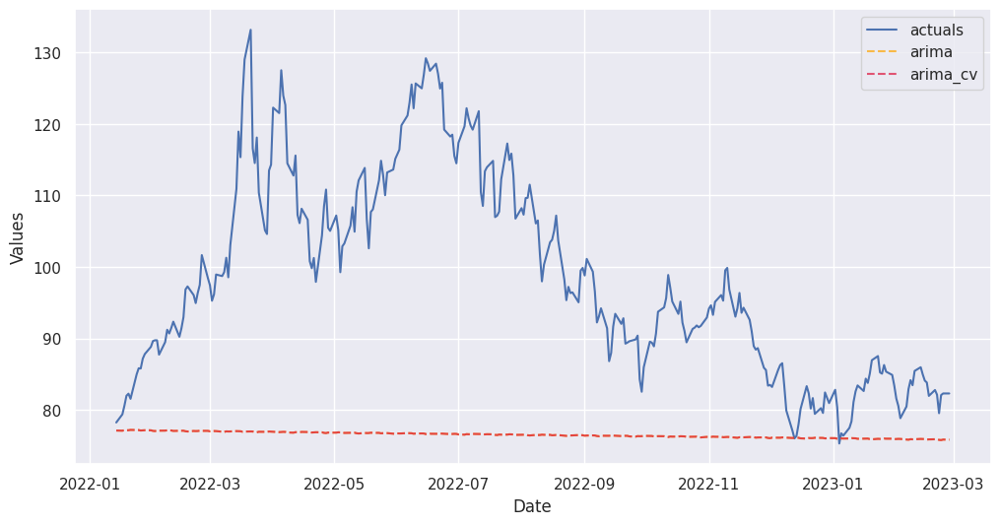

In [ ]:
# plot the cross validated forecast against standard forecast
f_brent.plot_test_set(
    models=[
        "arima",
        "arima_cv",
    ],
    include_train=False,
)
plt.show()

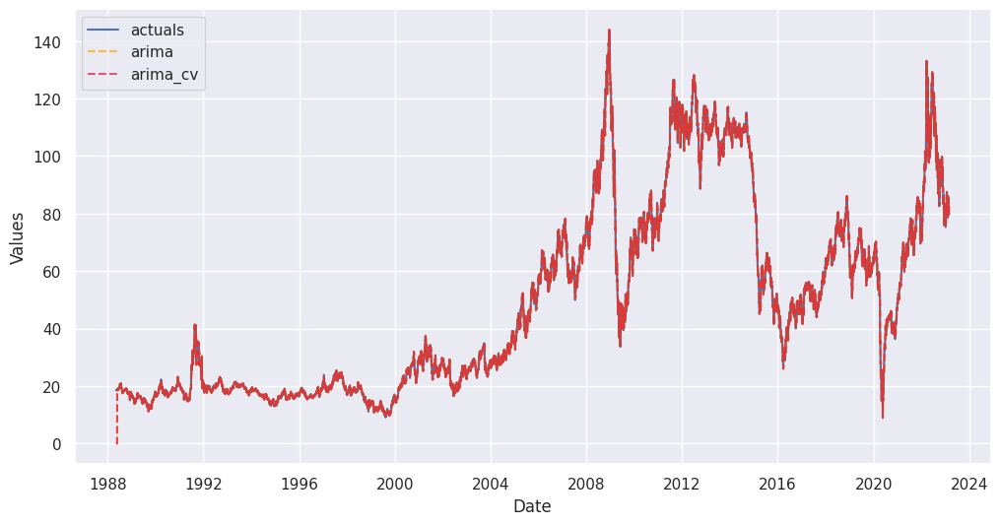

In [ ]:
f_brent.plot_fitted(
    models=[
        "arima",
        "arima_cv",
    ],
)
plt.show()

### Stacking

In [ ]:
# add the auto regressor terms. add the predictions from all the above models as covariates for the stacked models. set the estimator for the stacked model as CATBOOST
f_brent.add_ar_terms(48)
f_brent.add_signals(
    f_brent.history.keys(),
)
f_brent.set_estimator('catboost')
f_brent

Forecaster(
    DateStartActuals=1988-05-09T00:00:00.000000000
    DateEndActuals=2023-02-27T00:00:00.000000000
    Freq=B
    N_actuals=9081
    ForecastLength=292
    Xvars=['cycle6sin', 'cycle6cos', 'cycle9sin', 'cycle9cos', 'cycle12sin', 'cycle12cos', 'cycle15sin', 'cycle15cos', 'cycle18sin', 'cycle18cos', 'cycle21sin', 'cycle21cos', 'cycle24sin', 'cycle24cos', 'cycle27sin', 'cycle27cos', 'cycle30sin', 'cycle30cos', 'cycle33sin', 'cycle33cos', 'cycle36sin', 'cycle36cos', 'cycle39sin', 'cycle39cos', 'cycle42sin', 'cycle42cos', 'cycle45sin', 'cycle45cos', 'cycle48sin', 'cycle48cos', 'cycle51sin', 'cycle51cos', 'cycle54sin', 'cycle54cos', 'cycle57sin', 'cycle57cos', 'cycle60sin', 'cycle60cos', 'cycle63sin', 'cycle63cos', 'cycle66sin', 'cycle66cos', 'cycle69sin', 'cycle69cos', 'cycle72sin', 'cycle72cos', 'cycle75sin', 'cycle75cos', 'cycle78sin', 'cycle78cos', 'cycle81sin', 'cycle81cos', 'cycle84sin', 'cycle84cos', 'cycle87sin', 'cycle87cos', 'cycle90sin', 'cycle90cos', 'cycle93sin', 'c

In [ ]:
# use different variables to pull the stacked forecast - using all the variables, just the regressors with lags and finally anything that is not auto regressor
f_brent.manual_forecast(
    Xvars='all',
    call_me='catboost_all_reg',
    verbose = False,
)
f_brent.save_feature_importance(method = 'shap') # it would be interesting to see the shapley scores (later)
f_brent.manual_forecast(
    Xvars=[x for x in f_brent.get_regressor_names() if x.startswith('AR')],
    call_me = 'catboost_lags_only',
    verbose = False,
)
f_brent.manual_forecast(
    Xvars=[x for x in f_brent.get_regressor_names() if not x.startswith('AR')],
    call_me = 'catboost_signals_only',
    verbose = False,
)

/usr/local/lib/python3.9/dist-packages/scalecast/Forecaster.py:2689: Warning: Cannot set shap feature importance on catboost_all_reg. Here is the error: No module named 'shap'
  warnings.warn(


In [ ]:
results = f_brent.export(determine_best_by='TestSetRMSE')
ms = results['model_summaries']
ms[
    [
        'ModelNickname',
        'TestSetLength',
        'TestSetRMSE',
        'InSampleRMSE',
    ]
]

,ModelNickname,TestSetLength,TestSetRMSE,InSampleRMSE
0,catboost_signals_only,292,2.862140,0.787914
1,catboost_all_reg,292,6.935916,0.751553
2,catboost_lags_only,292,24.416561,0.881299
3,hwes,292,25.394035,1.220708
4,hwes_cv,292,25.394035,1.220708
5,naive,292,25.394035,1.220775
6,arima_cv,292,25.895731,1.395504
7,arima,292,25.895731,1.395504
8,silverkite,292,26.514735,13.084058
9,prophet_cv,292,37.971904,10.101861


In [ ]:
ms.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/scalecast/brent_model_metrics.csv')

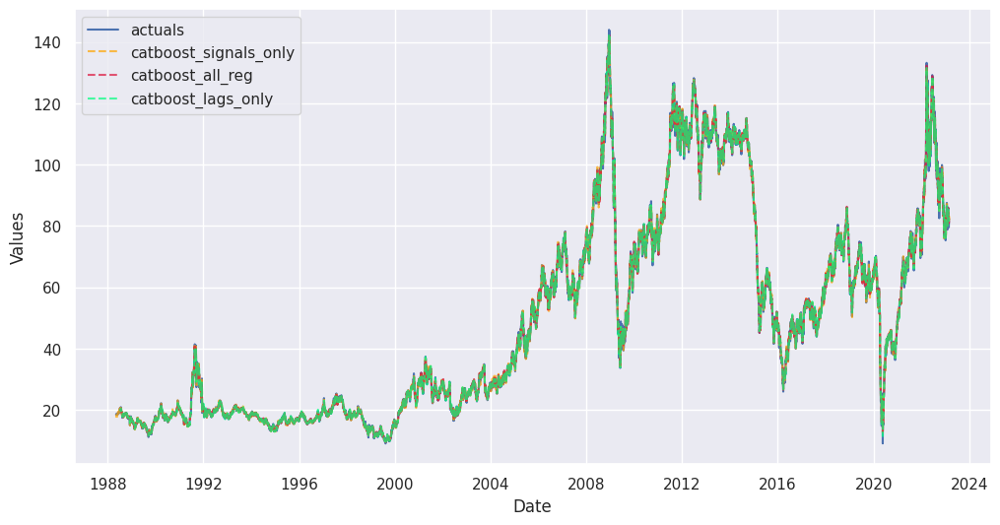

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
f_brent.plot_fitted(
    models = [m for m in f_brent.history if m.startswith('catboost')],
    order_by="TestSetRMSE",
    ax = ax
)
plt.show()

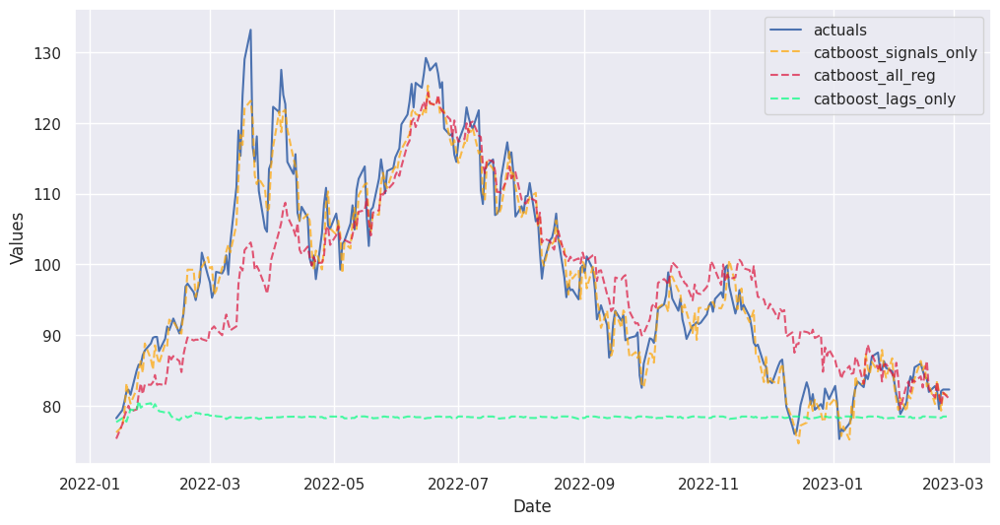

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
f_brent.plot_test_set(
    models = [m for m in f_brent.history if m.startswith('catboost')],
    order_by="TestSetRMSE",
    ax = ax,
    include_train=False,
)
plt.show()

In [ ]:
catboost_brent_stacked_df = brent_y_future.to_frame()

In [ ]:
catboost_brent_stacked_df ['catboost_signals_only'] = f_brent.history['catboost_signals_only']['TestSetPredictions']
catboost_brent_stacked_df ['catboost_all_regressors'] = f_brent.history['catboost_all_reg']['TestSetPredictions']

In [ ]:
catboost_brent_stacked_df.to_csv('/content/drive/MyDrive/PCDS_OilPricePrediction/forecasting_products/scalecast/brent_stacked_predictions.csv')

# Results


**Scale Cast Individual Model(s): EU Brent Data**

•All the models that we have built using the scale cast library to forecast the price of EU Brent data have evaluate to an cross-validation RMSE/ intest RMSE below 32.02 implying that these models perfrom much better than the baseline model. 

•The scalecast library model’s performance is also better than the same models that were built using different library. This might be due to the choice of parameters values leading less efficient model performance. For instance, all the ARMA family models built with seasonal decomposition failed to decrease the cross-validation RMSE/MSE below the baseline model. 

•However, ARIMA model built using the scalecast library evaluated to an in-sample RMSE of  ~1.4 and test-RMSE of 25.89. Also, the ARIMA model built using stasmodel package evaluated to a cross-validation RMSE of 3.19 and 22.9. 
•We found that individual model insample RMSE (cross-validation RMSE) varied from 1.22 to 16.87 for best performing model (Holt winters smoothening) to least performing model (cross validated gradient boosted trees) based on the validation set error metric.  

•We find that except for 4 models, the models with lesser in-sample RMSE also portray lesser test RMSE. 

•The models lightgbm, xgboost, xgboost_cv and gbt are few models that exhibited a lower in sample RMSE but higher test RMSE. This could be due to overfitting and/or model performing better with predicting shorter time span like one month compared to longer time span (one year and tow months). 

•Such mismatch could be attempted to be corrected using parameters to increase the sophistication of the model. 

**Stacking models** 

•The model with only ARIMA signal excluded (catboost_signals_only), performs the best 0.79 validation RMSE and 2.9 forecasting RMSE. The catboost stacking regressor model with signal from all the individual models (catboost_all_reg) performed next best with in-sample RMSE of 0.75 which is slightly lesser than the previous model. However the latter model presents itself with a test-RMSE of twice that of the previous model. 

•This could be due the fact that crude oil price has many non-linear components and other exogenous variables that could be difficult to capture by ARIMA family of models alone leading to signals that do might not be representative of the historical price data.

**Scale-Cast Individual Model(s): Cushing Data**

•It is important to note that all the models built using the scale cast library have evaluated their cross-validation RMSE/insample RMSE below 28.77 indicating that these models are performing much better than the baseline model.

•We observed that all the individual models perform well on the test data set with RMSE ranging between 20.83 to 48.8 for the model with highest being Silverkite while lowest ranked model corresponding to the higher RMSE score being Xgboost built with cross-validation. 

•It is also to be noted that test data RMSE does not compare well with the validation RMSE which ranges between 1.45 to 15.25 for the high performing model (Holt-Winter Smoothening) and low performing model respectively based on the validation error metric.

•This difference could be due to model overfitting and/or model being able to predict better for smaller forecasting horizon (22 days) compared a longer forecasting horizon ( 2 years and 2 months). 

•Improving the model’s performance might be brought about by increasing the sophistication of the individual model through parametric increase and improvement when possible or building an ensemble of such models. 

•Also, we observed similar trend in models that were built using scale-cast library and other library like statsmodel  where the model built with scalecast library (ARIMA) evaluated to a cross-validation RMSE of 3.14 and forecast RMSE of 21.1 compared to ARIMA built with scalecast library with intest RMSE of  1.71 and forecast RMSE of 22.15.

**Stacked Model**


•The model with all signal included, catboost_all_reg,  performs comparable (slightly lower) than the best model i.e. catboost_signals_only,  built using the stacked regressor with ARIMA signals only removed in the test set although the former performs better than the latter model in the validation set.

•This could be due the fact that crude oil price has many non-linear components and other exogenous variables that could be difficult to capture by ARIMA family of models alone leading to signals that do might not be representative of the historical price data. 
